In [1]:
# This code constructs and implements a SEIRS+ driven simulation. The simulation produces the percentage infected, 
# peak percentage hospitalized and fatality rate in office enviroments during a disease outbreak. The simulation is
# tuned to the disease parameters of the current COVID-19 pandemic but can be easily tweaked to study other (fictive)
# diseases and the effect of certain interventions on the percentage infected, peak percentage hospitalized and fatality rate
# in office or other enviroments.

In [2]:
# Import all the necessary packages

from seirsplus.models import *
from seirsplus.networks import *
#from seirsplus.sim_loops import *
from seirsplus.utilities import *
import networkx
import matplotlib.pyplot as pyplot
import seaborn
import pandas as pd
import numpy as np
import os
import math

In [3]:
# Set working directory to location where files are located
os.chdir("C:\\Users\\Quint\\Documents\\Documents\\Master Behavioral Data Science\\MasterThese\\data\\seirsplus_package_thesis\\build\\lib\\seirsplus")

# Import self adapted code of the seirsplus package
# Source code altered to implement 'none' PCR Frequency
from sim_loops_altered import *

In [4]:
# Delete all dataframes
#del values_df
#del combined_df

In [5]:
# Create empty dataframe to store values per condition
values_df = pd.DataFrame(columns=['Network_size','Bubble_size','PCR_frequency','R','Percentage_infected', 
                                  'Peak_Percentage_Hospitalized', "Percentage_Fatality"])


In [6]:
# Create dataframe to store all values of every condition in
combined_df = pd.DataFrame()

In [7]:
# Function to introduce 1 infection per 2 months for net size = 10
# Use same proportion for bigger network sizes
def average_introduction(Network_size):
    if Network_size == 20:
        global introduction
        introduction = 1/60
    elif Network_size == 50:
        introduction = 2.5/60
    elif Network_size == 100:
        introduction = 5/60
    elif Network_size == 250:
        introduction = 12.5/60
    elif Network_size == 500:
        introduction = 25/60
    elif Network_size == 1000:
        introduction = 50/60

In [8]:
# Constructing simulation function
def simulation_covid(Network_size, Bubble_size, PCR_Frequency, R, Itterations):
# Could be nice for future use of the function

# Specify loop for iterations per condition
        for i in range(Itterations):
            
            # Calculate introduction for every itteration
            average_introduction(Network_size)
            
            # Print parameters
            print('Network size =', Network_size)
            print('Bubble size =', Bubble_size)
            print('PCR_frequency =', PCR_Frequency)
            print('R =', R)
        
        
            # Set basic parameters
            NUM_COHORTS              = Network_size//Bubble_size
            NUM_NODES_PER_COHORT     = Bubble_size
            NUM_TEAMS_PER_COHORT     = 1

            MEAN_INTRACOHORT_DEGREE  = round(0.10*Bubble_size)  # was 30
            PCT_CONTACTS_INTERCOHORT = 0.0

            N = NUM_NODES_PER_COHORT*NUM_COHORTS
            # Initial prevalence of the disease in the network
            INIT_EXPOSED = (.10*Network_size)            


            # Farz network
            # alpha = strength of common neighbor's effect on edge formation (tunes transitivity, clustering)
            # gamma = strength of degree similarity effect on edge formation (tunes assortativity)
            # beta = probability of edges formation within communities, rather than between (strength of community structure)
            # r = maximum number of communities each node can belong to
            # q = probability of a node belonging to the multiple communities
            # phi = constant added to all community sizes, higher number makes the communities more balanced in size, 1 results in power law community size distribution
            # epsilon = probability of noisy/random edges
            G_baseline, cohorts, teams = generate_workplace_contact_network(
                                             num_cohorts=NUM_COHORTS, num_nodes_per_cohort=NUM_NODES_PER_COHORT,
                                             num_teams_per_cohort=NUM_TEAMS_PER_COHORT,
                                             mean_intracohort_degree=MEAN_INTRACOHORT_DEGREE,
                                             pct_contacts_intercohort=PCT_CONTACTS_INTERCOHORT,
                                             farz_params={'alpha':5.0, 'gamma':5.0, 'beta':0.5, 'r':1, 'q':0.0, 'phi':10,
                                                          'b':0, 'epsilon':1e-6, 'directed': False, 'weighted': False})

            network_info(G_baseline, "Baseline", plot=True)

            # Here we define quarantine contact network to be an empty one (no connections)
            G_quarantine = networkx.classes.function.create_empty_copy(G_baseline)

            # Here we generate distributions of values for each parameter, thus specifying a realistic hetereogeneous population
            # For the latent period
            latentPeriod_mean, latentPeriod_coeffvar = 2.5, 0.6
            SIGMA   = 1 / gamma_dist(latentPeriod_mean, latentPeriod_coeffvar, N)
            # For the pre-symptomatic period
            presymptomaticPeriod_mean, presymptomaticPeriod_coeffvar = 3.5, 0.6
            LAMDA   = 1 / gamma_dist(presymptomaticPeriod_mean, presymptomaticPeriod_coeffvar, N)
            # Make the plot where latent period, pre-symptomatic period & total incubation period are shown
            dist_info([1/LAMDA, 1/SIGMA, 1/LAMDA+1/SIGMA], ["latent period", "pre-symptomatic period", "total incubation period"],
                      plot=True, colors=['gold', 'darkorange', 'black'], reverse_plot=True)


            # Here we generate distributions expected (a)symptomatic periods (time in symptomatic or asymptomatic state).
            symptomaticPeriod_mean, symptomaticPeriod_coeffvar = 6.5, 0.4
            GAMMA   = 1 / gamma_dist(symptomaticPeriod_mean, symptomaticPeriod_coeffvar, N)
            # The expected total infectious period for each individual is the sum of their expected pre-symptomatic and 
            # (a)symptomatic periods.
            # Specify infectious period
            infectiousPeriod = 1/LAMDA + 1/GAMMA
            # Make the plot
            dist_info([1/LAMDA, 1/GAMMA, 1/LAMDA+1/GAMMA], ["pre-symptomatic period", "(a)symptomatic period", "total infectious period"],
                      plot=True, colors=['darkorange', 'crimson', 'black'], reverse_plot=True)



            # Generate distribution of expected onset to hospitalization periods
            onsetToHospitalizationPeriod_mean, onsetToHospitalizationPeriod_coeffvar = 8.0, 0.45
            ETA     = 1 / gamma_dist(onsetToHospitalizationPeriod_mean, onsetToHospitalizationPeriod_coeffvar, N)
            # Hospitalization discharge
            hospitalizationToDischargePeriod_mean, hospitalizationToDischargePeriod_coeffvar = 14.0, 0.45
            GAMMA_H = 1 / gamma_dist(hospitalizationToDischargePeriod_mean, hospitalizationToDischargePeriod_coeffvar, N)
            # Plot
            dist_info([1/ETA, 1/GAMMA_H, 1/ETA+1/GAMMA_H], ["onset-to-hospitalization period", "hospitalization-to-discharge period", "onset-to-discharge period"],
                      plot=True, colors=['crimson', 'violet', 'black'], reverse_plot=True)

            # Generate distribution of hospitalization to death
            hospitalizationToDeathPeriod_mean, hospitalizationToDeathPeriod_coeffvar = 7.0, 0.45
            MU_H    = 1 / gamma_dist(hospitalizationToDeathPeriod_mean, hospitalizationToDeathPeriod_coeffvar, N)
            # Plot
            dist_info([1/ETA, 1/MU_H, 1/ETA+1/MU_H], ["onset-to-hospitalization period", "hospitalization-to-death period", "onset-to-death period"],
                      plot=True, colors=['crimson', 'darkgray', 'black'], reverse_plot=True)

            # Severity parameters
            # This percentage of case will progress from the pre-symptomatic state to the asymptomatic state, 
            # rather than to the symptomatic state.
            PCT_ASYMPTOMATIC = 0.308     
            # Hospitalization rate
            PCT_HOSPITALIZED = 0.043
            # Fatality rate for hospitalizations
            PCT_FATALITY = 0.05

            # Transmission parameters
            # Mean expected number of new infections by a single infectious individual
            R0_mean     = R
            # How much the mean varies, low is not much variance
            R0_coeffvar = 0.2
            # Expected number of new infections by a single infectious individual
            R0 = gamma_dist(R0_mean, R0_coeffvar, N)
            # Plot
            dist_info(R0, "Individual R0", bin_size=0.1, plot=True, colors='crimson')

            # Individuals get an Individual Tranmitability Parameter stored in BETA
            BETA = 1/infectiousPeriod * R0

            # 40% of interactions being with incidental or casual contacts outside their set of close contacts(Co-workers)
            P_GLOBALINTXN = 0.4

            # Testing, Tracing & Isolation intervention protocal measures
            INTERVENTION_START_PCT_INFECTED = 0/100
            
            # Expected number of new exogenous exposures per day
            AVERAGE_INTRODUCTIONS_PER_DAY   = introduction  #(0.00026470588*Network_size)       

            # How often to do testing (other than self-reporting symptomatics who can get tested any day)
            TESTING_CADENCE                 = PCR_Frequency 
            
            # Max daily test allotment defined as a percent of population size
            PCT_TESTED_PER_DAY              = 1.0         
            
            # Test false negative rate, will use FN rate that varies with disease time
            TEST_FALSENEG_RATE              = 'temporal'   
            
             # Max percent of daily test allotment to use on self-reporting symptomatics
            MAX_PCT_TESTS_FOR_SYMPTOMATICS  = 1.0         
            
            # Max percent of daily test allotment to use on contact traces
            MAX_PCT_TESTS_FOR_TRACES        = 0.0           
            
            # Magnitude of degree bias in random selections for testing, none here
            RANDOM_TESTING_DEGREE_BIAS      = 0             

             # Percentage of primary cases' contacts that are traced
            PCT_CONTACTS_TO_TRACE           = 0.0           
            
            # Number of cadence testing days between primary tests and tracing tests
            TRACING_LAG                     = 2             

            
            # Number of days between onset of symptoms and self-isolation of symptomatics
            ISOLATION_LAG_SYMPTOMATIC       = 2             
            
            # Test turn-around time (TAT): number of days between administration of test and isolation of positive cases
            ISOLATION_LAG_POSITIVE          = 1             
            
            # Number of days between a contact being traced and that contact self-isolating
            ISOLATION_LAG_CONTACT           = 0             

            # Intervention compliance parameters
            TESTING_COMPLIANCE_RATE_SYMPTOMATIC                  = 0.75
            TESTING_COMPLIANCE_RATE_TRACED                       = 0.0
            
            # Assume employee testing is mandatory, so 100% compliance
            TESTING_COMPLIANCE_RATE_RANDOM                       = 1.0  
            TRACING_COMPLIANCE_RATE                              = 0.0
            ISOLATION_COMPLIANCE_RATE_SYMPTOMATIC_INDIVIDUAL     = 0.0
            ISOLATION_COMPLIANCE_RATE_SYMPTOMATIC_GROUPMATE      = 0.0
            ISOLATION_COMPLIANCE_RATE_POSITIVE_INDIVIDUAL        = 1.0
            ISOLATION_COMPLIANCE_RATE_POSITIVE_GROUPMATE         = 0.0
            
            # 100% of those who have been in contact with an infected person, will go in isolation
            ISOLATION_COMPLIANCE_RATE_POSITIVE_CONTACT           = 1.0 
            ISOLATION_COMPLIANCE_RATE_POSITIVE_CONTACTGROUPMATE  = 0.0

            # Now we randomly assign true/false compliance to each individual according to the rates above. 
            # True will participate, False will not
            TESTING_COMPLIANCE_RANDOM                        = (numpy.random.rand(N) < TESTING_COMPLIANCE_RATE_RANDOM)
            TESTING_COMPLIANCE_TRACED                        = (numpy.random.rand(N) < TESTING_COMPLIANCE_RATE_TRACED)
            TESTING_COMPLIANCE_SYMPTOMATIC                   = (numpy.random.rand(N) < TESTING_COMPLIANCE_RATE_SYMPTOMATIC)

            TRACING_COMPLIANCE                               = (numpy.random.rand(N) < TRACING_COMPLIANCE_RATE)

            ISOLATION_COMPLIANCE_SYMPTOMATIC_INDIVIDUAL      = (numpy.random.rand(N) < ISOLATION_COMPLIANCE_RATE_SYMPTOMATIC_INDIVIDUAL)
            ISOLATION_COMPLIANCE_SYMPTOMATIC_GROUPMATE       = (numpy.random.rand(N) < ISOLATION_COMPLIANCE_RATE_SYMPTOMATIC_GROUPMATE)
            ISOLATION_COMPLIANCE_POSITIVE_INDIVIDUAL         = (numpy.random.rand(N) < ISOLATION_COMPLIANCE_RATE_POSITIVE_INDIVIDUAL)
            ISOLATION_COMPLIANCE_POSITIVE_GROUPMATE          = (numpy.random.rand(N) < ISOLATION_COMPLIANCE_RATE_POSITIVE_GROUPMATE)
            ISOLATION_COMPLIANCE_POSITIVE_CONTACT            = (numpy.random.rand(N) < ISOLATION_COMPLIANCE_RATE_POSITIVE_CONTACT)
            ISOLATION_COMPLIANCE_POSITIVE_CONTACTGROUPMATE   = (numpy.random.rand(N) < ISOLATION_COMPLIANCE_RATE_POSITIVE_CONTACTGROUPMATE)

            # Making the model
            model = ExtSEIRSNetworkModel(G=G_baseline, p=P_GLOBALINTXN,
                                          beta=BETA, sigma=SIGMA, lamda=LAMDA, gamma=GAMMA,
                                          gamma_asym=GAMMA, eta=ETA, gamma_H=GAMMA_H, mu_H=MU_H,
                                          a=PCT_ASYMPTOMATIC, h=PCT_HOSPITALIZED, f=PCT_FATALITY,
                                          G_Q=G_quarantine, isolation_time=14,
                                          initE=INIT_EXPOSED)
            
             #Max simulation time to 100 days
            T = 100

            # Execute the TTI simulatiom
            run_tti_sim(model, T,
                        intervention_start_pct_infected=INTERVENTION_START_PCT_INFECTED, average_introductions_per_day=AVERAGE_INTRODUCTIONS_PER_DAY,
                        testing_cadence=TESTING_CADENCE, pct_tested_per_day=PCT_TESTED_PER_DAY, test_falseneg_rate=TEST_FALSENEG_RATE,
                        testing_compliance_symptomatic=TESTING_COMPLIANCE_SYMPTOMATIC, max_pct_tests_for_symptomatics=MAX_PCT_TESTS_FOR_SYMPTOMATICS,
                        testing_compliance_traced=TESTING_COMPLIANCE_TRACED, max_pct_tests_for_traces=MAX_PCT_TESTS_FOR_TRACES,
                        testing_compliance_random=TESTING_COMPLIANCE_RANDOM, random_testing_degree_bias=RANDOM_TESTING_DEGREE_BIAS,
                        tracing_compliance=TRACING_COMPLIANCE, pct_contacts_to_trace=PCT_CONTACTS_TO_TRACE, tracing_lag=TRACING_LAG,
                        isolation_compliance_symptomatic_individual=ISOLATION_COMPLIANCE_SYMPTOMATIC_INDIVIDUAL, isolation_compliance_symptomatic_groupmate=ISOLATION_COMPLIANCE_SYMPTOMATIC_GROUPMATE,
                        isolation_compliance_positive_individual=ISOLATION_COMPLIANCE_POSITIVE_INDIVIDUAL, isolation_compliance_positive_groupmate=ISOLATION_COMPLIANCE_POSITIVE_GROUPMATE,
                        isolation_compliance_positive_contact=ISOLATION_COMPLIANCE_POSITIVE_CONTACT, isolation_compliance_positive_contactgroupmate=ISOLATION_COMPLIANCE_POSITIVE_CONTACTGROUPMATE,
                        isolation_lag_symptomatic=ISOLATION_LAG_SYMPTOMATIC, isolation_lag_positive=ISOLATION_LAG_POSITIVE,
                        isolation_groups=list(teams.values()))
            
            
            # Test for calculating percentage
            percentages = ((model.total_num_infected()[-1]+model.total_num_recovered()[-1])/model.numNodes * 100) 
            # Total percent fatality: 
            fatality = (model.numF[-1]/model.numNodes * 100)
            # Peak  pct hospitalized: 
            hospitalized = (numpy.max(model.numH)/model.numNodes * 100)

            # Store values of itteration in temporary dataframe
            values_df.loc[i, ['Network_size']] = NUM_COHORTS*NUM_NODES_PER_COHORT
            values_df.loc[i, ['Bubble_size']] = Bubble_size
            values_df.loc[i, ['PCR_frequency']] = PCR_Frequency
            values_df.loc[i, ['R']] = R
            values_df.loc[i, ['Percentage_infected']] = percentages
            values_df.loc[i, ['Peak_Percentage_Hospitalized']] = hospitalized
            values_df.loc[i, ["Percentage_Fatality"]] = fatality
                        
            #Show results
            results_summary(model)
            
            # Print to indicate next iteration is starting
            print('-----------------------------------------------------')

            # Store temporary values in combined dataframe
            global combined_df
            combined_df = combined_df.append(values_df, True)

        

        



Network size = 20
Bubble size = 5
PCR_frequency = workday
R = 1
Baseline:
Degree: mean = 0.30, std = 0.56, 95% CI = (0.00, 1.52)
        coeff var = 1.86
Assortativity:    -0.50
Clustering coeff: 0.00



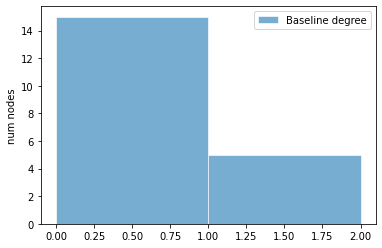

latent period:  mean = 3.87, std = 1.86, 95% CI = (1.13, 7.32)

pre-symptomatic period:  mean = 2.05, std = 1.21, 95% CI = (0.67, 5.14)

total incubation period:  mean = 5.92, std = 2.11, 95% CI = (2.06, 9.23)



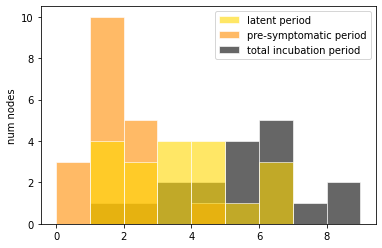

pre-symptomatic period:  mean = 3.87, std = 1.86, 95% CI = (1.13, 7.32)

(a)symptomatic period:  mean = 7.21, std = 2.35, 95% CI = (3.86, 11.52)

total infectious period:  mean = 11.08, std = 3.11, 95% CI = (5.43, 16.58)



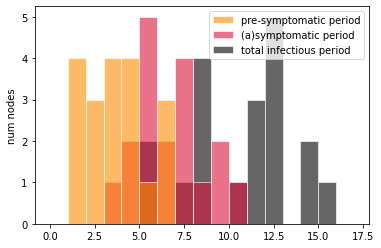

onset-to-hospitalization period:  mean = 9.11, std = 5.26, 95% CI = (3.04, 22.57)

hospitalization-to-discharge period:  mean = 14.61, std = 5.87, 95% CI = (6.96, 26.15)

onset-to-discharge period:  mean = 23.72, std = 6.17, 95% CI = (14.82, 34.08)



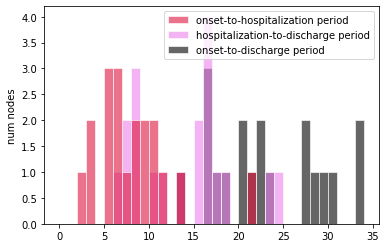

onset-to-hospitalization period:  mean = 9.11, std = 5.26, 95% CI = (3.04, 22.57)

hospitalization-to-death period:  mean = 7.94, std = 3.79, 95% CI = (2.89, 16.30)

onset-to-death period:  mean = 17.05, std = 6.69, 95% CI = (8.12, 31.18)



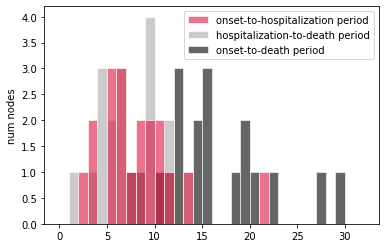

Individual R0:  mean = 0.97, std = 0.20, 95% CI = (0.75, 1.37)



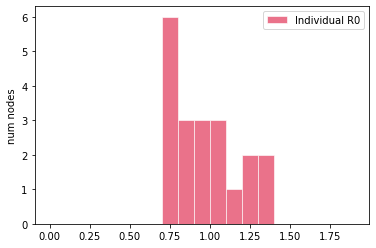

[INTERVENTIONS @ t = 0.02 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.69 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	19	tested randomly         [+ 0 positive (0.00 %) +]
	19	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

c:\users\quint\pycharmprojects\pythonproject1\venv\lib\site-packages\seirsplus\models.py:2142: RuntimeWarning: invalid value encountered in true_divide
  self.delta_Q             = numpy.log(self.degree_Q)/numpy.log(numpy.mean(self.degree_Q)) if self.parameters['delta_Q'] is None else numpy.array(self.parameters['delta_Q']) if isinstance(self.parameters['delta_Q'], (list, numpy.ndarray)) else numpy.full(fill_value=self.parameters['delta_Q'], shape=(self.numNodes,1))


[INTERVENTIONS @ t = 9.00 (0 (0.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	18	tested randomly         [+ 0 positive (0.00 %) +]
	18	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 10.00 (0 (0.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	18	tested randomly         [+ 0 positive (0.00 %) +]
	18	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVEN

c:\users\quint\pycharmprojects\pythonproject1\venv\lib\site-packages\networkx\algorithms\assortativity\correlation.py:287: RuntimeWarning: invalid value encountered in double_scalars
  return (xy * (M - ab)).sum() / numpy.sqrt(vara * varb)


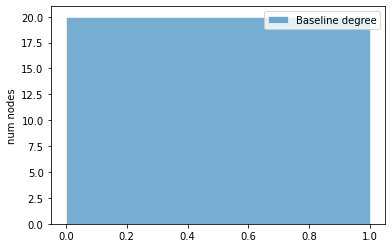

latent period:  mean = 3.73, std = 2.35, 95% CI = (0.99, 8.75)

pre-symptomatic period:  mean = 3.37, std = 1.99, 95% CI = (0.65, 6.86)

total incubation period:  mean = 7.10, std = 3.15, 95% CI = (2.68, 13.22)



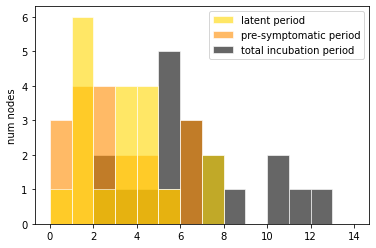

pre-symptomatic period:  mean = 3.73, std = 2.35, 95% CI = (0.99, 8.75)

(a)symptomatic period:  mean = 6.02, std = 2.21, 95% CI = (2.81, 11.15)

total infectious period:  mean = 9.74, std = 3.57, 95% CI = (6.30, 17.23)



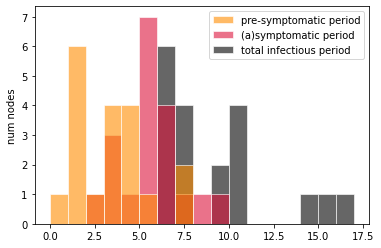

onset-to-hospitalization period:  mean = 8.16, std = 3.83, 95% CI = (4.18, 17.20)

hospitalization-to-discharge period:  mean = 13.91, std = 7.27, 95% CI = (4.87, 27.72)

onset-to-discharge period:  mean = 22.07, std = 9.13, 95% CI = (12.11, 42.85)



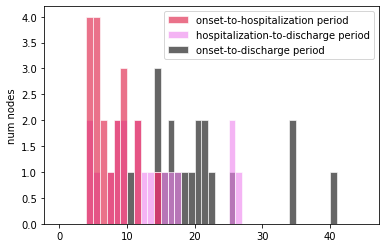

onset-to-hospitalization period:  mean = 8.16, std = 3.83, 95% CI = (4.18, 17.20)

hospitalization-to-death period:  mean = 6.74, std = 2.48, 95% CI = (2.71, 10.83)

onset-to-death period:  mean = 14.90, std = 4.08, 95% CI = (9.06, 22.62)



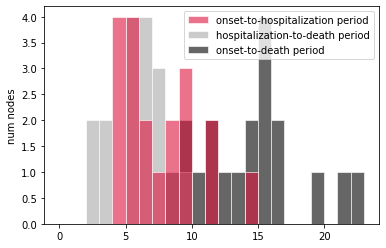

Individual R0:  mean = 0.97, std = 0.14, 95% CI = (0.77, 1.25)



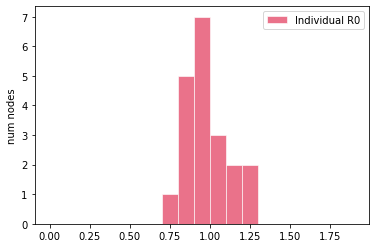

[INTERVENTIONS @ t = 0.97 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.07 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	19	tested randomly         [+ 1 positive (5.26 %) +]
	19	tested TOTAL            [+ 1 positive (5.26 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

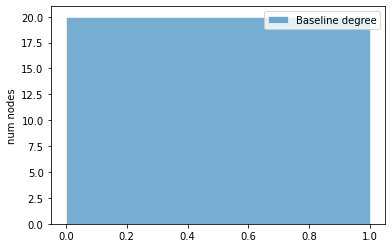

latent period:  mean = 3.66, std = 2.26, 95% CI = (1.04, 9.15)

pre-symptomatic period:  mean = 2.26, std = 1.41, 95% CI = (0.53, 4.79)

total incubation period:  mean = 5.91, std = 2.85, 95% CI = (2.15, 11.98)



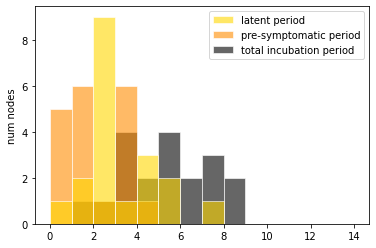

pre-symptomatic period:  mean = 3.66, std = 2.26, 95% CI = (1.04, 9.15)

(a)symptomatic period:  mean = 6.31, std = 2.21, 95% CI = (3.15, 10.32)

total infectious period:  mean = 9.97, std = 3.26, 95% CI = (5.57, 17.33)



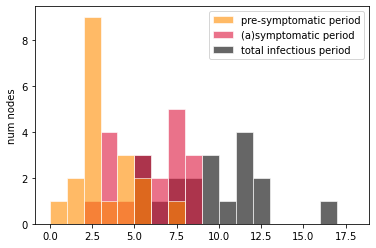

onset-to-hospitalization period:  mean = 7.04, std = 3.21, 95% CI = (2.02, 13.78)

hospitalization-to-discharge period:  mean = 14.07, std = 5.82, 95% CI = (6.91, 24.78)

onset-to-discharge period:  mean = 21.10, std = 5.85, 95% CI = (13.78, 32.22)



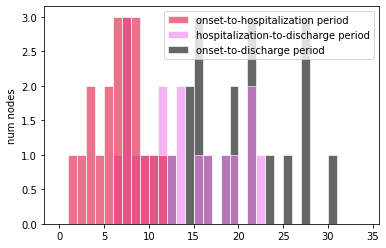

onset-to-hospitalization period:  mean = 7.04, std = 3.21, 95% CI = (2.02, 13.78)

hospitalization-to-death period:  mean = 6.22, std = 2.09, 95% CI = (3.16, 10.57)

onset-to-death period:  mean = 13.26, std = 3.95, 95% CI = (7.86, 21.39)



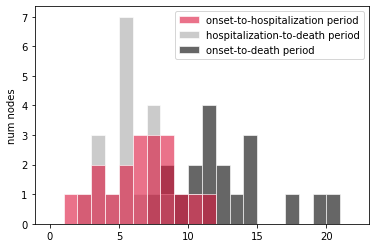

Individual R0:  mean = 0.96, std = 0.13, 95% CI = (0.74, 1.17)



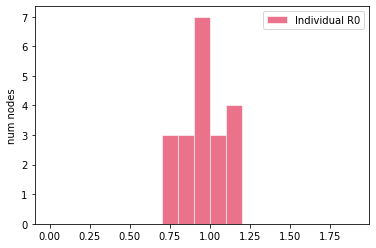

[INTERVENTIONS @ t = 0.01 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 4.54 (2 (10.00%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	19	tested randomly         [+ 1 positive (5.26 %) +]
	20	tested TOTAL            [+ 2 positive (10.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	2 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTE

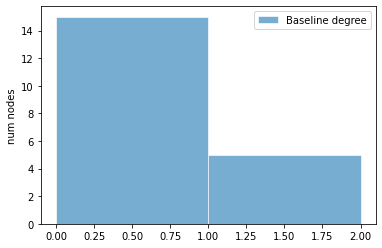

latent period:  mean = 3.32, std = 1.72, 95% CI = (1.28, 6.64)

pre-symptomatic period:  mean = 2.43, std = 1.10, 95% CI = (0.59, 4.14)

total incubation period:  mean = 5.74, std = 2.04, 95% CI = (2.85, 9.98)



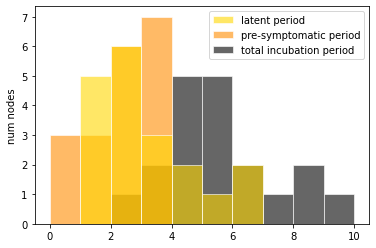

pre-symptomatic period:  mean = 3.32, std = 1.72, 95% CI = (1.28, 6.64)

(a)symptomatic period:  mean = 6.24, std = 2.38, 95% CI = (2.84, 11.03)

total infectious period:  mean = 9.55, std = 2.32, 95% CI = (5.83, 13.56)



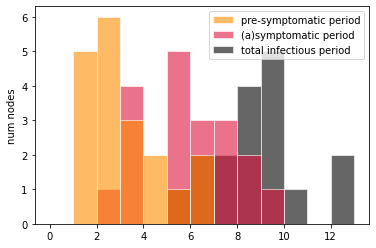

onset-to-hospitalization period:  mean = 8.39, std = 3.21, 95% CI = (3.70, 14.16)

hospitalization-to-discharge period:  mean = 16.79, std = 7.47, 95% CI = (5.56, 33.39)

onset-to-discharge period:  mean = 25.17, std = 8.63, 95% CI = (12.67, 45.83)



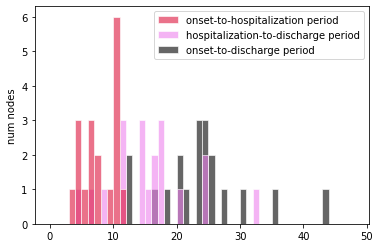

onset-to-hospitalization period:  mean = 8.39, std = 3.21, 95% CI = (3.70, 14.16)

hospitalization-to-death period:  mean = 6.13, std = 2.68, 95% CI = (2.26, 11.99)

onset-to-death period:  mean = 14.52, std = 4.61, 95% CI = (7.42, 24.25)



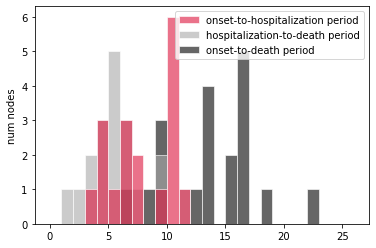

Individual R0:  mean = 0.98, std = 0.18, 95% CI = (0.67, 1.27)



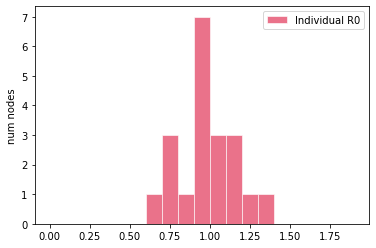

[INTERVENTIONS @ t = 0.16 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.27 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	19	tested randomly         [+ 0 positive (0.00 %) +]
	19	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

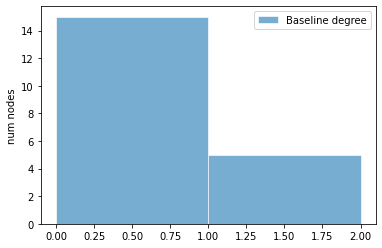

latent period:  mean = 3.94, std = 2.72, 95% CI = (0.70, 10.44)

pre-symptomatic period:  mean = 2.54, std = 1.53, 95% CI = (0.60, 5.85)

total incubation period:  mean = 6.49, std = 3.09, 95% CI = (2.21, 12.20)



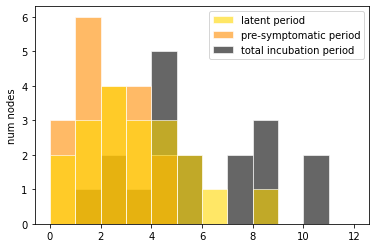

pre-symptomatic period:  mean = 3.94, std = 2.72, 95% CI = (0.70, 10.44)

(a)symptomatic period:  mean = 6.00, std = 1.63, 95% CI = (3.26, 8.52)

total infectious period:  mean = 9.94, std = 2.90, 95% CI = (5.28, 15.05)



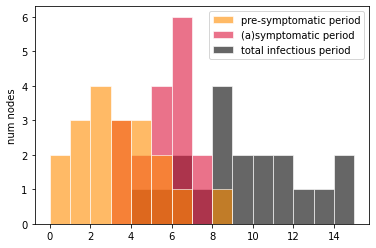

onset-to-hospitalization period:  mean = 7.96, std = 2.82, 95% CI = (3.42, 12.81)

hospitalization-to-discharge period:  mean = 12.71, std = 5.32, 95% CI = (4.94, 22.96)

onset-to-discharge period:  mean = 20.66, std = 4.62, 95% CI = (13.44, 28.07)



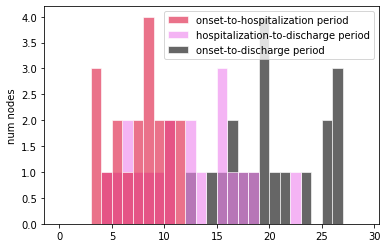

onset-to-hospitalization period:  mean = 7.96, std = 2.82, 95% CI = (3.42, 12.81)

hospitalization-to-death period:  mean = 8.07, std = 3.34, 95% CI = (4.04, 14.27)

onset-to-death period:  mean = 16.03, std = 3.14, 95% CI = (11.60, 21.80)



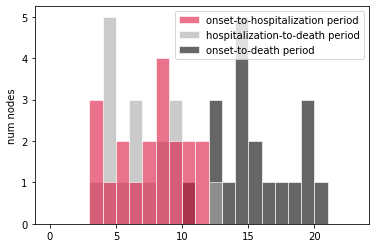

Individual R0:  mean = 1.00, std = 0.18, 95% CI = (0.72, 1.31)



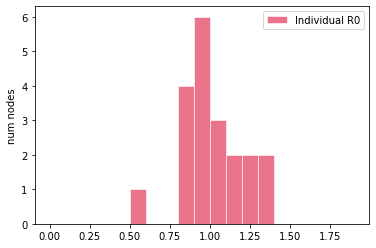

[INTERVENTIONS @ t = 0.27 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 3.59 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	19	tested randomly         [+ 1 positive (5.26 %) +]
	19	tested TOTAL            [+ 1 positive (5.26 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

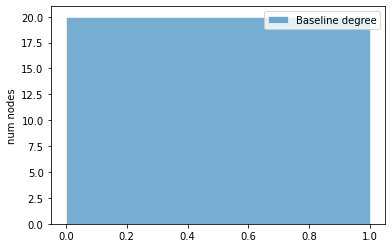

latent period:  mean = 3.31, std = 2.03, 95% CI = (0.57, 6.91)

pre-symptomatic period:  mean = 2.20, std = 1.03, 95% CI = (0.91, 4.02)

total incubation period:  mean = 5.52, std = 2.41, 95% CI = (2.04, 9.67)



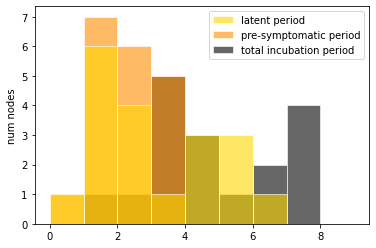

pre-symptomatic period:  mean = 3.31, std = 2.03, 95% CI = (0.57, 6.91)

(a)symptomatic period:  mean = 6.54, std = 1.91, 95% CI = (3.21, 9.49)

total infectious period:  mean = 9.86, std = 2.68, 95% CI = (5.60, 15.14)



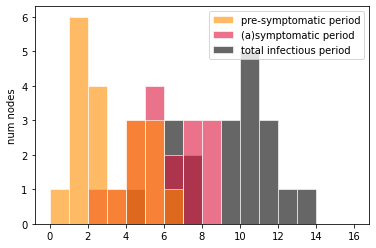

onset-to-hospitalization period:  mean = 8.18, std = 3.77, 95% CI = (4.15, 15.79)

hospitalization-to-discharge period:  mean = 14.82, std = 7.23, 95% CI = (2.99, 25.97)

onset-to-discharge period:  mean = 23.00, std = 8.47, 95% CI = (8.70, 36.71)



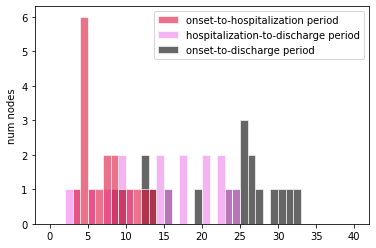

onset-to-hospitalization period:  mean = 8.18, std = 3.77, 95% CI = (4.15, 15.79)

hospitalization-to-death period:  mean = 6.92, std = 3.95, 95% CI = (2.14, 15.25)

onset-to-death period:  mean = 15.10, std = 5.26, 95% CI = (7.59, 25.61)



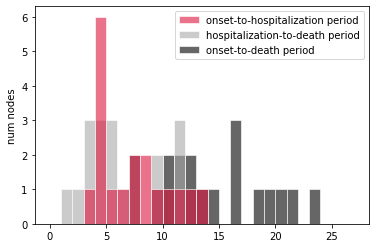

Individual R0:  mean = 1.02, std = 0.18, 95% CI = (0.71, 1.27)



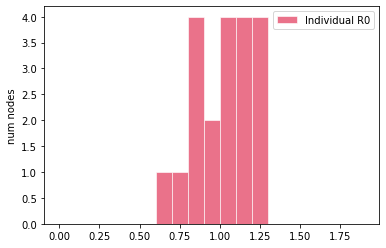

[INTERVENTIONS @ t = 0.81 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 0 positive (0.00 %) +]
	20	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.20 (2 (10.00%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	19	tested randomly         [+ 1 positive (5.26 %) +]
	20	tested TOTAL            [+ 2 positive (10.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	2 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTE

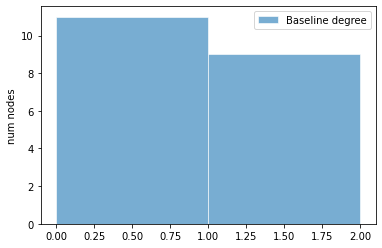

latent period:  mean = 3.49, std = 1.31, 95% CI = (1.39, 6.18)

pre-symptomatic period:  mean = 2.65, std = 1.84, 95% CI = (0.65, 7.01)

total incubation period:  mean = 6.14, std = 2.02, 95% CI = (3.44, 10.10)



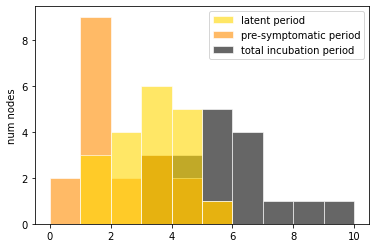

pre-symptomatic period:  mean = 3.49, std = 1.31, 95% CI = (1.39, 6.18)

(a)symptomatic period:  mean = 6.38, std = 2.22, 95% CI = (3.18, 10.36)

total infectious period:  mean = 9.87, std = 3.07, 95% CI = (4.87, 15.51)



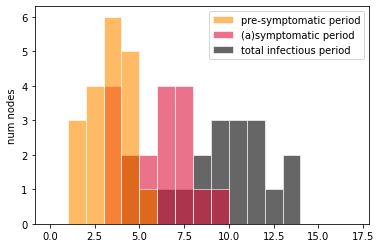

onset-to-hospitalization period:  mean = 7.85, std = 4.00, 95% CI = (3.21, 17.21)

hospitalization-to-discharge period:  mean = 14.86, std = 7.90, 95% CI = (4.90, 32.75)

onset-to-discharge period:  mean = 22.71, std = 8.70, 95% CI = (12.33, 43.03)



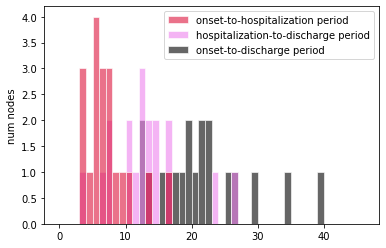

onset-to-hospitalization period:  mean = 7.85, std = 4.00, 95% CI = (3.21, 17.21)

hospitalization-to-death period:  mean = 6.42, std = 2.73, 95% CI = (2.63, 11.41)

onset-to-death period:  mean = 14.27, std = 4.80, 95% CI = (6.78, 22.44)



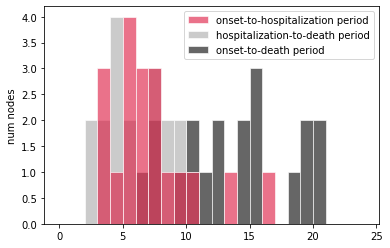

Individual R0:  mean = 1.02, std = 0.14, 95% CI = (0.80, 1.30)



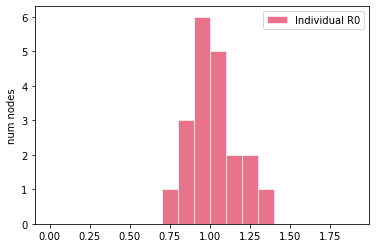

[INTERVENTIONS @ t = 0.07 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.55 (3 (15.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	19	tested randomly         [+ 0 positive (0.00 %) +]
	19	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

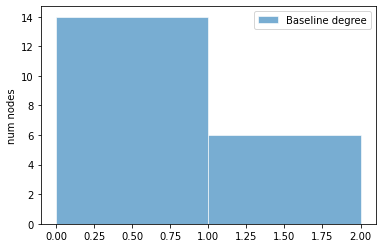

latent period:  mean = 4.48, std = 2.23, 95% CI = (1.28, 8.67)

pre-symptomatic period:  mean = 2.36, std = 2.01, 95% CI = (0.37, 7.01)

total incubation period:  mean = 6.84, std = 2.99, 95% CI = (1.75, 10.64)



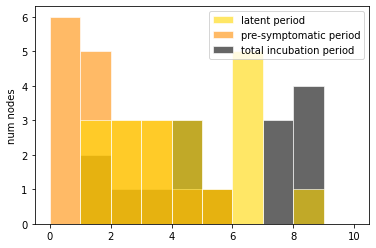

pre-symptomatic period:  mean = 4.48, std = 2.23, 95% CI = (1.28, 8.67)

(a)symptomatic period:  mean = 5.57, std = 2.09, 95% CI = (2.87, 10.55)

total infectious period:  mean = 10.05, std = 2.70, 95% CI = (6.69, 15.58)



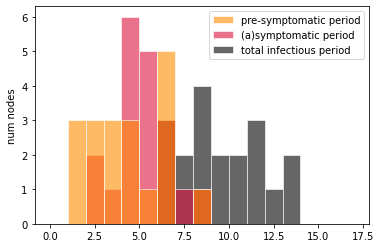

onset-to-hospitalization period:  mean = 7.64, std = 3.51, 95% CI = (2.92, 13.85)

hospitalization-to-discharge period:  mean = 14.15, std = 6.01, 95% CI = (5.75, 26.37)

onset-to-discharge period:  mean = 21.79, std = 7.10, 95% CI = (11.24, 35.72)



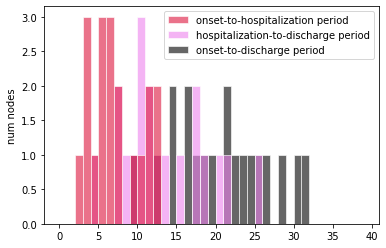

onset-to-hospitalization period:  mean = 7.64, std = 3.51, 95% CI = (2.92, 13.85)

hospitalization-to-death period:  mean = 6.63, std = 2.62, 95% CI = (2.77, 11.58)

onset-to-death period:  mean = 14.27, std = 4.48, 95% CI = (7.52, 22.28)



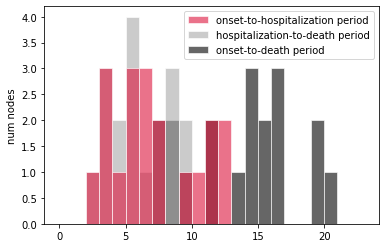

Individual R0:  mean = 1.02, std = 0.22, 95% CI = (0.76, 1.41)



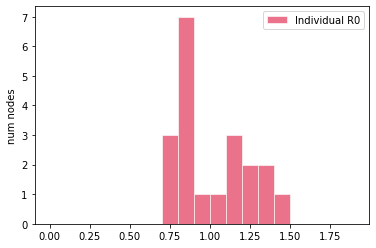

[INTERVENTIONS @ t = 0.33 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.65 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	19	tested randomly         [+ 0 positive (0.00 %) +]
	19	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

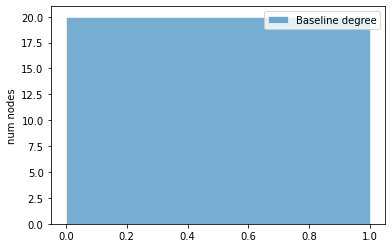

latent period:  mean = 3.66, std = 2.18, 95% CI = (1.16, 8.01)

pre-symptomatic period:  mean = 2.72, std = 1.36, 95% CI = (0.78, 5.88)

total incubation period:  mean = 6.38, std = 2.73, 95% CI = (2.95, 12.26)



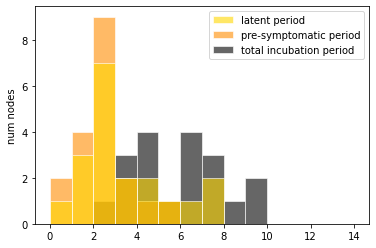

pre-symptomatic period:  mean = 3.66, std = 2.18, 95% CI = (1.16, 8.01)

(a)symptomatic period:  mean = 6.57, std = 1.77, 95% CI = (4.30, 10.26)

total infectious period:  mean = 10.23, std = 3.30, 95% CI = (5.75, 16.93)



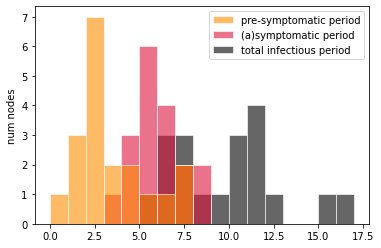

onset-to-hospitalization period:  mean = 7.79, std = 2.59, 95% CI = (2.59, 11.42)

hospitalization-to-discharge period:  mean = 13.05, std = 6.95, 95% CI = (3.47, 25.86)

onset-to-discharge period:  mean = 20.84, std = 6.94, 95% CI = (12.01, 34.58)



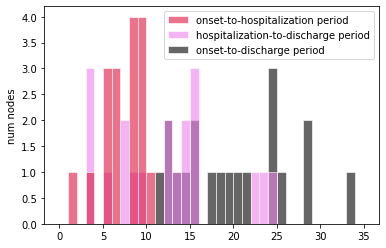

onset-to-hospitalization period:  mean = 7.79, std = 2.59, 95% CI = (2.59, 11.42)

hospitalization-to-death period:  mean = 7.58, std = 2.96, 95% CI = (3.49, 13.46)

onset-to-death period:  mean = 15.37, std = 4.10, 95% CI = (8.17, 23.06)



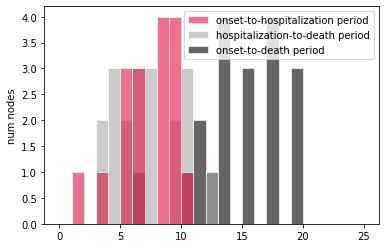

Individual R0:  mean = 1.02, std = 0.17, 95% CI = (0.76, 1.32)



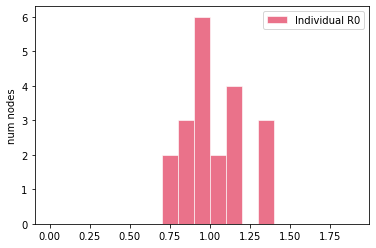

[INTERVENTIONS @ t = 1.59 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 3.11 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	19	tested randomly         [+ 1 positive (5.26 %) +]
	19	tested TOTAL            [+ 1 positive (5.26 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

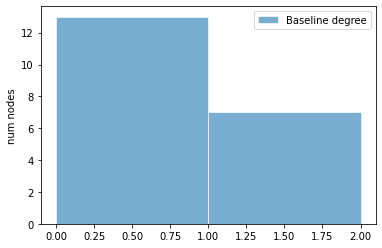

latent period:  mean = 3.02, std = 1.56, 95% CI = (0.77, 5.56)

pre-symptomatic period:  mean = 2.78, std = 1.47, 95% CI = (0.73, 5.75)

total incubation period:  mean = 5.80, std = 2.21, 95% CI = (1.80, 9.40)



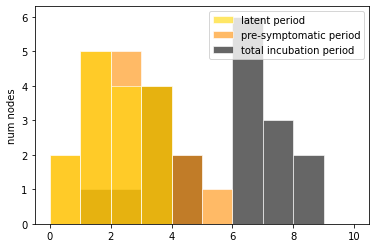

pre-symptomatic period:  mean = 3.02, std = 1.56, 95% CI = (0.77, 5.56)

(a)symptomatic period:  mean = 6.63, std = 1.98, 95% CI = (4.07, 11.58)

total infectious period:  mean = 9.64, std = 2.24, 95% CI = (6.12, 14.21)



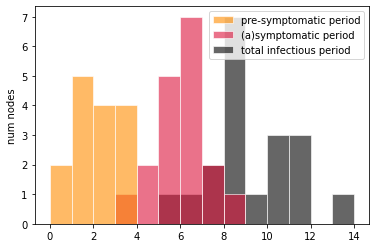

onset-to-hospitalization period:  mean = 7.24, std = 4.21, 95% CI = (2.31, 16.94)

hospitalization-to-discharge period:  mean = 12.98, std = 4.83, 95% CI = (5.44, 20.98)

onset-to-discharge period:  mean = 20.22, std = 6.80, 95% CI = (9.82, 32.80)



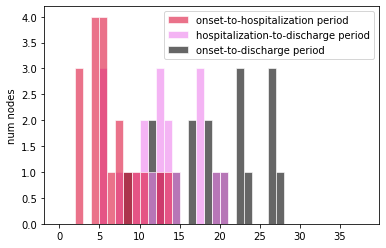

onset-to-hospitalization period:  mean = 7.24, std = 4.21, 95% CI = (2.31, 16.94)

hospitalization-to-death period:  mean = 5.65, std = 2.17, 95% CI = (2.31, 9.56)

onset-to-death period:  mean = 12.89, std = 5.11, 95% CI = (6.69, 24.34)



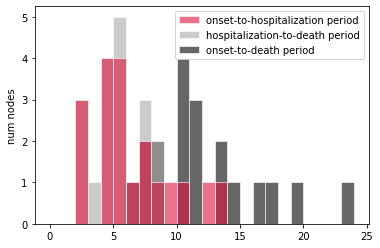

Individual R0:  mean = 0.92, std = 0.18, 95% CI = (0.67, 1.23)



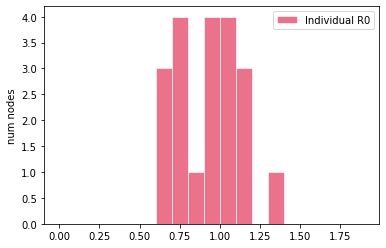

[INTERVENTIONS @ t = 2.28 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 3.95 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	19	tested randomly         [+ 1 positive (5.26 %) +]
	19	tested TOTAL            [+ 1 positive (5.26 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

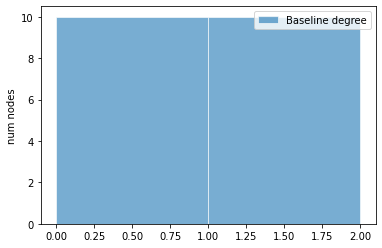

latent period:  mean = 3.31, std = 1.98, 95% CI = (0.44, 7.07)

pre-symptomatic period:  mean = 3.02, std = 1.71, 95% CI = (1.09, 7.27)

total incubation period:  mean = 6.33, std = 2.64, 95% CI = (2.91, 12.25)



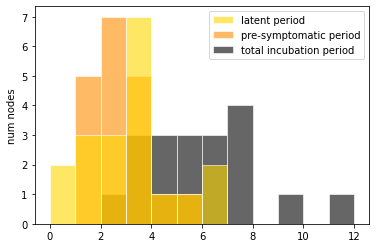

pre-symptomatic period:  mean = 3.31, std = 1.98, 95% CI = (0.44, 7.07)

(a)symptomatic period:  mean = 8.12, std = 3.54, 95% CI = (3.02, 16.15)

total infectious period:  mean = 11.44, std = 4.24, 95% CI = (5.11, 19.73)



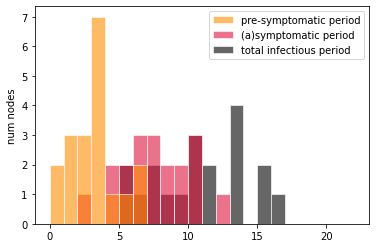

onset-to-hospitalization period:  mean = 7.80, std = 3.81, 95% CI = (1.71, 14.32)

hospitalization-to-discharge period:  mean = 12.97, std = 6.21, 95% CI = (2.59, 24.80)

onset-to-discharge period:  mean = 20.77, std = 7.66, 95% CI = (7.16, 33.39)



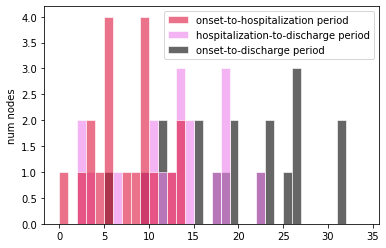

onset-to-hospitalization period:  mean = 7.80, std = 3.81, 95% CI = (1.71, 14.32)

hospitalization-to-death period:  mean = 6.34, std = 2.73, 95% CI = (2.80, 11.79)

onset-to-death period:  mean = 14.14, std = 4.53, 95% CI = (7.75, 21.44)



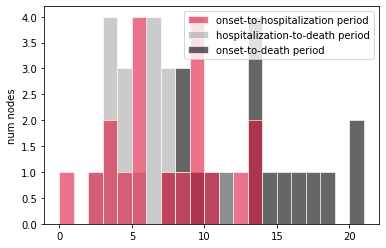

Individual R0:  mean = 1.05, std = 0.26, 95% CI = (0.80, 1.73)



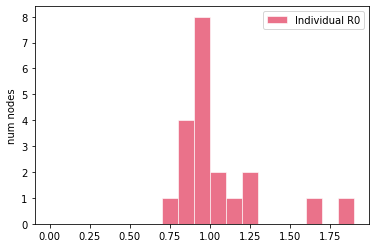

[INTERVENTIONS @ t = 0.54 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 0 positive (0.00 %) +]
	20	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.39 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVE

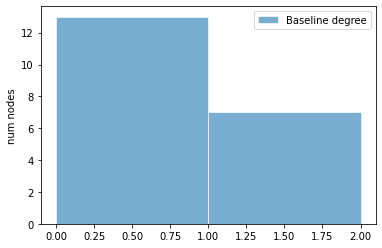

latent period:  mean = 4.12, std = 2.42, 95% CI = (0.77, 8.94)

pre-symptomatic period:  mean = 2.96, std = 1.38, 95% CI = (1.12, 5.72)

total incubation period:  mean = 7.08, std = 2.70, 95% CI = (2.94, 13.02)



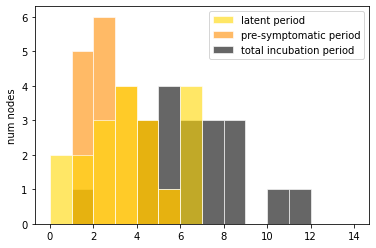

pre-symptomatic period:  mean = 4.12, std = 2.42, 95% CI = (0.77, 8.94)

(a)symptomatic period:  mean = 7.90, std = 1.98, 95% CI = (4.80, 11.82)

total infectious period:  mean = 12.02, std = 3.32, 95% CI = (7.75, 18.42)



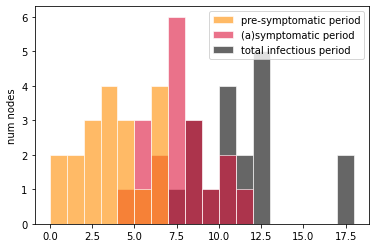

onset-to-hospitalization period:  mean = 8.36, std = 4.06, 95% CI = (2.75, 16.03)

hospitalization-to-discharge period:  mean = 15.21, std = 8.08, 95% CI = (4.72, 30.17)

onset-to-discharge period:  mean = 23.57, std = 9.47, 95% CI = (10.13, 44.20)



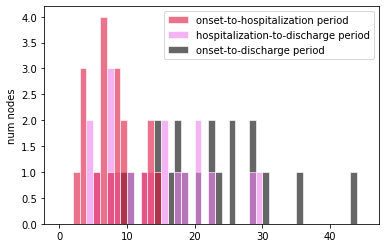

onset-to-hospitalization period:  mean = 8.36, std = 4.06, 95% CI = (2.75, 16.03)

hospitalization-to-death period:  mean = 7.55, std = 3.32, 95% CI = (2.28, 13.75)

onset-to-death period:  mean = 15.91, std = 5.93, 95% CI = (6.92, 24.29)



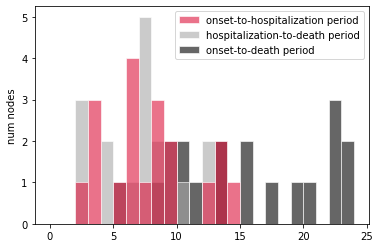

Individual R0:  mean = 0.95, std = 0.18, 95% CI = (0.65, 1.24)



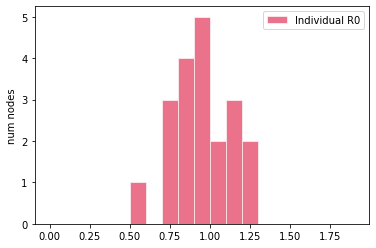

[INTERVENTIONS @ t = 0.20 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.34 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	19	tested randomly         [+ 1 positive (5.26 %) +]
	19	tested TOTAL            [+ 1 positive (5.26 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

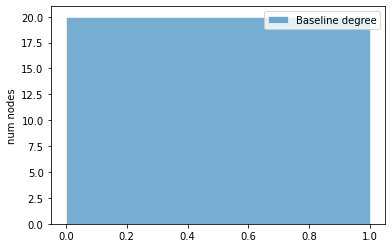

latent period:  mean = 3.41, std = 1.94, 95% CI = (0.71, 7.02)

pre-symptomatic period:  mean = 3.31, std = 1.61, 95% CI = (1.29, 6.63)

total incubation period:  mean = 6.73, std = 3.13, 95% CI = (2.25, 12.89)



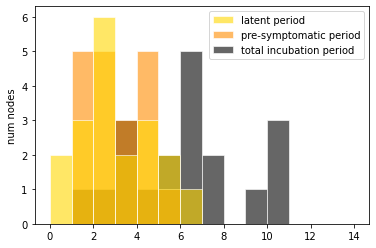

pre-symptomatic period:  mean = 3.41, std = 1.94, 95% CI = (0.71, 7.02)

(a)symptomatic period:  mean = 6.44, std = 2.89, 95% CI = (2.01, 12.45)

total infectious period:  mean = 9.86, std = 3.68, 95% CI = (4.12, 18.38)



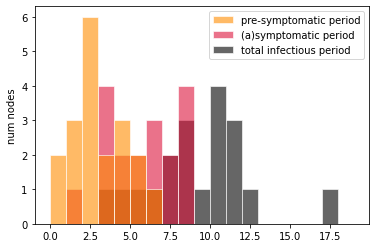

onset-to-hospitalization period:  mean = 7.39, std = 4.52, 95% CI = (1.61, 18.29)

hospitalization-to-discharge period:  mean = 13.87, std = 7.57, 95% CI = (4.04, 31.03)

onset-to-discharge period:  mean = 21.26, std = 10.43, 95% CI = (10.43, 45.76)



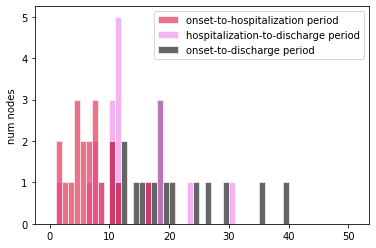

onset-to-hospitalization period:  mean = 7.39, std = 4.52, 95% CI = (1.61, 18.29)

hospitalization-to-death period:  mean = 6.59, std = 2.49, 95% CI = (2.86, 11.85)

onset-to-death period:  mean = 13.98, std = 5.86, 95% CI = (6.63, 28.75)



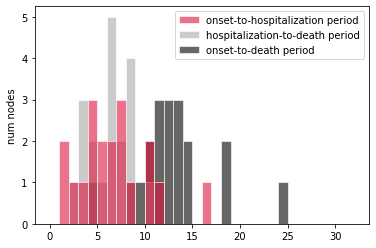

Individual R0:  mean = 1.00, std = 0.21, 95% CI = (0.71, 1.39)



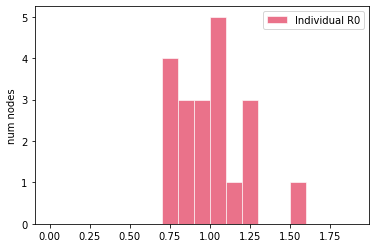

[INTERVENTIONS @ t = 0.50 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.65 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	19	tested randomly         [+ 0 positive (0.00 %) +]
	19	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

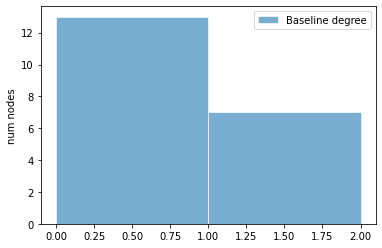

latent period:  mean = 3.09, std = 1.49, 95% CI = (0.77, 5.87)

pre-symptomatic period:  mean = 2.92, std = 2.24, 95% CI = (0.55, 8.40)

total incubation period:  mean = 6.01, std = 3.05, 95% CI = (1.32, 11.97)



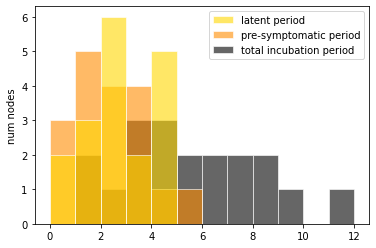

pre-symptomatic period:  mean = 3.09, std = 1.49, 95% CI = (0.77, 5.87)

(a)symptomatic period:  mean = 6.74, std = 2.93, 95% CI = (2.81, 12.21)

total infectious period:  mean = 9.83, std = 3.32, 95% CI = (5.07, 15.71)



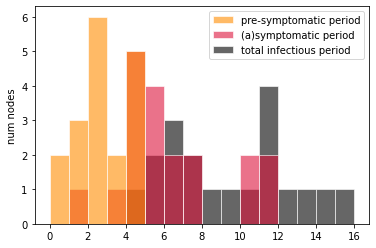

onset-to-hospitalization period:  mean = 8.20, std = 3.88, 95% CI = (2.95, 16.62)

hospitalization-to-discharge period:  mean = 13.82, std = 5.21, 95% CI = (7.76, 26.08)

onset-to-discharge period:  mean = 22.02, std = 5.99, 95% CI = (14.02, 33.96)



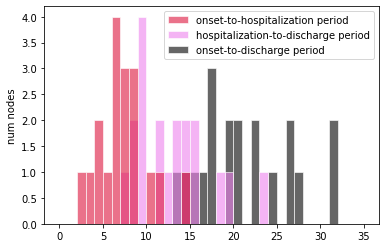

onset-to-hospitalization period:  mean = 8.20, std = 3.88, 95% CI = (2.95, 16.62)

hospitalization-to-death period:  mean = 7.13, std = 2.60, 95% CI = (3.41, 11.64)

onset-to-death period:  mean = 15.33, std = 5.25, 95% CI = (7.64, 24.94)



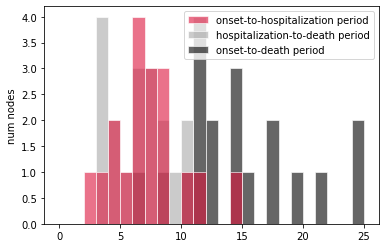

Individual R0:  mean = 0.99, std = 0.26, 95% CI = (0.69, 1.56)



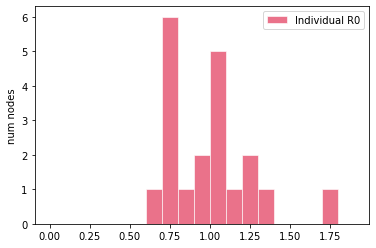

[INTERVENTIONS @ t = 0.42 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.94 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	19	tested randomly         [+ 1 positive (5.26 %) +]
	19	tested TOTAL            [+ 1 positive (5.26 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

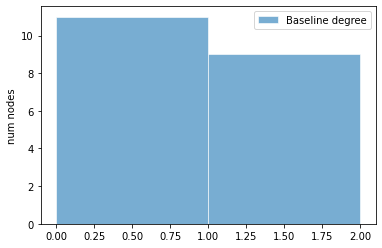

latent period:  mean = 3.79, std = 2.65, 95% CI = (0.73, 9.94)

pre-symptomatic period:  mean = 2.51, std = 1.62, 95% CI = (0.69, 6.19)

total incubation period:  mean = 6.30, std = 2.86, 95% CI = (2.21, 12.26)



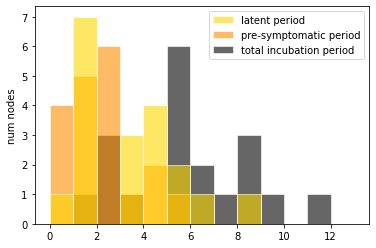

pre-symptomatic period:  mean = 3.79, std = 2.65, 95% CI = (0.73, 9.94)

(a)symptomatic period:  mean = 6.07, std = 2.01, 95% CI = (2.62, 9.36)

total infectious period:  mean = 9.87, std = 3.52, 95% CI = (3.84, 16.55)



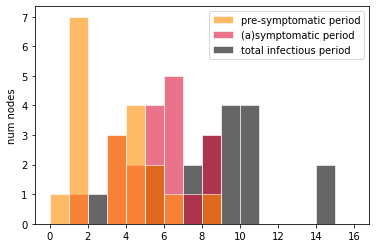

onset-to-hospitalization period:  mean = 7.32, std = 3.36, 95% CI = (2.69, 14.44)

hospitalization-to-discharge period:  mean = 15.19, std = 7.79, 95% CI = (4.46, 31.79)

onset-to-discharge period:  mean = 22.51, std = 8.25, 95% CI = (10.10, 37.74)



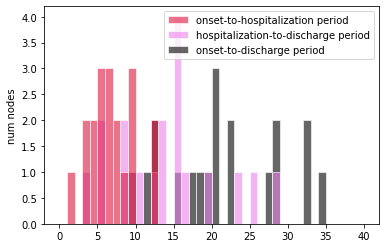

onset-to-hospitalization period:  mean = 7.32, std = 3.36, 95% CI = (2.69, 14.44)

hospitalization-to-death period:  mean = 6.19, std = 2.28, 95% CI = (3.13, 11.43)

onset-to-death period:  mean = 13.51, std = 4.87, 95% CI = (7.58, 25.08)



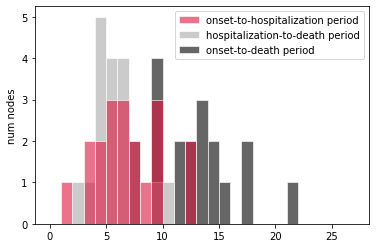

Individual R0:  mean = 1.03, std = 0.22, 95% CI = (0.72, 1.42)



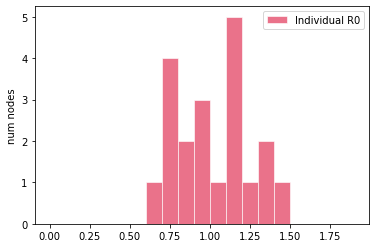

[INTERVENTIONS @ t = 1.05 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.52 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	19	tested randomly         [+ 1 positive (5.26 %) +]
	19	tested TOTAL            [+ 1 positive (5.26 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

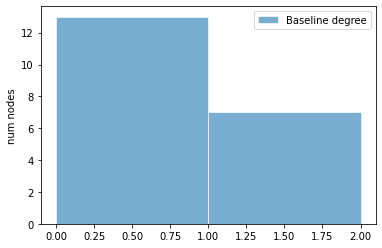

latent period:  mean = 3.65, std = 1.37, 95% CI = (1.48, 5.70)

pre-symptomatic period:  mean = 3.02, std = 2.07, 95% CI = (0.91, 8.04)

total incubation period:  mean = 6.67, std = 2.07, 95% CI = (3.91, 11.39)



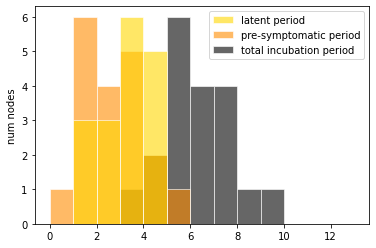

pre-symptomatic period:  mean = 3.65, std = 1.37, 95% CI = (1.48, 5.70)

(a)symptomatic period:  mean = 5.53, std = 2.11, 95% CI = (2.71, 9.43)

total infectious period:  mean = 9.18, std = 2.78, 95% CI = (4.63, 14.41)



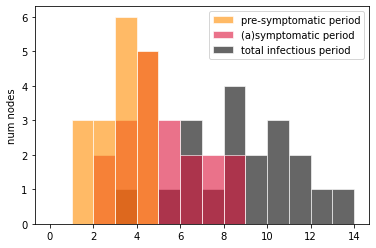

onset-to-hospitalization period:  mean = 6.94, std = 3.25, 95% CI = (1.51, 14.04)

hospitalization-to-discharge period:  mean = 11.85, std = 4.65, 95% CI = (4.46, 20.31)

onset-to-discharge period:  mean = 18.79, std = 5.57, 95% CI = (11.05, 31.39)



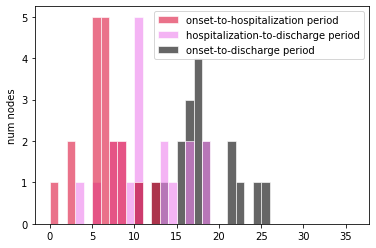

onset-to-hospitalization period:  mean = 6.94, std = 3.25, 95% CI = (1.51, 14.04)

hospitalization-to-death period:  mean = 7.74, std = 2.43, 95% CI = (3.57, 12.39)

onset-to-death period:  mean = 14.68, std = 3.47, 95% CI = (8.82, 20.80)



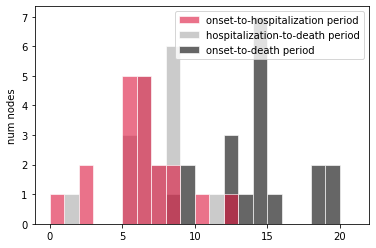

Individual R0:  mean = 0.96, std = 0.19, 95% CI = (0.58, 1.25)



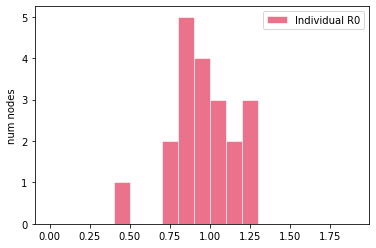

[INTERVENTIONS @ t = 0.77 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 0 positive (0.00 %) +]
	20	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 7.78 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVE

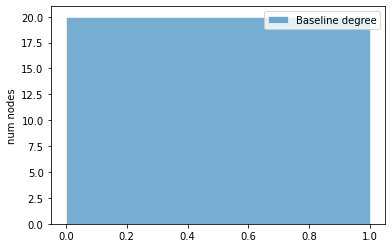

latent period:  mean = 3.84, std = 2.45, 95% CI = (0.66, 8.46)

pre-symptomatic period:  mean = 1.99, std = 0.79, 95% CI = (0.76, 3.33)

total incubation period:  mean = 5.83, std = 2.77, 95% CI = (1.45, 10.16)



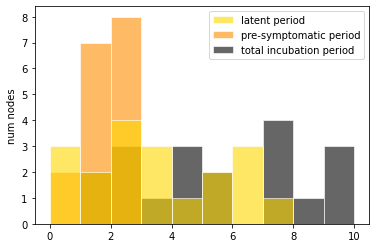

pre-symptomatic period:  mean = 3.84, std = 2.45, 95% CI = (0.66, 8.46)

(a)symptomatic period:  mean = 6.12, std = 2.29, 95% CI = (2.57, 10.55)

total infectious period:  mean = 9.97, std = 3.15, 95% CI = (4.31, 16.53)



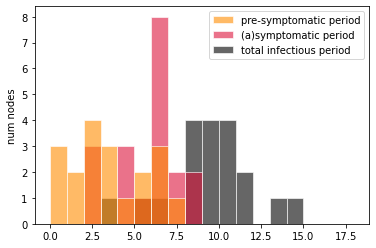

onset-to-hospitalization period:  mean = 8.21, std = 4.11, 95% CI = (1.85, 15.65)

hospitalization-to-discharge period:  mean = 14.28, std = 4.26, 95% CI = (7.84, 22.38)

onset-to-discharge period:  mean = 22.49, std = 5.99, 95% CI = (10.55, 32.20)



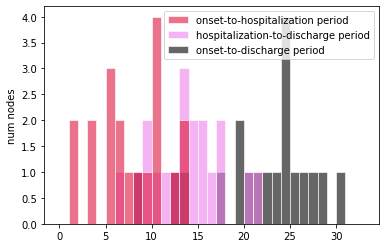

onset-to-hospitalization period:  mean = 8.21, std = 4.11, 95% CI = (1.85, 15.65)

hospitalization-to-death period:  mean = 7.41, std = 2.85, 95% CI = (2.57, 13.26)

onset-to-death period:  mean = 15.62, std = 4.60, 95% CI = (7.36, 24.40)



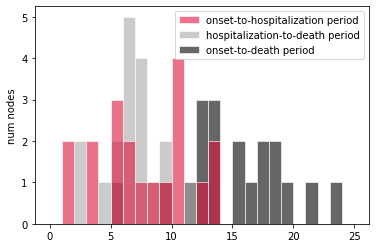

Individual R0:  mean = 1.00, std = 0.22, 95% CI = (0.62, 1.37)



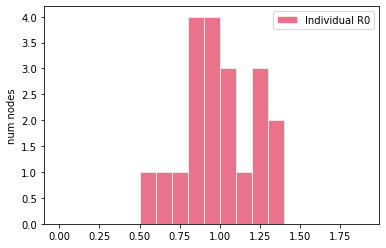

[INTERVENTIONS @ t = 0.61 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.65 (1 (5.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENTI

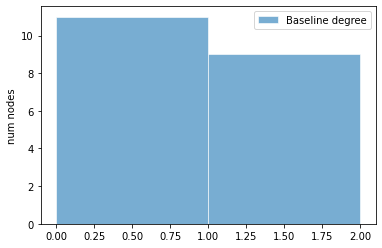

latent period:  mean = 3.47, std = 1.80, 95% CI = (1.35, 7.29)

pre-symptomatic period:  mean = 2.44, std = 1.14, 95% CI = (0.63, 4.67)

total incubation period:  mean = 5.91, std = 2.15, 95% CI = (3.13, 10.55)



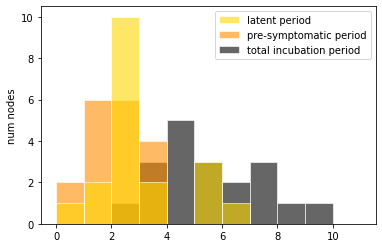

pre-symptomatic period:  mean = 3.47, std = 1.80, 95% CI = (1.35, 7.29)

(a)symptomatic period:  mean = 5.57, std = 1.93, 95% CI = (2.26, 9.34)

total infectious period:  mean = 9.04, std = 2.62, 95% CI = (5.20, 13.60)



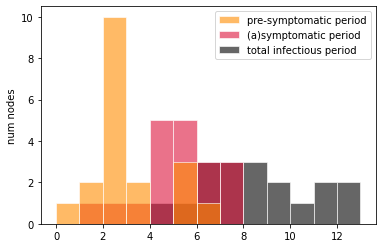

onset-to-hospitalization period:  mean = 8.14, std = 3.43, 95% CI = (2.73, 15.31)

hospitalization-to-discharge period:  mean = 13.43, std = 5.97, 95% CI = (4.93, 26.62)

onset-to-discharge period:  mean = 21.57, std = 7.14, 95% CI = (9.59, 36.34)



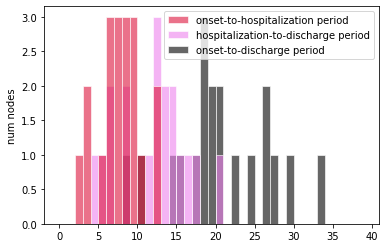

onset-to-hospitalization period:  mean = 8.14, std = 3.43, 95% CI = (2.73, 15.31)

hospitalization-to-death period:  mean = 6.98, std = 3.03, 95% CI = (1.83, 12.84)

onset-to-death period:  mean = 15.12, std = 4.59, 95% CI = (5.34, 21.99)



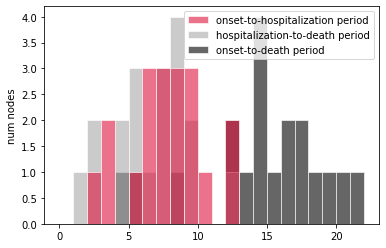

Individual R0:  mean = 1.10, std = 0.26, 95% CI = (0.68, 1.63)



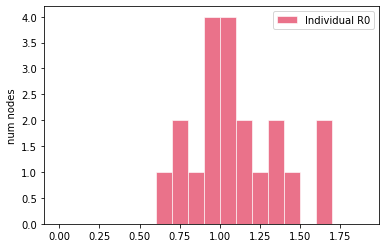

[INTERVENTIONS @ t = 0.72 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 0 positive (0.00 %) +]
	20	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 3.15 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENT

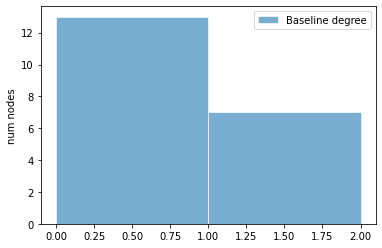

latent period:  mean = 3.36, std = 1.28, 95% CI = (0.98, 5.30)

pre-symptomatic period:  mean = 2.64, std = 1.34, 95% CI = (0.25, 5.07)

total incubation period:  mean = 6.00, std = 1.83, 95% CI = (2.20, 8.83)



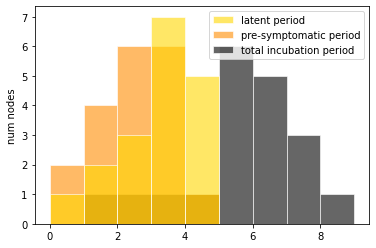

pre-symptomatic period:  mean = 3.36, std = 1.28, 95% CI = (0.98, 5.30)

(a)symptomatic period:  mean = 6.42, std = 2.04, 95% CI = (3.34, 9.72)

total infectious period:  mean = 9.78, std = 2.18, 95% CI = (5.11, 13.12)



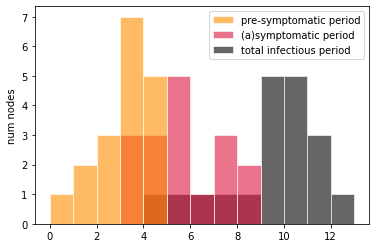

onset-to-hospitalization period:  mean = 6.80, std = 2.71, 95% CI = (3.03, 13.18)

hospitalization-to-discharge period:  mean = 14.04, std = 6.48, 95% CI = (5.40, 25.58)

onset-to-discharge period:  mean = 20.84, std = 8.31, 95% CI = (10.05, 38.76)



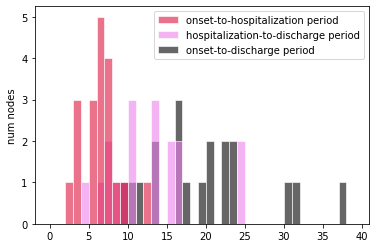

onset-to-hospitalization period:  mean = 6.80, std = 2.71, 95% CI = (3.03, 13.18)

hospitalization-to-death period:  mean = 7.09, std = 2.98, 95% CI = (3.53, 13.71)

onset-to-death period:  mean = 13.89, std = 3.91, 95% CI = (8.53, 21.63)



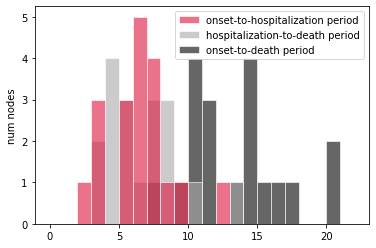

Individual R0:  mean = 0.99, std = 0.21, 95% CI = (0.68, 1.35)



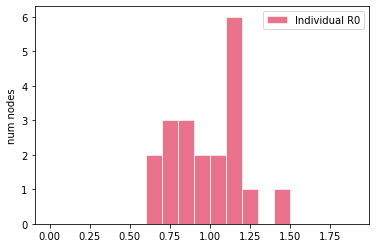

[INTERVENTIONS @ t = 0.10 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 4.24 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

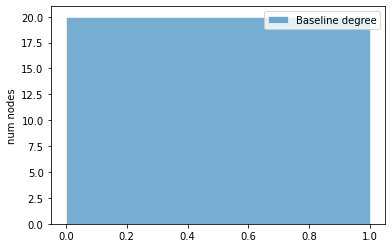

latent period:  mean = 3.89, std = 1.89, 95% CI = (1.93, 8.39)

pre-symptomatic period:  mean = 2.83, std = 1.76, 95% CI = (0.54, 6.34)

total incubation period:  mean = 6.73, std = 2.89, 95% CI = (3.32, 12.95)



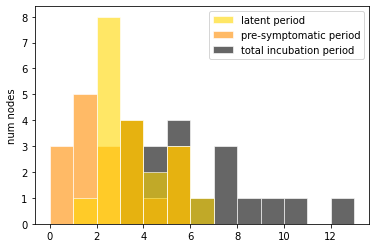

pre-symptomatic period:  mean = 3.89, std = 1.89, 95% CI = (1.93, 8.39)

(a)symptomatic period:  mean = 6.04, std = 1.98, 95% CI = (3.09, 9.26)

total infectious period:  mean = 9.93, std = 2.59, 95% CI = (5.93, 15.11)



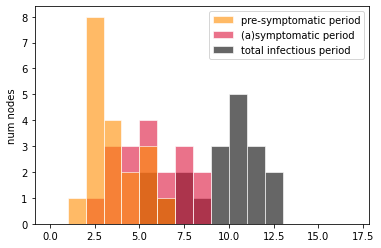

onset-to-hospitalization period:  mean = 6.91, std = 2.51, 95% CI = (3.50, 11.78)

hospitalization-to-discharge period:  mean = 12.71, std = 4.44, 95% CI = (6.00, 21.01)

onset-to-discharge period:  mean = 19.62, std = 4.42, 95% CI = (13.12, 27.52)



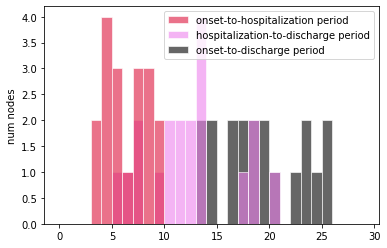

onset-to-hospitalization period:  mean = 6.91, std = 2.51, 95% CI = (3.50, 11.78)

hospitalization-to-death period:  mean = 6.29, std = 2.90, 95% CI = (2.13, 11.15)

onset-to-death period:  mean = 13.20, std = 4.35, 95% CI = (6.54, 21.17)



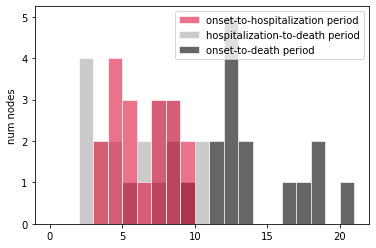

Individual R0:  mean = 1.00, std = 0.21, 95% CI = (0.67, 1.43)



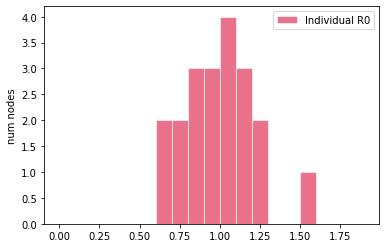

[INTERVENTIONS @ t = 0.11 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 4.02 (4 (20.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

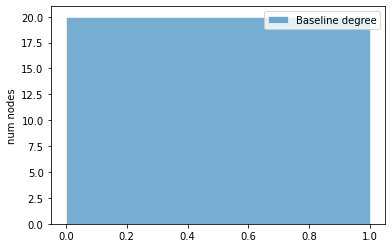

latent period:  mean = 3.69, std = 2.23, 95% CI = (1.06, 8.20)

pre-symptomatic period:  mean = 2.85, std = 1.21, 95% CI = (1.02, 4.63)

total incubation period:  mean = 6.54, std = 2.92, 95% CI = (2.41, 12.04)



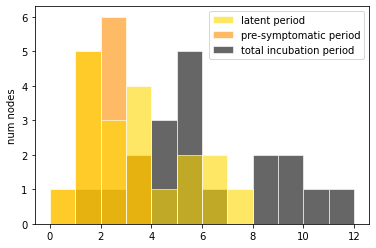

pre-symptomatic period:  mean = 3.69, std = 2.23, 95% CI = (1.06, 8.20)

(a)symptomatic period:  mean = 6.57, std = 3.06, 95% CI = (2.30, 12.29)

total infectious period:  mean = 10.26, std = 3.54, 95% CI = (4.57, 15.91)



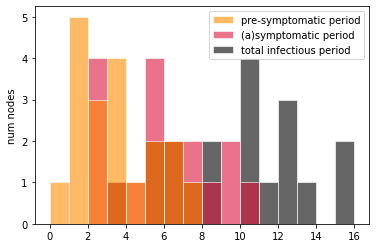

onset-to-hospitalization period:  mean = 7.45, std = 3.29, 95% CI = (3.04, 13.30)

hospitalization-to-discharge period:  mean = 12.86, std = 5.87, 95% CI = (5.96, 24.02)

onset-to-discharge period:  mean = 20.31, std = 7.48, 95% CI = (10.79, 32.69)



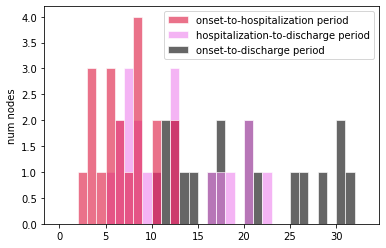

onset-to-hospitalization period:  mean = 7.45, std = 3.29, 95% CI = (3.04, 13.30)

hospitalization-to-death period:  mean = 6.30, std = 3.35, 95% CI = (2.21, 13.43)

onset-to-death period:  mean = 13.75, std = 4.89, 95% CI = (6.36, 21.81)



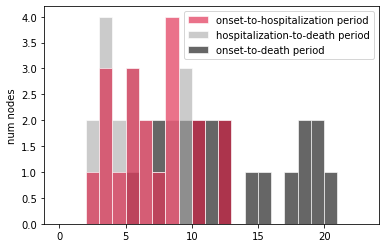

Individual R0:  mean = 0.98, std = 0.22, 95% CI = (0.70, 1.48)



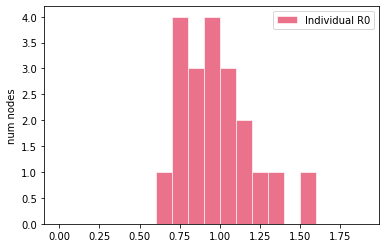

[INTERVENTIONS @ t = 7.80 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 0 positive (0.00 %) +]
	20	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 8.70 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENT

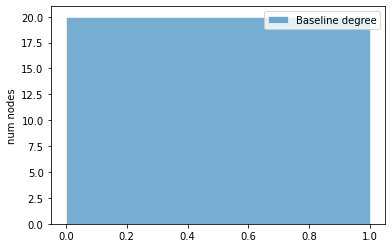

latent period:  mean = 3.16, std = 1.64, 95% CI = (0.73, 5.99)

pre-symptomatic period:  mean = 2.07, std = 1.45, 95% CI = (0.43, 5.06)

total incubation period:  mean = 5.23, std = 2.42, 95% CI = (1.99, 9.69)



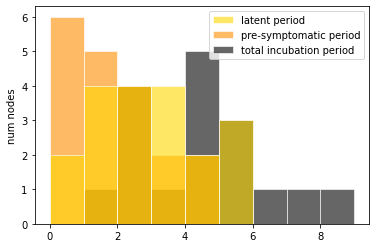

pre-symptomatic period:  mean = 3.16, std = 1.64, 95% CI = (0.73, 5.99)

(a)symptomatic period:  mean = 5.80, std = 1.90, 95% CI = (2.86, 9.25)

total infectious period:  mean = 8.96, std = 2.70, 95% CI = (4.57, 13.74)



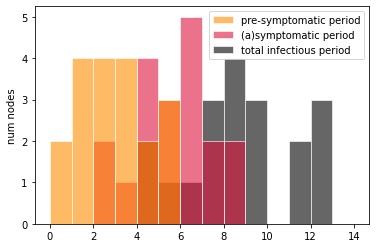

onset-to-hospitalization period:  mean = 7.28, std = 2.26, 95% CI = (3.97, 12.20)

hospitalization-to-discharge period:  mean = 11.88, std = 4.48, 95% CI = (7.30, 21.71)

onset-to-discharge period:  mean = 19.16, std = 5.27, 95% CI = (12.00, 30.00)



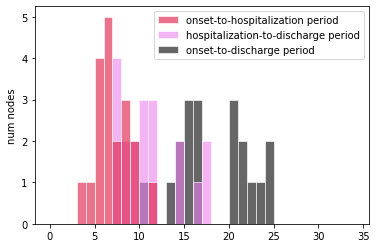

onset-to-hospitalization period:  mean = 7.28, std = 2.26, 95% CI = (3.97, 12.20)

hospitalization-to-death period:  mean = 7.09, std = 3.75, 95% CI = (2.77, 14.99)

onset-to-death period:  mean = 14.37, std = 4.54, 95% CI = (8.86, 24.64)



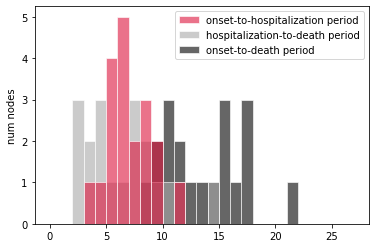

Individual R0:  mean = 1.05, std = 0.23, 95% CI = (0.73, 1.48)



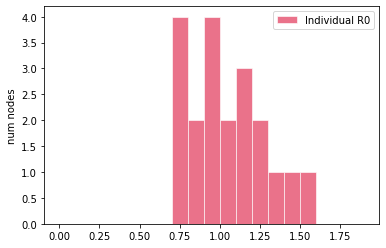

[NEW EXPOSURE @ t = 0.42 (1 exposed)]
[INTERVENTIONS @ t = 0.42 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 0 positive (0.00 %) +]
	20	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 3.14 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of co

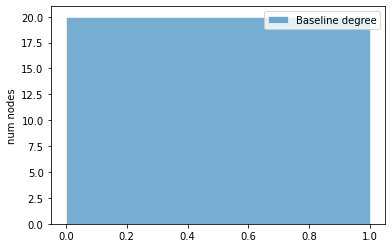

latent period:  mean = 3.30, std = 2.04, 95% CI = (0.62, 7.27)

pre-symptomatic period:  mean = 3.07, std = 1.87, 95% CI = (1.08, 7.38)

total incubation period:  mean = 6.37, std = 2.88, 95% CI = (2.83, 12.74)



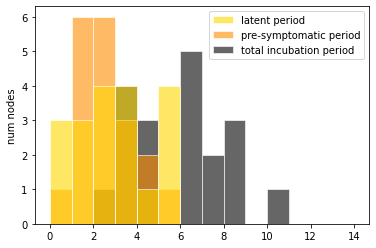

pre-symptomatic period:  mean = 3.30, std = 2.04, 95% CI = (0.62, 7.27)

(a)symptomatic period:  mean = 6.92, std = 2.92, 95% CI = (2.53, 12.36)

total infectious period:  mean = 10.22, std = 3.58, 95% CI = (3.31, 16.21)



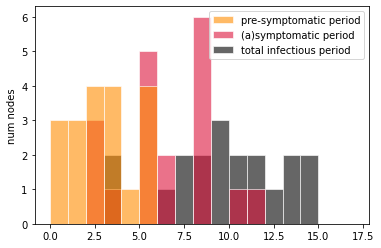

onset-to-hospitalization period:  mean = 7.24, std = 3.95, 95% CI = (2.18, 15.73)

hospitalization-to-discharge period:  mean = 16.73, std = 8.01, 95% CI = (8.70, 35.07)

onset-to-discharge period:  mean = 23.96, std = 8.35, 95% CI = (11.81, 40.94)



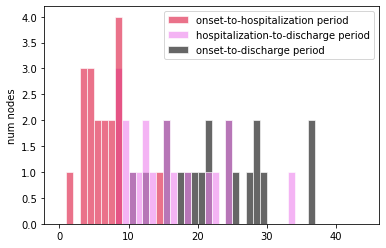

onset-to-hospitalization period:  mean = 7.24, std = 3.95, 95% CI = (2.18, 15.73)

hospitalization-to-death period:  mean = 7.37, std = 2.77, 95% CI = (3.63, 13.53)

onset-to-death period:  mean = 14.61, std = 4.44, 95% CI = (8.10, 23.04)



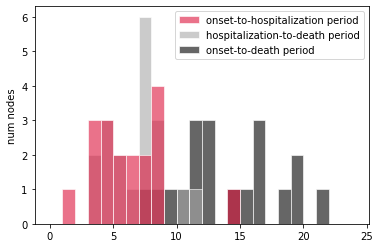

Individual R0:  mean = 0.95, std = 0.15, 95% CI = (0.69, 1.25)



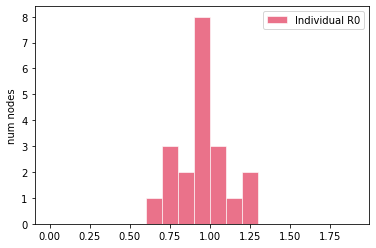

[INTERVENTIONS @ t = 0.02 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.18 (2 (10.00%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 1 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTER

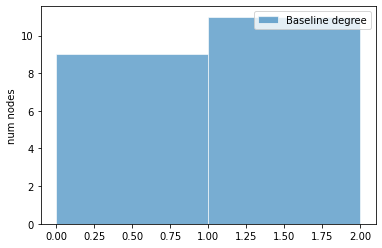

latent period:  mean = 3.58, std = 2.09, 95% CI = (0.73, 7.62)

pre-symptomatic period:  mean = 3.05, std = 2.13, 95% CI = (0.89, 7.63)

total incubation period:  mean = 6.63, std = 3.29, 95% CI = (2.67, 13.72)



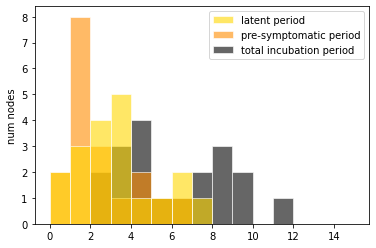

pre-symptomatic period:  mean = 3.58, std = 2.09, 95% CI = (0.73, 7.62)

(a)symptomatic period:  mean = 5.69, std = 2.29, 95% CI = (2.78, 10.79)

total infectious period:  mean = 9.28, std = 2.50, 95% CI = (4.38, 13.26)



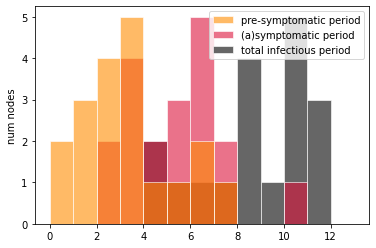

onset-to-hospitalization period:  mean = 9.21, std = 3.83, 95% CI = (2.93, 17.01)

hospitalization-to-discharge period:  mean = 12.92, std = 6.27, 95% CI = (4.65, 26.07)

onset-to-discharge period:  mean = 22.13, std = 7.06, 95% CI = (10.65, 35.13)



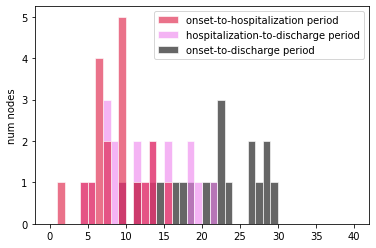

onset-to-hospitalization period:  mean = 9.21, std = 3.83, 95% CI = (2.93, 17.01)

hospitalization-to-death period:  mean = 7.28, std = 3.54, 95% CI = (2.61, 14.35)

onset-to-death period:  mean = 16.49, std = 5.88, 95% CI = (6.73, 28.07)



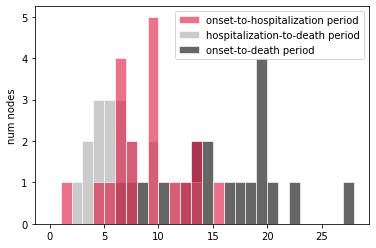

Individual R0:  mean = 0.91, std = 0.18, 95% CI = (0.63, 1.22)



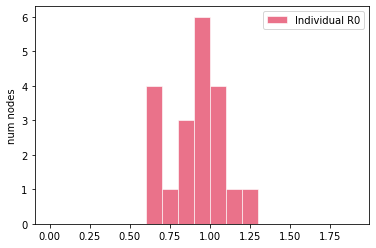

[INTERVENTIONS @ t = 2.60 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 4.35 (3 (15.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[NEW EXPOSUR

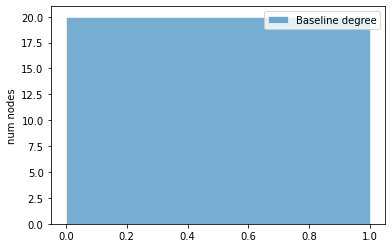

latent period:  mean = 3.03, std = 2.09, 95% CI = (0.62, 7.47)

pre-symptomatic period:  mean = 2.65, std = 1.49, 95% CI = (0.62, 4.99)

total incubation period:  mean = 5.68, std = 2.24, 95% CI = (2.02, 10.30)



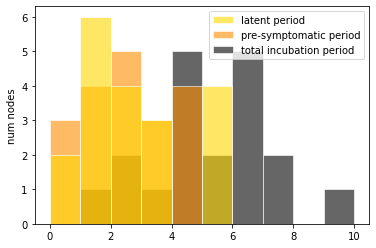

pre-symptomatic period:  mean = 3.03, std = 2.09, 95% CI = (0.62, 7.47)

(a)symptomatic period:  mean = 6.29, std = 1.91, 95% CI = (2.94, 9.56)

total infectious period:  mean = 9.32, std = 3.22, 95% CI = (4.60, 15.88)



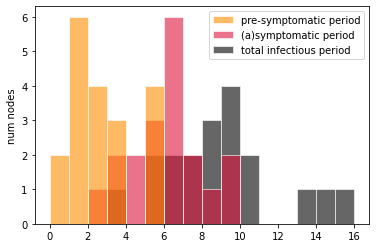

onset-to-hospitalization period:  mean = 8.39, std = 3.82, 95% CI = (2.65, 15.09)

hospitalization-to-discharge period:  mean = 13.58, std = 5.19, 95% CI = (5.05, 22.93)

onset-to-discharge period:  mean = 21.96, std = 7.01, 95% CI = (8.23, 34.02)



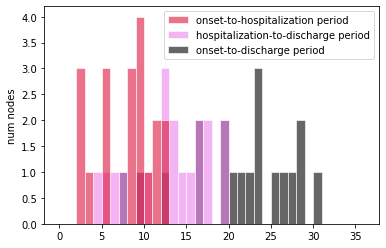

onset-to-hospitalization period:  mean = 8.39, std = 3.82, 95% CI = (2.65, 15.09)

hospitalization-to-death period:  mean = 6.87, std = 2.51, 95% CI = (3.44, 11.97)

onset-to-death period:  mean = 15.26, std = 5.05, 95% CI = (7.91, 25.68)



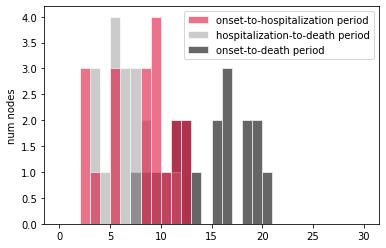

Individual R0:  mean = 1.05, std = 0.23, 95% CI = (0.76, 1.49)



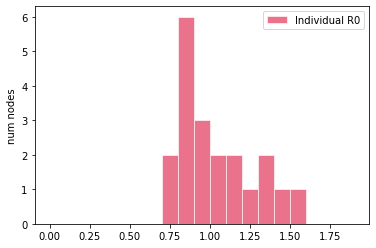

[INTERVENTIONS @ t = 0.91 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 4.39 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

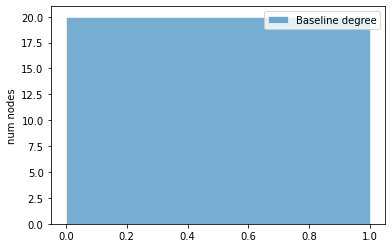

latent period:  mean = 3.66, std = 2.33, 95% CI = (1.00, 8.98)

pre-symptomatic period:  mean = 2.33, std = 1.52, 95% CI = (0.46, 5.68)

total incubation period:  mean = 5.99, std = 2.57, 95% CI = (2.14, 11.24)



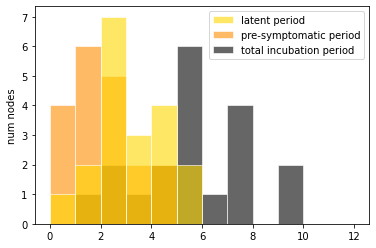

pre-symptomatic period:  mean = 3.66, std = 2.33, 95% CI = (1.00, 8.98)

(a)symptomatic period:  mean = 5.92, std = 2.08, 95% CI = (2.98, 9.58)

total infectious period:  mean = 9.58, std = 3.28, 95% CI = (5.77, 17.05)



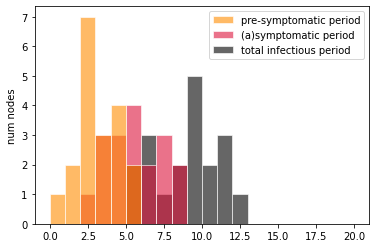

onset-to-hospitalization period:  mean = 7.85, std = 3.75, 95% CI = (2.67, 14.85)

hospitalization-to-discharge period:  mean = 13.68, std = 5.99, 95% CI = (6.12, 27.46)

onset-to-discharge period:  mean = 21.53, std = 4.91, 95% CI = (12.01, 30.82)



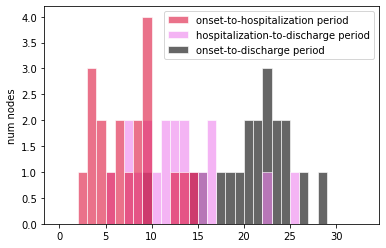

onset-to-hospitalization period:  mean = 7.85, std = 3.75, 95% CI = (2.67, 14.85)

hospitalization-to-death period:  mean = 6.51, std = 2.25, 95% CI = (2.55, 9.88)

onset-to-death period:  mean = 14.36, std = 5.39, 95% CI = (5.54, 22.60)



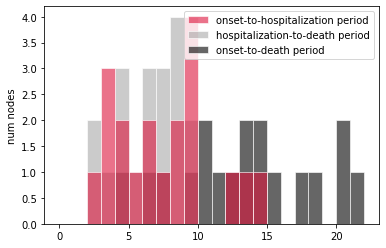

Individual R0:  mean = 1.00, std = 0.20, 95% CI = (0.67, 1.37)



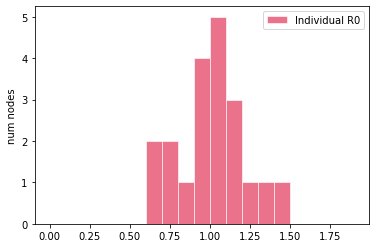

[INTERVENTIONS @ t = 1.20 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.00 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIO

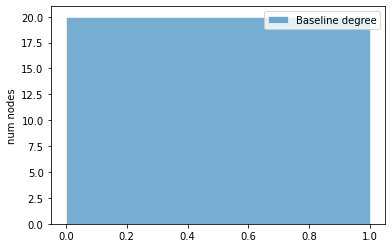

latent period:  mean = 3.77, std = 3.12, 95% CI = (1.08, 11.82)

pre-symptomatic period:  mean = 2.59, std = 1.56, 95% CI = (0.62, 5.47)

total incubation period:  mean = 6.36, std = 3.09, 95% CI = (2.04, 13.38)



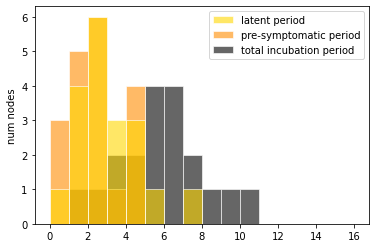

pre-symptomatic period:  mean = 3.77, std = 3.12, 95% CI = (1.08, 11.82)

(a)symptomatic period:  mean = 6.31, std = 2.21, 95% CI = (2.78, 11.35)

total infectious period:  mean = 10.08, std = 3.85, 95% CI = (5.91, 19.41)



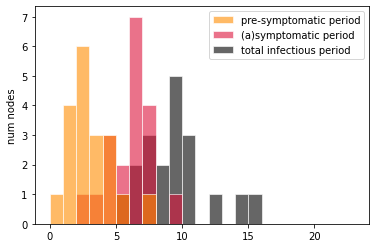

onset-to-hospitalization period:  mean = 7.90, std = 4.23, 95% CI = (2.31, 16.16)

hospitalization-to-discharge period:  mean = 11.95, std = 4.33, 95% CI = (5.00, 19.94)

onset-to-discharge period:  mean = 19.85, std = 5.74, 95% CI = (10.07, 28.77)



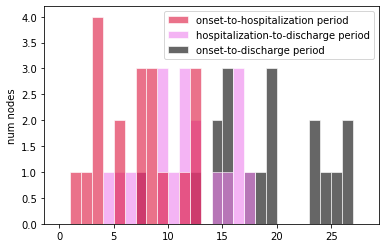

onset-to-hospitalization period:  mean = 7.90, std = 4.23, 95% CI = (2.31, 16.16)

hospitalization-to-death period:  mean = 6.88, std = 4.39, 95% CI = (1.99, 17.63)

onset-to-death period:  mean = 14.78, std = 6.06, 95% CI = (7.02, 27.72)



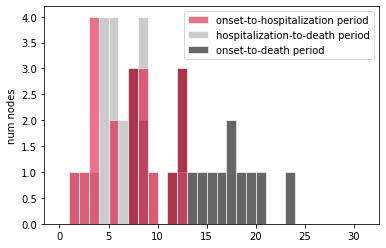

Individual R0:  mean = 1.03, std = 0.17, 95% CI = (0.75, 1.36)



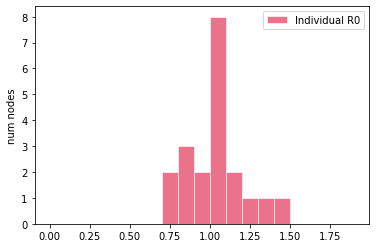

[NEW EXPOSURE @ t = 1.42 (1 exposed)]
[INTERVENTIONS @ t = 1.42 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.45 (3 (15.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of cont

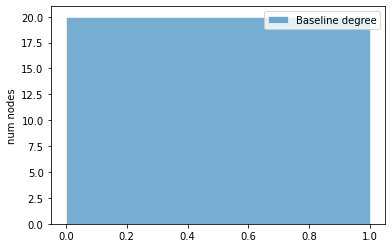

latent period:  mean = 2.91, std = 1.52, 95% CI = (0.79, 5.30)

pre-symptomatic period:  mean = 2.29, std = 1.23, 95% CI = (0.60, 4.69)

total incubation period:  mean = 5.20, std = 1.89, 95% CI = (1.97, 8.97)



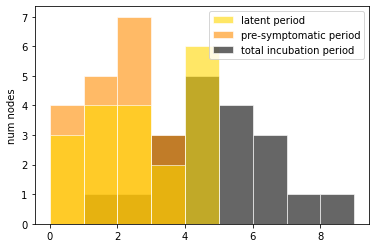

pre-symptomatic period:  mean = 2.91, std = 1.52, 95% CI = (0.79, 5.30)

(a)symptomatic period:  mean = 6.34, std = 2.60, 95% CI = (2.68, 10.84)

total infectious period:  mean = 9.25, std = 3.40, 95% CI = (3.71, 15.38)



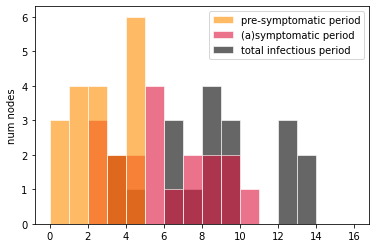

onset-to-hospitalization period:  mean = 8.74, std = 3.47, 95% CI = (3.64, 16.19)

hospitalization-to-discharge period:  mean = 17.12, std = 8.16, 95% CI = (6.13, 34.91)

onset-to-discharge period:  mean = 25.86, std = 10.24, 95% CI = (13.77, 49.30)



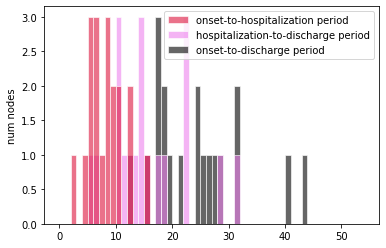

onset-to-hospitalization period:  mean = 8.74, std = 3.47, 95% CI = (3.64, 16.19)

hospitalization-to-death period:  mean = 7.47, std = 3.04, 95% CI = (2.63, 13.80)

onset-to-death period:  mean = 16.21, std = 4.21, 95% CI = (11.49, 24.88)



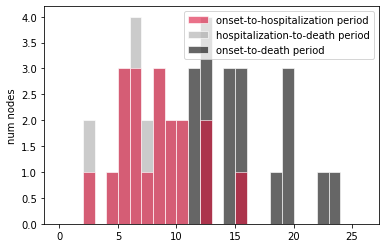

Individual R0:  mean = 1.02, std = 0.18, 95% CI = (0.75, 1.34)



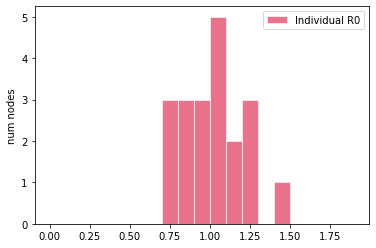

[INTERVENTIONS @ t = 0.43 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.91 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

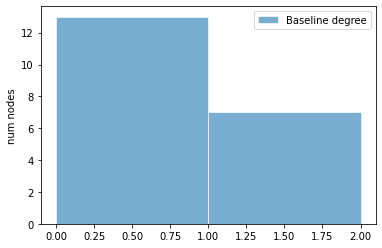

latent period:  mean = 3.18, std = 2.14, 95% CI = (0.38, 7.07)

pre-symptomatic period:  mean = 2.09, std = 1.07, 95% CI = (0.77, 4.22)

total incubation period:  mean = 5.27, std = 1.81, 95% CI = (2.89, 8.77)



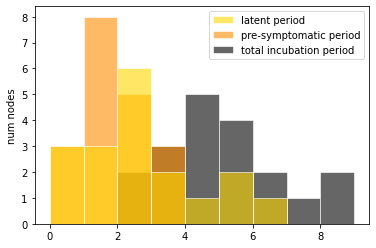

pre-symptomatic period:  mean = 3.18, std = 2.14, 95% CI = (0.38, 7.07)

(a)symptomatic period:  mean = 5.79, std = 2.20, 95% CI = (2.62, 10.21)

total infectious period:  mean = 8.97, std = 3.49, 95% CI = (3.41, 15.67)



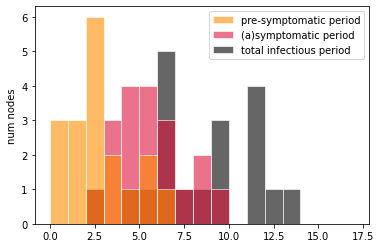

onset-to-hospitalization period:  mean = 7.05, std = 3.02, 95% CI = (3.24, 13.78)

hospitalization-to-discharge period:  mean = 12.40, std = 4.88, 95% CI = (4.92, 22.32)

onset-to-discharge period:  mean = 19.45, std = 4.74, 95% CI = (11.48, 28.20)



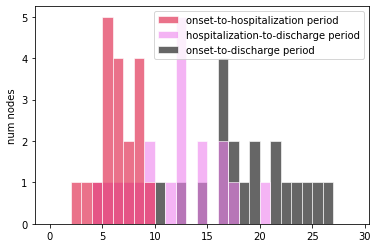

onset-to-hospitalization period:  mean = 7.05, std = 3.02, 95% CI = (3.24, 13.78)

hospitalization-to-death period:  mean = 7.49, std = 3.02, 95% CI = (3.47, 14.32)

onset-to-death period:  mean = 14.55, std = 4.15, 95% CI = (9.74, 22.91)



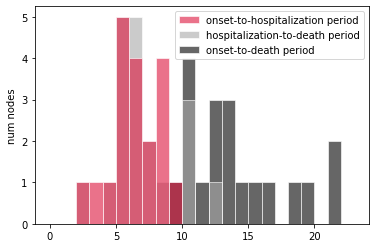

Individual R0:  mean = 0.99, std = 0.18, 95% CI = (0.67, 1.23)



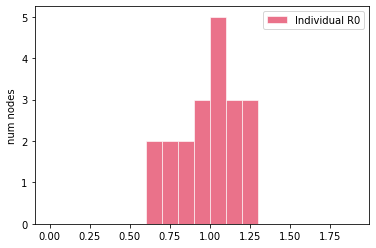

[INTERVENTIONS @ t = 0.11 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.95 (1 (5.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENTI

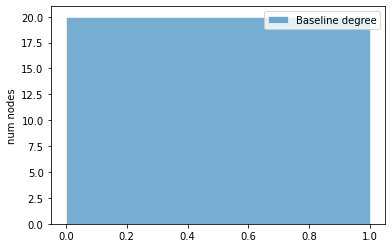

latent period:  mean = 3.48, std = 1.61, 95% CI = (0.99, 6.11)

pre-symptomatic period:  mean = 2.66, std = 1.51, 95% CI = (0.58, 5.68)

total incubation period:  mean = 6.14, std = 2.17, 95% CI = (3.13, 10.49)



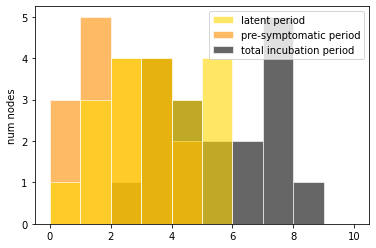

pre-symptomatic period:  mean = 3.48, std = 1.61, 95% CI = (0.99, 6.11)

(a)symptomatic period:  mean = 6.40, std = 3.38, 95% CI = (2.46, 14.20)

total infectious period:  mean = 9.88, std = 3.81, 95% CI = (4.66, 17.79)



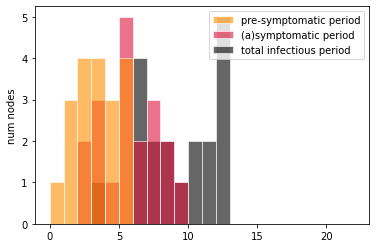

onset-to-hospitalization period:  mean = 8.25, std = 3.20, 95% CI = (2.58, 14.36)

hospitalization-to-discharge period:  mean = 13.68, std = 7.62, 95% CI = (4.74, 27.40)

onset-to-discharge period:  mean = 21.93, std = 8.22, 95% CI = (9.44, 36.35)



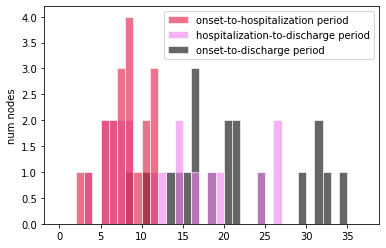

onset-to-hospitalization period:  mean = 8.25, std = 3.20, 95% CI = (2.58, 14.36)

hospitalization-to-death period:  mean = 7.78, std = 2.89, 95% CI = (3.15, 12.98)

onset-to-death period:  mean = 16.03, std = 3.96, 95% CI = (9.83, 23.20)



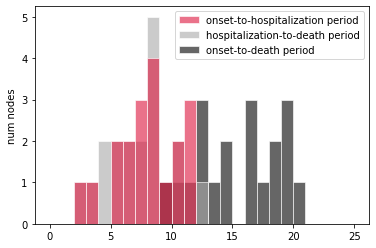

Individual R0:  mean = 0.94, std = 0.18, 95% CI = (0.65, 1.23)



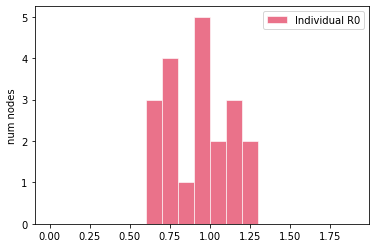

[INTERVENTIONS @ t = 0.51 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 4.35 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

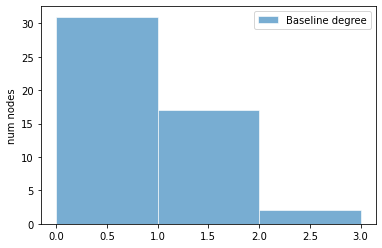

latent period:  mean = 3.61, std = 2.06, 95% CI = (0.74, 8.99)

pre-symptomatic period:  mean = 2.76, std = 1.80, 95% CI = (0.43, 7.49)

total incubation period:  mean = 6.37, std = 2.69, 95% CI = (2.55, 12.36)



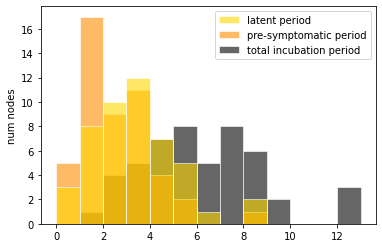

pre-symptomatic period:  mean = 3.61, std = 2.06, 95% CI = (0.74, 8.99)

(a)symptomatic period:  mean = 6.35, std = 2.83, 95% CI = (2.32, 11.22)

total infectious period:  mean = 9.97, std = 3.68, 95% CI = (4.79, 18.36)



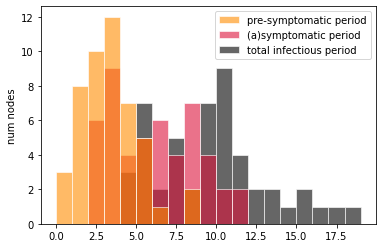

onset-to-hospitalization period:  mean = 8.04, std = 4.85, 95% CI = (2.08, 19.05)

hospitalization-to-discharge period:  mean = 13.13, std = 5.23, 95% CI = (5.01, 25.30)

onset-to-discharge period:  mean = 21.17, std = 7.66, 95% CI = (10.56, 37.54)



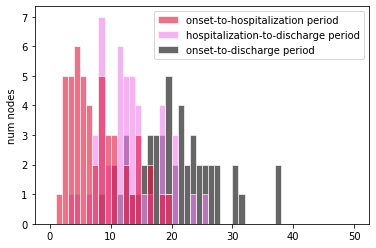

onset-to-hospitalization period:  mean = 8.04, std = 4.85, 95% CI = (2.08, 19.05)

hospitalization-to-death period:  mean = 6.90, std = 2.86, 95% CI = (2.55, 12.34)

onset-to-death period:  mean = 14.94, std = 6.29, 95% CI = (6.09, 29.54)



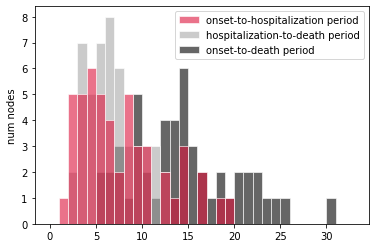

Individual R0:  mean = 1.03, std = 0.24, 95% CI = (0.65, 1.48)



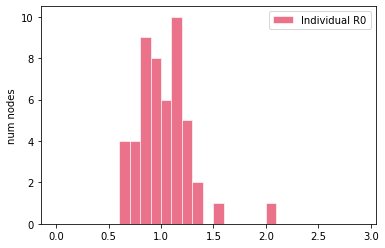

[INTERVENTIONS @ t = 0.09 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 0 positive (0.00 %) +]
	50	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.06 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVE

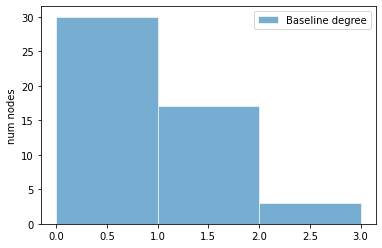

latent period:  mean = 3.68, std = 1.70, 95% CI = (1.44, 7.57)

pre-symptomatic period:  mean = 2.58, std = 1.11, 95% CI = (0.68, 4.70)

total incubation period:  mean = 6.27, std = 1.86, 95% CI = (3.45, 10.32)



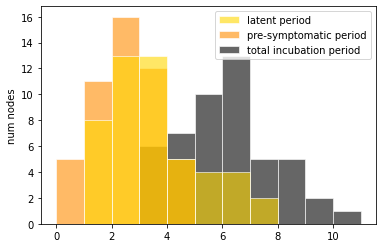

pre-symptomatic period:  mean = 3.68, std = 1.70, 95% CI = (1.44, 7.57)

(a)symptomatic period:  mean = 6.10, std = 2.46, 95% CI = (2.33, 10.37)

total infectious period:  mean = 9.79, std = 3.13, 95% CI = (4.67, 15.15)



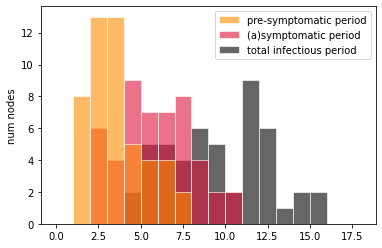

onset-to-hospitalization period:  mean = 7.82, std = 3.34, 95% CI = (2.60, 14.72)

hospitalization-to-discharge period:  mean = 13.23, std = 4.45, 95% CI = (6.12, 22.51)

onset-to-discharge period:  mean = 21.05, std = 5.53, 95% CI = (12.42, 33.69)



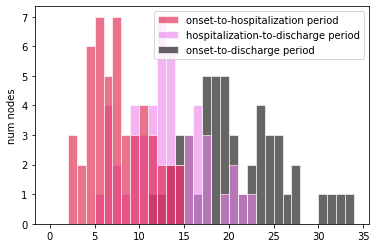

onset-to-hospitalization period:  mean = 7.82, std = 3.34, 95% CI = (2.60, 14.72)

hospitalization-to-death period:  mean = 6.60, std = 3.01, 95% CI = (2.24, 12.84)

onset-to-death period:  mean = 14.42, std = 4.93, 95% CI = (7.31, 27.53)



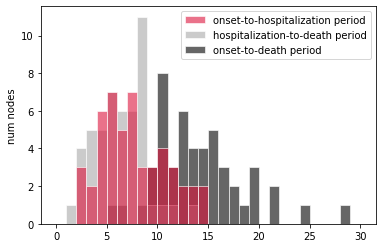

Individual R0:  mean = 1.06, std = 0.19, 95% CI = (0.71, 1.38)



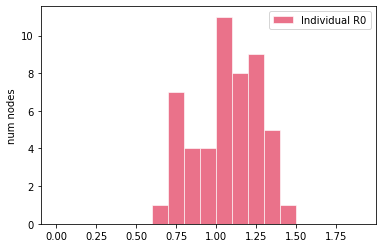

[INTERVENTIONS @ t = 0.08 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.63 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 1 positive (2.04 %) +]
	49	tested TOTAL            [+ 1 positive (2.04 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

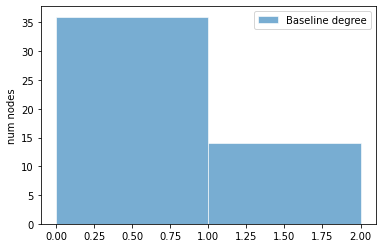

latent period:  mean = 3.29, std = 2.26, 95% CI = (0.67, 7.70)

pre-symptomatic period:  mean = 2.80, std = 1.26, 95% CI = (0.85, 5.47)

total incubation period:  mean = 6.09, std = 2.46, 95% CI = (2.16, 10.74)



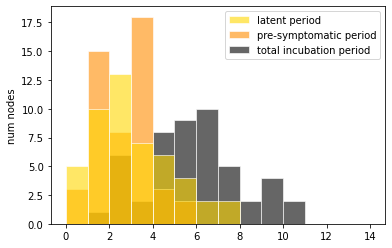

pre-symptomatic period:  mean = 3.29, std = 2.26, 95% CI = (0.67, 7.70)

(a)symptomatic period:  mean = 6.61, std = 2.90, 95% CI = (2.64, 13.33)

total infectious period:  mean = 9.91, std = 3.45, 95% CI = (3.89, 16.96)



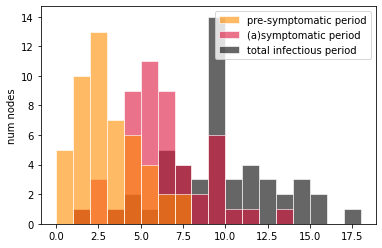

onset-to-hospitalization period:  mean = 8.50, std = 4.15, 95% CI = (3.16, 19.76)

hospitalization-to-discharge period:  mean = 12.45, std = 6.20, 95% CI = (3.13, 23.07)

onset-to-discharge period:  mean = 20.95, std = 6.40, 95% CI = (12.52, 34.47)



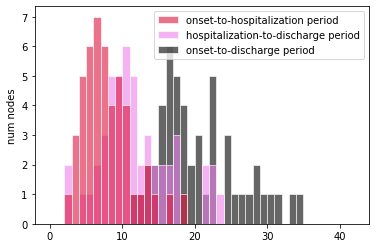

onset-to-hospitalization period:  mean = 8.50, std = 4.15, 95% CI = (3.16, 19.76)

hospitalization-to-death period:  mean = 7.00, std = 3.05, 95% CI = (2.55, 14.27)

onset-to-death period:  mean = 15.51, std = 5.13, 95% CI = (8.79, 25.75)



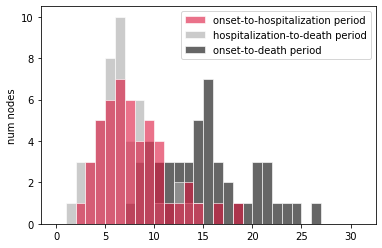

Individual R0:  mean = 1.03, std = 0.23, 95% CI = (0.63, 1.43)



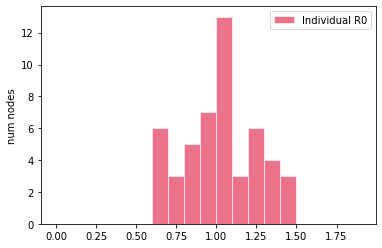

[NEW EXPOSURE @ t = 0.16 (1 exposed)]
[INTERVENTIONS @ t = 0.16 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.03 (6 (12.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 2 positive (4.08 %) +]
	49	tested TOTAL            [+ 2 positive (4.08 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	2 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of 

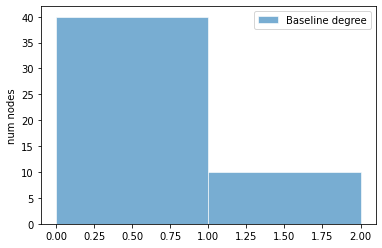

latent period:  mean = 3.55, std = 2.17, 95% CI = (0.84, 8.95)

pre-symptomatic period:  mean = 2.24, std = 1.65, 95% CI = (0.46, 6.64)

total incubation period:  mean = 5.79, std = 2.71, 95% CI = (1.88, 12.49)



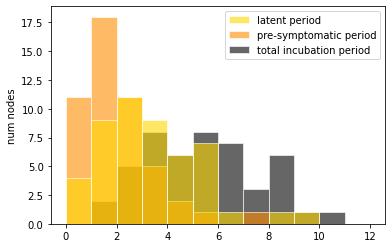

pre-symptomatic period:  mean = 3.55, std = 2.17, 95% CI = (0.84, 8.95)

(a)symptomatic period:  mean = 7.10, std = 3.09, 95% CI = (3.15, 15.32)

total infectious period:  mean = 10.65, std = 3.84, 95% CI = (4.97, 19.33)



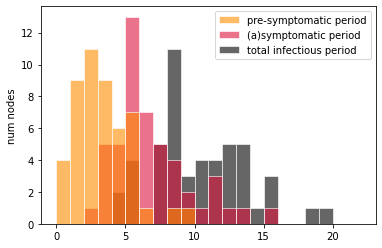

onset-to-hospitalization period:  mean = 7.56, std = 3.35, 95% CI = (2.80, 14.99)

hospitalization-to-discharge period:  mean = 13.17, std = 6.09, 95% CI = (4.59, 27.01)

onset-to-discharge period:  mean = 20.73, std = 6.74, 95% CI = (10.08, 35.81)



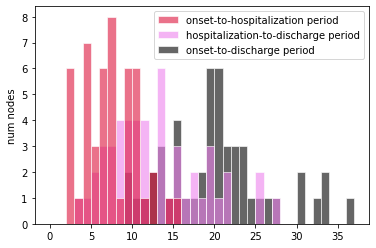

onset-to-hospitalization period:  mean = 7.56, std = 3.35, 95% CI = (2.80, 14.99)

hospitalization-to-death period:  mean = 6.96, std = 3.57, 95% CI = (2.26, 15.22)

onset-to-death period:  mean = 14.52, std = 4.66, 95% CI = (5.29, 23.16)



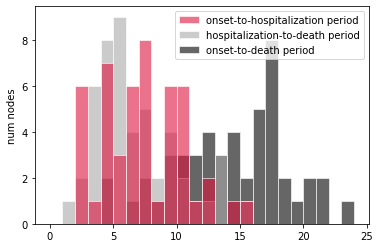

Individual R0:  mean = 0.97, std = 0.20, 95% CI = (0.63, 1.34)



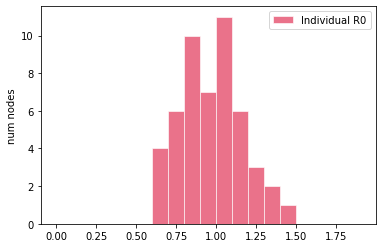

[INTERVENTIONS @ t = 0.47 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.51 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 2 positive (4.08 %) +]
	49	tested TOTAL            [+ 2 positive (4.08 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	2 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

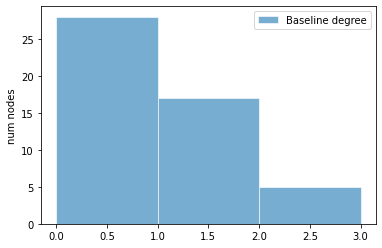

latent period:  mean = 3.74, std = 2.39, 95% CI = (0.96, 9.69)

pre-symptomatic period:  mean = 2.64, std = 1.68, 95% CI = (0.41, 6.65)

total incubation period:  mean = 6.38, std = 2.86, 95% CI = (2.42, 12.88)



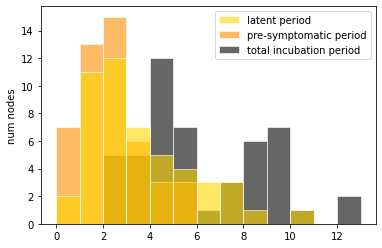

pre-symptomatic period:  mean = 3.74, std = 2.39, 95% CI = (0.96, 9.69)

(a)symptomatic period:  mean = 6.34, std = 2.37, 95% CI = (2.42, 11.50)

total infectious period:  mean = 10.08, std = 3.78, 95% CI = (4.66, 17.19)



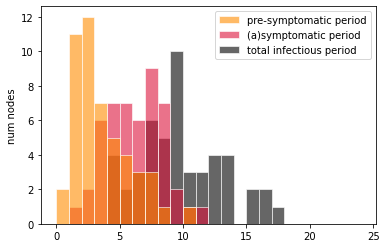

onset-to-hospitalization period:  mean = 7.31, std = 2.89, 95% CI = (2.57, 14.31)

hospitalization-to-discharge period:  mean = 13.32, std = 6.03, 95% CI = (4.02, 25.86)

onset-to-discharge period:  mean = 20.63, std = 6.29, 95% CI = (11.63, 32.74)



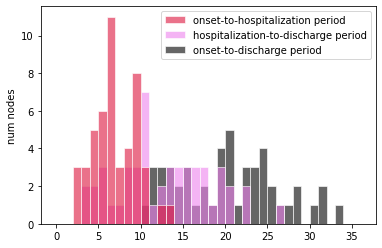

onset-to-hospitalization period:  mean = 7.31, std = 2.89, 95% CI = (2.57, 14.31)

hospitalization-to-death period:  mean = 7.23, std = 2.96, 95% CI = (2.75, 12.48)

onset-to-death period:  mean = 14.54, std = 4.36, 95% CI = (7.09, 23.03)



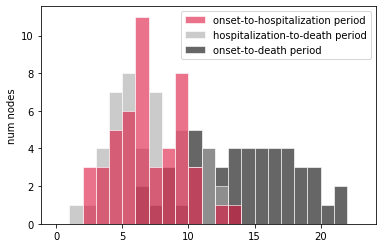

Individual R0:  mean = 1.00, std = 0.19, 95% CI = (0.68, 1.36)



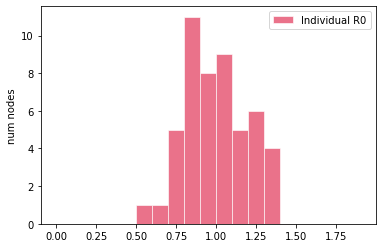

[INTERVENTIONS @ t = 0.58 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.59 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 0 positive (0.00 %) +]
	49	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

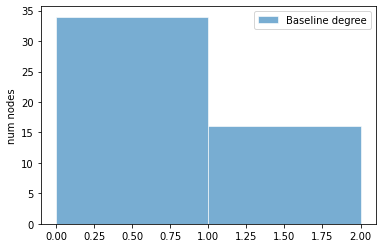

latent period:  mean = 3.71, std = 1.82, 95% CI = (0.88, 7.36)

pre-symptomatic period:  mean = 2.41, std = 1.60, 95% CI = (0.40, 4.55)

total incubation period:  mean = 6.12, std = 2.57, 95% CI = (2.05, 10.46)



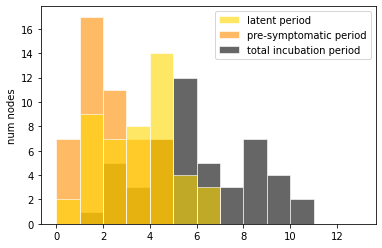

pre-symptomatic period:  mean = 3.71, std = 1.82, 95% CI = (0.88, 7.36)

(a)symptomatic period:  mean = 6.16, std = 2.33, 95% CI = (1.96, 9.49)

total infectious period:  mean = 9.87, std = 2.90, 95% CI = (3.88, 14.68)



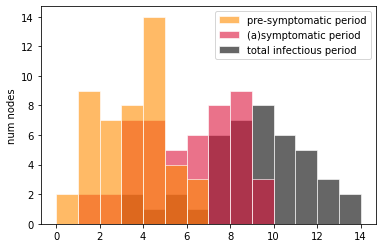

onset-to-hospitalization period:  mean = 7.83, std = 2.76, 95% CI = (1.67, 13.28)

hospitalization-to-discharge period:  mean = 13.34, std = 6.29, 95% CI = (4.34, 27.10)

onset-to-discharge period:  mean = 21.17, std = 6.96, 95% CI = (8.75, 36.28)



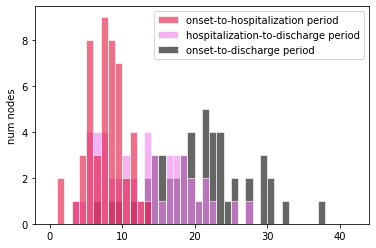

onset-to-hospitalization period:  mean = 7.83, std = 2.76, 95% CI = (1.67, 13.28)

hospitalization-to-death period:  mean = 7.28, std = 3.68, 95% CI = (1.84, 15.71)

onset-to-death period:  mean = 15.11, std = 4.40, 95% CI = (6.57, 23.52)



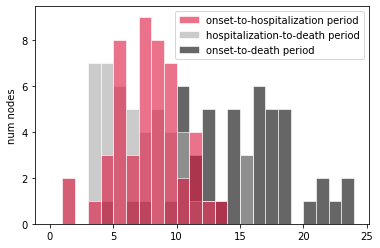

Individual R0:  mean = 1.01, std = 0.17, 95% CI = (0.70, 1.30)



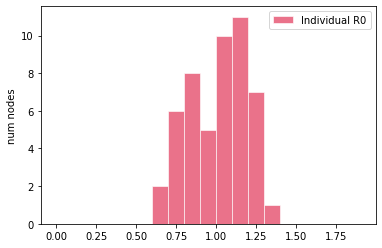

[INTERVENTIONS @ t = 0.01 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.10 (5 (10.00%) infected)]
	1	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 2 positive (4.08 %) +]
	50	tested TOTAL            [+ 2 positive (4.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	2 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

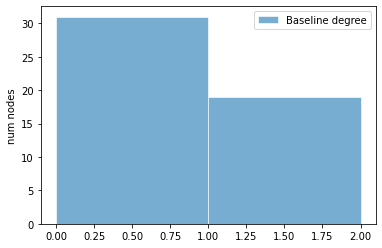

latent period:  mean = 3.52, std = 1.92, 95% CI = (0.91, 7.77)

pre-symptomatic period:  mean = 2.87, std = 1.85, 95% CI = (0.35, 6.78)

total incubation period:  mean = 6.39, std = 2.72, 95% CI = (1.80, 11.88)



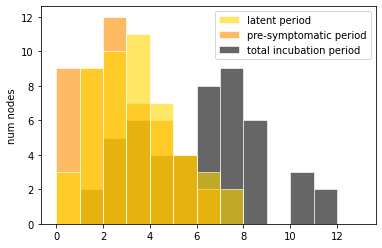

pre-symptomatic period:  mean = 3.52, std = 1.92, 95% CI = (0.91, 7.77)

(a)symptomatic period:  mean = 6.47, std = 2.71, 95% CI = (2.55, 10.71)

total infectious period:  mean = 9.99, std = 2.81, 95% CI = (5.84, 16.23)



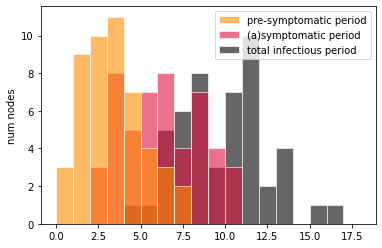

onset-to-hospitalization period:  mean = 8.12, std = 3.67, 95% CI = (1.97, 14.54)

hospitalization-to-discharge period:  mean = 12.12, std = 5.24, 95% CI = (3.57, 25.00)

onset-to-discharge period:  mean = 20.23, std = 6.21, 95% CI = (10.65, 35.00)



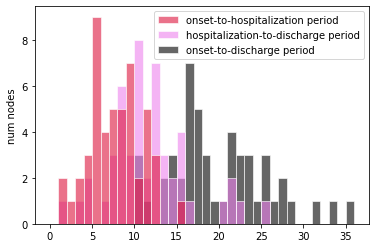

onset-to-hospitalization period:  mean = 8.12, std = 3.67, 95% CI = (1.97, 14.54)

hospitalization-to-death period:  mean = 7.22, std = 3.02, 95% CI = (2.96, 14.72)

onset-to-death period:  mean = 15.34, std = 4.65, 95% CI = (8.36, 25.39)



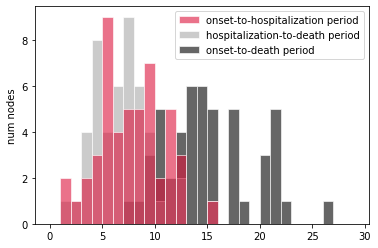

Individual R0:  mean = 1.02, std = 0.18, 95% CI = (0.72, 1.36)



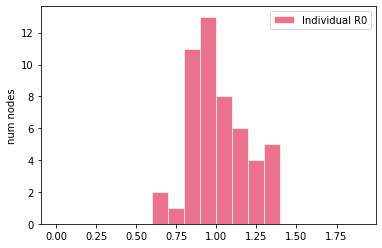

[INTERVENTIONS @ t = 0.41 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.58 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 0 positive (0.00 %) +]
	49	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

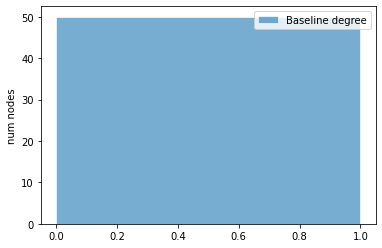

latent period:  mean = 3.61, std = 2.67, 95% CI = (0.79, 10.81)

pre-symptomatic period:  mean = 2.49, std = 1.33, 95% CI = (0.53, 4.80)

total incubation period:  mean = 6.10, std = 3.06, 95% CI = (2.25, 15.00)



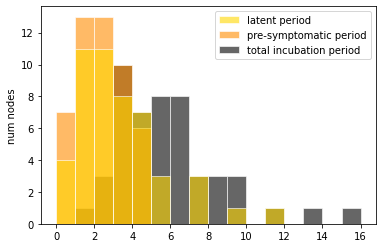

pre-symptomatic period:  mean = 3.61, std = 2.67, 95% CI = (0.79, 10.81)

(a)symptomatic period:  mean = 6.44, std = 2.42, 95% CI = (2.29, 11.21)

total infectious period:  mean = 10.06, std = 3.13, 95% CI = (5.04, 15.57)



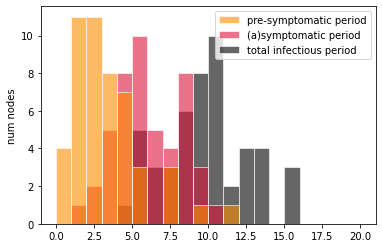

onset-to-hospitalization period:  mean = 8.20, std = 4.01, 95% CI = (2.63, 17.82)

hospitalization-to-discharge period:  mean = 14.35, std = 5.74, 95% CI = (6.42, 26.61)

onset-to-discharge period:  mean = 22.55, std = 6.72, 95% CI = (11.49, 36.23)



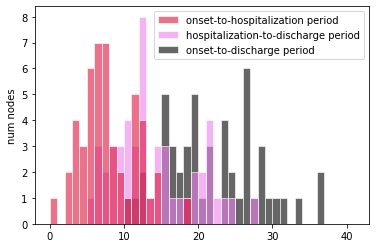

onset-to-hospitalization period:  mean = 8.20, std = 4.01, 95% CI = (2.63, 17.82)

hospitalization-to-death period:  mean = 7.86, std = 3.24, 95% CI = (3.26, 16.07)

onset-to-death period:  mean = 16.05, std = 4.47, 95% CI = (8.52, 24.32)



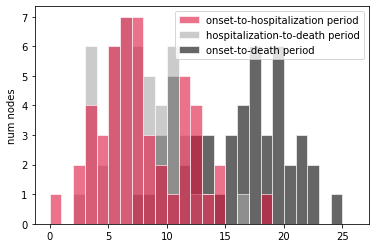

Individual R0:  mean = 1.05, std = 0.21, 95% CI = (0.70, 1.43)



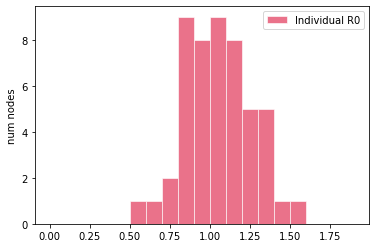

[INTERVENTIONS @ t = 0.27 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 0 positive (0.00 %) +]
	50	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.38 (5 (10.00%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 3 positive (6.12 %) +]
	50	tested TOTAL            [+ 4 positive (8.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	4 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTER

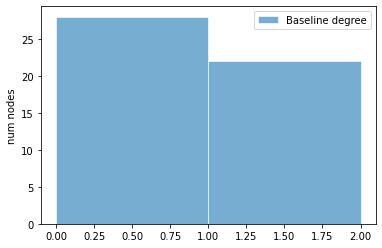

latent period:  mean = 3.68, std = 1.91, 95% CI = (1.10, 7.96)

pre-symptomatic period:  mean = 2.11, std = 1.41, 95% CI = (0.36, 4.70)

total incubation period:  mean = 5.79, std = 2.44, 95% CI = (1.86, 10.58)



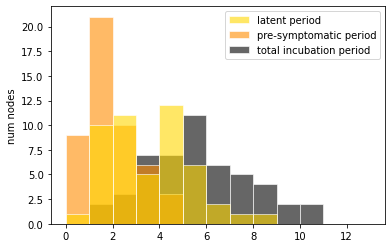

pre-symptomatic period:  mean = 3.68, std = 1.91, 95% CI = (1.10, 7.96)

(a)symptomatic period:  mean = 6.24, std = 2.68, 95% CI = (2.23, 12.87)

total infectious period:  mean = 9.92, std = 3.21, 95% CI = (5.69, 17.71)



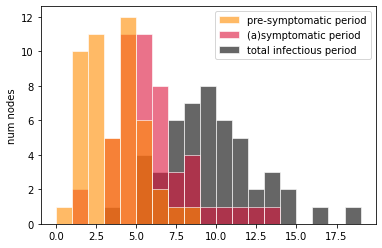

onset-to-hospitalization period:  mean = 8.81, std = 4.13, 95% CI = (3.50, 18.21)

hospitalization-to-discharge period:  mean = 14.38, std = 7.62, 95% CI = (5.10, 28.10)

onset-to-discharge period:  mean = 23.19, std = 9.47, 95% CI = (10.48, 39.72)



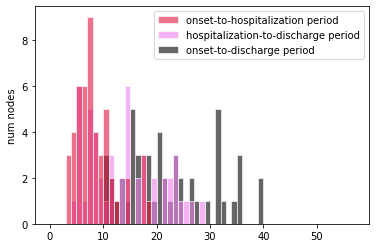

onset-to-hospitalization period:  mean = 8.81, std = 4.13, 95% CI = (3.50, 18.21)

hospitalization-to-death period:  mean = 6.42, std = 3.19, 95% CI = (2.23, 14.41)

onset-to-death period:  mean = 15.23, std = 5.21, 95% CI = (7.24, 26.91)



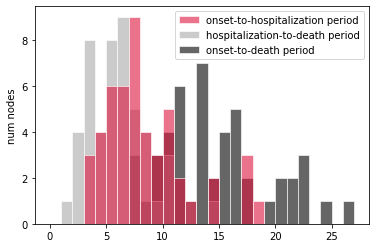

Individual R0:  mean = 1.00, std = 0.19, 95% CI = (0.67, 1.39)



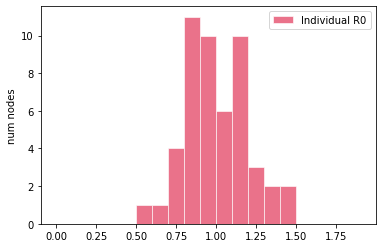

[INTERVENTIONS @ t = 0.06 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.31 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 3 positive (6.12 %) +]
	49	tested TOTAL            [+ 3 positive (6.12 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	3 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

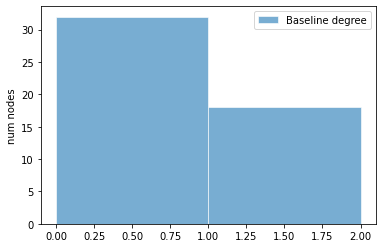

latent period:  mean = 3.14, std = 1.97, 95% CI = (0.48, 7.74)

pre-symptomatic period:  mean = 2.13, std = 1.46, 95% CI = (0.41, 5.60)

total incubation period:  mean = 5.27, std = 2.27, 95% CI = (1.98, 10.10)



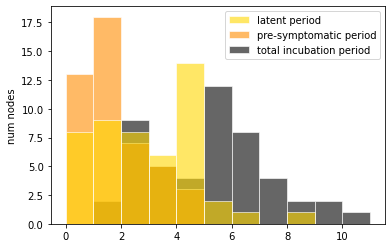

pre-symptomatic period:  mean = 3.14, std = 1.97, 95% CI = (0.48, 7.74)

(a)symptomatic period:  mean = 6.27, std = 2.42, 95% CI = (2.58, 11.45)

total infectious period:  mean = 9.41, std = 3.10, 95% CI = (3.92, 15.49)



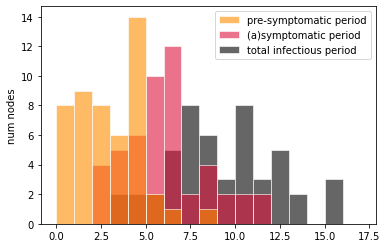

onset-to-hospitalization period:  mean = 7.03, std = 3.43, 95% CI = (2.69, 13.49)

hospitalization-to-discharge period:  mean = 15.13, std = 4.71, 95% CI = (6.63, 23.72)

onset-to-discharge period:  mean = 22.16, std = 5.75, 95% CI = (13.45, 32.99)



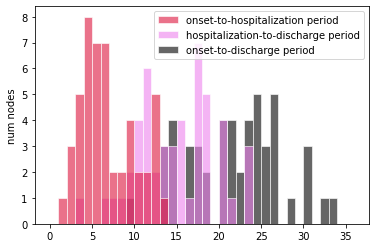

onset-to-hospitalization period:  mean = 7.03, std = 3.43, 95% CI = (2.69, 13.49)

hospitalization-to-death period:  mean = 6.46, std = 2.98, 95% CI = (1.98, 13.81)

onset-to-death period:  mean = 13.49, std = 5.04, 95% CI = (4.27, 23.36)



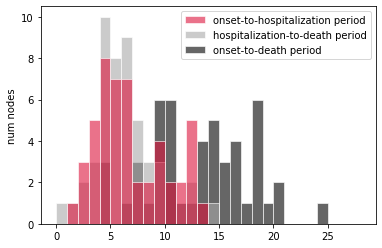

Individual R0:  mean = 1.02, std = 0.21, 95% CI = (0.71, 1.46)



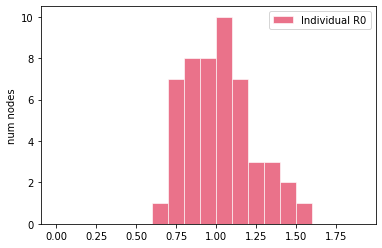

[INTERVENTIONS @ t = 0.30 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.27 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 1 positive (2.04 %) +]
	49	tested TOTAL            [+ 1 positive (2.04 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

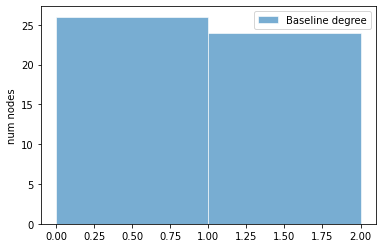

latent period:  mean = 3.51, std = 2.14, 95% CI = (0.82, 8.42)

pre-symptomatic period:  mean = 2.67, std = 1.71, 95% CI = (0.84, 6.85)

total incubation period:  mean = 6.18, std = 2.73, 95% CI = (2.34, 12.12)



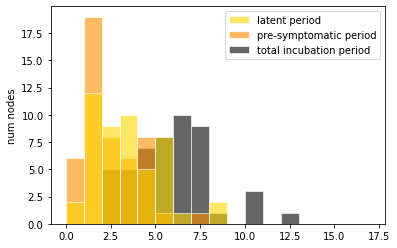

pre-symptomatic period:  mean = 3.51, std = 2.14, 95% CI = (0.82, 8.42)

(a)symptomatic period:  mean = 6.96, std = 2.42, 95% CI = (2.68, 11.75)

total infectious period:  mean = 10.47, std = 3.10, 95% CI = (5.74, 17.07)



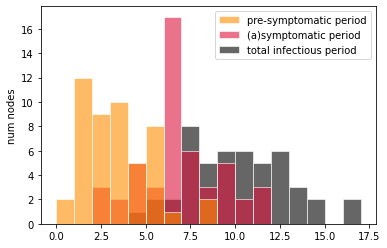

onset-to-hospitalization period:  mean = 7.82, std = 2.82, 95% CI = (3.54, 14.58)

hospitalization-to-discharge period:  mean = 13.49, std = 7.81, 95% CI = (3.82, 31.96)

onset-to-discharge period:  mean = 21.31, std = 8.38, 95% CI = (10.35, 43.02)



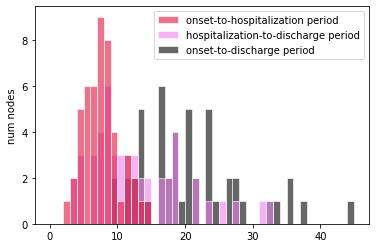

onset-to-hospitalization period:  mean = 7.82, std = 2.82, 95% CI = (3.54, 14.58)

hospitalization-to-death period:  mean = 6.83, std = 2.60, 95% CI = (3.17, 12.58)

onset-to-death period:  mean = 14.64, std = 3.79, 95% CI = (9.08, 21.96)



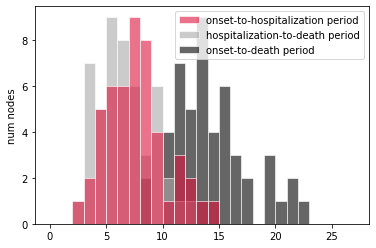

Individual R0:  mean = 0.96, std = 0.20, 95% CI = (0.70, 1.42)



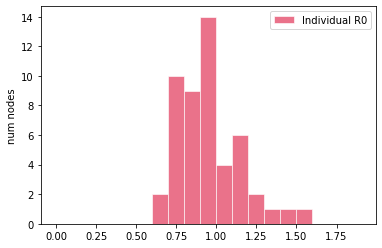

[INTERVENTIONS @ t = 0.03 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 0 positive (0.00 %) +]
	50	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.40 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 5 positive (10.00 %) +]
	50	tested TOTAL            [+ 5 positive (10.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	5 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTER

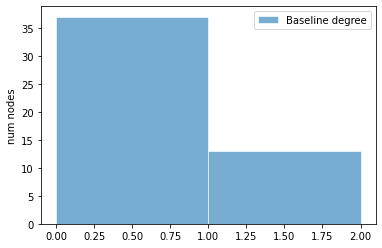

latent period:  mean = 3.88, std = 2.13, 95% CI = (0.92, 8.35)

pre-symptomatic period:  mean = 2.73, std = 1.46, 95% CI = (0.36, 5.47)

total incubation period:  mean = 6.61, std = 2.46, 95% CI = (2.56, 11.46)



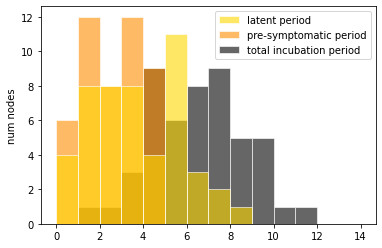

pre-symptomatic period:  mean = 3.88, std = 2.13, 95% CI = (0.92, 8.35)

(a)symptomatic period:  mean = 6.37, std = 2.33, 95% CI = (2.39, 10.72)

total infectious period:  mean = 10.25, std = 3.23, 95% CI = (5.46, 18.68)



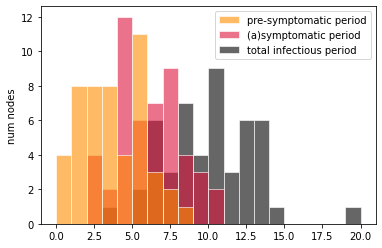

onset-to-hospitalization period:  mean = 7.65, std = 3.33, 95% CI = (1.33, 13.05)

hospitalization-to-discharge period:  mean = 13.31, std = 6.90, 95% CI = (4.30, 32.27)

onset-to-discharge period:  mean = 20.96, std = 7.59, 95% CI = (11.11, 38.53)



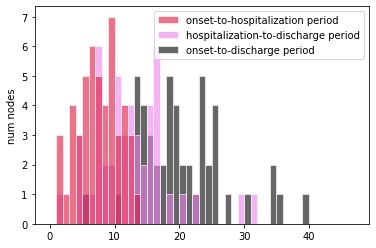

onset-to-hospitalization period:  mean = 7.65, std = 3.33, 95% CI = (1.33, 13.05)

hospitalization-to-death period:  mean = 7.92, std = 3.62, 95% CI = (2.59, 16.20)

onset-to-death period:  mean = 15.57, std = 3.95, 95% CI = (9.50, 23.59)



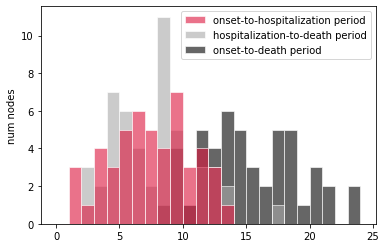

Individual R0:  mean = 0.98, std = 0.20, 95% CI = (0.67, 1.37)



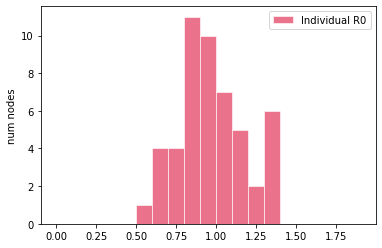

[INTERVENTIONS @ t = 0.92 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 0 positive (0.00 %) +]
	50	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[NEW EXPOSURE @ t = 1.74 (1 exposed)]
[INTERVENTIONS @ t = 1.74 (5 (10.00%) infected)]
	1	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 1 positive (2.04 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of 

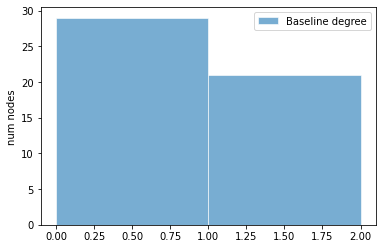

latent period:  mean = 3.91, std = 2.42, 95% CI = (0.76, 8.35)

pre-symptomatic period:  mean = 2.39, std = 1.41, 95% CI = (0.52, 5.40)

total incubation period:  mean = 6.30, std = 3.15, 95% CI = (2.44, 15.22)



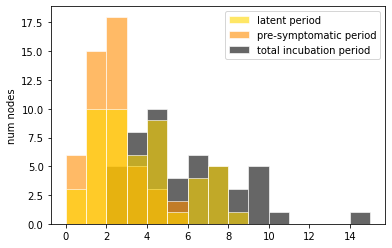

pre-symptomatic period:  mean = 3.91, std = 2.42, 95% CI = (0.76, 8.35)

(a)symptomatic period:  mean = 7.03, std = 2.82, 95% CI = (2.96, 13.18)

total infectious period:  mean = 10.93, std = 3.83, 95% CI = (4.94, 19.08)



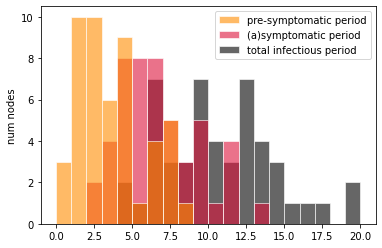

onset-to-hospitalization period:  mean = 7.35, std = 3.36, 95% CI = (2.67, 14.28)

hospitalization-to-discharge period:  mean = 13.20, std = 4.74, 95% CI = (5.86, 22.45)

onset-to-discharge period:  mean = 20.55, std = 6.16, 95% CI = (9.85, 30.97)



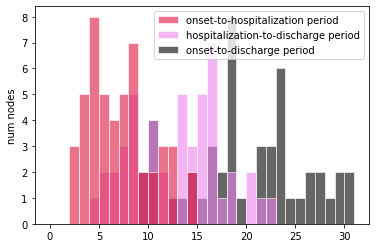

onset-to-hospitalization period:  mean = 7.35, std = 3.36, 95% CI = (2.67, 14.28)

hospitalization-to-death period:  mean = 7.66, std = 3.53, 95% CI = (2.88, 15.00)

onset-to-death period:  mean = 15.01, std = 4.89, 95% CI = (7.85, 25.24)



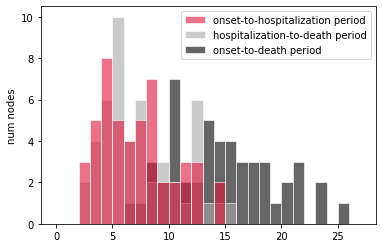

Individual R0:  mean = 0.99, std = 0.23, 95% CI = (0.61, 1.40)



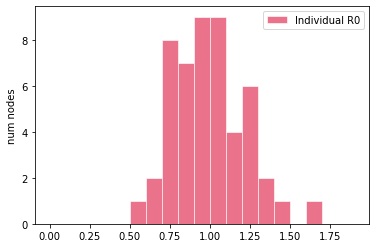

[INTERVENTIONS @ t = 0.79 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.45 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 1 positive (2.04 %) +]
	49	tested TOTAL            [+ 1 positive (2.04 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

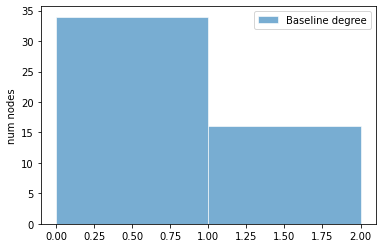

latent period:  mean = 3.39, std = 1.81, 95% CI = (1.18, 7.27)

pre-symptomatic period:  mean = 2.37, std = 1.29, 95% CI = (0.64, 5.63)

total incubation period:  mean = 5.77, std = 2.17, 95% CI = (2.41, 10.59)



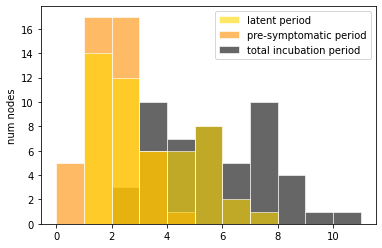

pre-symptomatic period:  mean = 3.39, std = 1.81, 95% CI = (1.18, 7.27)

(a)symptomatic period:  mean = 6.90, std = 2.57, 95% CI = (3.03, 11.53)

total infectious period:  mean = 10.29, std = 3.24, 95% CI = (4.77, 16.16)



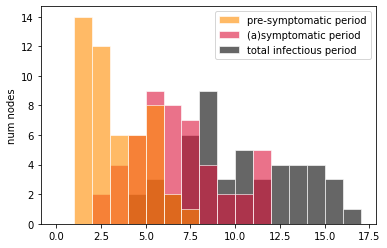

onset-to-hospitalization period:  mean = 8.22, std = 3.62, 95% CI = (2.83, 18.16)

hospitalization-to-discharge period:  mean = 13.48, std = 5.46, 95% CI = (5.22, 24.29)

onset-to-discharge period:  mean = 21.71, std = 6.55, 95% CI = (12.66, 33.20)



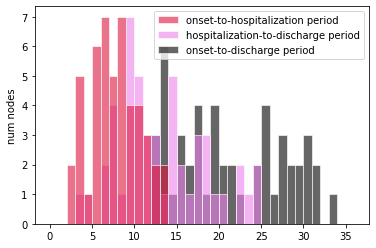

onset-to-hospitalization period:  mean = 8.22, std = 3.62, 95% CI = (2.83, 18.16)

hospitalization-to-death period:  mean = 7.54, std = 3.79, 95% CI = (2.19, 15.45)

onset-to-death period:  mean = 15.76, std = 5.25, 95% CI = (8.45, 28.97)



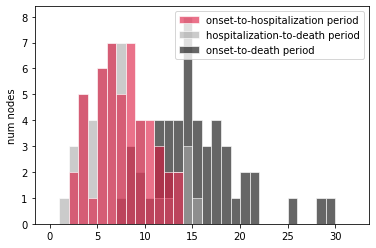

Individual R0:  mean = 1.04, std = 0.18, 95% CI = (0.75, 1.49)



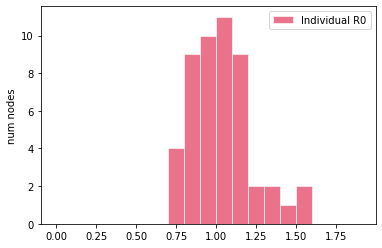

[INTERVENTIONS @ t = 0.02 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.17 (6 (12.00%) infected)]
	1	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 0 positive (0.00 %) +]
	50	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[NEW EXP

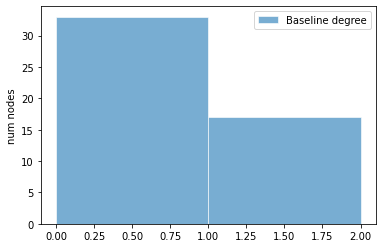

latent period:  mean = 3.69, std = 1.89, 95% CI = (0.93, 7.78)

pre-symptomatic period:  mean = 2.73, std = 1.72, 95% CI = (0.57, 5.16)

total incubation period:  mean = 6.42, std = 2.32, 95% CI = (2.16, 9.61)



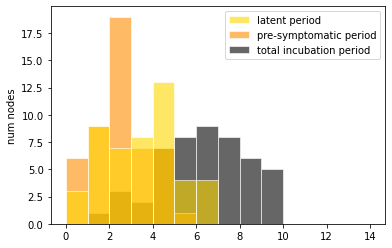

pre-symptomatic period:  mean = 3.69, std = 1.89, 95% CI = (0.93, 7.78)

(a)symptomatic period:  mean = 6.08, std = 2.62, 95% CI = (2.50, 12.81)

total infectious period:  mean = 9.76, std = 2.97, 95% CI = (4.87, 16.57)



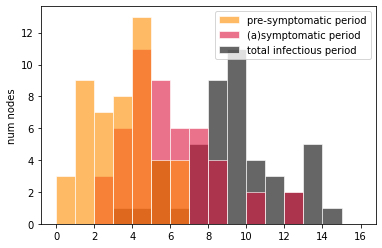

onset-to-hospitalization period:  mean = 7.30, std = 2.91, 95% CI = (2.54, 12.82)

hospitalization-to-discharge period:  mean = 14.41, std = 6.16, 95% CI = (5.70, 28.76)

onset-to-discharge period:  mean = 21.72, std = 7.24, 95% CI = (10.21, 36.60)



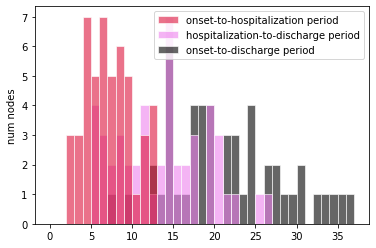

onset-to-hospitalization period:  mean = 7.30, std = 2.91, 95% CI = (2.54, 12.82)

hospitalization-to-death period:  mean = 7.18, std = 2.41, 95% CI = (2.94, 12.04)

onset-to-death period:  mean = 14.49, std = 3.76, 95% CI = (8.33, 23.14)



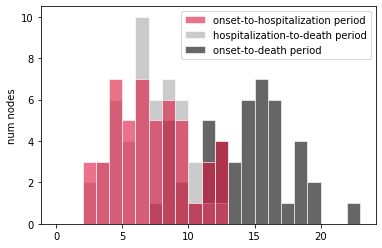

Individual R0:  mean = 1.00, std = 0.20, 95% CI = (0.70, 1.38)



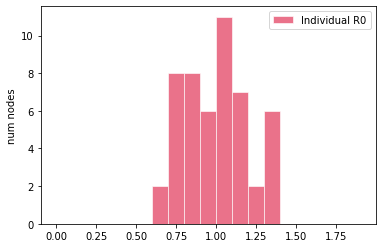

[INTERVENTIONS @ t = 1.05 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 3.18 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 1 positive (2.04 %) +]
	49	tested TOTAL            [+ 1 positive (2.04 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

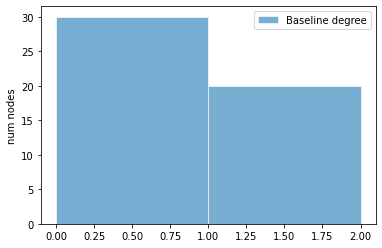

latent period:  mean = 3.43, std = 1.66, 95% CI = (0.63, 6.43)

pre-symptomatic period:  mean = 2.73, std = 1.46, 95% CI = (0.87, 6.35)

total incubation period:  mean = 6.16, std = 2.03, 95% CI = (2.81, 10.71)



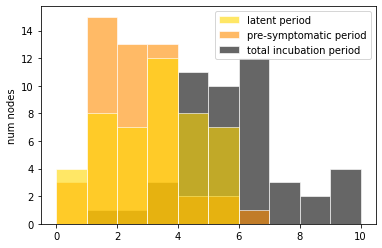

pre-symptomatic period:  mean = 3.43, std = 1.66, 95% CI = (0.63, 6.43)

(a)symptomatic period:  mean = 6.54, std = 2.78, 95% CI = (2.66, 12.67)

total infectious period:  mean = 9.97, std = 3.08, 95% CI = (4.53, 15.94)



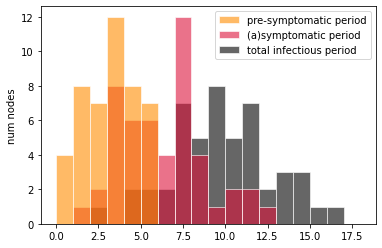

onset-to-hospitalization period:  mean = 8.66, std = 3.48, 95% CI = (3.56, 16.45)

hospitalization-to-discharge period:  mean = 15.41, std = 6.27, 95% CI = (4.29, 28.60)

onset-to-discharge period:  mean = 24.07, std = 6.10, 95% CI = (14.39, 36.42)



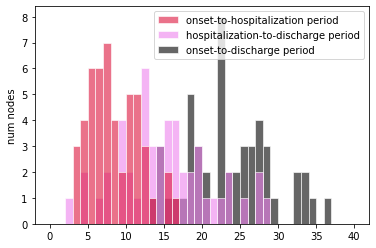

onset-to-hospitalization period:  mean = 8.66, std = 3.48, 95% CI = (3.56, 16.45)

hospitalization-to-death period:  mean = 6.94, std = 3.04, 95% CI = (1.84, 12.61)

onset-to-death period:  mean = 15.61, std = 5.02, 95% CI = (8.60, 23.80)



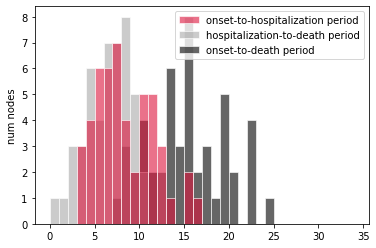

Individual R0:  mean = 1.00, std = 0.19, 95% CI = (0.70, 1.41)



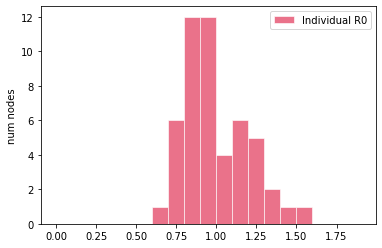

[INTERVENTIONS @ t = 0.17 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.07 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

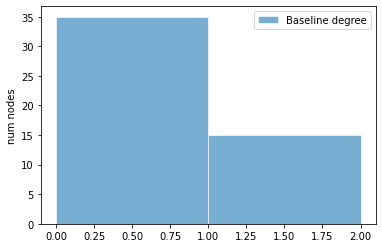

latent period:  mean = 3.44, std = 1.99, 95% CI = (0.71, 8.10)

pre-symptomatic period:  mean = 2.28, std = 1.27, 95% CI = (0.37, 4.65)

total incubation period:  mean = 5.72, std = 2.21, 95% CI = (2.55, 10.16)



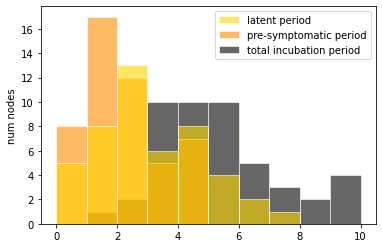

pre-symptomatic period:  mean = 3.44, std = 1.99, 95% CI = (0.71, 8.10)

(a)symptomatic period:  mean = 7.00, std = 3.20, 95% CI = (3.12, 13.58)

total infectious period:  mean = 10.45, std = 4.27, 95% CI = (4.61, 20.59)



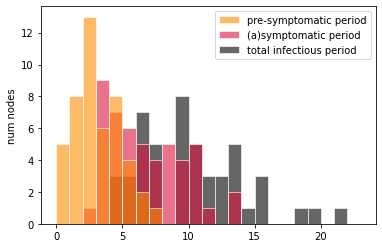

onset-to-hospitalization period:  mean = 9.09, std = 3.04, 95% CI = (3.72, 14.50)

hospitalization-to-discharge period:  mean = 13.01, std = 5.00, 95% CI = (6.81, 24.59)

onset-to-discharge period:  mean = 22.10, std = 5.79, 95% CI = (11.94, 34.55)



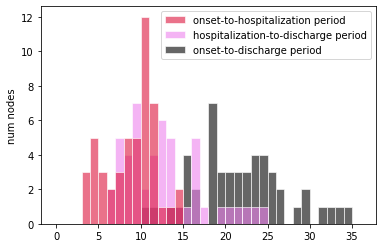

onset-to-hospitalization period:  mean = 9.09, std = 3.04, 95% CI = (3.72, 14.50)

hospitalization-to-death period:  mean = 6.69, std = 3.50, 95% CI = (2.06, 13.66)

onset-to-death period:  mean = 15.78, std = 4.37, 95% CI = (8.19, 24.56)



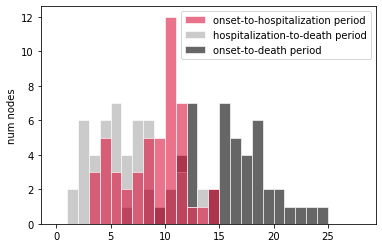

Individual R0:  mean = 1.01, std = 0.16, 95% CI = (0.74, 1.35)



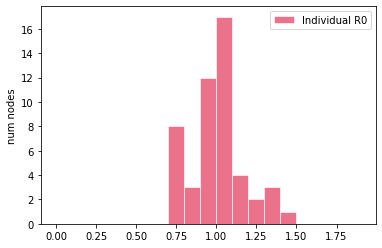

[INTERVENTIONS @ t = 0.06 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 3.07 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

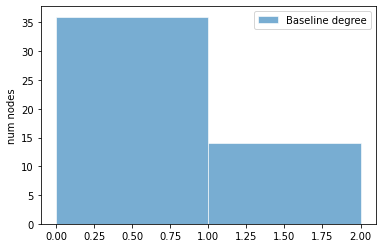

latent period:  mean = 3.44, std = 1.89, 95% CI = (1.32, 6.52)

pre-symptomatic period:  mean = 2.77, std = 1.66, 95% CI = (0.49, 6.09)

total incubation period:  mean = 6.21, std = 2.41, 95% CI = (2.63, 10.92)



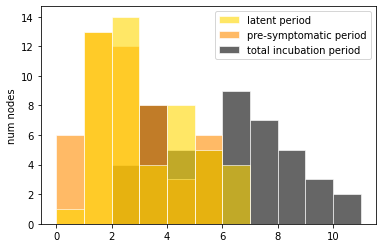

pre-symptomatic period:  mean = 3.44, std = 1.89, 95% CI = (1.32, 6.52)

(a)symptomatic period:  mean = 6.43, std = 2.55, 95% CI = (2.38, 10.80)

total infectious period:  mean = 9.87, std = 3.09, 95% CI = (4.97, 16.77)



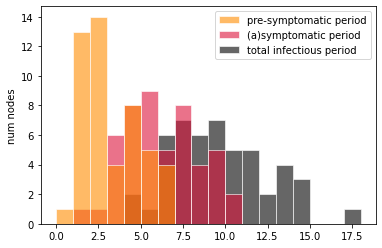

onset-to-hospitalization period:  mean = 7.33, std = 3.61, 95% CI = (2.23, 15.04)

hospitalization-to-discharge period:  mean = 12.70, std = 4.94, 95% CI = (4.95, 23.68)

onset-to-discharge period:  mean = 20.03, std = 5.69, 95% CI = (10.33, 30.21)



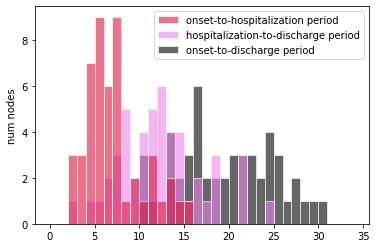

onset-to-hospitalization period:  mean = 7.33, std = 3.61, 95% CI = (2.23, 15.04)

hospitalization-to-death period:  mean = 7.03, std = 3.12, 95% CI = (2.75, 13.74)

onset-to-death period:  mean = 14.36, std = 5.25, 95% CI = (7.27, 26.74)



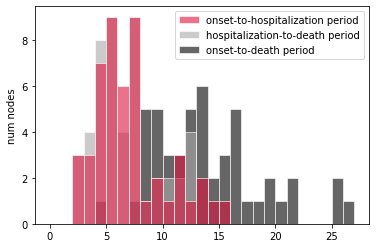

Individual R0:  mean = 0.97, std = 0.19, 95% CI = (0.70, 1.35)



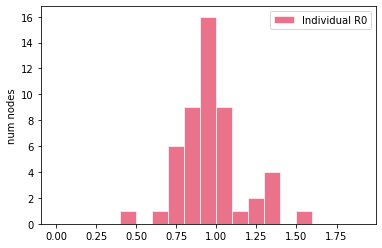

[INTERVENTIONS @ t = 0.24 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 0 positive (0.00 %) +]
	50	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 4.20 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENT

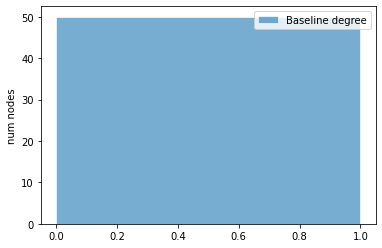

latent period:  mean = 4.02, std = 2.20, 95% CI = (0.97, 9.63)

pre-symptomatic period:  mean = 2.63, std = 1.45, 95% CI = (0.60, 5.61)

total incubation period:  mean = 6.65, std = 2.44, 95% CI = (1.99, 11.90)



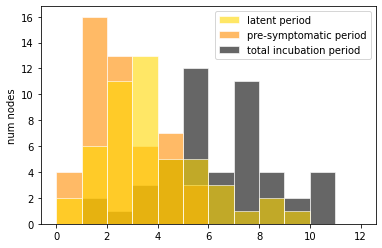

pre-symptomatic period:  mean = 4.02, std = 2.20, 95% CI = (0.97, 9.63)

(a)symptomatic period:  mean = 6.28, std = 2.72, 95% CI = (2.86, 13.17)

total infectious period:  mean = 10.30, std = 3.57, 95% CI = (5.37, 18.33)



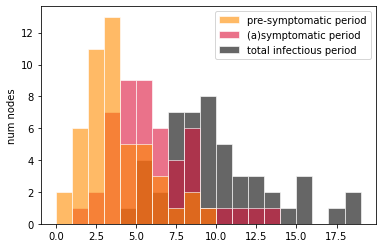

onset-to-hospitalization period:  mean = 7.81, std = 3.22, 95% CI = (3.18, 15.51)

hospitalization-to-discharge period:  mean = 13.93, std = 5.87, 95% CI = (6.10, 30.01)

onset-to-discharge period:  mean = 21.74, std = 6.77, 95% CI = (11.88, 36.59)



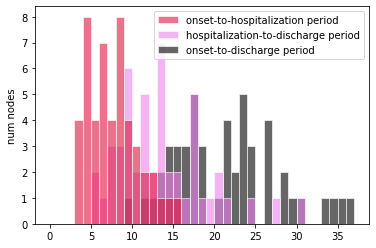

onset-to-hospitalization period:  mean = 7.81, std = 3.22, 95% CI = (3.18, 15.51)

hospitalization-to-death period:  mean = 6.88, std = 2.66, 95% CI = (2.90, 12.52)

onset-to-death period:  mean = 14.69, std = 4.46, 95% CI = (7.55, 25.23)



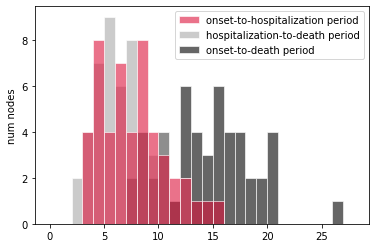

Individual R0:  mean = 0.99, std = 0.18, 95% CI = (0.68, 1.31)



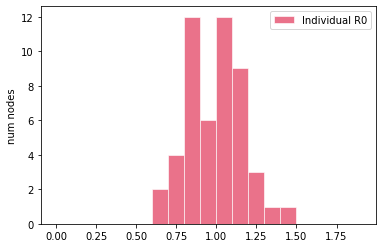

[INTERVENTIONS @ t = 0.14 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 3.71 (5 (10.00%) infected)]
	1	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

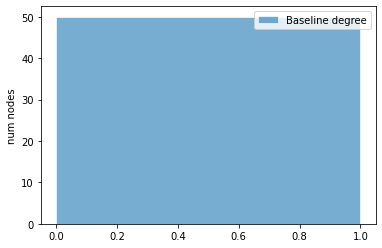

latent period:  mean = 3.17, std = 2.02, 95% CI = (0.36, 8.03)

pre-symptomatic period:  mean = 2.70, std = 1.67, 95% CI = (0.37, 6.35)

total incubation period:  mean = 5.87, std = 2.65, 95% CI = (1.68, 11.29)



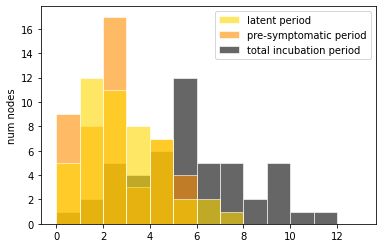

pre-symptomatic period:  mean = 3.17, std = 2.02, 95% CI = (0.36, 8.03)

(a)symptomatic period:  mean = 6.34, std = 2.56, 95% CI = (2.56, 12.09)

total infectious period:  mean = 9.52, std = 3.57, 95% CI = (4.76, 16.40)



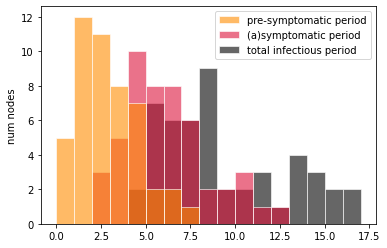

onset-to-hospitalization period:  mean = 8.20, std = 3.72, 95% CI = (2.32, 15.78)

hospitalization-to-discharge period:  mean = 14.81, std = 6.32, 95% CI = (5.44, 27.33)

onset-to-discharge period:  mean = 23.01, std = 7.85, 95% CI = (11.91, 37.89)



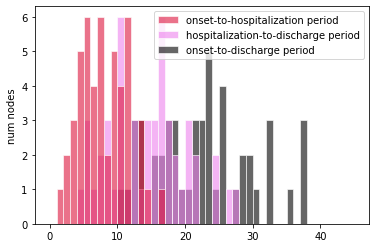

onset-to-hospitalization period:  mean = 8.20, std = 3.72, 95% CI = (2.32, 15.78)

hospitalization-to-death period:  mean = 6.79, std = 2.74, 95% CI = (3.07, 13.01)

onset-to-death period:  mean = 14.99, std = 4.83, 95% CI = (6.91, 25.92)



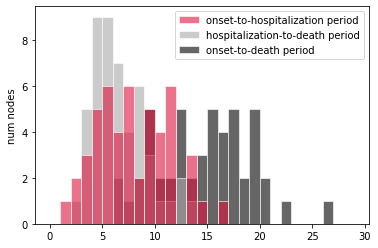

Individual R0:  mean = 1.03, std = 0.20, 95% CI = (0.68, 1.41)



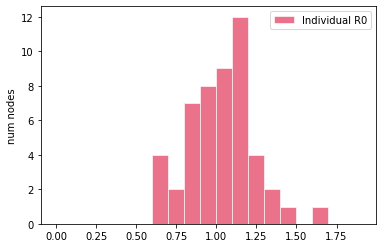

[INTERVENTIONS @ t = 0.20 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.10 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

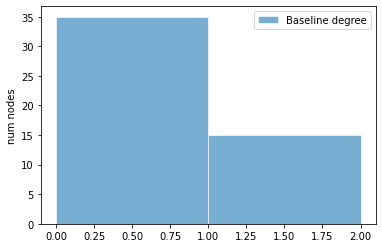

latent period:  mean = 3.58, std = 2.16, 95% CI = (0.60, 6.85)

pre-symptomatic period:  mean = 2.46, std = 1.08, 95% CI = (0.67, 4.18)

total incubation period:  mean = 6.04, std = 2.33, 95% CI = (1.99, 10.21)



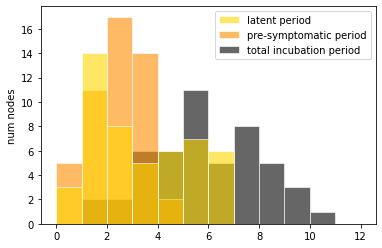

pre-symptomatic period:  mean = 3.58, std = 2.16, 95% CI = (0.60, 6.85)

(a)symptomatic period:  mean = 6.59, std = 2.75, 95% CI = (2.53, 12.39)

total infectious period:  mean = 10.16, std = 3.63, 95% CI = (3.90, 18.20)



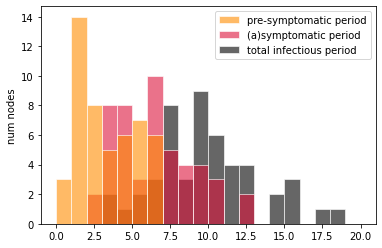

onset-to-hospitalization period:  mean = 8.03, std = 4.11, 95% CI = (1.40, 18.23)

hospitalization-to-discharge period:  mean = 14.37, std = 5.75, 95% CI = (5.88, 26.84)

onset-to-discharge period:  mean = 22.41, std = 7.53, 95% CI = (9.83, 39.14)



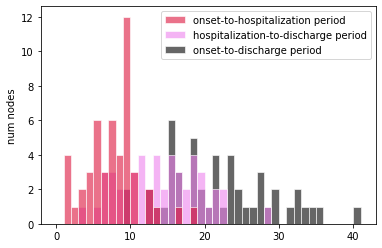

onset-to-hospitalization period:  mean = 8.03, std = 4.11, 95% CI = (1.40, 18.23)

hospitalization-to-death period:  mean = 7.27, std = 3.19, 95% CI = (2.76, 13.07)

onset-to-death period:  mean = 15.31, std = 5.57, 95% CI = (4.57, 27.52)



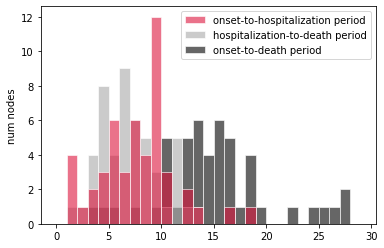

Individual R0:  mean = 1.01, std = 0.22, 95% CI = (0.68, 1.46)



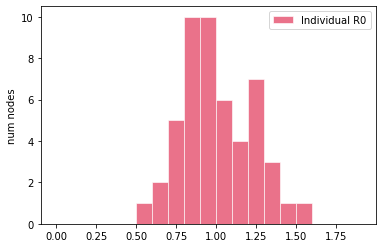

[INTERVENTIONS @ t = 0.60 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.00 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

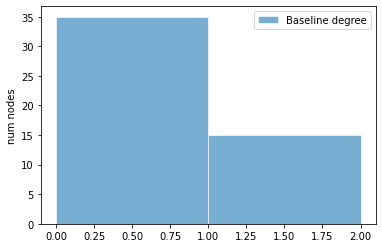

latent period:  mean = 3.40, std = 1.87, 95% CI = (0.51, 7.58)

pre-symptomatic period:  mean = 2.39, std = 1.39, 95% CI = (0.54, 5.28)

total incubation period:  mean = 5.78, std = 2.31, 95% CI = (2.07, 9.89)



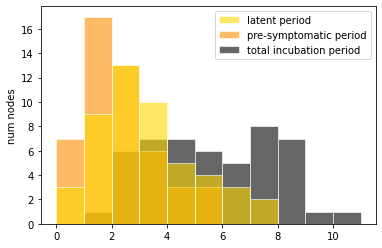

pre-symptomatic period:  mean = 3.40, std = 1.87, 95% CI = (0.51, 7.58)

(a)symptomatic period:  mean = 6.63, std = 3.01, 95% CI = (2.79, 13.01)

total infectious period:  mean = 10.02, std = 3.81, 95% CI = (5.29, 17.56)



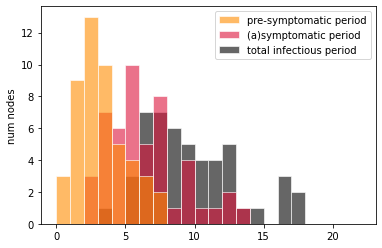

onset-to-hospitalization period:  mean = 8.36, std = 3.45, 95% CI = (2.68, 15.35)

hospitalization-to-discharge period:  mean = 14.68, std = 6.65, 95% CI = (5.16, 28.60)

onset-to-discharge period:  mean = 23.04, std = 7.52, 95% CI = (11.56, 38.31)



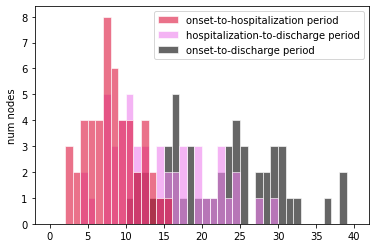

onset-to-hospitalization period:  mean = 8.36, std = 3.45, 95% CI = (2.68, 15.35)

hospitalization-to-death period:  mean = 6.95, std = 3.25, 95% CI = (2.18, 14.25)

onset-to-death period:  mean = 15.31, std = 4.94, 95% CI = (8.20, 26.61)



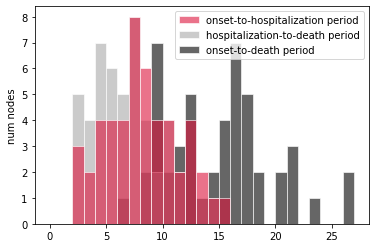

Individual R0:  mean = 1.02, std = 0.22, 95% CI = (0.66, 1.44)



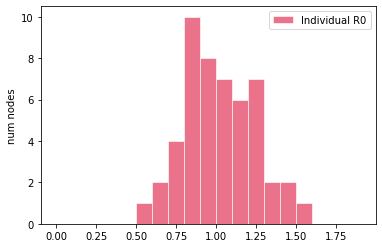

[INTERVENTIONS @ t = 0.11 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.06 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

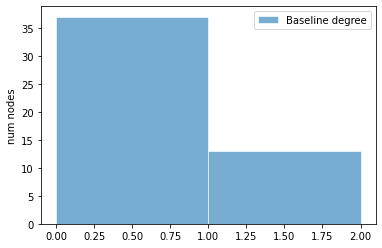

latent period:  mean = 3.26, std = 1.96, 95% CI = (0.55, 6.45)

pre-symptomatic period:  mean = 2.01, std = 1.01, 95% CI = (0.59, 3.90)

total incubation period:  mean = 5.27, std = 2.32, 95% CI = (1.70, 9.63)



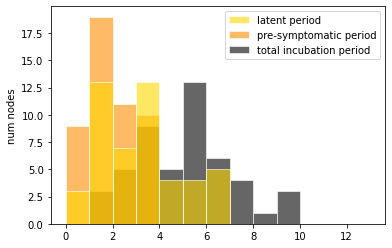

pre-symptomatic period:  mean = 3.26, std = 1.96, 95% CI = (0.55, 6.45)

(a)symptomatic period:  mean = 6.68, std = 2.51, 95% CI = (2.84, 11.70)

total infectious period:  mean = 9.94, std = 3.05, 95% CI = (4.89, 17.10)



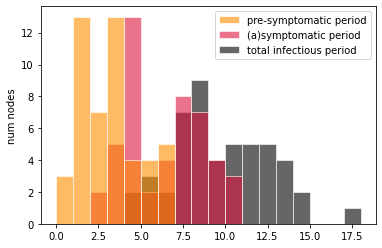

onset-to-hospitalization period:  mean = 8.91, std = 3.36, 95% CI = (3.09, 14.12)

hospitalization-to-discharge period:  mean = 12.94, std = 6.24, 95% CI = (3.29, 25.81)

onset-to-discharge period:  mean = 21.84, std = 6.77, 95% CI = (11.41, 37.38)



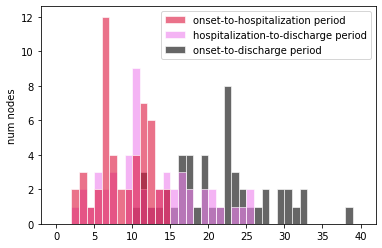

onset-to-hospitalization period:  mean = 8.91, std = 3.36, 95% CI = (3.09, 14.12)

hospitalization-to-death period:  mean = 6.98, std = 3.03, 95% CI = (2.50, 13.27)

onset-to-death period:  mean = 15.89, std = 4.57, 95% CI = (7.78, 23.60)



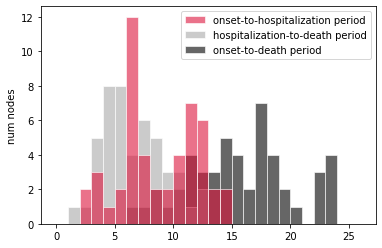

Individual R0:  mean = 1.00, std = 0.19, 95% CI = (0.65, 1.31)



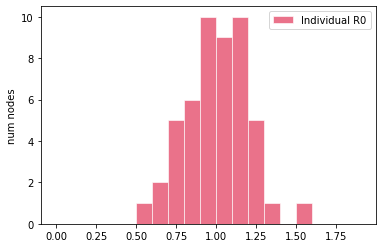

[INTERVENTIONS @ t = 0.45 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.24 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

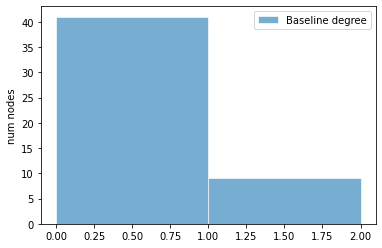

latent period:  mean = 3.06, std = 1.52, 95% CI = (1.09, 5.96)

pre-symptomatic period:  mean = 2.83, std = 2.01, 95% CI = (0.31, 6.81)

total incubation period:  mean = 5.90, std = 2.38, 95% CI = (2.31, 10.25)



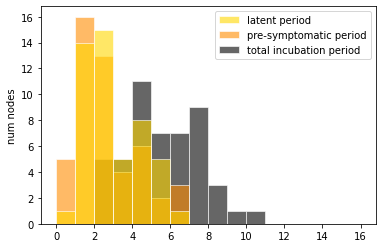

pre-symptomatic period:  mean = 3.06, std = 1.52, 95% CI = (1.09, 5.96)

(a)symptomatic period:  mean = 6.27, std = 2.45, 95% CI = (2.91, 11.58)

total infectious period:  mean = 9.33, std = 2.92, 95% CI = (5.20, 15.16)



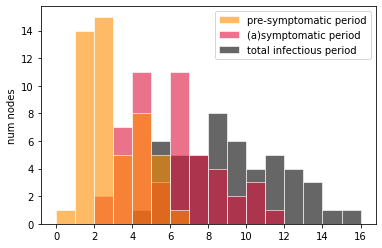

onset-to-hospitalization period:  mean = 8.89, std = 3.17, 95% CI = (4.20, 14.72)

hospitalization-to-discharge period:  mean = 13.64, std = 5.22, 95% CI = (6.73, 24.99)

onset-to-discharge period:  mean = 22.53, std = 5.80, 95% CI = (13.21, 34.47)



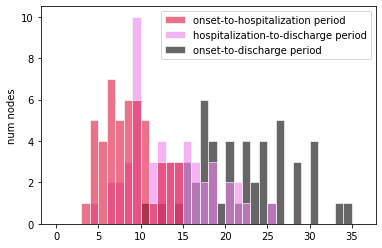

onset-to-hospitalization period:  mean = 8.89, std = 3.17, 95% CI = (4.20, 14.72)

hospitalization-to-death period:  mean = 6.70, std = 2.68, 95% CI = (3.31, 12.39)

onset-to-death period:  mean = 15.59, std = 4.35, 95% CI = (8.86, 25.06)



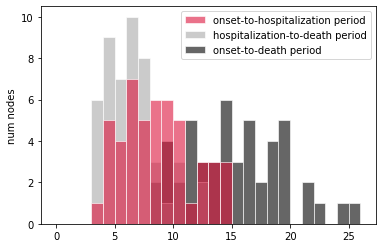

Individual R0:  mean = 0.99, std = 0.20, 95% CI = (0.64, 1.36)



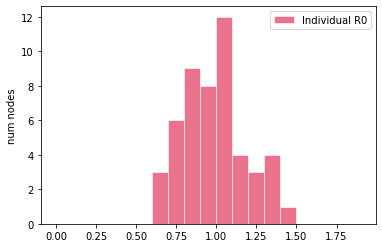

[INTERVENTIONS @ t = 0.06 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.19 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

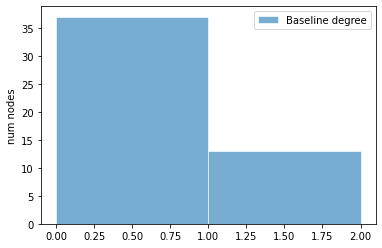

latent period:  mean = 3.59, std = 2.44, 95% CI = (0.81, 9.54)

pre-symptomatic period:  mean = 2.54, std = 1.66, 95% CI = (0.48, 6.21)

total incubation period:  mean = 6.12, std = 3.37, 95% CI = (2.20, 14.94)



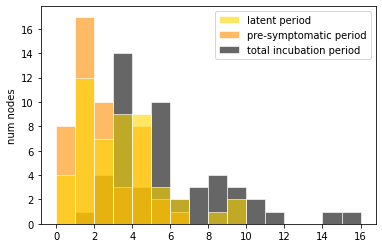

pre-symptomatic period:  mean = 3.59, std = 2.44, 95% CI = (0.81, 9.54)

(a)symptomatic period:  mean = 6.42, std = 2.74, 95% CI = (2.45, 13.38)

total infectious period:  mean = 10.00, std = 3.92, 95% CI = (4.59, 17.31)



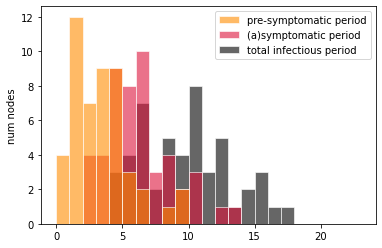

onset-to-hospitalization period:  mean = 7.33, std = 3.21, 95% CI = (2.02, 13.32)

hospitalization-to-discharge period:  mean = 13.34, std = 5.87, 95% CI = (5.19, 24.89)

onset-to-discharge period:  mean = 20.67, std = 6.31, 95% CI = (10.36, 31.65)



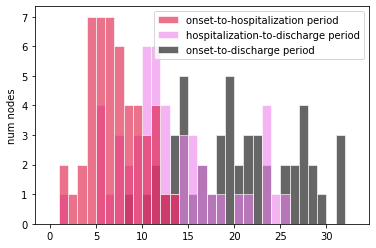

onset-to-hospitalization period:  mean = 7.33, std = 3.21, 95% CI = (2.02, 13.32)

hospitalization-to-death period:  mean = 7.31, std = 3.33, 95% CI = (2.66, 14.59)

onset-to-death period:  mean = 14.64, std = 5.09, 95% CI = (6.57, 28.14)



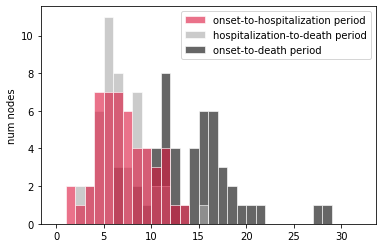

Individual R0:  mean = 1.02, std = 0.20, 95% CI = (0.67, 1.47)



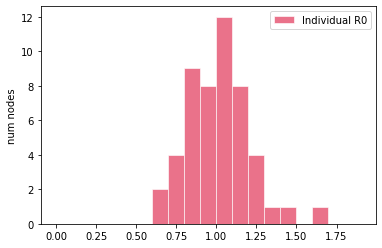

[INTERVENTIONS @ t = 0.47 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 0 positive (0.00 %) +]
	50	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[NEW EXPOSURE @ t = 3.58 (2 exposed)]
[INTERVENTIONS @ t = 3.58 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of co

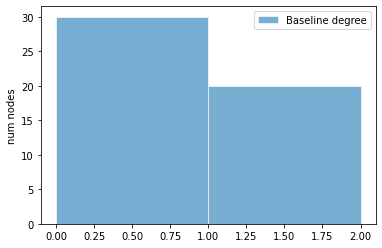

latent period:  mean = 3.61, std = 1.98, 95% CI = (0.70, 7.45)

pre-symptomatic period:  mean = 2.50, std = 1.74, 95% CI = (0.32, 7.17)

total incubation period:  mean = 6.11, std = 2.31, 95% CI = (1.97, 10.69)



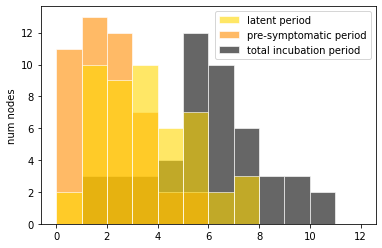

pre-symptomatic period:  mean = 3.61, std = 1.98, 95% CI = (0.70, 7.45)

(a)symptomatic period:  mean = 7.14, std = 2.49, 95% CI = (3.28, 12.12)

total infectious period:  mean = 10.75, std = 3.28, 95% CI = (5.46, 16.96)



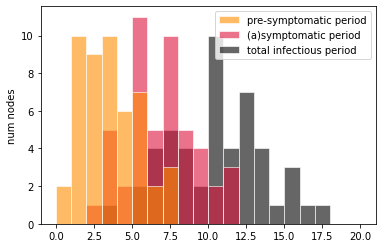

onset-to-hospitalization period:  mean = 8.19, std = 3.98, 95% CI = (3.45, 19.97)

hospitalization-to-discharge period:  mean = 13.55, std = 4.93, 95% CI = (6.75, 25.89)

onset-to-discharge period:  mean = 21.75, std = 6.30, 95% CI = (13.84, 37.26)



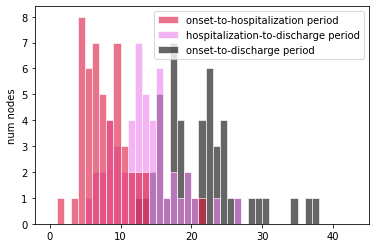

onset-to-hospitalization period:  mean = 8.19, std = 3.98, 95% CI = (3.45, 19.97)

hospitalization-to-death period:  mean = 5.78, std = 2.67, 95% CI = (1.58, 12.16)

onset-to-death period:  mean = 13.98, std = 4.79, 95% CI = (6.80, 25.84)



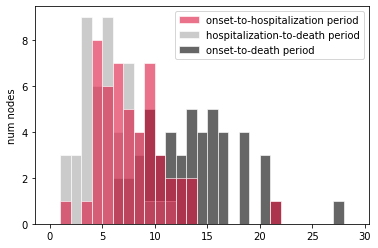

Individual R0:  mean = 0.99, std = 0.16, 95% CI = (0.70, 1.29)



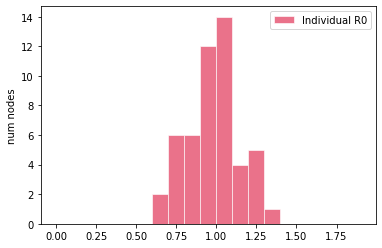

[INTERVENTIONS @ t = 0.31 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.09 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

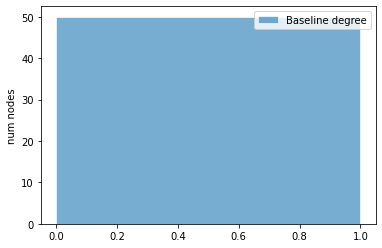

latent period:  mean = 3.64, std = 1.92, 95% CI = (0.68, 7.53)

pre-symptomatic period:  mean = 2.41, std = 1.53, 95% CI = (0.73, 5.77)

total incubation period:  mean = 6.06, std = 2.35, 95% CI = (2.42, 10.56)



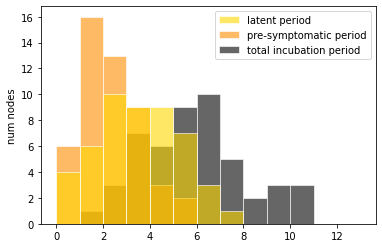

pre-symptomatic period:  mean = 3.64, std = 1.92, 95% CI = (0.68, 7.53)

(a)symptomatic period:  mean = 6.46, std = 2.66, 95% CI = (2.62, 12.13)

total infectious period:  mean = 10.10, std = 2.70, 95% CI = (5.92, 15.56)



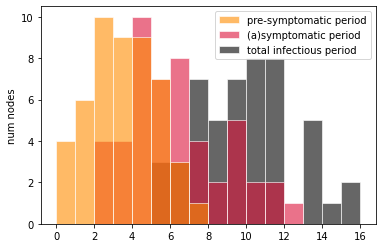

onset-to-hospitalization period:  mean = 8.58, std = 3.71, 95% CI = (3.46, 15.48)

hospitalization-to-discharge period:  mean = 12.77, std = 5.89, 95% CI = (4.74, 26.92)

onset-to-discharge period:  mean = 21.36, std = 7.96, 95% CI = (10.89, 40.58)



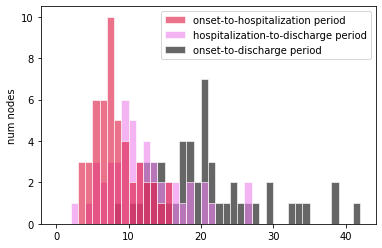

onset-to-hospitalization period:  mean = 8.58, std = 3.71, 95% CI = (3.46, 15.48)

hospitalization-to-death period:  mean = 6.95, std = 3.30, 95% CI = (2.42, 13.19)

onset-to-death period:  mean = 15.53, std = 5.06, 95% CI = (8.72, 26.22)



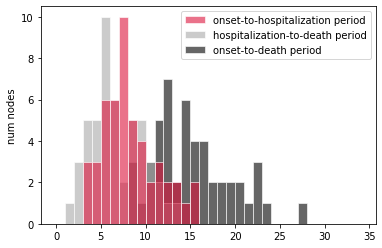

Individual R0:  mean = 0.99, std = 0.19, 95% CI = (0.63, 1.35)



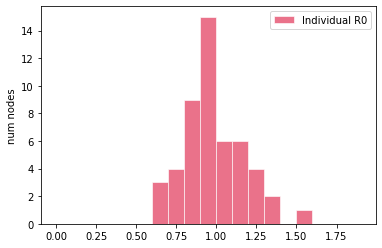

[INTERVENTIONS @ t = 0.75 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.19 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[NEW EXPOS

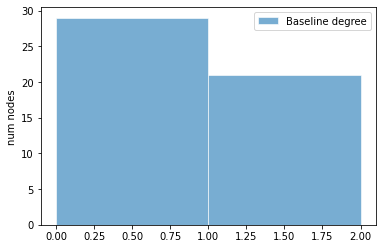

latent period:  mean = 3.62, std = 2.24, 95% CI = (0.76, 8.91)

pre-symptomatic period:  mean = 2.59, std = 1.45, 95% CI = (0.67, 5.63)

total incubation period:  mean = 6.20, std = 2.77, 95% CI = (2.59, 12.34)



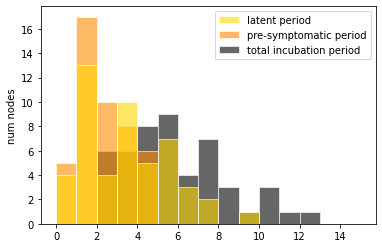

pre-symptomatic period:  mean = 3.62, std = 2.24, 95% CI = (0.76, 8.91)

(a)symptomatic period:  mean = 6.70, std = 2.44, 95% CI = (2.46, 11.18)

total infectious period:  mean = 10.31, std = 3.58, 95% CI = (4.90, 16.67)



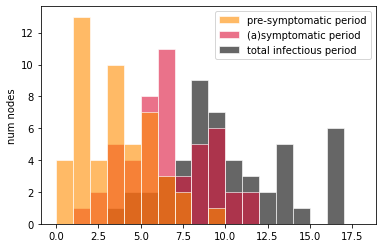

onset-to-hospitalization period:  mean = 7.68, std = 3.08, 95% CI = (2.80, 13.85)

hospitalization-to-discharge period:  mean = 15.82, std = 6.58, 95% CI = (5.05, 29.30)

onset-to-discharge period:  mean = 23.50, std = 7.14, 95% CI = (11.86, 38.19)



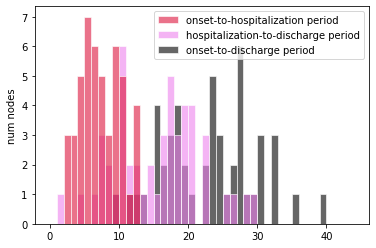

onset-to-hospitalization period:  mean = 7.68, std = 3.08, 95% CI = (2.80, 13.85)

hospitalization-to-death period:  mean = 6.49, std = 2.74, 95% CI = (2.63, 11.34)

onset-to-death period:  mean = 14.17, std = 4.26, 95% CI = (6.64, 22.41)



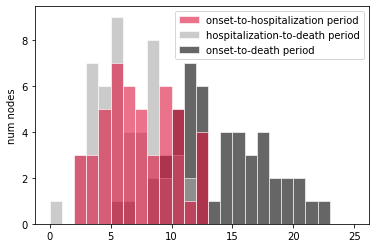

Individual R0:  mean = 0.98, std = 0.17, 95% CI = (0.59, 1.27)



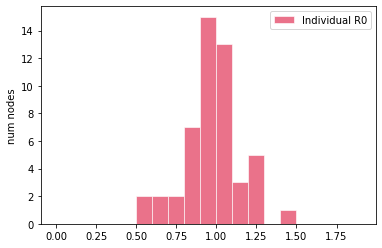

[INTERVENTIONS @ t = 0.18 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.54 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

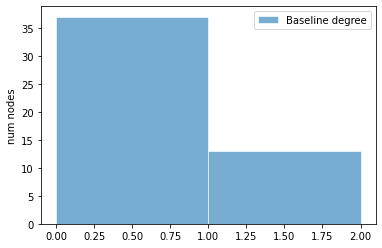

latent period:  mean = 3.73, std = 2.00, 95% CI = (0.96, 8.10)

pre-symptomatic period:  mean = 2.46, std = 1.39, 95% CI = (0.56, 5.33)

total incubation period:  mean = 6.19, std = 2.60, 95% CI = (1.93, 11.34)



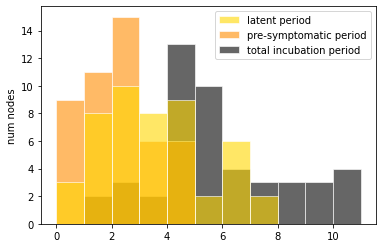

pre-symptomatic period:  mean = 3.73, std = 2.00, 95% CI = (0.96, 8.10)

(a)symptomatic period:  mean = 6.46, std = 2.61, 95% CI = (2.61, 11.59)

total infectious period:  mean = 10.19, std = 3.52, 95% CI = (4.57, 16.29)



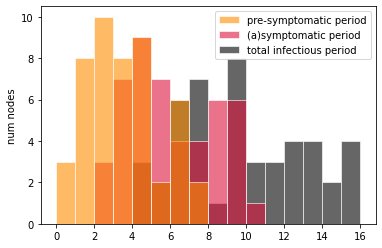

onset-to-hospitalization period:  mean = 9.03, std = 4.16, 95% CI = (3.68, 19.04)

hospitalization-to-discharge period:  mean = 13.13, std = 6.02, 95% CI = (4.69, 25.62)

onset-to-discharge period:  mean = 22.17, std = 7.98, 95% CI = (9.95, 40.23)



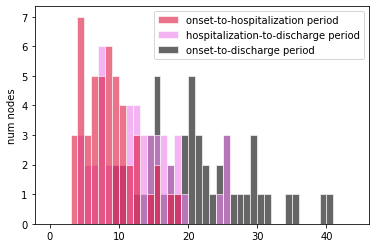

onset-to-hospitalization period:  mean = 9.03, std = 4.16, 95% CI = (3.68, 19.04)

hospitalization-to-death period:  mean = 6.20, std = 2.71, 95% CI = (1.51, 12.02)

onset-to-death period:  mean = 15.24, std = 4.92, 95% CI = (9.13, 27.81)



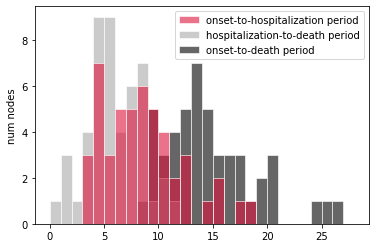

Individual R0:  mean = 0.99, std = 0.20, 95% CI = (0.66, 1.40)



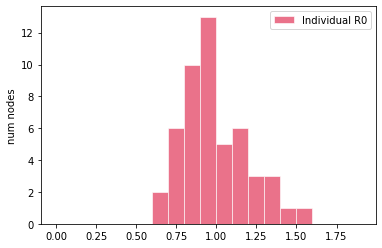

[INTERVENTIONS @ t = 0.04 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 0 positive (0.00 %) +]
	50	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.06 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENT

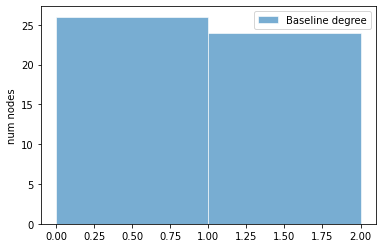

latent period:  mean = 2.94, std = 1.88, 95% CI = (0.54, 7.29)

pre-symptomatic period:  mean = 2.41, std = 1.28, 95% CI = (0.53, 4.93)

total incubation period:  mean = 5.35, std = 2.10, 95% CI = (1.97, 9.78)



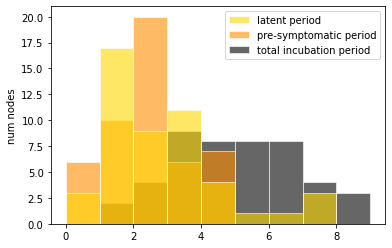

pre-symptomatic period:  mean = 2.94, std = 1.88, 95% CI = (0.54, 7.29)

(a)symptomatic period:  mean = 6.45, std = 2.11, 95% CI = (2.87, 10.76)

total infectious period:  mean = 9.39, std = 2.61, 95% CI = (4.97, 14.47)



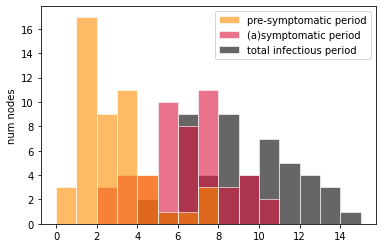

onset-to-hospitalization period:  mean = 7.68, std = 3.33, 95% CI = (3.19, 16.39)

hospitalization-to-discharge period:  mean = 15.24, std = 6.07, 95% CI = (5.16, 26.15)

onset-to-discharge period:  mean = 22.91, std = 6.53, 95% CI = (11.35, 34.72)



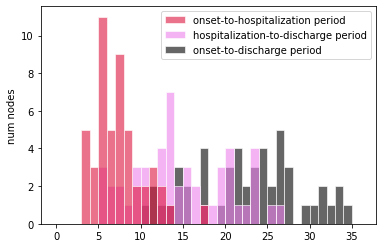

onset-to-hospitalization period:  mean = 7.68, std = 3.33, 95% CI = (3.19, 16.39)

hospitalization-to-death period:  mean = 7.78, std = 3.68, 95% CI = (1.95, 14.18)

onset-to-death period:  mean = 15.46, std = 5.01, 95% CI = (7.76, 25.64)



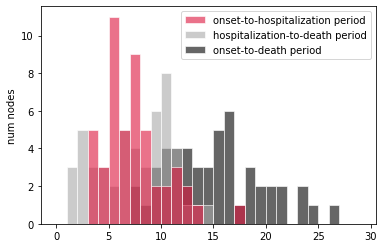

Individual R0:  mean = 0.98, std = 0.19, 95% CI = (0.65, 1.33)



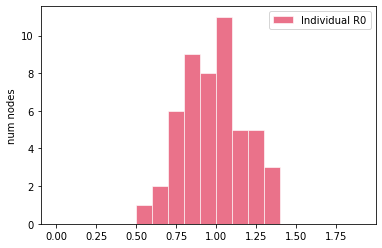

[INTERVENTIONS @ t = 0.35 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.33 (6 (12.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

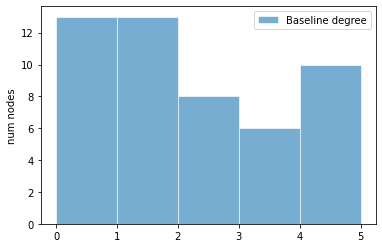

latent period:  mean = 3.66, std = 1.95, 95% CI = (1.31, 8.60)

pre-symptomatic period:  mean = 2.60, std = 1.63, 95% CI = (0.65, 6.40)

total incubation period:  mean = 6.26, std = 2.75, 95% CI = (2.99, 10.76)



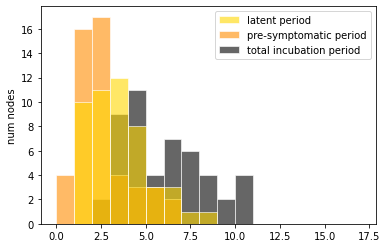

pre-symptomatic period:  mean = 3.66, std = 1.95, 95% CI = (1.31, 8.60)

(a)symptomatic period:  mean = 6.50, std = 3.35, 95% CI = (2.62, 12.80)

total infectious period:  mean = 10.17, std = 3.84, 95% CI = (5.22, 15.94)



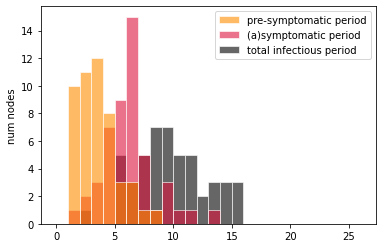

onset-to-hospitalization period:  mean = 8.73, std = 3.35, 95% CI = (4.33, 16.27)

hospitalization-to-discharge period:  mean = 14.03, std = 5.68, 95% CI = (5.46, 26.26)

onset-to-discharge period:  mean = 22.76, std = 7.25, 95% CI = (11.15, 35.74)



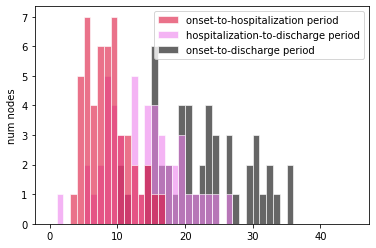

onset-to-hospitalization period:  mean = 8.73, std = 3.35, 95% CI = (4.33, 16.27)

hospitalization-to-death period:  mean = 6.40, std = 2.57, 95% CI = (2.30, 11.16)

onset-to-death period:  mean = 15.13, std = 4.62, 95% CI = (8.20, 25.40)



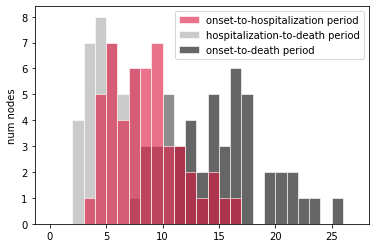

Individual R0:  mean = 1.00, std = 0.20, 95% CI = (0.61, 1.34)



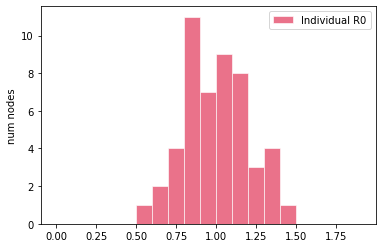

[INTERVENTIONS @ t = 0.13 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 0 positive (0.00 %) +]
	50	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.14 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 2 positive (4.00 %) +]
	50	tested TOTAL            [+ 2 positive (4.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	2 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVE

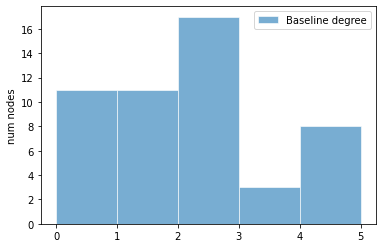

latent period:  mean = 3.80, std = 2.55, 95% CI = (0.67, 9.72)

pre-symptomatic period:  mean = 2.89, std = 1.64, 95% CI = (0.78, 6.22)

total incubation period:  mean = 6.69, std = 3.16, 95% CI = (2.51, 13.32)



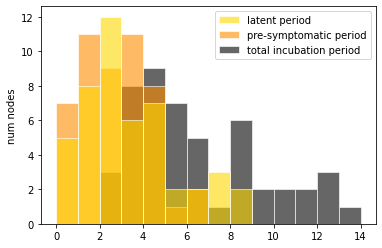

pre-symptomatic period:  mean = 3.80, std = 2.55, 95% CI = (0.67, 9.72)

(a)symptomatic period:  mean = 6.77, std = 2.86, 95% CI = (3.15, 13.89)

total infectious period:  mean = 10.57, std = 3.60, 95% CI = (5.63, 18.55)



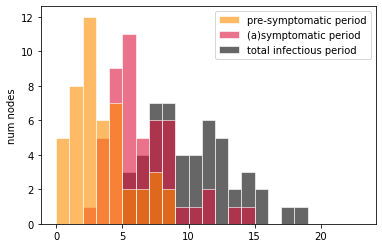

onset-to-hospitalization period:  mean = 8.65, std = 3.84, 95% CI = (3.91, 18.52)

hospitalization-to-discharge period:  mean = 13.80, std = 5.70, 95% CI = (5.36, 26.21)

onset-to-discharge period:  mean = 22.46, std = 6.17, 95% CI = (12.90, 38.92)



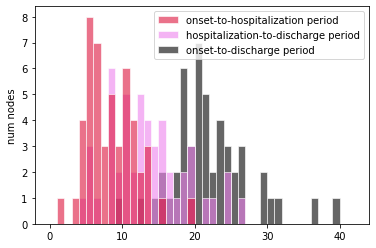

onset-to-hospitalization period:  mean = 8.65, std = 3.84, 95% CI = (3.91, 18.52)

hospitalization-to-death period:  mean = 6.78, std = 3.23, 95% CI = (1.84, 14.22)

onset-to-death period:  mean = 15.44, std = 4.57, 95% CI = (8.64, 26.51)



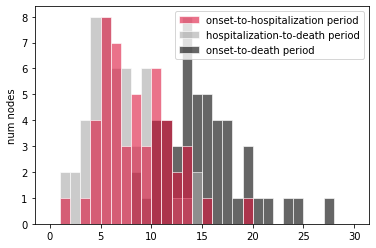

Individual R0:  mean = 1.03, std = 0.17, 95% CI = (0.74, 1.35)



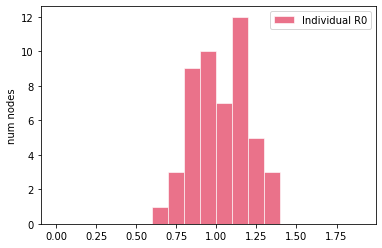

[INTERVENTIONS @ t = 0.17 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.25 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 1 positive (2.04 %) +]
	49	tested TOTAL            [+ 1 positive (2.04 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

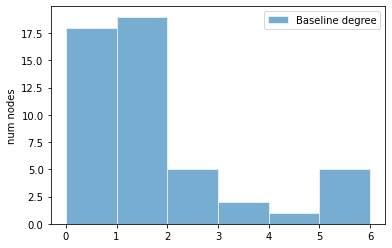

latent period:  mean = 3.16, std = 1.68, 95% CI = (0.76, 7.60)

pre-symptomatic period:  mean = 2.13, std = 1.30, 95% CI = (0.41, 4.75)

total incubation period:  mean = 5.29, std = 1.90, 95% CI = (2.65, 9.29)



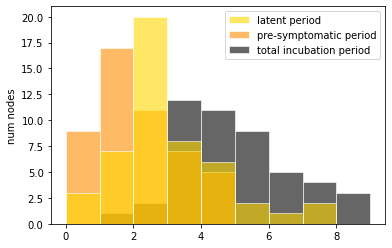

pre-symptomatic period:  mean = 3.16, std = 1.68, 95% CI = (0.76, 7.60)

(a)symptomatic period:  mean = 6.24, std = 2.44, 95% CI = (2.36, 10.36)

total infectious period:  mean = 9.40, std = 2.73, 95% CI = (5.07, 13.25)



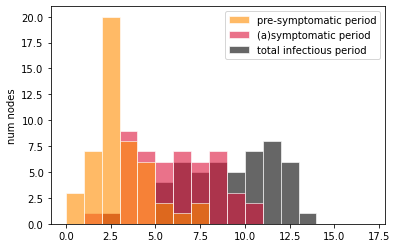

onset-to-hospitalization period:  mean = 8.31, std = 3.57, 95% CI = (2.33, 15.39)

hospitalization-to-discharge period:  mean = 12.45, std = 5.18, 95% CI = (4.50, 23.24)

onset-to-discharge period:  mean = 20.77, std = 5.71, 95% CI = (12.14, 31.57)



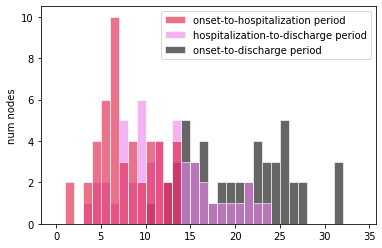

onset-to-hospitalization period:  mean = 8.31, std = 3.57, 95% CI = (2.33, 15.39)

hospitalization-to-death period:  mean = 6.54, std = 3.58, 95% CI = (1.49, 14.77)

onset-to-death period:  mean = 14.85, std = 4.94, 95% CI = (7.12, 22.31)



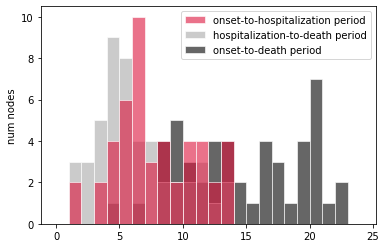

Individual R0:  mean = 1.04, std = 0.20, 95% CI = (0.70, 1.37)



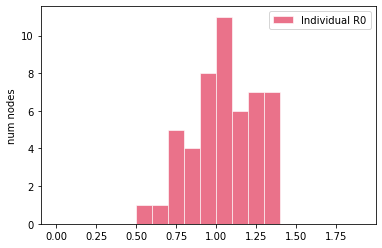

[INTERVENTIONS @ t = 0.78 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.02 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 1 positive (2.04 %) +]
	49	tested TOTAL            [+ 1 positive (2.04 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

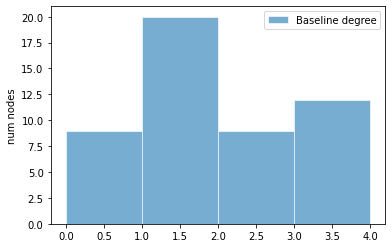

latent period:  mean = 3.54, std = 1.82, 95% CI = (0.96, 6.60)

pre-symptomatic period:  mean = 2.31, std = 1.26, 95% CI = (0.63, 4.42)

total incubation period:  mean = 5.85, std = 2.48, 95% CI = (2.00, 11.22)



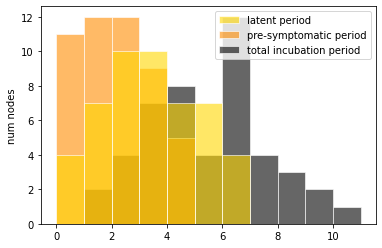

pre-symptomatic period:  mean = 3.54, std = 1.82, 95% CI = (0.96, 6.60)

(a)symptomatic period:  mean = 6.45, std = 2.47, 95% CI = (2.54, 11.78)

total infectious period:  mean = 9.99, std = 3.20, 95% CI = (5.17, 16.72)



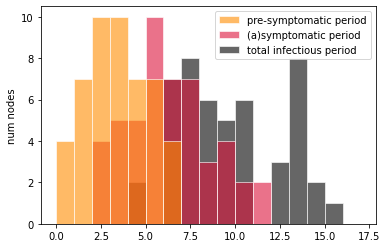

onset-to-hospitalization period:  mean = 7.87, std = 3.25, 95% CI = (3.35, 14.65)

hospitalization-to-discharge period:  mean = 13.46, std = 6.17, 95% CI = (4.51, 26.37)

onset-to-discharge period:  mean = 21.33, std = 6.72, 95% CI = (8.96, 34.66)



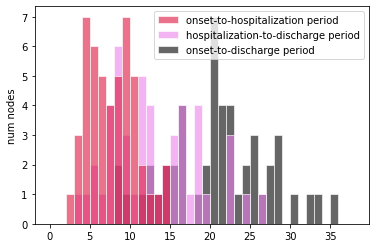

onset-to-hospitalization period:  mean = 7.87, std = 3.25, 95% CI = (3.35, 14.65)

hospitalization-to-death period:  mean = 7.61, std = 3.32, 95% CI = (1.77, 13.73)

onset-to-death period:  mean = 15.48, std = 4.66, 95% CI = (8.08, 23.33)



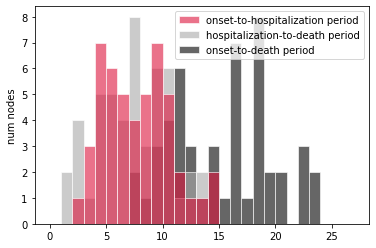

Individual R0:  mean = 0.97, std = 0.19, 95% CI = (0.65, 1.36)



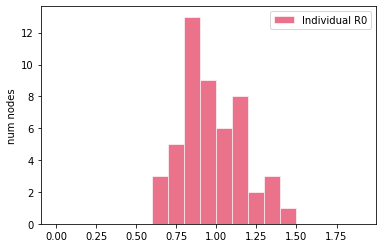

[INTERVENTIONS @ t = 0.72 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.19 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 1 positive (2.04 %) +]
	49	tested TOTAL            [+ 1 positive (2.04 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

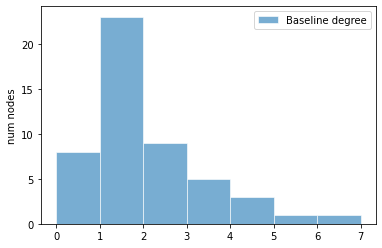

latent period:  mean = 3.73, std = 2.37, 95% CI = (0.61, 10.27)

pre-symptomatic period:  mean = 2.41, std = 1.02, 95% CI = (0.80, 4.22)

total incubation period:  mean = 6.14, std = 2.56, 95% CI = (2.41, 12.34)



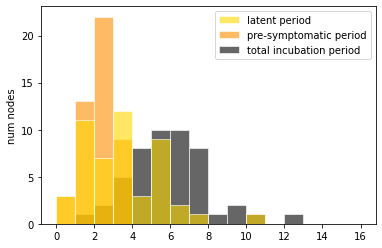

pre-symptomatic period:  mean = 3.73, std = 2.37, 95% CI = (0.61, 10.27)

(a)symptomatic period:  mean = 6.73, std = 3.02, 95% CI = (2.67, 13.00)

total infectious period:  mean = 10.46, std = 4.18, 95% CI = (4.79, 21.11)



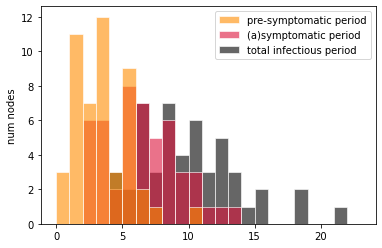

onset-to-hospitalization period:  mean = 8.32, std = 3.51, 95% CI = (2.28, 15.77)

hospitalization-to-discharge period:  mean = 14.63, std = 6.53, 95% CI = (3.92, 26.62)

onset-to-discharge period:  mean = 22.96, std = 7.49, 95% CI = (11.64, 37.48)



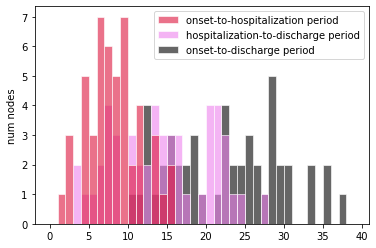

onset-to-hospitalization period:  mean = 8.32, std = 3.51, 95% CI = (2.28, 15.77)

hospitalization-to-death period:  mean = 7.06, std = 3.27, 95% CI = (3.49, 15.15)

onset-to-death period:  mean = 15.39, std = 5.14, 95% CI = (5.89, 25.71)



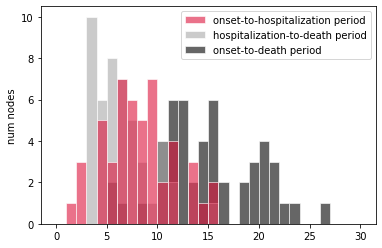

Individual R0:  mean = 0.99, std = 0.20, 95% CI = (0.71, 1.47)



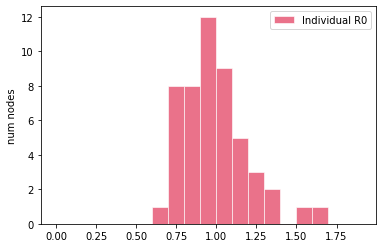

[INTERVENTIONS @ t = 0.28 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.36 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 1 positive (2.04 %) +]
	49	tested TOTAL            [+ 1 positive (2.04 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

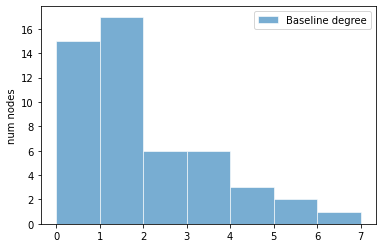

latent period:  mean = 3.59, std = 1.89, 95% CI = (0.79, 8.08)

pre-symptomatic period:  mean = 2.00, std = 1.38, 95% CI = (0.33, 5.49)

total incubation period:  mean = 5.59, std = 2.26, 95% CI = (1.96, 10.77)



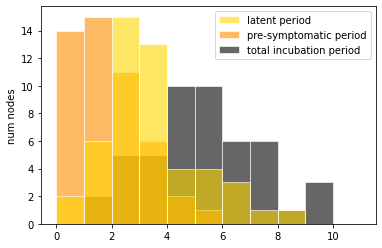

pre-symptomatic period:  mean = 3.59, std = 1.89, 95% CI = (0.79, 8.08)

(a)symptomatic period:  mean = 6.64, std = 2.51, 95% CI = (3.27, 11.81)

total infectious period:  mean = 10.23, std = 3.16, 95% CI = (5.19, 16.23)



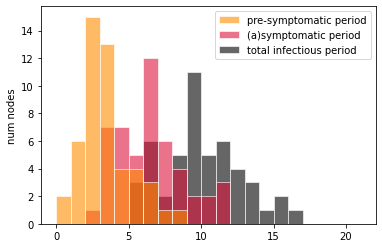

onset-to-hospitalization period:  mean = 7.46, std = 2.82, 95% CI = (2.87, 12.67)

hospitalization-to-discharge period:  mean = 13.79, std = 6.28, 95% CI = (5.76, 25.24)

onset-to-discharge period:  mean = 21.24, std = 6.90, 95% CI = (10.84, 31.57)



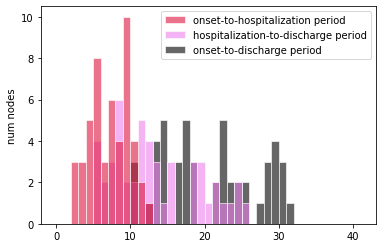

onset-to-hospitalization period:  mean = 7.46, std = 2.82, 95% CI = (2.87, 12.67)

hospitalization-to-death period:  mean = 7.23, std = 3.35, 95% CI = (2.64, 16.24)

onset-to-death period:  mean = 14.69, std = 5.03, 95% CI = (7.13, 26.54)



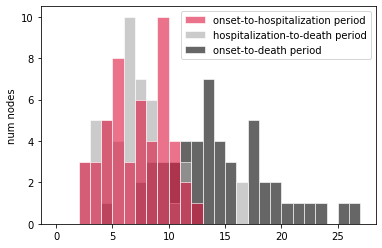

Individual R0:  mean = 1.05, std = 0.25, 95% CI = (0.75, 1.44)



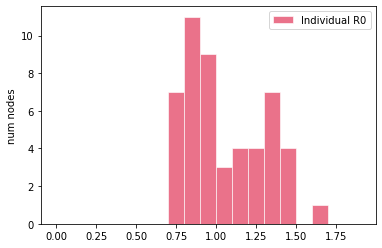

[INTERVENTIONS @ t = 0.02 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.34 (6 (12.00%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 1 positive (2.04 %) +]
	50	tested TOTAL            [+ 2 positive (4.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	2 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTER

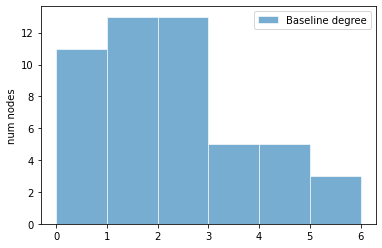

latent period:  mean = 3.70, std = 2.45, 95% CI = (0.58, 9.53)

pre-symptomatic period:  mean = 2.34, std = 1.54, 95% CI = (0.56, 6.45)

total incubation period:  mean = 6.04, std = 2.85, 95% CI = (2.15, 12.45)



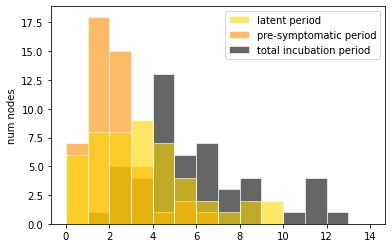

pre-symptomatic period:  mean = 3.70, std = 2.45, 95% CI = (0.58, 9.53)

(a)symptomatic period:  mean = 6.78, std = 3.07, 95% CI = (3.01, 13.45)

total infectious period:  mean = 10.47, std = 3.73, 95% CI = (5.57, 18.29)



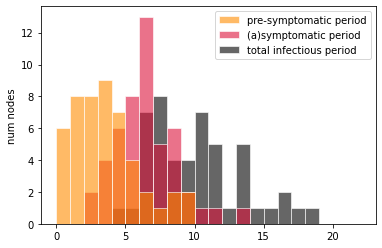

onset-to-hospitalization period:  mean = 7.57, std = 3.52, 95% CI = (2.98, 14.24)

hospitalization-to-discharge period:  mean = 14.01, std = 6.62, 95% CI = (4.43, 30.37)

onset-to-discharge period:  mean = 21.58, std = 7.60, 95% CI = (10.44, 38.54)



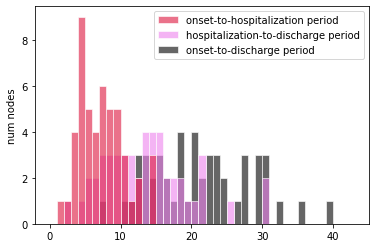

onset-to-hospitalization period:  mean = 7.57, std = 3.52, 95% CI = (2.98, 14.24)

hospitalization-to-death period:  mean = 6.61, std = 2.79, 95% CI = (2.22, 13.44)

onset-to-death period:  mean = 14.18, std = 4.55, 95% CI = (7.16, 23.22)



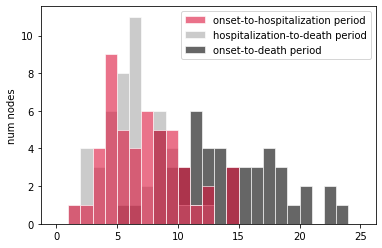

Individual R0:  mean = 1.06, std = 0.23, 95% CI = (0.67, 1.48)



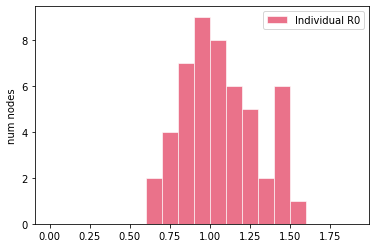

[INTERVENTIONS @ t = 0.16 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.02 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 2 positive (4.08 %) +]
	49	tested TOTAL            [+ 2 positive (4.08 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	2 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

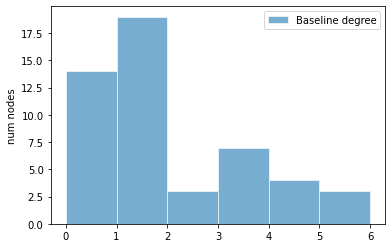

latent period:  mean = 3.61, std = 2.18, 95% CI = (0.86, 9.43)

pre-symptomatic period:  mean = 2.25, std = 1.23, 95% CI = (0.46, 5.18)

total incubation period:  mean = 5.87, std = 2.36, 95% CI = (2.24, 10.69)



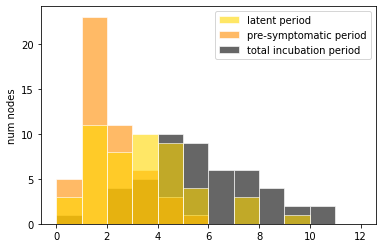

pre-symptomatic period:  mean = 3.61, std = 2.18, 95% CI = (0.86, 9.43)

(a)symptomatic period:  mean = 6.63, std = 2.62, 95% CI = (3.02, 12.10)

total infectious period:  mean = 10.24, std = 3.47, 95% CI = (5.56, 18.89)



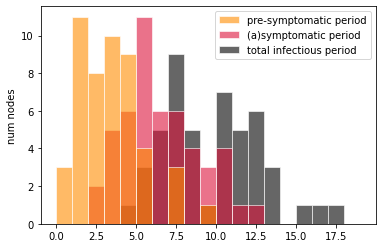

onset-to-hospitalization period:  mean = 8.17, std = 3.77, 95% CI = (3.42, 16.63)

hospitalization-to-discharge period:  mean = 13.22, std = 5.06, 95% CI = (5.30, 24.14)

onset-to-discharge period:  mean = 21.38, std = 7.05, 95% CI = (10.80, 34.70)



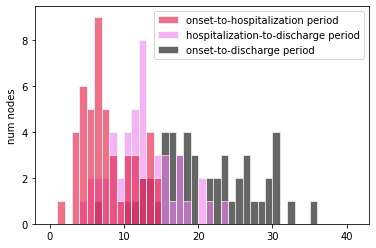

onset-to-hospitalization period:  mean = 8.17, std = 3.77, 95% CI = (3.42, 16.63)

hospitalization-to-death period:  mean = 7.35, std = 2.93, 95% CI = (2.57, 12.20)

onset-to-death period:  mean = 15.51, std = 4.92, 95% CI = (9.33, 25.70)



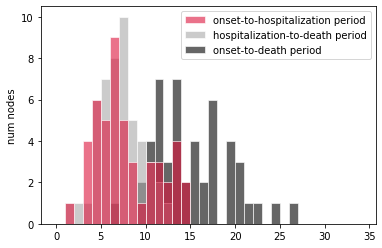

Individual R0:  mean = 1.00, std = 0.17, 95% CI = (0.75, 1.38)



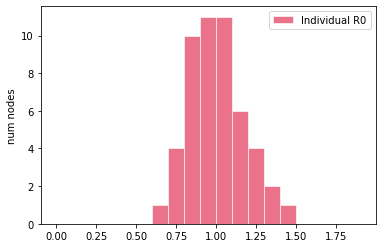

[INTERVENTIONS @ t = 0.01 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.48 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 2 positive (4.08 %) +]
	49	tested TOTAL            [+ 2 positive (4.08 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	2 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

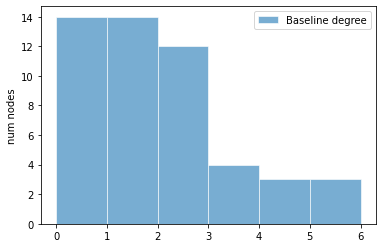

latent period:  mean = 3.99, std = 2.21, 95% CI = (0.97, 8.94)

pre-symptomatic period:  mean = 2.45, std = 1.81, 95% CI = (0.49, 7.15)

total incubation period:  mean = 6.44, std = 2.83, 95% CI = (2.09, 12.37)



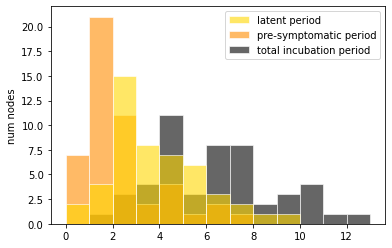

pre-symptomatic period:  mean = 3.99, std = 2.21, 95% CI = (0.97, 8.94)

(a)symptomatic period:  mean = 6.85, std = 2.17, 95% CI = (2.91, 11.00)

total infectious period:  mean = 10.85, std = 2.81, 95% CI = (6.65, 15.80)



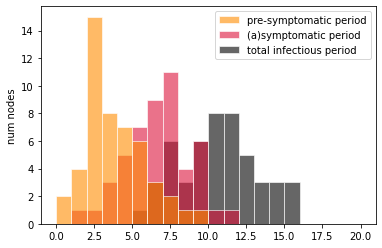

onset-to-hospitalization period:  mean = 7.30, std = 3.49, 95% CI = (2.10, 14.05)

hospitalization-to-discharge period:  mean = 15.53, std = 5.92, 95% CI = (6.11, 25.63)

onset-to-discharge period:  mean = 22.83, std = 6.92, 95% CI = (12.16, 36.53)



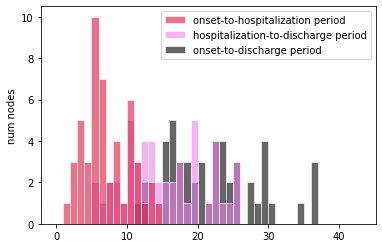

onset-to-hospitalization period:  mean = 7.30, std = 3.49, 95% CI = (2.10, 14.05)

hospitalization-to-death period:  mean = 8.03, std = 3.60, 95% CI = (2.47, 15.47)

onset-to-death period:  mean = 15.33, std = 5.09, 95% CI = (7.53, 25.52)



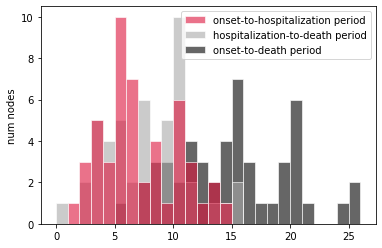

Individual R0:  mean = 0.97, std = 0.20, 95% CI = (0.65, 1.42)



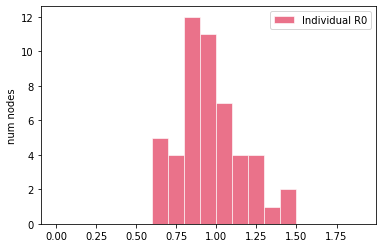

[INTERVENTIONS @ t = 0.12 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.41 (5 (10.00%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 3 positive (6.12 %) +]
	50	tested TOTAL            [+ 4 positive (8.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	4 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTER

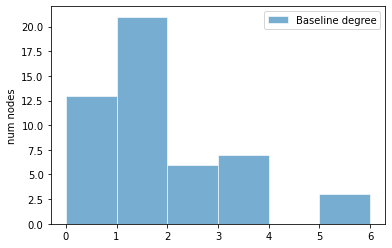

latent period:  mean = 3.67, std = 2.24, 95% CI = (1.06, 8.16)

pre-symptomatic period:  mean = 2.75, std = 1.94, 95% CI = (0.62, 7.81)

total incubation period:  mean = 6.41, std = 3.21, 95% CI = (2.29, 13.14)



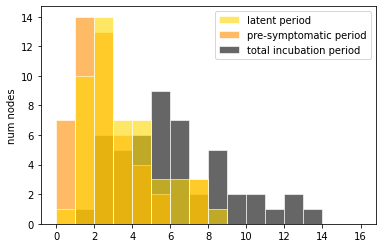

pre-symptomatic period:  mean = 3.67, std = 2.24, 95% CI = (1.06, 8.16)

(a)symptomatic period:  mean = 6.30, std = 2.32, 95% CI = (3.58, 11.59)

total infectious period:  mean = 9.97, std = 3.05, 95% CI = (5.73, 15.99)



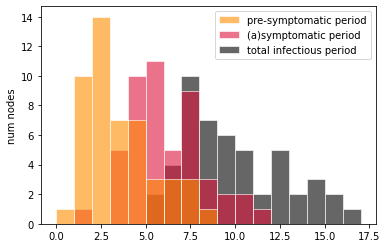

onset-to-hospitalization period:  mean = 8.34, std = 4.06, 95% CI = (2.25, 17.01)

hospitalization-to-discharge period:  mean = 13.74, std = 6.23, 95% CI = (4.67, 27.13)

onset-to-discharge period:  mean = 22.09, std = 6.26, 95% CI = (11.72, 34.85)



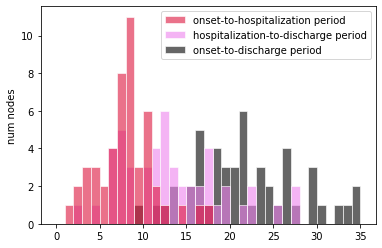

onset-to-hospitalization period:  mean = 8.34, std = 4.06, 95% CI = (2.25, 17.01)

hospitalization-to-death period:  mean = 7.20, std = 2.75, 95% CI = (2.83, 11.92)

onset-to-death period:  mean = 15.54, std = 5.05, 95% CI = (6.86, 28.45)



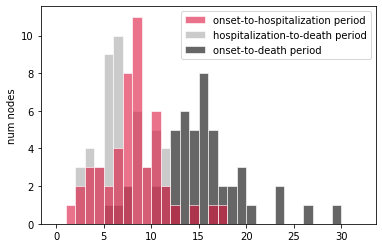

Individual R0:  mean = 1.05, std = 0.20, 95% CI = (0.70, 1.43)



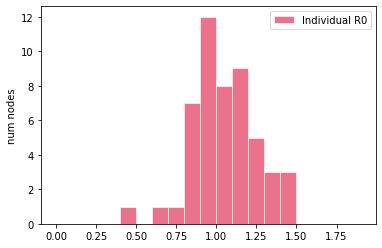

[INTERVENTIONS @ t = 1.10 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 0 positive (0.00 %) +]
	50	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.30 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 4 positive (8.00 %) +]
	50	tested TOTAL            [+ 4 positive (8.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	4 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVE

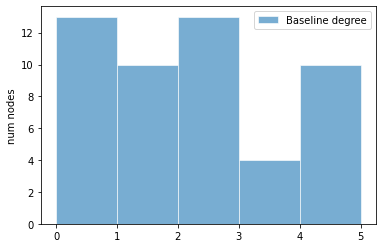

latent period:  mean = 3.46, std = 1.99, 95% CI = (0.53, 7.75)

pre-symptomatic period:  mean = 2.55, std = 1.81, 95% CI = (0.63, 6.99)

total incubation period:  mean = 6.01, std = 2.38, 95% CI = (2.65, 10.72)



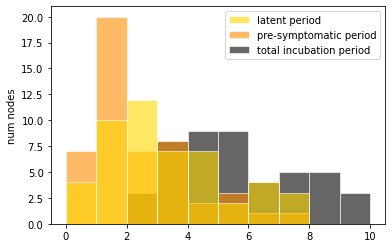

pre-symptomatic period:  mean = 3.46, std = 1.99, 95% CI = (0.53, 7.75)

(a)symptomatic period:  mean = 6.46, std = 2.70, 95% CI = (2.34, 13.56)

total infectious period:  mean = 9.92, std = 3.50, 95% CI = (5.57, 17.00)



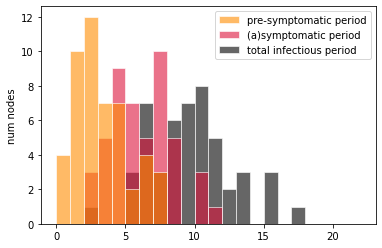

onset-to-hospitalization period:  mean = 7.79, std = 3.73, 95% CI = (2.95, 16.27)

hospitalization-to-discharge period:  mean = 15.08, std = 6.91, 95% CI = (5.16, 30.84)

onset-to-discharge period:  mean = 22.88, std = 7.48, 95% CI = (9.50, 37.14)



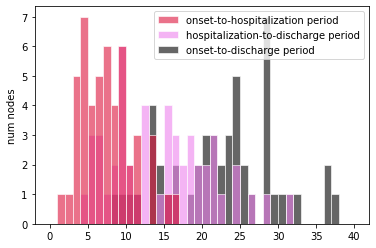

onset-to-hospitalization period:  mean = 7.79, std = 3.73, 95% CI = (2.95, 16.27)

hospitalization-to-death period:  mean = 7.51, std = 3.22, 95% CI = (2.53, 13.63)

onset-to-death period:  mean = 15.30, std = 5.02, 95% CI = (6.13, 29.07)



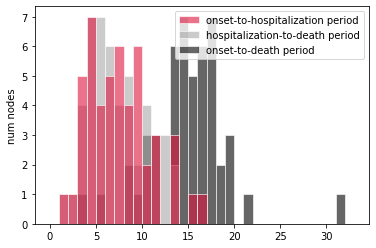

Individual R0:  mean = 1.04, std = 0.22, 95% CI = (0.63, 1.45)



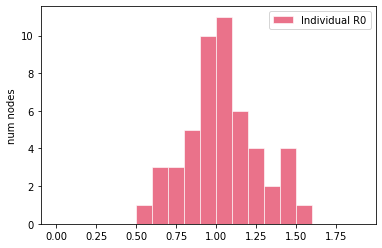

[INTERVENTIONS @ t = 0.01 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.32 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 1 positive (2.04 %) +]
	49	tested TOTAL            [+ 1 positive (2.04 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

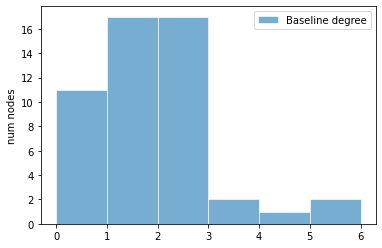

latent period:  mean = 3.48, std = 1.91, 95% CI = (0.71, 6.77)

pre-symptomatic period:  mean = 2.63, std = 1.68, 95% CI = (0.63, 7.51)

total incubation period:  mean = 6.10, std = 2.78, 95% CI = (2.78, 12.71)



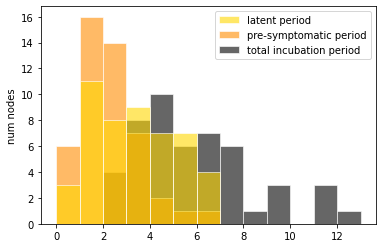

pre-symptomatic period:  mean = 3.48, std = 1.91, 95% CI = (0.71, 6.77)

(a)symptomatic period:  mean = 6.49, std = 2.36, 95% CI = (3.36, 11.16)

total infectious period:  mean = 9.97, std = 3.22, 95% CI = (5.40, 17.07)



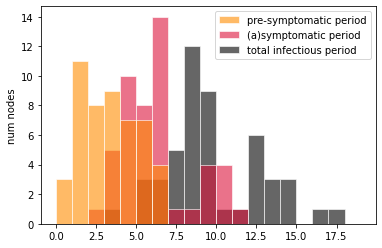

onset-to-hospitalization period:  mean = 8.07, std = 3.69, 95% CI = (3.09, 15.48)

hospitalization-to-discharge period:  mean = 15.42, std = 6.84, 95% CI = (6.15, 28.45)

onset-to-discharge period:  mean = 23.49, std = 7.81, 95% CI = (12.51, 39.26)



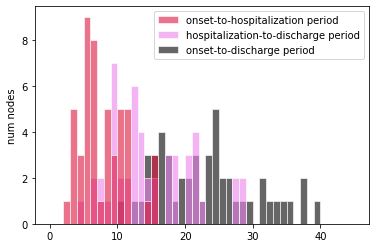

onset-to-hospitalization period:  mean = 8.07, std = 3.69, 95% CI = (3.09, 15.48)

hospitalization-to-death period:  mean = 7.55, std = 3.74, 95% CI = (2.77, 17.81)

onset-to-death period:  mean = 15.62, std = 5.31, 95% CI = (9.62, 27.60)



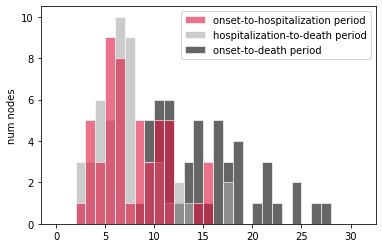

Individual R0:  mean = 0.98, std = 0.17, 95% CI = (0.69, 1.24)



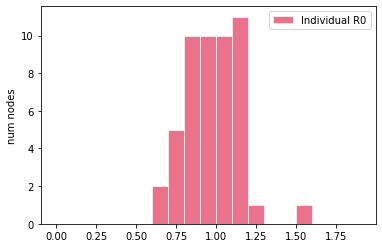

[INTERVENTIONS @ t = 0.09 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.23 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 2 positive (4.08 %) +]
	49	tested TOTAL            [+ 2 positive (4.08 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	2 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

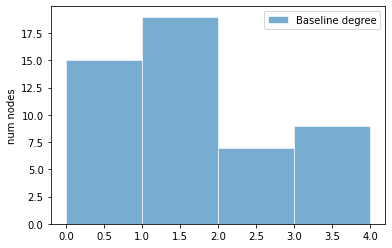

latent period:  mean = 3.34, std = 2.06, 95% CI = (0.77, 9.40)

pre-symptomatic period:  mean = 2.29, std = 1.51, 95% CI = (0.28, 5.65)

total incubation period:  mean = 5.63, std = 2.47, 95% CI = (2.59, 12.27)



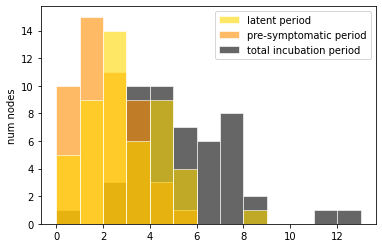

pre-symptomatic period:  mean = 3.34, std = 2.06, 95% CI = (0.77, 9.40)

(a)symptomatic period:  mean = 6.37, std = 2.75, 95% CI = (2.74, 13.00)

total infectious period:  mean = 9.71, std = 3.21, 95% CI = (4.30, 15.50)



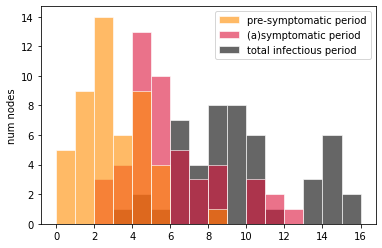

onset-to-hospitalization period:  mean = 7.40, std = 3.94, 95% CI = (1.87, 18.51)

hospitalization-to-discharge period:  mean = 13.69, std = 5.88, 95% CI = (5.43, 25.50)

onset-to-discharge period:  mean = 21.10, std = 6.78, 95% CI = (11.26, 34.73)



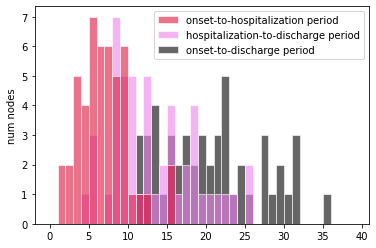

onset-to-hospitalization period:  mean = 7.40, std = 3.94, 95% CI = (1.87, 18.51)

hospitalization-to-death period:  mean = 7.60, std = 3.49, 95% CI = (2.65, 14.16)

onset-to-death period:  mean = 15.00, std = 5.43, 95% CI = (7.00, 26.55)



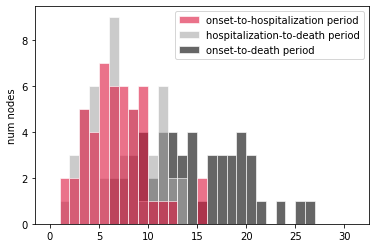

Individual R0:  mean = 0.99, std = 0.24, 95% CI = (0.62, 1.55)



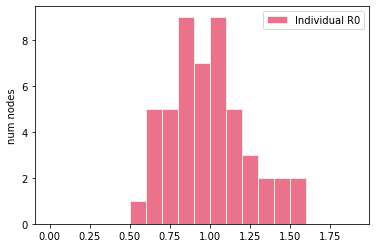

[INTERVENTIONS @ t = 0.25 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 0 positive (0.00 %) +]
	50	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 3.02 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVE

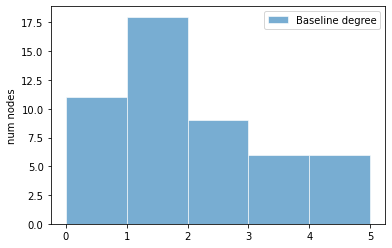

latent period:  mean = 3.49, std = 2.15, 95% CI = (0.87, 8.29)

pre-symptomatic period:  mean = 2.15, std = 1.48, 95% CI = (0.36, 6.45)

total incubation period:  mean = 5.64, std = 2.52, 95% CI = (2.53, 11.29)



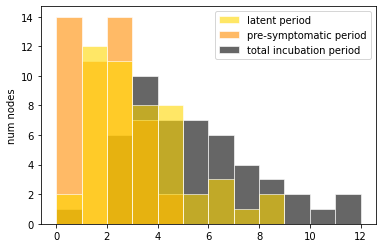

pre-symptomatic period:  mean = 3.49, std = 2.15, 95% CI = (0.87, 8.29)

(a)symptomatic period:  mean = 6.58, std = 2.46, 95% CI = (3.05, 11.17)

total infectious period:  mean = 10.06, std = 3.47, 95% CI = (5.61, 19.05)



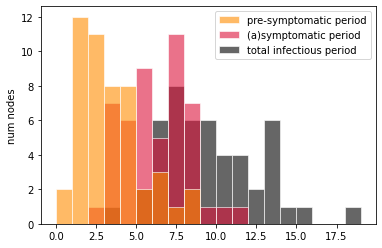

onset-to-hospitalization period:  mean = 7.75, std = 3.08, 95% CI = (3.12, 13.58)

hospitalization-to-discharge period:  mean = 15.30, std = 6.60, 95% CI = (5.55, 28.59)

onset-to-discharge period:  mean = 23.05, std = 6.48, 95% CI = (11.63, 37.53)



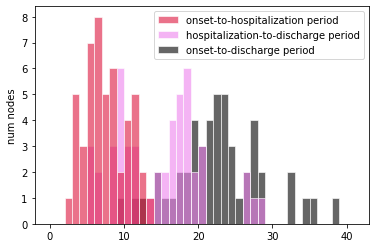

onset-to-hospitalization period:  mean = 7.75, std = 3.08, 95% CI = (3.12, 13.58)

hospitalization-to-death period:  mean = 6.28, std = 2.68, 95% CI = (2.35, 12.12)

onset-to-death period:  mean = 14.03, std = 4.42, 95% CI = (6.57, 24.09)



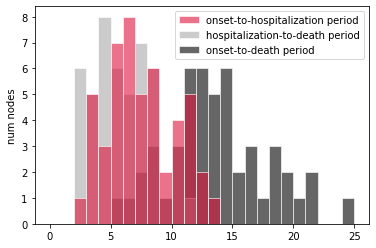

Individual R0:  mean = 1.03, std = 0.21, 95% CI = (0.62, 1.53)



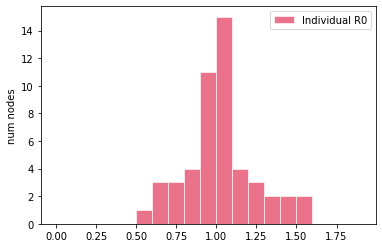

[INTERVENTIONS @ t = 0.31 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.99 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 0 positive (0.00 %) +]
	49	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

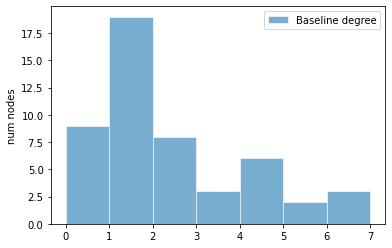

latent period:  mean = 3.68, std = 2.51, 95% CI = (0.74, 9.83)

pre-symptomatic period:  mean = 2.58, std = 1.28, 95% CI = (0.92, 5.96)

total incubation period:  mean = 6.25, std = 3.05, 95% CI = (1.99, 14.34)



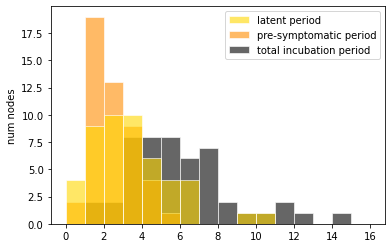

pre-symptomatic period:  mean = 3.68, std = 2.51, 95% CI = (0.74, 9.83)

(a)symptomatic period:  mean = 6.72, std = 2.37, 95% CI = (3.31, 11.86)

total infectious period:  mean = 10.40, std = 3.68, 95% CI = (5.76, 16.15)



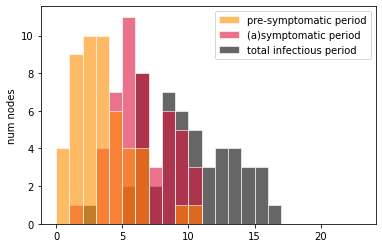

onset-to-hospitalization period:  mean = 8.77, std = 4.06, 95% CI = (3.26, 18.38)

hospitalization-to-discharge period:  mean = 13.79, std = 6.14, 95% CI = (4.48, 27.69)

onset-to-discharge period:  mean = 22.55, std = 7.73, 95% CI = (8.78, 36.57)



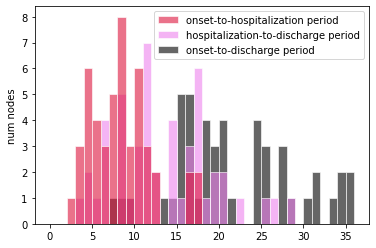

onset-to-hospitalization period:  mean = 8.77, std = 4.06, 95% CI = (3.26, 18.38)

hospitalization-to-death period:  mean = 6.99, std = 2.90, 95% CI = (2.56, 14.41)

onset-to-death period:  mean = 15.76, std = 5.43, 95% CI = (8.62, 28.50)



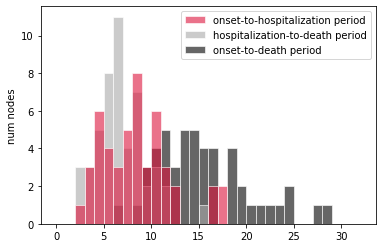

Individual R0:  mean = 0.98, std = 0.19, 95% CI = (0.69, 1.36)



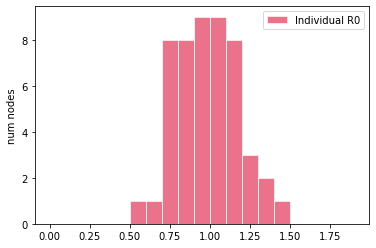

[INTERVENTIONS @ t = 0.46 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.11 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 0 positive (0.00 %) +]
	49	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

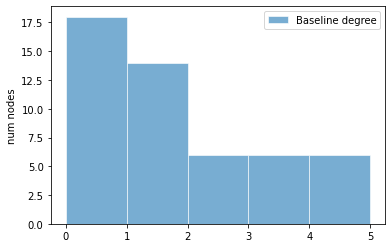

latent period:  mean = 3.17, std = 1.51, 95% CI = (1.16, 5.85)

pre-symptomatic period:  mean = 2.37, std = 1.28, 95% CI = (0.47, 5.20)

total incubation period:  mean = 5.54, std = 1.85, 95% CI = (2.66, 9.30)



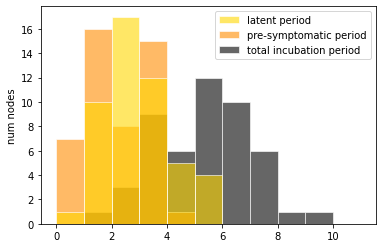

pre-symptomatic period:  mean = 3.17, std = 1.51, 95% CI = (1.16, 5.85)

(a)symptomatic period:  mean = 6.78, std = 2.86, 95% CI = (2.69, 14.21)

total infectious period:  mean = 9.95, std = 3.26, 95% CI = (5.23, 17.60)



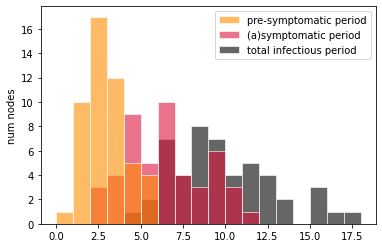

onset-to-hospitalization period:  mean = 7.29, std = 3.11, 95% CI = (2.58, 13.30)

hospitalization-to-discharge period:  mean = 14.42, std = 5.67, 95% CI = (6.47, 25.13)

onset-to-discharge period:  mean = 21.71, std = 7.01, 95% CI = (12.59, 35.91)



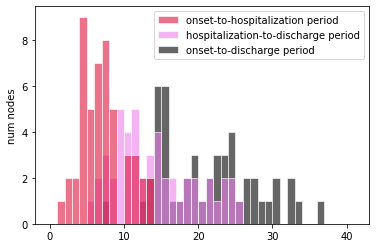

onset-to-hospitalization period:  mean = 7.29, std = 3.11, 95% CI = (2.58, 13.30)

hospitalization-to-death period:  mean = 7.15, std = 3.44, 95% CI = (1.98, 15.79)

onset-to-death period:  mean = 14.44, std = 4.61, 95% CI = (8.21, 25.48)



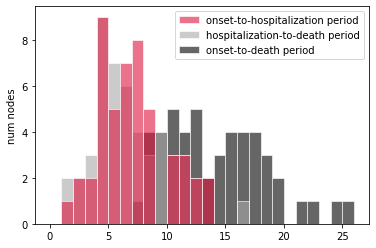

Individual R0:  mean = 1.00, std = 0.24, 95% CI = (0.63, 1.46)



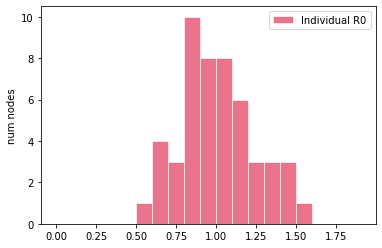

[NEW EXPOSURE @ t = 0.61 (1 exposed)]
[INTERVENTIONS @ t = 0.61 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 0 positive (0.00 %) +]
	50	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.89 (6 (12.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of co

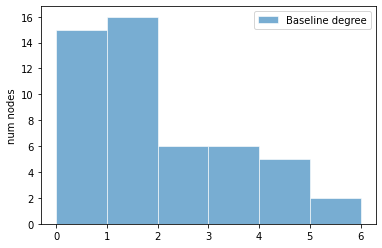

latent period:  mean = 3.75, std = 2.11, 95% CI = (0.99, 8.40)

pre-symptomatic period:  mean = 2.26, std = 1.49, 95% CI = (0.51, 5.93)

total incubation period:  mean = 6.01, std = 2.82, 95% CI = (2.41, 13.48)



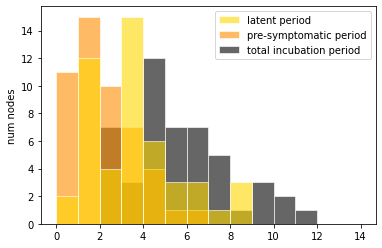

pre-symptomatic period:  mean = 3.75, std = 2.11, 95% CI = (0.99, 8.40)

(a)symptomatic period:  mean = 6.31, std = 2.39, 95% CI = (3.13, 11.85)

total infectious period:  mean = 10.06, std = 3.44, 95% CI = (4.93, 17.79)



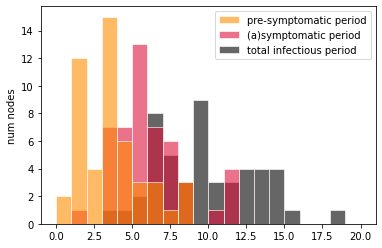

onset-to-hospitalization period:  mean = 8.15, std = 3.96, 95% CI = (3.00, 16.93)

hospitalization-to-discharge period:  mean = 12.91, std = 5.28, 95% CI = (4.50, 25.93)

onset-to-discharge period:  mean = 21.05, std = 6.60, 95% CI = (9.09, 34.65)



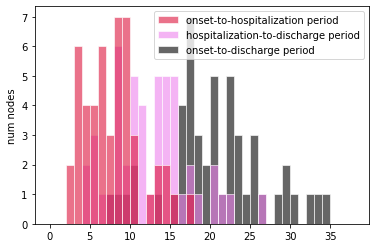

onset-to-hospitalization period:  mean = 8.15, std = 3.96, 95% CI = (3.00, 16.93)

hospitalization-to-death period:  mean = 6.50, std = 2.78, 95% CI = (1.47, 11.21)

onset-to-death period:  mean = 14.65, std = 5.17, 95% CI = (5.28, 26.66)



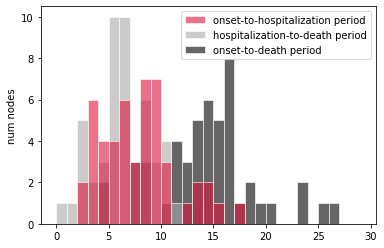

Individual R0:  mean = 1.01, std = 0.22, 95% CI = (0.71, 1.44)



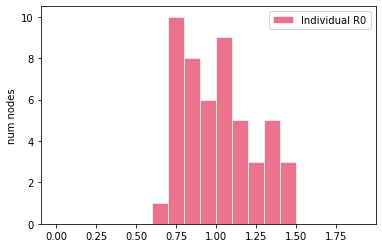

[INTERVENTIONS @ t = 0.31 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.26 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

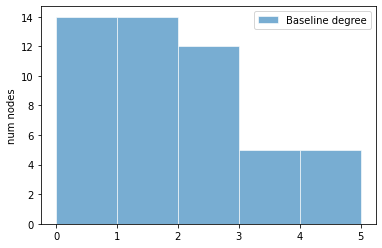

latent period:  mean = 3.27, std = 2.25, 95% CI = (0.66, 8.11)

pre-symptomatic period:  mean = 2.27, std = 1.18, 95% CI = (0.71, 4.53)

total incubation period:  mean = 5.53, std = 2.50, 95% CI = (2.54, 10.55)



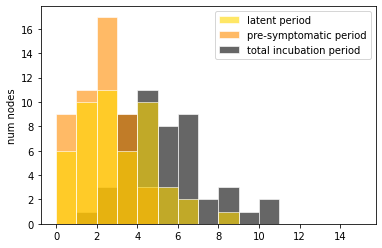

pre-symptomatic period:  mean = 3.27, std = 2.25, 95% CI = (0.66, 8.11)

(a)symptomatic period:  mean = 6.65, std = 2.65, 95% CI = (2.45, 11.55)

total infectious period:  mean = 9.92, std = 3.42, 95% CI = (3.70, 17.45)



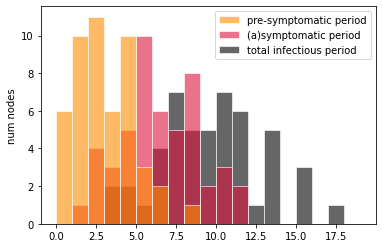

onset-to-hospitalization period:  mean = 7.13, std = 3.12, 95% CI = (2.31, 14.18)

hospitalization-to-discharge period:  mean = 12.82, std = 5.41, 95% CI = (3.54, 22.59)

onset-to-discharge period:  mean = 19.95, std = 5.86, 95% CI = (11.28, 30.26)



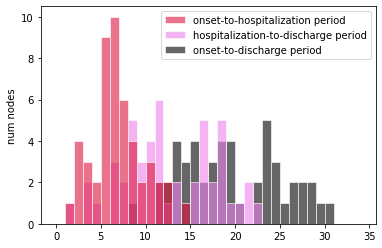

onset-to-hospitalization period:  mean = 7.13, std = 3.12, 95% CI = (2.31, 14.18)

hospitalization-to-death period:  mean = 6.41, std = 3.38, 95% CI = (1.62, 14.60)

onset-to-death period:  mean = 13.54, std = 4.23, 95% CI = (7.21, 22.33)



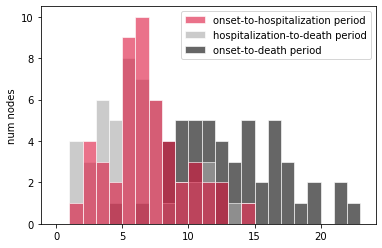

Individual R0:  mean = 1.05, std = 0.23, 95% CI = (0.63, 1.56)



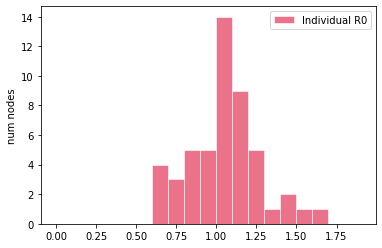

[INTERVENTIONS @ t = 0.09 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.27 (6 (12.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

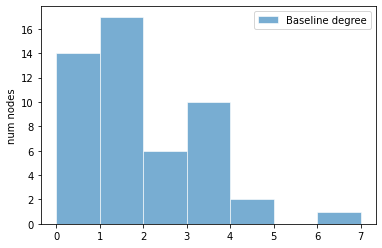

latent period:  mean = 2.92, std = 1.72, 95% CI = (0.89, 6.22)

pre-symptomatic period:  mean = 2.51, std = 1.17, 95% CI = (0.82, 5.29)

total incubation period:  mean = 5.44, std = 1.98, 95% CI = (2.48, 10.18)



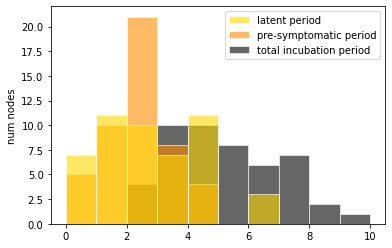

pre-symptomatic period:  mean = 2.92, std = 1.72, 95% CI = (0.89, 6.22)

(a)symptomatic period:  mean = 6.53, std = 2.22, 95% CI = (2.92, 10.75)

total infectious period:  mean = 9.45, std = 3.11, 95% CI = (4.20, 16.99)



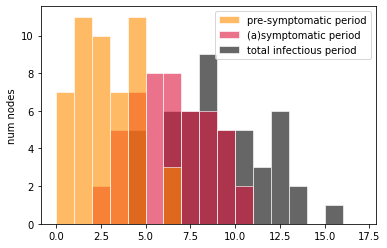

onset-to-hospitalization period:  mean = 8.37, std = 3.77, 95% CI = (3.23, 17.26)

hospitalization-to-discharge period:  mean = 14.17, std = 6.26, 95% CI = (5.37, 29.39)

onset-to-discharge period:  mean = 22.54, std = 8.06, 95% CI = (9.60, 41.44)



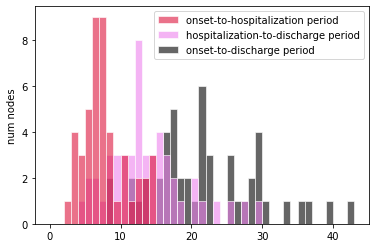

onset-to-hospitalization period:  mean = 8.37, std = 3.77, 95% CI = (3.23, 17.26)

hospitalization-to-death period:  mean = 7.25, std = 3.27, 95% CI = (2.64, 13.56)

onset-to-death period:  mean = 15.62, std = 5.14, 95% CI = (7.67, 26.64)



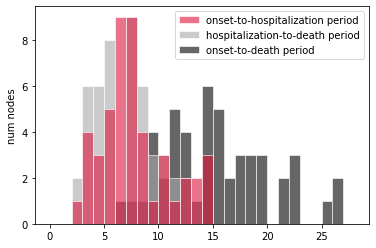

Individual R0:  mean = 0.98, std = 0.20, 95% CI = (0.66, 1.35)



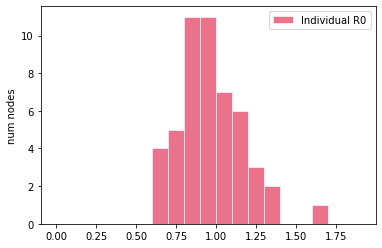

[INTERVENTIONS @ t = 0.20 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.09 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

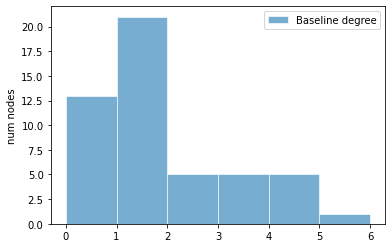

latent period:  mean = 3.45, std = 2.18, 95% CI = (0.97, 8.78)

pre-symptomatic period:  mean = 2.62, std = 1.67, 95% CI = (0.27, 6.27)

total incubation period:  mean = 6.06, std = 2.51, 95% CI = (1.91, 11.94)



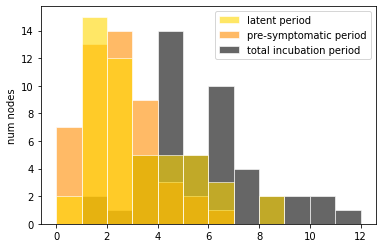

pre-symptomatic period:  mean = 3.45, std = 2.18, 95% CI = (0.97, 8.78)

(a)symptomatic period:  mean = 6.91, std = 2.43, 95% CI = (2.48, 10.94)

total infectious period:  mean = 10.35, std = 3.57, 95% CI = (5.86, 19.01)



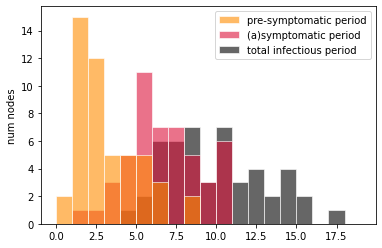

onset-to-hospitalization period:  mean = 7.63, std = 3.56, 95% CI = (2.87, 15.91)

hospitalization-to-discharge period:  mean = 15.11, std = 6.43, 95% CI = (5.89, 29.25)

onset-to-discharge period:  mean = 22.74, std = 7.58, 95% CI = (9.87, 37.30)



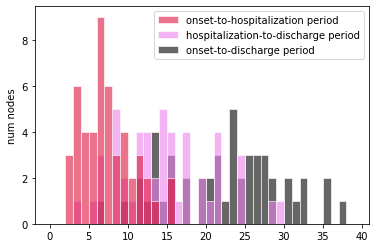

onset-to-hospitalization period:  mean = 7.63, std = 3.56, 95% CI = (2.87, 15.91)

hospitalization-to-death period:  mean = 6.74, std = 3.96, 95% CI = (2.24, 17.02)

onset-to-death period:  mean = 14.37, std = 5.67, 95% CI = (7.30, 29.12)



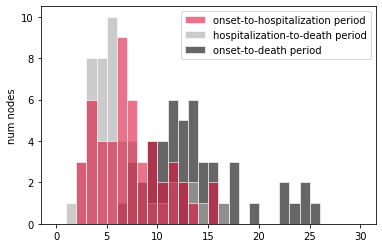

Individual R0:  mean = 1.02, std = 0.19, 95% CI = (0.74, 1.37)



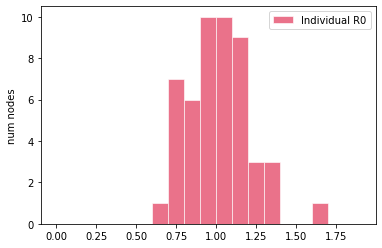

[INTERVENTIONS @ t = 0.03 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.05 (6 (12.00%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 1 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTER

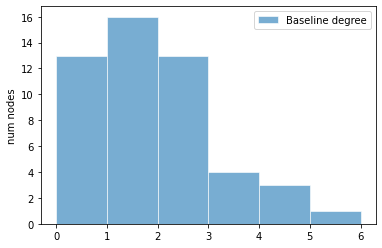

latent period:  mean = 3.07, std = 2.16, 95% CI = (0.69, 8.33)

pre-symptomatic period:  mean = 2.45, std = 1.51, 95% CI = (0.59, 6.00)

total incubation period:  mean = 5.52, std = 2.91, 95% CI = (1.77, 11.58)



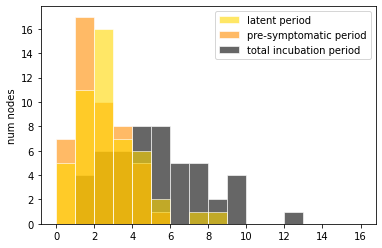

pre-symptomatic period:  mean = 3.07, std = 2.16, 95% CI = (0.69, 8.33)

(a)symptomatic period:  mean = 6.99, std = 2.22, 95% CI = (3.10, 12.10)

total infectious period:  mean = 10.06, std = 3.19, 95% CI = (5.14, 16.15)



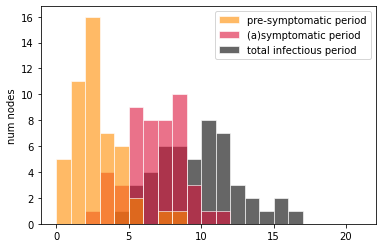

onset-to-hospitalization period:  mean = 8.14, std = 3.86, 95% CI = (2.99, 17.48)

hospitalization-to-discharge period:  mean = 14.15, std = 5.87, 95% CI = (4.30, 21.74)

onset-to-discharge period:  mean = 22.29, std = 6.76, 95% CI = (11.47, 36.36)



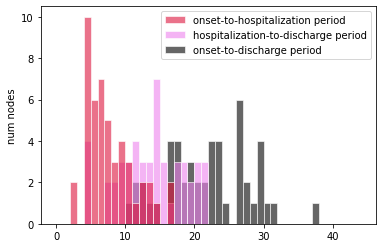

onset-to-hospitalization period:  mean = 8.14, std = 3.86, 95% CI = (2.99, 17.48)

hospitalization-to-death period:  mean = 6.85, std = 3.74, 95% CI = (1.92, 16.40)

onset-to-death period:  mean = 14.99, std = 5.12, 95% CI = (7.14, 23.17)



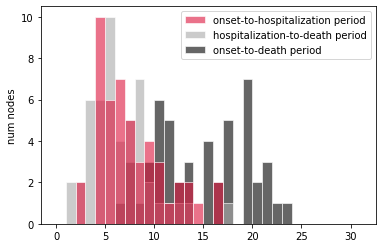

Individual R0:  mean = 0.95, std = 0.19, 95% CI = (0.59, 1.41)



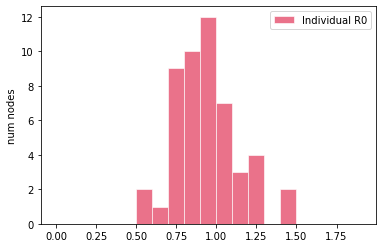

[NEW EXPOSURE @ t = 0.12 (1 exposed)]
[INTERVENTIONS @ t = 0.12 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.17 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of co

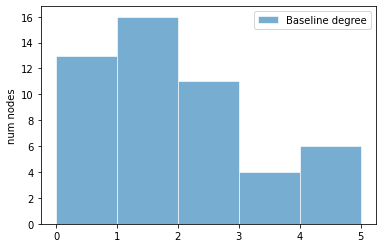

latent period:  mean = 3.43, std = 2.28, 95% CI = (0.76, 6.97)

pre-symptomatic period:  mean = 2.49, std = 1.31, 95% CI = (0.71, 5.17)

total incubation period:  mean = 5.92, std = 2.40, 95% CI = (2.06, 9.19)



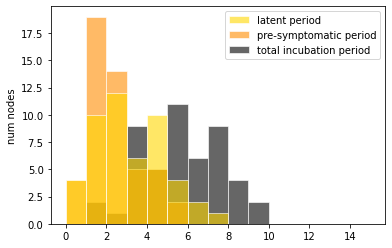

pre-symptomatic period:  mean = 3.43, std = 2.28, 95% CI = (0.76, 6.97)

(a)symptomatic period:  mean = 6.43, std = 3.45, 95% CI = (2.43, 12.25)

total infectious period:  mean = 9.86, std = 4.14, 95% CI = (4.81, 18.72)



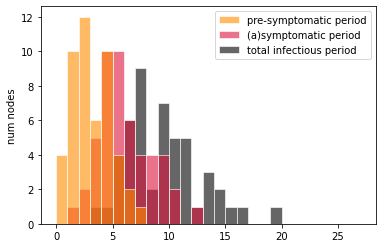

onset-to-hospitalization period:  mean = 7.91, std = 3.37, 95% CI = (2.25, 14.54)

hospitalization-to-discharge period:  mean = 14.71, std = 6.06, 95% CI = (5.65, 27.07)

onset-to-discharge period:  mean = 22.62, std = 7.06, 95% CI = (8.91, 39.10)



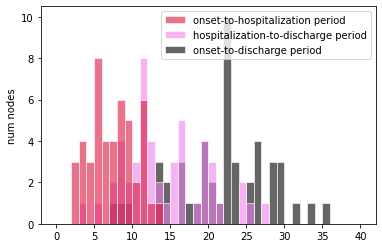

onset-to-hospitalization period:  mean = 7.91, std = 3.37, 95% CI = (2.25, 14.54)

hospitalization-to-death period:  mean = 7.07, std = 3.56, 95% CI = (2.52, 15.96)

onset-to-death period:  mean = 14.98, std = 5.47, 95% CI = (6.14, 26.07)



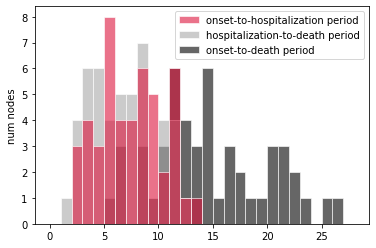

Individual R0:  mean = 1.00, std = 0.19, 95% CI = (0.68, 1.39)



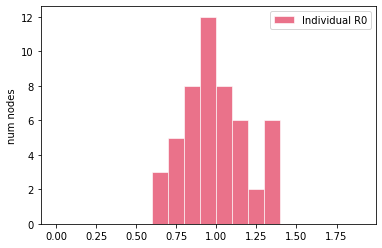

[INTERVENTIONS @ t = 1.25 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.38 (5 (10.00%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 1 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[NEW EXP

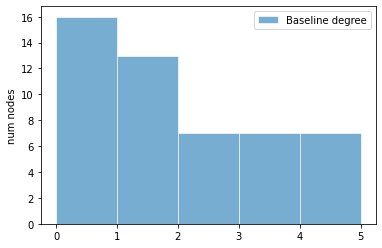

latent period:  mean = 3.61, std = 2.75, 95% CI = (1.23, 11.77)

pre-symptomatic period:  mean = 2.71, std = 1.80, 95% CI = (0.45, 6.61)

total incubation period:  mean = 6.32, std = 2.96, 95% CI = (2.22, 14.73)



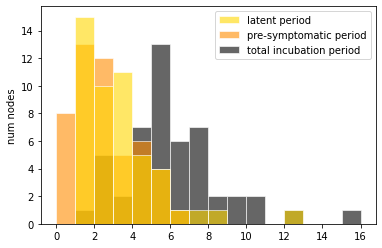

pre-symptomatic period:  mean = 3.61, std = 2.75, 95% CI = (1.23, 11.77)

(a)symptomatic period:  mean = 7.01, std = 3.10, 95% CI = (2.60, 13.90)

total infectious period:  mean = 10.62, std = 4.27, 95% CI = (4.59, 19.99)



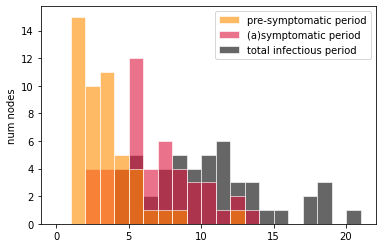

onset-to-hospitalization period:  mean = 7.25, std = 3.04, 95% CI = (3.53, 14.01)

hospitalization-to-discharge period:  mean = 13.83, std = 5.91, 95% CI = (5.09, 25.67)

onset-to-discharge period:  mean = 21.08, std = 7.39, 95% CI = (9.24, 34.63)



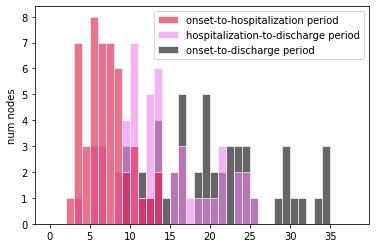

onset-to-hospitalization period:  mean = 7.25, std = 3.04, 95% CI = (3.53, 14.01)

hospitalization-to-death period:  mean = 6.95, std = 2.87, 95% CI = (2.66, 12.45)

onset-to-death period:  mean = 14.19, std = 4.59, 95% CI = (7.37, 24.43)



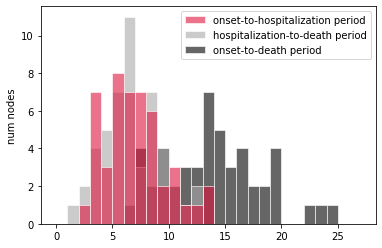

Individual R0:  mean = 0.96, std = 0.18, 95% CI = (0.65, 1.37)



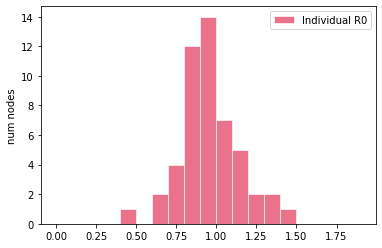

[INTERVENTIONS @ t = 0.39 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 0 positive (0.00 %) +]
	50	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.36 (4 (8.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTI

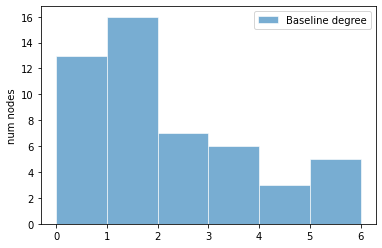

latent period:  mean = 3.75, std = 2.27, 95% CI = (0.80, 9.56)

pre-symptomatic period:  mean = 2.63, std = 1.86, 95% CI = (0.65, 5.89)

total incubation period:  mean = 6.39, std = 3.02, 95% CI = (2.35, 13.27)



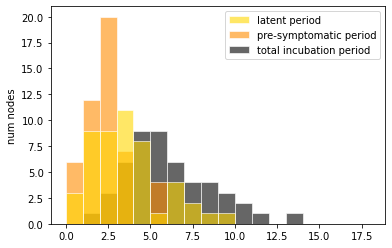

pre-symptomatic period:  mean = 3.75, std = 2.27, 95% CI = (0.80, 9.56)

(a)symptomatic period:  mean = 6.64, std = 2.37, 95% CI = (2.98, 11.32)

total infectious period:  mean = 10.40, std = 3.25, 95% CI = (5.09, 16.50)



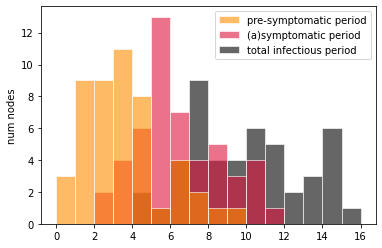

onset-to-hospitalization period:  mean = 8.61, std = 4.23, 95% CI = (3.08, 20.65)

hospitalization-to-discharge period:  mean = 13.47, std = 5.39, 95% CI = (4.88, 24.87)

onset-to-discharge period:  mean = 22.09, std = 7.25, 95% CI = (10.46, 40.38)



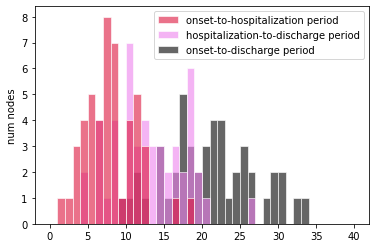

onset-to-hospitalization period:  mean = 8.61, std = 4.23, 95% CI = (3.08, 20.65)

hospitalization-to-death period:  mean = 6.50, std = 2.48, 95% CI = (2.43, 11.59)

onset-to-death period:  mean = 15.12, std = 5.28, 95% CI = (6.77, 28.69)



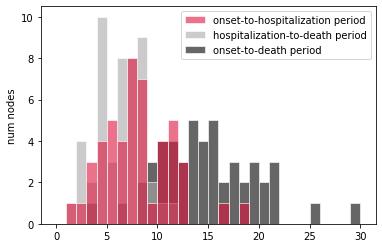

Individual R0:  mean = 0.96, std = 0.21, 95% CI = (0.64, 1.48)



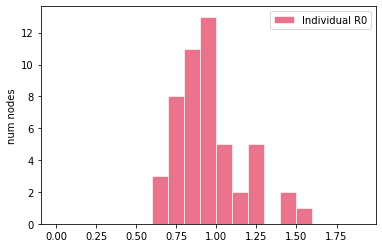

[INTERVENTIONS @ t = 0.04 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 3.88 (4 (8.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENTI

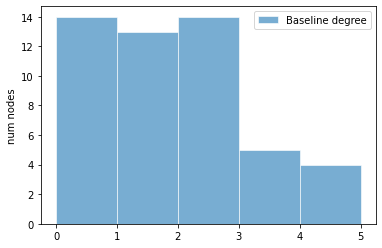

latent period:  mean = 3.38, std = 1.68, 95% CI = (0.81, 6.86)

pre-symptomatic period:  mean = 2.54, std = 1.47, 95% CI = (0.57, 5.80)

total incubation period:  mean = 5.92, std = 2.07, 95% CI = (2.53, 10.17)



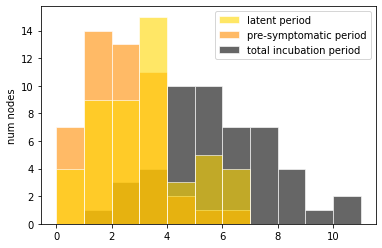

pre-symptomatic period:  mean = 3.38, std = 1.68, 95% CI = (0.81, 6.86)

(a)symptomatic period:  mean = 6.55, std = 2.86, 95% CI = (3.00, 12.50)

total infectious period:  mean = 9.93, std = 3.13, 95% CI = (5.72, 16.34)



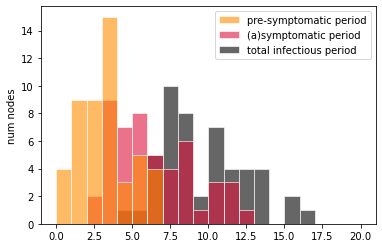

onset-to-hospitalization period:  mean = 8.35, std = 3.56, 95% CI = (3.68, 17.00)

hospitalization-to-discharge period:  mean = 12.65, std = 4.76, 95% CI = (5.80, 23.13)

onset-to-discharge period:  mean = 20.99, std = 6.42, 95% CI = (10.82, 34.26)



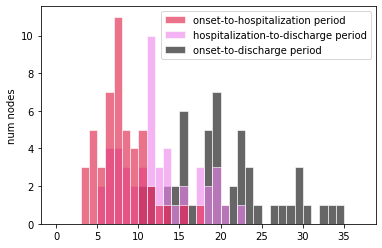

onset-to-hospitalization period:  mean = 8.35, std = 3.56, 95% CI = (3.68, 17.00)

hospitalization-to-death period:  mean = 6.85, std = 3.22, 95% CI = (2.41, 14.46)

onset-to-death period:  mean = 15.19, std = 4.47, 95% CI = (8.93, 24.51)



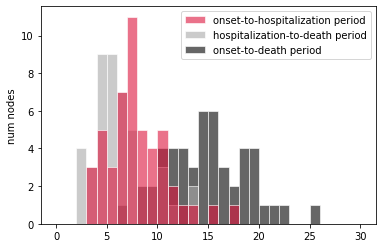

Individual R0:  mean = 0.97, std = 0.20, 95% CI = (0.59, 1.38)



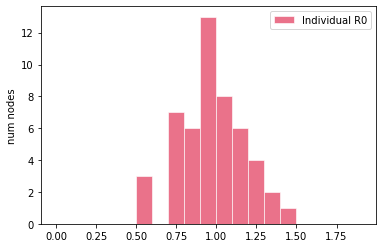

[INTERVENTIONS @ t = 0.21 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[NEW EXPOSURE @ t = 3.32 (1 exposed)]
[INTERVENTIONS @ t = 3.32 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of co

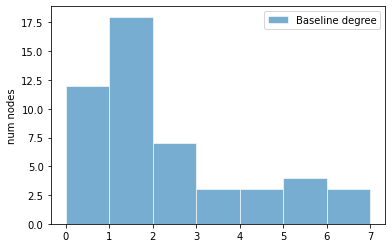

latent period:  mean = 3.29, std = 1.81, 95% CI = (0.59, 6.30)

pre-symptomatic period:  mean = 2.26, std = 1.21, 95% CI = (0.60, 4.81)

total incubation period:  mean = 5.55, std = 2.19, 95% CI = (2.51, 9.78)



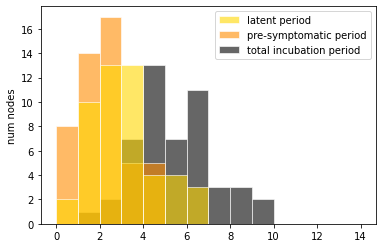

pre-symptomatic period:  mean = 3.29, std = 1.81, 95% CI = (0.59, 6.30)

(a)symptomatic period:  mean = 6.13, std = 2.42, 95% CI = (2.67, 10.81)

total infectious period:  mean = 9.42, std = 3.21, 95% CI = (4.95, 16.53)



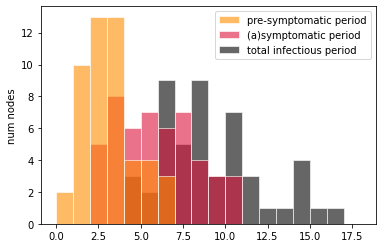

onset-to-hospitalization period:  mean = 7.77, std = 3.20, 95% CI = (2.84, 14.49)

hospitalization-to-discharge period:  mean = 14.49, std = 5.62, 95% CI = (3.51, 23.62)

onset-to-discharge period:  mean = 22.26, std = 6.74, 95% CI = (10.67, 33.32)



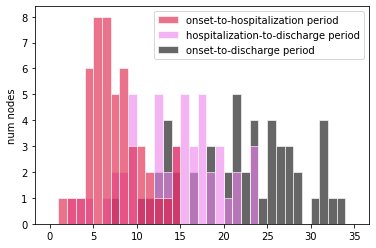

onset-to-hospitalization period:  mean = 7.77, std = 3.20, 95% CI = (2.84, 14.49)

hospitalization-to-death period:  mean = 7.36, std = 3.02, 95% CI = (2.76, 13.21)

onset-to-death period:  mean = 15.13, std = 4.19, 95% CI = (6.51, 21.50)



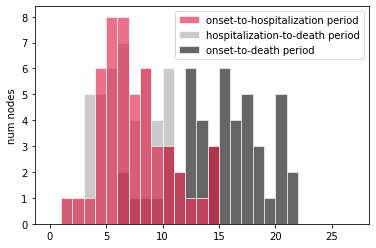

Individual R0:  mean = 0.94, std = 0.20, 95% CI = (0.60, 1.26)



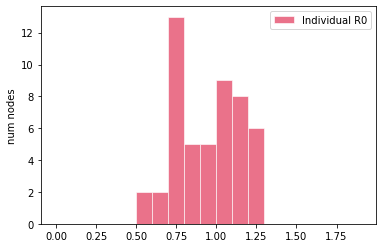

[INTERVENTIONS @ t = 0.26 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.44 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

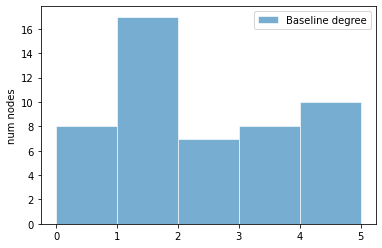

latent period:  mean = 3.26, std = 2.05, 95% CI = (0.62, 8.24)

pre-symptomatic period:  mean = 2.37, std = 1.62, 95% CI = (0.55, 5.97)

total incubation period:  mean = 5.63, std = 2.69, 95% CI = (1.83, 12.87)



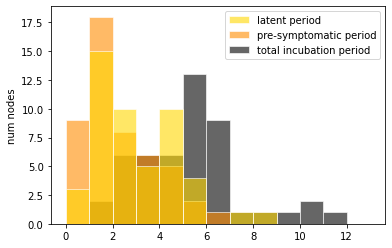

pre-symptomatic period:  mean = 3.26, std = 2.05, 95% CI = (0.62, 8.24)

(a)symptomatic period:  mean = 5.89, std = 2.76, 95% CI = (2.07, 11.47)

total infectious period:  mean = 9.15, std = 3.06, 95% CI = (4.33, 14.83)



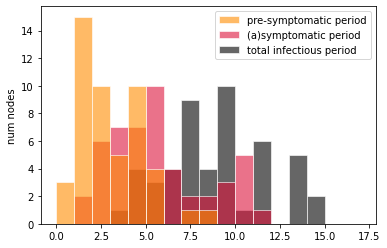

onset-to-hospitalization period:  mean = 8.31, std = 3.27, 95% CI = (3.22, 15.08)

hospitalization-to-discharge period:  mean = 14.12, std = 6.22, 95% CI = (5.14, 27.39)

onset-to-discharge period:  mean = 22.42, std = 7.05, 95% CI = (11.37, 38.12)



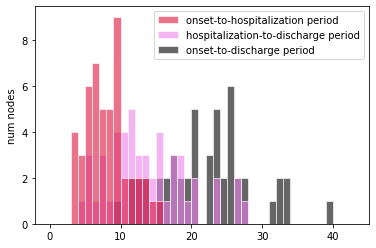

onset-to-hospitalization period:  mean = 8.31, std = 3.27, 95% CI = (3.22, 15.08)

hospitalization-to-death period:  mean = 7.05, std = 3.06, 95% CI = (2.46, 14.08)

onset-to-death period:  mean = 15.35, std = 4.54, 95% CI = (9.40, 24.35)



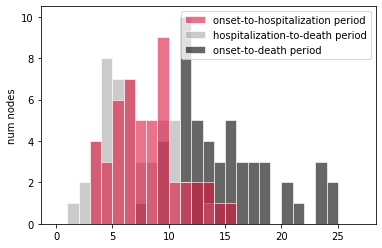

Individual R0:  mean = 1.00, std = 0.20, 95% CI = (0.68, 1.41)



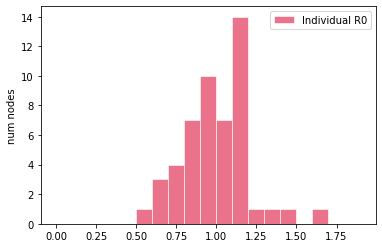

[INTERVENTIONS @ t = 0.13 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.01 (5 (10.00%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 1 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTER

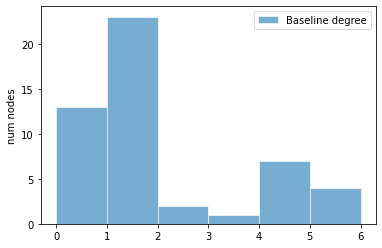

latent period:  mean = 3.56, std = 1.91, 95% CI = (0.47, 7.72)

pre-symptomatic period:  mean = 2.19, std = 1.24, 95% CI = (0.45, 4.48)

total incubation period:  mean = 5.75, std = 2.43, 95% CI = (1.60, 10.57)



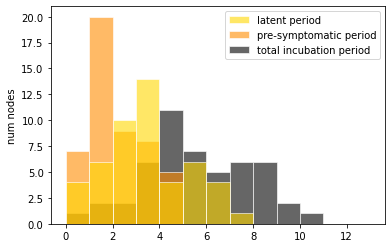

pre-symptomatic period:  mean = 3.56, std = 1.91, 95% CI = (0.47, 7.72)

(a)symptomatic period:  mean = 6.55, std = 2.58, 95% CI = (2.60, 12.35)

total infectious period:  mean = 10.10, std = 3.58, 95% CI = (3.94, 17.68)



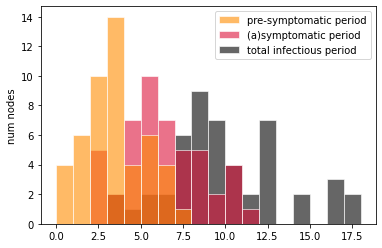

onset-to-hospitalization period:  mean = 7.94, std = 4.09, 95% CI = (3.04, 16.50)

hospitalization-to-discharge period:  mean = 12.50, std = 6.34, 95% CI = (4.10, 26.33)

onset-to-discharge period:  mean = 20.44, std = 8.10, 95% CI = (8.18, 36.61)



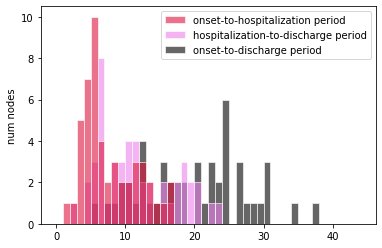

onset-to-hospitalization period:  mean = 7.94, std = 4.09, 95% CI = (3.04, 16.50)

hospitalization-to-death period:  mean = 6.92, std = 3.52, 95% CI = (2.89, 15.53)

onset-to-death period:  mean = 14.86, std = 5.43, 95% CI = (7.45, 27.88)



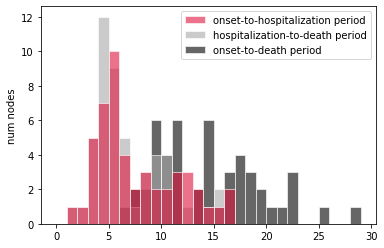

Individual R0:  mean = 0.95, std = 0.19, 95% CI = (0.57, 1.30)



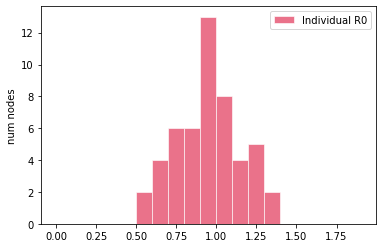

[INTERVENTIONS @ t = 0.92 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 0 positive (0.00 %) +]
	50	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.36 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[NEW EXPOS

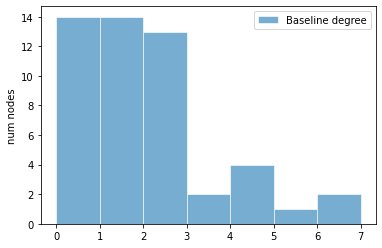

latent period:  mean = 3.95, std = 2.20, 95% CI = (1.08, 9.01)

pre-symptomatic period:  mean = 2.37, std = 1.32, 95% CI = (0.69, 5.62)

total incubation period:  mean = 6.32, std = 2.59, 95% CI = (2.72, 12.55)



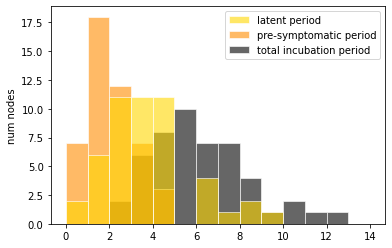

pre-symptomatic period:  mean = 3.95, std = 2.20, 95% CI = (1.08, 9.01)

(a)symptomatic period:  mean = 6.85, std = 3.46, 95% CI = (2.46, 13.23)

total infectious period:  mean = 10.80, std = 4.18, 95% CI = (5.02, 18.67)



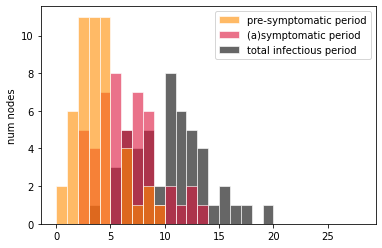

onset-to-hospitalization period:  mean = 7.70, std = 3.49, 95% CI = (2.94, 14.52)

hospitalization-to-discharge period:  mean = 14.70, std = 7.13, 95% CI = (4.56, 33.04)

onset-to-discharge period:  mean = 22.40, std = 7.98, 95% CI = (11.65, 38.75)



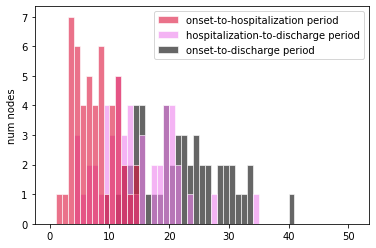

onset-to-hospitalization period:  mean = 7.70, std = 3.49, 95% CI = (2.94, 14.52)

hospitalization-to-death period:  mean = 7.64, std = 3.13, 95% CI = (2.55, 13.93)

onset-to-death period:  mean = 15.34, std = 4.89, 95% CI = (6.24, 23.92)



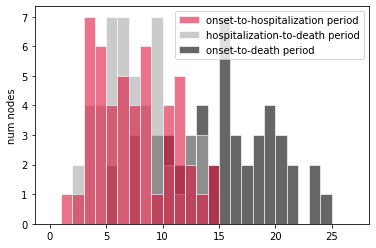

Individual R0:  mean = 0.98, std = 0.20, 95% CI = (0.66, 1.42)



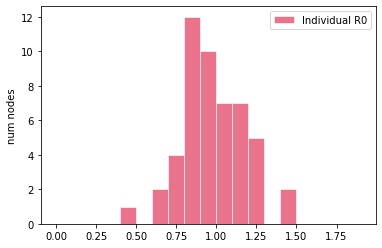

[INTERVENTIONS @ t = 0.31 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.01 (5 (10.00%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 1 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTER

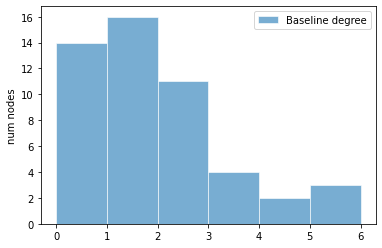

latent period:  mean = 3.56, std = 2.02, 95% CI = (0.58, 8.10)

pre-symptomatic period:  mean = 2.42, std = 1.59, 95% CI = (0.46, 6.39)

total incubation period:  mean = 5.98, std = 2.64, 95% CI = (1.63, 11.68)



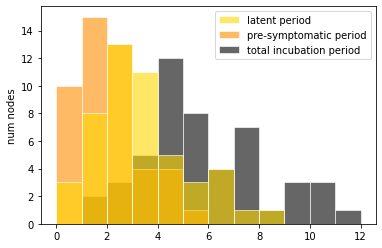

pre-symptomatic period:  mean = 3.56, std = 2.02, 95% CI = (0.58, 8.10)

(a)symptomatic period:  mean = 6.80, std = 2.09, 95% CI = (3.49, 11.25)

total infectious period:  mean = 10.36, std = 3.14, 95% CI = (5.23, 16.66)



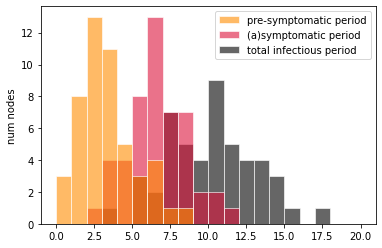

onset-to-hospitalization period:  mean = 8.33, std = 3.56, 95% CI = (3.70, 16.27)

hospitalization-to-discharge period:  mean = 13.52, std = 6.36, 95% CI = (3.10, 24.22)

onset-to-discharge period:  mean = 21.85, std = 7.18, 95% CI = (11.38, 35.61)



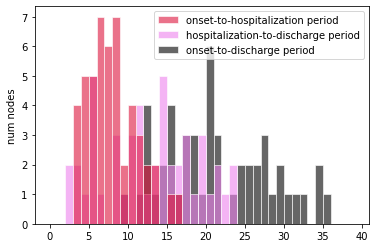

onset-to-hospitalization period:  mean = 8.33, std = 3.56, 95% CI = (3.70, 16.27)

hospitalization-to-death period:  mean = 7.29, std = 3.36, 95% CI = (2.54, 13.91)

onset-to-death period:  mean = 15.62, std = 4.69, 95% CI = (7.51, 25.04)



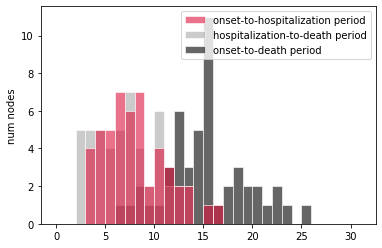

Individual R0:  mean = 1.04, std = 0.19, 95% CI = (0.73, 1.41)



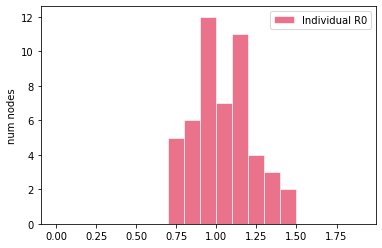

[INTERVENTIONS @ t = 0.24 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.72 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

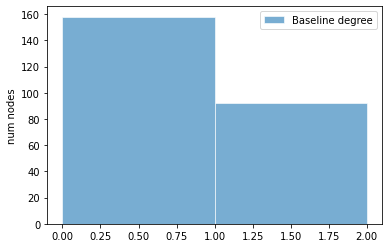

latent period:  mean = 3.46, std = 1.89, 95% CI = (0.83, 7.87)

pre-symptomatic period:  mean = 2.67, std = 1.60, 95% CI = (0.48, 6.70)

total incubation period:  mean = 6.13, std = 2.56, 95% CI = (2.03, 11.51)



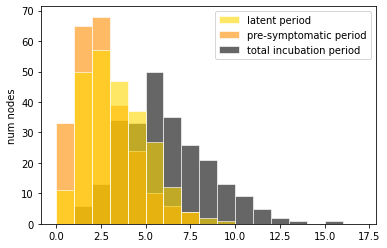

pre-symptomatic period:  mean = 3.46, std = 1.89, 95% CI = (0.83, 7.87)

(a)symptomatic period:  mean = 6.50, std = 2.57, 95% CI = (2.67, 11.97)

total infectious period:  mean = 9.95, std = 3.14, 95% CI = (4.86, 17.58)



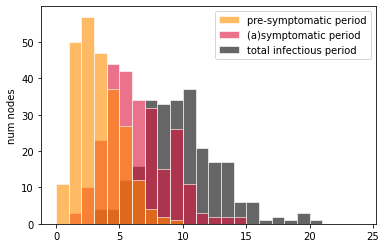

onset-to-hospitalization period:  mean = 7.79, std = 3.48, 95% CI = (2.64, 16.79)

hospitalization-to-discharge period:  mean = 13.90, std = 6.01, 95% CI = (4.76, 26.19)

onset-to-discharge period:  mean = 21.69, std = 7.02, 95% CI = (9.85, 38.28)



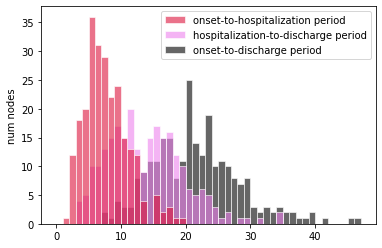

onset-to-hospitalization period:  mean = 7.79, std = 3.48, 95% CI = (2.64, 16.79)

hospitalization-to-death period:  mean = 6.93, std = 2.97, 95% CI = (2.42, 13.59)

onset-to-death period:  mean = 14.72, std = 4.64, 95% CI = (7.05, 25.56)



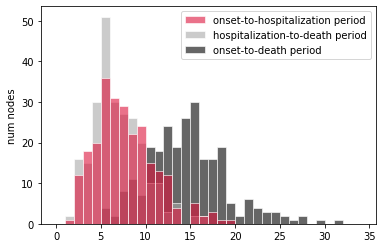

Individual R0:  mean = 0.99, std = 0.20, 95% CI = (0.64, 1.37)



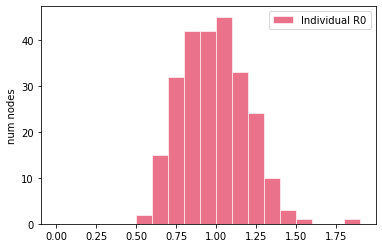

[INTERVENTIONS @ t = 0.03 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.22 (26 (10.40%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 6 positive (2.41 %) +]
	250	tested TOTAL            [+ 7 positive (2.80 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	7 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation


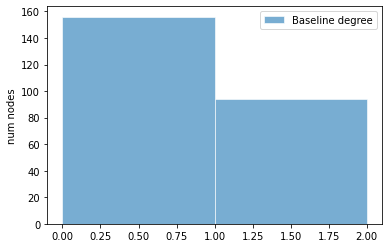

latent period:  mean = 3.33, std = 1.94, 95% CI = (0.59, 7.73)

pre-symptomatic period:  mean = 2.40, std = 1.57, 95% CI = (0.41, 6.52)

total incubation period:  mean = 5.73, std = 2.45, 95% CI = (2.14, 10.85)



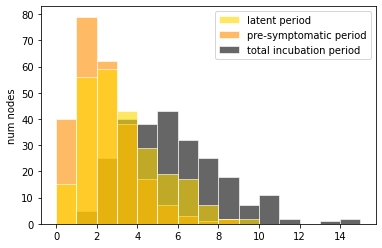

pre-symptomatic period:  mean = 3.33, std = 1.94, 95% CI = (0.59, 7.73)

(a)symptomatic period:  mean = 6.71, std = 2.44, 95% CI = (2.81, 11.32)

total infectious period:  mean = 10.04, std = 2.99, 95% CI = (5.49, 16.45)



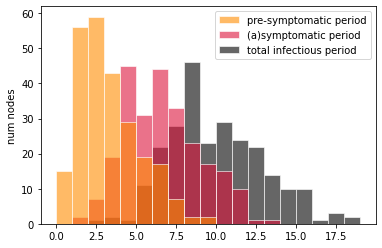

onset-to-hospitalization period:  mean = 7.96, std = 3.27, 95% CI = (2.62, 15.06)

hospitalization-to-discharge period:  mean = 13.88, std = 6.44, 95% CI = (4.63, 29.29)

onset-to-discharge period:  mean = 21.83, std = 7.22, 95% CI = (10.46, 37.39)



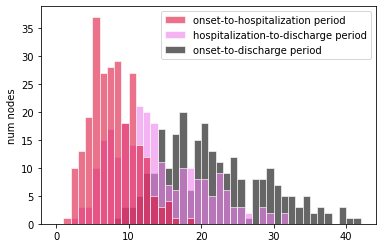

onset-to-hospitalization period:  mean = 7.96, std = 3.27, 95% CI = (2.62, 15.06)

hospitalization-to-death period:  mean = 6.47, std = 2.88, 95% CI = (1.93, 12.99)

onset-to-death period:  mean = 14.43, std = 4.26, 95% CI = (7.51, 22.66)



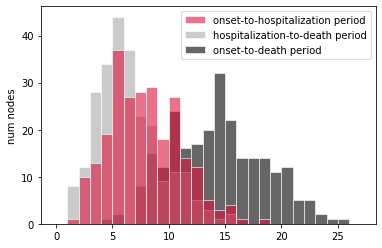

Individual R0:  mean = 1.01, std = 0.20, 95% CI = (0.65, 1.41)



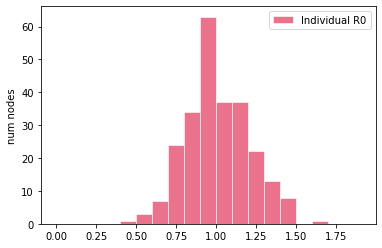

[INTERVENTIONS @ t = 0.09 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.09 (26 (10.40%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 5 positive (2.01 %) +]
	249	tested TOTAL            [+ 5 positive (2.01 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	5 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[I

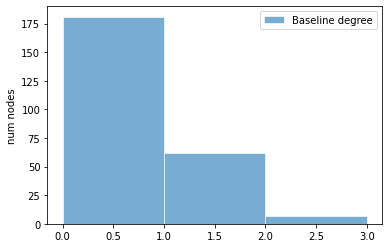

latent period:  mean = 3.55, std = 2.00, 95% CI = (0.70, 8.51)

pre-symptomatic period:  mean = 2.55, std = 1.45, 95% CI = (0.56, 6.02)

total incubation period:  mean = 6.09, std = 2.56, 95% CI = (2.23, 11.42)



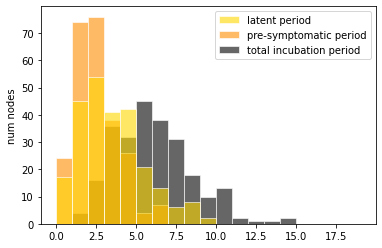

pre-symptomatic period:  mean = 3.55, std = 2.00, 95% CI = (0.70, 8.51)

(a)symptomatic period:  mean = 6.52, std = 2.67, 95% CI = (2.61, 12.33)

total infectious period:  mean = 10.07, std = 3.42, 95% CI = (4.91, 17.37)



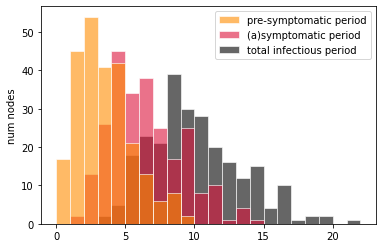

onset-to-hospitalization period:  mean = 8.08, std = 3.36, 95% CI = (2.58, 15.91)

hospitalization-to-discharge period:  mean = 13.81, std = 6.54, 95% CI = (4.78, 28.16)

onset-to-discharge period:  mean = 21.89, std = 7.36, 95% CI = (10.03, 37.58)



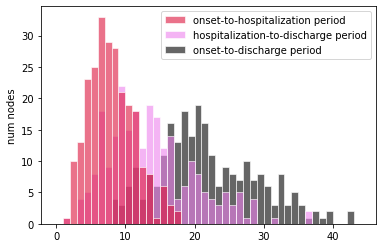

onset-to-hospitalization period:  mean = 8.08, std = 3.36, 95% CI = (2.58, 15.91)

hospitalization-to-death period:  mean = 6.66, std = 2.99, 95% CI = (1.90, 13.39)

onset-to-death period:  mean = 14.73, std = 4.46, 95% CI = (6.62, 24.94)



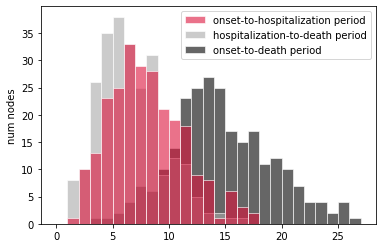

Individual R0:  mean = 1.00, std = 0.21, 95% CI = (0.63, 1.42)



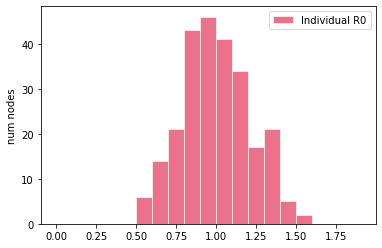

[INTERVENTIONS @ t = 0.17 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.08 (27 (10.80%) infected)]
	1	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 7 positive (2.81 %) +]
	250	tested TOTAL            [+ 7 positive (2.80 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	7 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[N

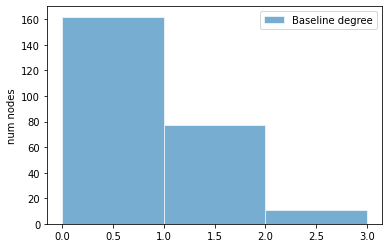

latent period:  mean = 3.49, std = 2.09, 95% CI = (0.74, 8.20)

pre-symptomatic period:  mean = 2.55, std = 1.49, 95% CI = (0.67, 5.99)

total incubation period:  mean = 6.05, std = 2.68, 95% CI = (2.28, 12.62)



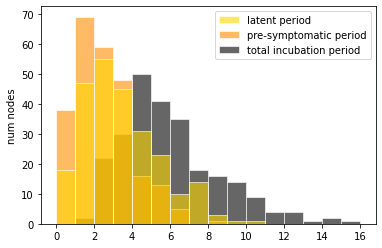

pre-symptomatic period:  mean = 3.49, std = 2.09, 95% CI = (0.74, 8.20)

(a)symptomatic period:  mean = 6.65, std = 2.70, 95% CI = (2.92, 12.77)

total infectious period:  mean = 10.14, std = 3.40, 95% CI = (5.05, 17.92)



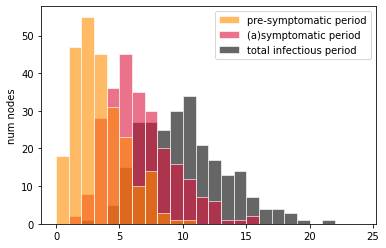

onset-to-hospitalization period:  mean = 7.84, std = 3.31, 95% CI = (2.19, 15.14)

hospitalization-to-discharge period:  mean = 13.93, std = 6.50, 95% CI = (5.01, 28.08)

onset-to-discharge period:  mean = 21.76, std = 7.41, 95% CI = (10.50, 39.61)



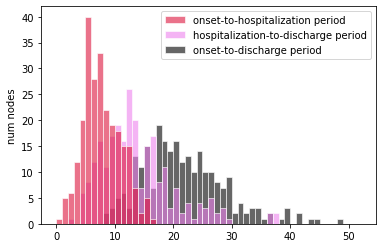

onset-to-hospitalization period:  mean = 7.84, std = 3.31, 95% CI = (2.19, 15.14)

hospitalization-to-death period:  mean = 7.12, std = 3.24, 95% CI = (2.22, 15.15)

onset-to-death period:  mean = 14.95, std = 4.60, 95% CI = (7.55, 25.44)



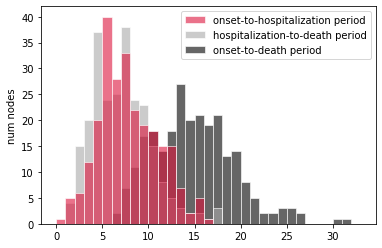

Individual R0:  mean = 1.01, std = 0.21, 95% CI = (0.67, 1.46)



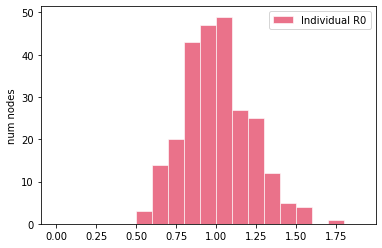

[NEW EXPOSURE @ t = 0.03 (1 exposed)]
[INTERVENTIONS @ t = 0.03 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.03 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 7 positive (2.81 %) +]
	249	tested TOTAL            [+ 7 positive (2.81 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	7 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmat

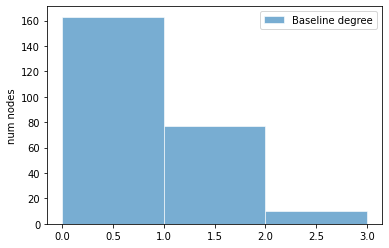

latent period:  mean = 3.70, std = 2.18, 95% CI = (0.77, 9.57)

pre-symptomatic period:  mean = 2.58, std = 1.48, 95% CI = (0.69, 6.30)

total incubation period:  mean = 6.28, std = 2.71, 95% CI = (2.53, 13.38)



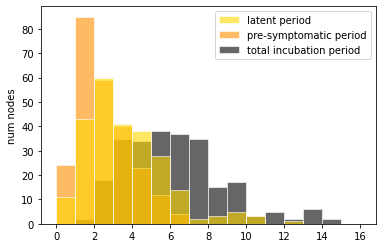

pre-symptomatic period:  mean = 3.70, std = 2.18, 95% CI = (0.77, 9.57)

(a)symptomatic period:  mean = 6.38, std = 2.38, 95% CI = (2.68, 12.13)

total infectious period:  mean = 10.07, std = 3.15, 95% CI = (4.77, 17.47)



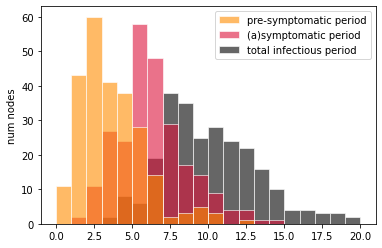

onset-to-hospitalization period:  mean = 8.10, std = 3.55, 95% CI = (2.51, 15.33)

hospitalization-to-discharge period:  mean = 14.29, std = 6.89, 95% CI = (4.63, 30.84)

onset-to-discharge period:  mean = 22.40, std = 7.73, 95% CI = (10.98, 39.98)



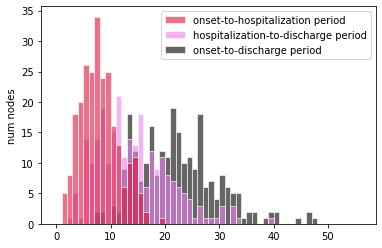

onset-to-hospitalization period:  mean = 8.10, std = 3.55, 95% CI = (2.51, 15.33)

hospitalization-to-death period:  mean = 7.02, std = 3.27, 95% CI = (2.39, 15.27)

onset-to-death period:  mean = 15.12, std = 4.99, 95% CI = (6.99, 25.87)



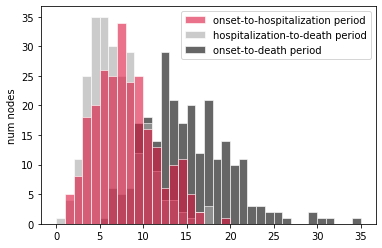

Individual R0:  mean = 1.02, std = 0.19, 95% CI = (0.71, 1.45)



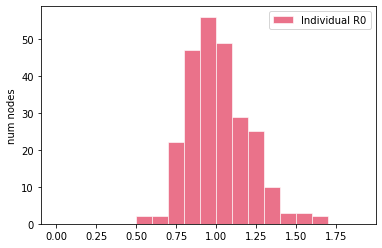

[NEW EXPOSURE @ t = 0.06 (1 exposed)]
[INTERVENTIONS @ t = 0.06 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.11 (27 (10.80%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 6 positive (2.41 %) +]
	249	tested TOTAL            [+ 6 positive (2.41 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	6 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmat

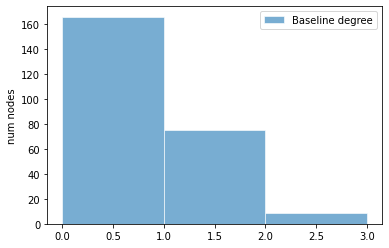

latent period:  mean = 3.51, std = 2.02, 95% CI = (0.85, 8.33)

pre-symptomatic period:  mean = 2.54, std = 1.48, 95% CI = (0.54, 5.71)

total incubation period:  mean = 6.04, std = 2.51, 95% CI = (2.13, 11.65)



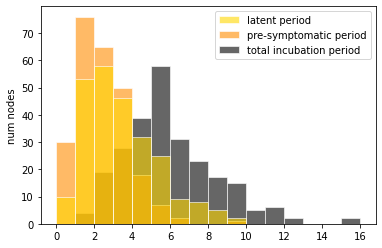

pre-symptomatic period:  mean = 3.51, std = 2.02, 95% CI = (0.85, 8.33)

(a)symptomatic period:  mean = 6.53, std = 2.54, 95% CI = (2.58, 12.82)

total infectious period:  mean = 10.04, std = 3.29, 95% CI = (4.92, 17.44)



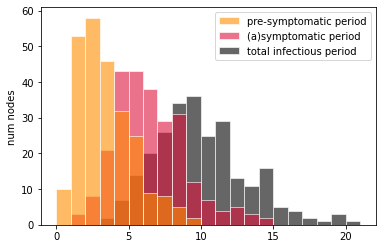

onset-to-hospitalization period:  mean = 8.17, std = 3.81, 95% CI = (2.33, 16.33)

hospitalization-to-discharge period:  mean = 14.33, std = 6.61, 95% CI = (4.77, 29.02)

onset-to-discharge period:  mean = 22.50, std = 7.19, 95% CI = (10.75, 37.61)



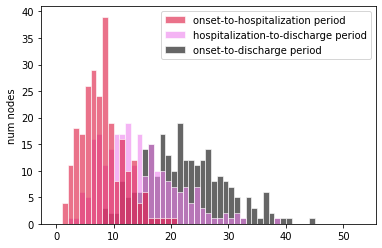

onset-to-hospitalization period:  mean = 8.17, std = 3.81, 95% CI = (2.33, 16.33)

hospitalization-to-death period:  mean = 6.92, std = 3.00, 95% CI = (2.67, 14.20)

onset-to-death period:  mean = 15.10, std = 5.00, 95% CI = (6.55, 26.74)



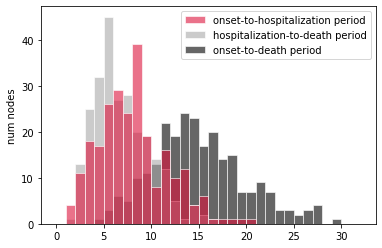

Individual R0:  mean = 0.99, std = 0.21, 95% CI = (0.65, 1.43)



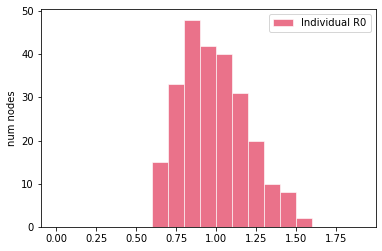

[INTERVENTIONS @ t = 0.07 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.18 (25 (10.00%) infected)]
	2	tested due to symptoms  [+ 2 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	248	tested randomly         [+ 10 positive (4.03 %) +]
	250	tested TOTAL            [+ 12 positive (4.80 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	12 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolati

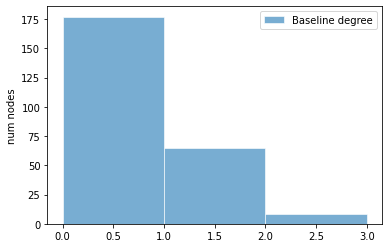

latent period:  mean = 3.57, std = 2.14, 95% CI = (0.84, 8.46)

pre-symptomatic period:  mean = 2.50, std = 1.48, 95% CI = (0.26, 6.10)

total incubation period:  mean = 6.07, std = 2.58, 95% CI = (2.31, 11.85)



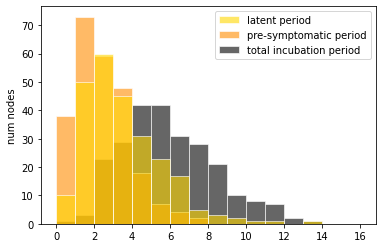

pre-symptomatic period:  mean = 3.57, std = 2.14, 95% CI = (0.84, 8.46)

(a)symptomatic period:  mean = 6.53, std = 2.54, 95% CI = (2.15, 12.33)

total infectious period:  mean = 10.10, std = 3.41, 95% CI = (4.49, 17.54)



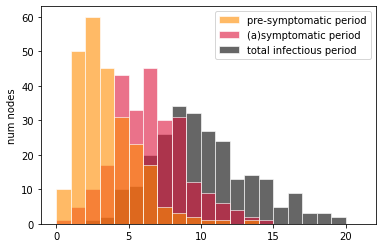

onset-to-hospitalization period:  mean = 8.33, std = 3.79, 95% CI = (2.50, 16.87)

hospitalization-to-discharge period:  mean = 13.41, std = 5.94, 95% CI = (4.26, 26.15)

onset-to-discharge period:  mean = 21.75, std = 6.88, 95% CI = (10.93, 36.87)



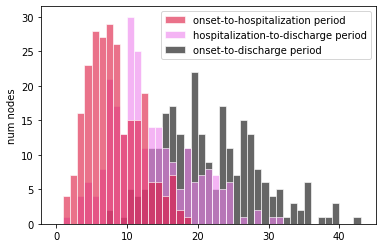

onset-to-hospitalization period:  mean = 8.33, std = 3.79, 95% CI = (2.50, 16.87)

hospitalization-to-death period:  mean = 6.91, std = 3.38, 95% CI = (2.08, 14.73)

onset-to-death period:  mean = 15.25, std = 5.05, 95% CI = (6.74, 25.71)



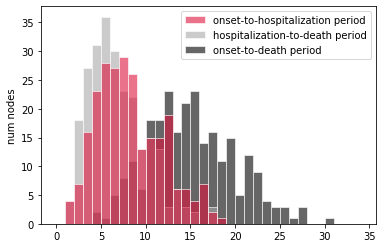

Individual R0:  mean = 1.00, std = 0.19, 95% CI = (0.66, 1.39)



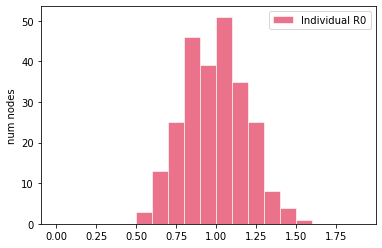

[NEW EXPOSURE @ t = 0.00 (1 exposed)]
[INTERVENTIONS @ t = 0.00 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[NEW EXPOSURE @ t = 1.02 (1 exposed)]
[INTERVENTIONS @ t = 1.02 (26 (10.40%) infected)]
	2	tested due to symptoms  [+ 2 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	248	tested randomly         [+ 7 positive (2.82 %) +]
	250	tested TOTAL            [+ 9 positive (3.60 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	9 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolat

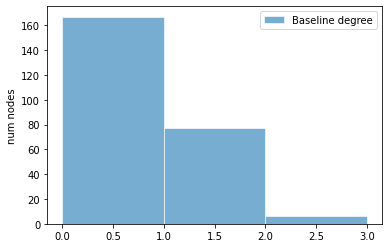

latent period:  mean = 3.40, std = 2.13, 95% CI = (0.59, 8.50)

pre-symptomatic period:  mean = 2.41, std = 1.46, 95% CI = (0.50, 6.14)

total incubation period:  mean = 5.81, std = 2.49, 95% CI = (2.36, 11.75)



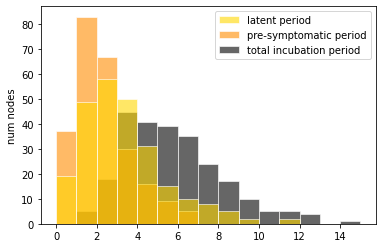

pre-symptomatic period:  mean = 3.40, std = 2.13, 95% CI = (0.59, 8.50)

(a)symptomatic period:  mean = 6.53, std = 2.51, 95% CI = (2.58, 11.83)

total infectious period:  mean = 9.93, std = 3.25, 95% CI = (4.83, 17.65)



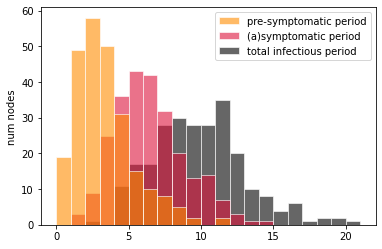

onset-to-hospitalization period:  mean = 8.09, std = 3.62, 95% CI = (2.42, 17.10)

hospitalization-to-discharge period:  mean = 14.21, std = 6.53, 95% CI = (5.02, 30.67)

onset-to-discharge period:  mean = 22.30, std = 7.60, 95% CI = (9.56, 38.25)



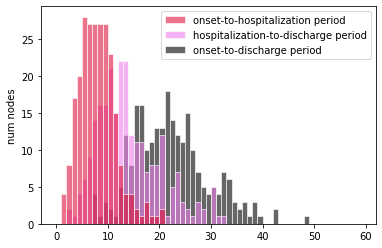

onset-to-hospitalization period:  mean = 8.09, std = 3.62, 95% CI = (2.42, 17.10)

hospitalization-to-death period:  mean = 6.85, std = 2.98, 95% CI = (2.01, 13.41)

onset-to-death period:  mean = 14.94, std = 4.61, 95% CI = (7.27, 25.33)



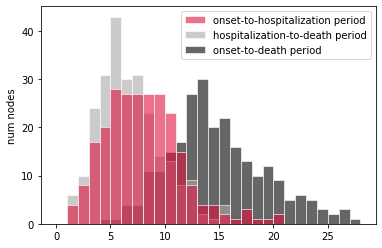

Individual R0:  mean = 0.99, std = 0.20, 95% CI = (0.63, 1.37)



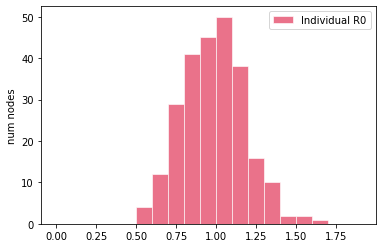

[INTERVENTIONS @ t = 0.02 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[NEW EXPOSURE @ t = 1.10 (1 exposed)]
[INTERVENTIONS @ t = 1.10 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 9 positive (3.61 %) +]
	249	tested TOTAL            [+ 9 positive (3.61 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	9 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmat

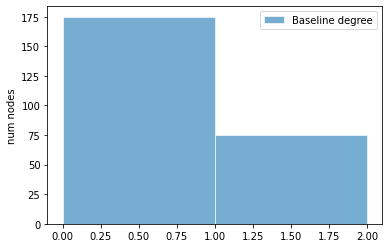

latent period:  mean = 3.59, std = 2.41, 95% CI = (0.59, 9.96)

pre-symptomatic period:  mean = 2.42, std = 1.43, 95% CI = (0.40, 5.71)

total incubation period:  mean = 6.01, std = 2.70, 95% CI = (1.84, 12.43)



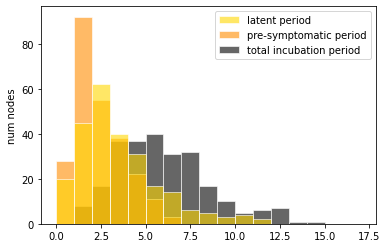

pre-symptomatic period:  mean = 3.59, std = 2.41, 95% CI = (0.59, 9.96)

(a)symptomatic period:  mean = 6.45, std = 2.61, 95% CI = (2.43, 11.85)

total infectious period:  mean = 10.04, std = 3.53, 95% CI = (4.44, 17.73)



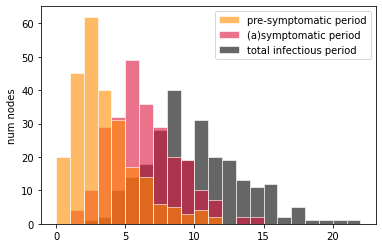

onset-to-hospitalization period:  mean = 7.63, std = 3.20, 95% CI = (2.12, 13.60)

hospitalization-to-discharge period:  mean = 13.89, std = 6.11, 95% CI = (4.57, 27.32)

onset-to-discharge period:  mean = 21.52, std = 6.88, 95% CI = (10.22, 36.94)



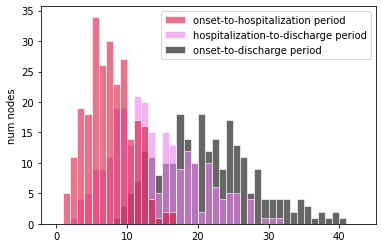

onset-to-hospitalization period:  mean = 7.63, std = 3.20, 95% CI = (2.12, 13.60)

hospitalization-to-death period:  mean = 6.60, std = 2.91, 95% CI = (2.24, 12.75)

onset-to-death period:  mean = 14.23, std = 4.38, 95% CI = (6.29, 23.47)



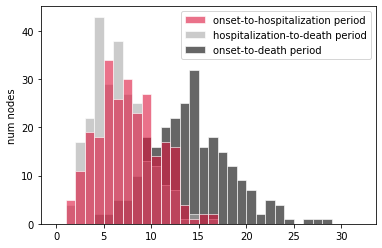

Individual R0:  mean = 0.99, std = 0.19, 95% CI = (0.70, 1.39)



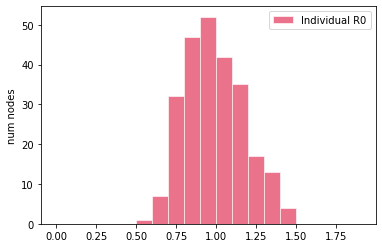

[INTERVENTIONS @ t = 0.03 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[NEW EXPOSURE @ t = 1.15 (1 exposed)]
[INTERVENTIONS @ t = 1.15 (25 (10.00%) infected)]
	2	tested due to symptoms  [+ 1 positive (50.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	248	tested randomly         [+ 6 positive (2.42 %) +]
	250	tested TOTAL            [+ 7 positive (2.80 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	7 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupma

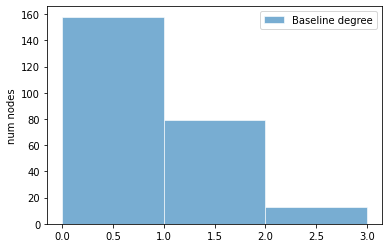

latent period:  mean = 3.62, std = 2.31, 95% CI = (0.79, 8.45)

pre-symptomatic period:  mean = 2.43, std = 1.39, 95% CI = (0.49, 5.99)

total incubation period:  mean = 6.04, std = 2.71, 95% CI = (2.30, 12.57)



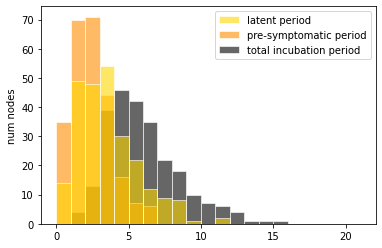

pre-symptomatic period:  mean = 3.62, std = 2.31, 95% CI = (0.79, 8.45)

(a)symptomatic period:  mean = 6.24, std = 2.30, 95% CI = (2.40, 11.94)

total infectious period:  mean = 9.86, std = 3.34, 95% CI = (5.09, 17.74)



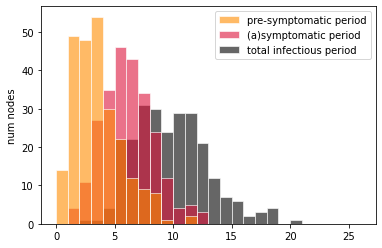

onset-to-hospitalization period:  mean = 7.96, std = 3.58, 95% CI = (2.73, 16.28)

hospitalization-to-discharge period:  mean = 13.55, std = 5.91, 95% CI = (4.64, 26.17)

onset-to-discharge period:  mean = 21.51, std = 7.00, 95% CI = (10.26, 37.17)



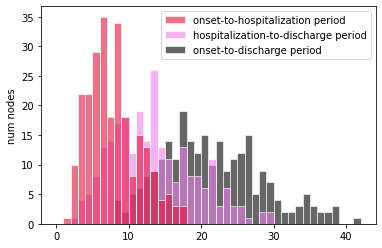

onset-to-hospitalization period:  mean = 7.96, std = 3.58, 95% CI = (2.73, 16.28)

hospitalization-to-death period:  mean = 6.75, std = 2.91, 95% CI = (2.22, 13.45)

onset-to-death period:  mean = 14.71, std = 4.61, 95% CI = (7.18, 23.86)



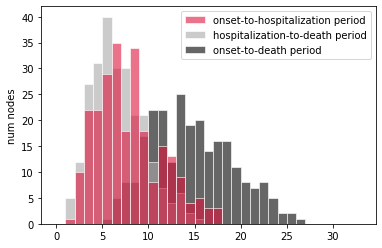

Individual R0:  mean = 1.00, std = 0.22, 95% CI = (0.64, 1.48)



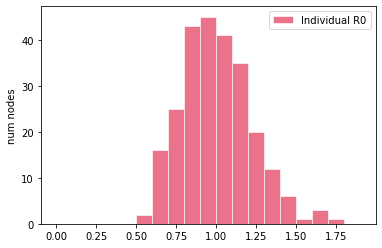

[INTERVENTIONS @ t = 0.03 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.07 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 12 positive (4.82 %) +]
	249	tested TOTAL            [+ 12 positive (4.82 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	12 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation

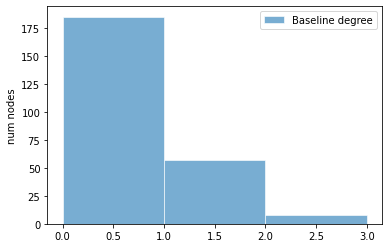

latent period:  mean = 3.72, std = 2.32, 95% CI = (0.76, 9.29)

pre-symptomatic period:  mean = 2.58, std = 1.52, 95% CI = (0.55, 6.43)

total incubation period:  mean = 6.30, std = 2.67, 95% CI = (2.23, 12.19)



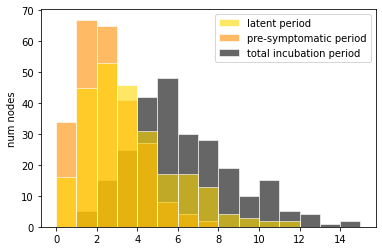

pre-symptomatic period:  mean = 3.72, std = 2.32, 95% CI = (0.76, 9.29)

(a)symptomatic period:  mean = 6.28, std = 2.70, 95% CI = (2.44, 13.00)

total infectious period:  mean = 10.00, std = 3.72, 95% CI = (4.12, 19.16)



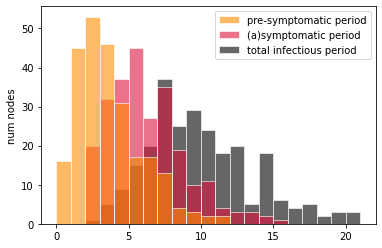

onset-to-hospitalization period:  mean = 7.69, std = 3.15, 95% CI = (2.48, 14.04)

hospitalization-to-discharge period:  mean = 13.88, std = 5.95, 95% CI = (4.45, 26.49)

onset-to-discharge period:  mean = 21.58, std = 6.43, 95% CI = (10.15, 35.04)



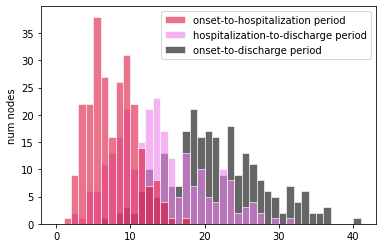

onset-to-hospitalization period:  mean = 7.69, std = 3.15, 95% CI = (2.48, 14.04)

hospitalization-to-death period:  mean = 6.69, std = 3.03, 95% CI = (2.21, 13.19)

onset-to-death period:  mean = 14.38, std = 4.38, 95% CI = (6.76, 23.71)



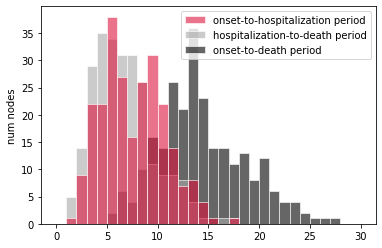

Individual R0:  mean = 1.01, std = 0.21, 95% CI = (0.65, 1.47)



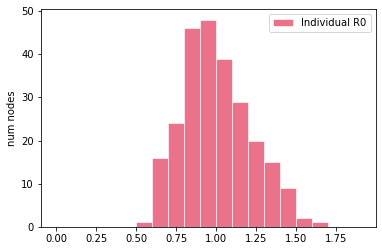

[INTERVENTIONS @ t = 0.02 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.05 (27 (10.80%) infected)]
	3	tested due to symptoms  [+ 2 positive (66.67 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	247	tested randomly         [+ 9 positive (3.64 %) +]
	250	tested TOTAL            [+ 11 positive (4.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	11 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation

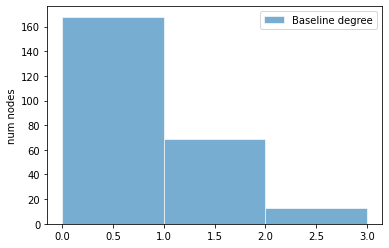

latent period:  mean = 3.44, std = 1.96, 95% CI = (0.85, 8.90)

pre-symptomatic period:  mean = 2.58, std = 1.51, 95% CI = (0.55, 6.24)

total incubation period:  mean = 6.02, std = 2.51, 95% CI = (2.31, 11.92)



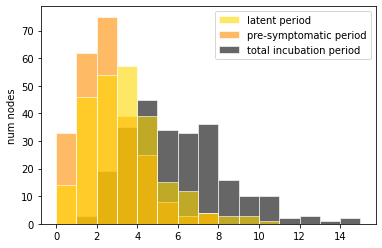

pre-symptomatic period:  mean = 3.44, std = 1.96, 95% CI = (0.85, 8.90)

(a)symptomatic period:  mean = 6.30, std = 2.47, 95% CI = (2.52, 11.91)

total infectious period:  mean = 9.75, std = 3.15, 95% CI = (4.87, 16.68)



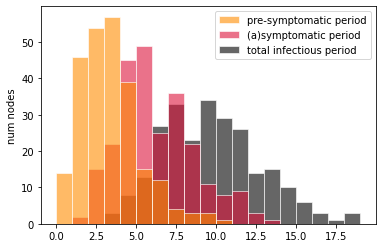

onset-to-hospitalization period:  mean = 7.87, std = 3.34, 95% CI = (2.78, 15.39)

hospitalization-to-discharge period:  mean = 13.56, std = 5.87, 95% CI = (4.82, 26.03)

onset-to-discharge period:  mean = 21.42, std = 6.76, 95% CI = (10.35, 34.68)



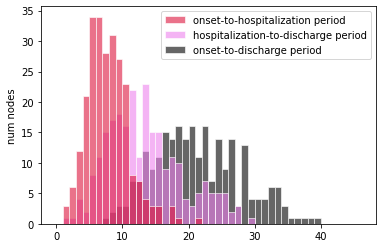

onset-to-hospitalization period:  mean = 7.87, std = 3.34, 95% CI = (2.78, 15.39)

hospitalization-to-death period:  mean = 7.04, std = 3.23, 95% CI = (1.94, 14.49)

onset-to-death period:  mean = 14.90, std = 4.72, 95% CI = (6.89, 26.09)



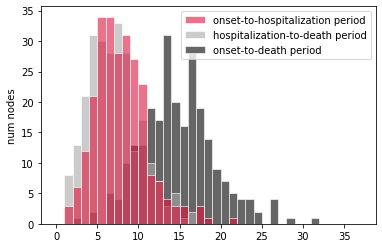

Individual R0:  mean = 0.99, std = 0.18, 95% CI = (0.69, 1.39)



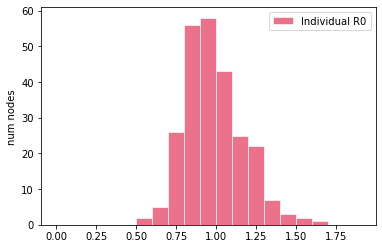

[INTERVENTIONS @ t = 0.02 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 0 positive (0.00 %) +]
	250	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.06 (26 (10.40%) infected)]
	1	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 9 positive (3.61 %) +]
	250	tested TOTAL            [+ 9 positive (3.60 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	9 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[I

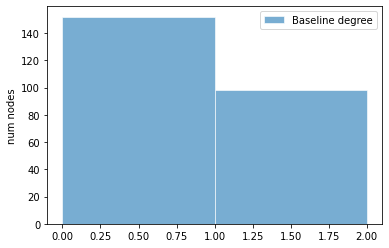

latent period:  mean = 3.55, std = 2.01, 95% CI = (0.97, 8.78)

pre-symptomatic period:  mean = 2.41, std = 1.37, 95% CI = (0.51, 5.53)

total incubation period:  mean = 5.96, std = 2.45, 95% CI = (2.34, 11.78)



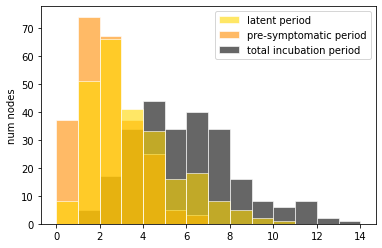

pre-symptomatic period:  mean = 3.55, std = 2.01, 95% CI = (0.97, 8.78)

(a)symptomatic period:  mean = 6.52, std = 2.44, 95% CI = (2.65, 11.56)

total infectious period:  mean = 10.08, std = 2.92, 95% CI = (5.73, 16.58)



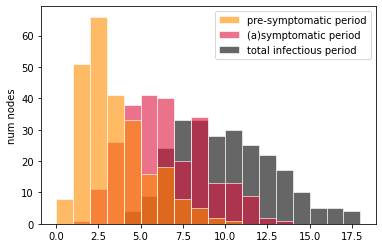

onset-to-hospitalization period:  mean = 8.10, std = 3.65, 95% CI = (2.48, 16.65)

hospitalization-to-discharge period:  mean = 14.47, std = 6.59, 95% CI = (4.71, 31.01)

onset-to-discharge period:  mean = 22.57, std = 7.42, 95% CI = (10.30, 39.68)



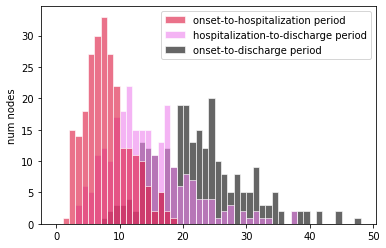

onset-to-hospitalization period:  mean = 8.10, std = 3.65, 95% CI = (2.48, 16.65)

hospitalization-to-death period:  mean = 7.00, std = 3.21, 95% CI = (2.23, 13.64)

onset-to-death period:  mean = 15.11, std = 4.64, 95% CI = (7.08, 24.77)



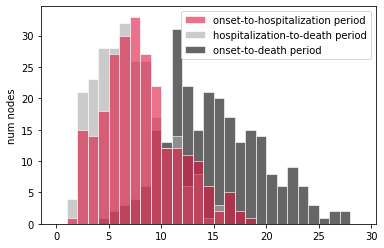

Individual R0:  mean = 1.01, std = 0.21, 95% CI = (0.66, 1.46)



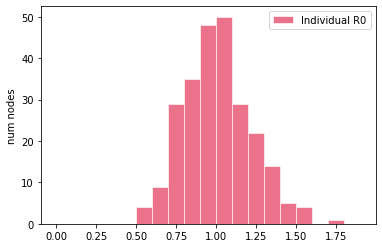

[INTERVENTIONS @ t = 0.10 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.19 (25 (10.00%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 6 positive (2.41 %) +]
	250	tested TOTAL            [+ 7 positive (2.80 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	7 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation


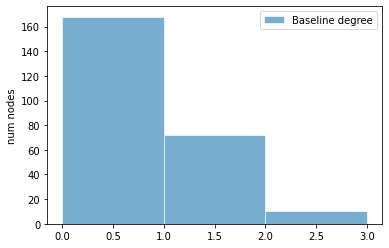

latent period:  mean = 3.78, std = 2.32, 95% CI = (0.51, 9.90)

pre-symptomatic period:  mean = 2.37, std = 1.38, 95% CI = (0.52, 5.54)

total incubation period:  mean = 6.15, std = 2.71, 95% CI = (2.27, 12.60)



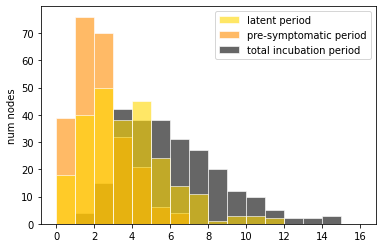

pre-symptomatic period:  mean = 3.78, std = 2.32, 95% CI = (0.51, 9.90)

(a)symptomatic period:  mean = 6.55, std = 2.72, 95% CI = (2.28, 13.68)

total infectious period:  mean = 10.33, std = 3.56, 95% CI = (4.86, 18.95)



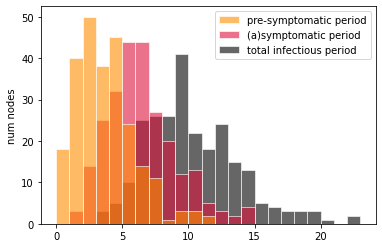

onset-to-hospitalization period:  mean = 8.09, std = 3.71, 95% CI = (2.64, 15.92)

hospitalization-to-discharge period:  mean = 13.78, std = 6.55, 95% CI = (5.03, 29.20)

onset-to-discharge period:  mean = 21.87, std = 7.49, 95% CI = (10.19, 40.22)



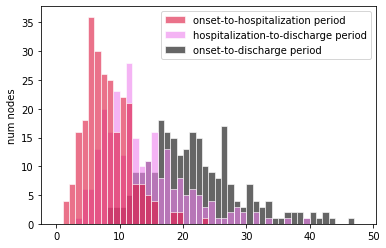

onset-to-hospitalization period:  mean = 8.09, std = 3.71, 95% CI = (2.64, 15.92)

hospitalization-to-death period:  mean = 6.58, std = 2.84, 95% CI = (1.87, 12.79)

onset-to-death period:  mean = 14.68, std = 4.74, 95% CI = (5.97, 26.83)



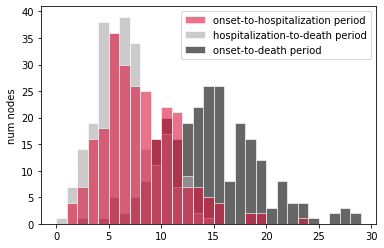

Individual R0:  mean = 1.01, std = 0.19, 95% CI = (0.68, 1.41)



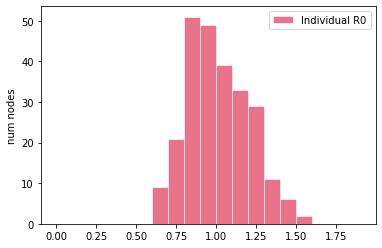

[NEW EXPOSURE @ t = 0.07 (1 exposed)]
[INTERVENTIONS @ t = 0.07 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.01 (29 (11.60%) infected)]
	2	tested due to symptoms  [+ 1 positive (50.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	248	tested randomly         [+ 7 positive (2.82 %) +]
	250	tested TOTAL            [+ 8 positive (3.20 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	8 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupma

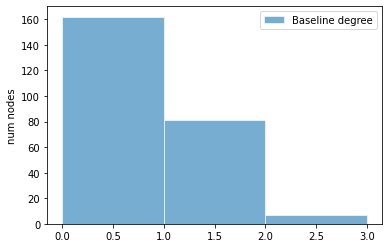

latent period:  mean = 3.47, std = 2.11, 95% CI = (0.67, 8.82)

pre-symptomatic period:  mean = 2.47, std = 1.47, 95% CI = (0.54, 5.80)

total incubation period:  mean = 5.94, std = 2.48, 95% CI = (2.33, 12.02)



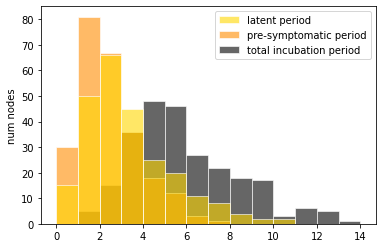

pre-symptomatic period:  mean = 3.47, std = 2.11, 95% CI = (0.67, 8.82)

(a)symptomatic period:  mean = 6.58, std = 2.75, 95% CI = (2.42, 13.22)

total infectious period:  mean = 10.05, std = 3.52, 95% CI = (5.00, 18.73)



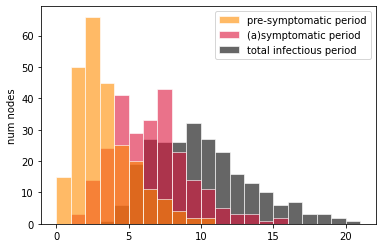

onset-to-hospitalization period:  mean = 7.85, std = 3.78, 95% CI = (2.25, 16.48)

hospitalization-to-discharge period:  mean = 13.99, std = 6.40, 95% CI = (4.07, 27.61)

onset-to-discharge period:  mean = 21.84, std = 7.35, 95% CI = (9.68, 40.41)



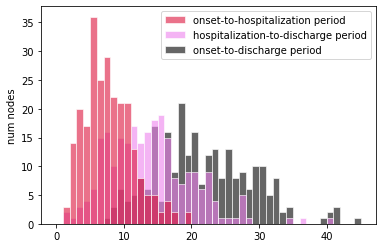

onset-to-hospitalization period:  mean = 7.85, std = 3.78, 95% CI = (2.25, 16.48)

hospitalization-to-death period:  mean = 7.07, std = 3.17, 95% CI = (2.26, 14.02)

onset-to-death period:  mean = 14.92, std = 5.08, 95% CI = (6.14, 27.88)



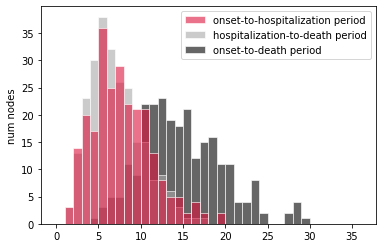

Individual R0:  mean = 1.01, std = 0.19, 95% CI = (0.70, 1.44)



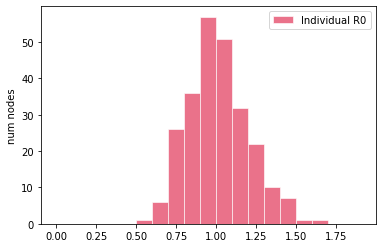

[INTERVENTIONS @ t = 0.00 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.06 (26 (10.40%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 6 positive (2.41 %) +]
	249	tested TOTAL            [+ 6 positive (2.41 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	6 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[I

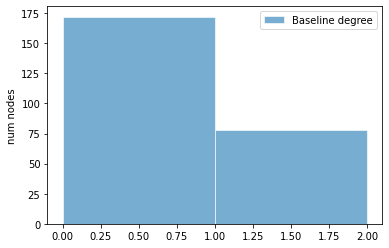

latent period:  mean = 3.60, std = 2.29, 95% CI = (0.66, 8.74)

pre-symptomatic period:  mean = 2.40, std = 1.32, 95% CI = (0.73, 5.69)

total incubation period:  mean = 6.00, std = 2.73, 95% CI = (2.20, 12.76)



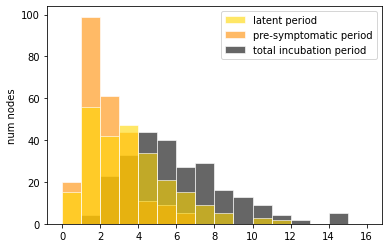

pre-symptomatic period:  mean = 3.60, std = 2.29, 95% CI = (0.66, 8.74)

(a)symptomatic period:  mean = 6.57, std = 2.54, 95% CI = (2.63, 12.26)

total infectious period:  mean = 10.17, std = 3.48, 95% CI = (4.70, 18.35)



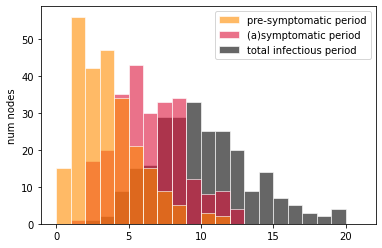

onset-to-hospitalization period:  mean = 7.86, std = 4.20, 95% CI = (2.32, 16.98)

hospitalization-to-discharge period:  mean = 14.31, std = 6.45, 95% CI = (4.40, 28.38)

onset-to-discharge period:  mean = 22.18, std = 7.96, 95% CI = (8.99, 39.10)



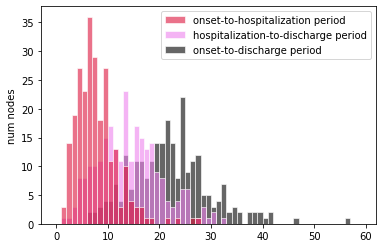

onset-to-hospitalization period:  mean = 7.86, std = 4.20, 95% CI = (2.32, 16.98)

hospitalization-to-death period:  mean = 6.98, std = 3.14, 95% CI = (2.38, 13.99)

onset-to-death period:  mean = 14.84, std = 5.17, 95% CI = (7.03, 26.78)



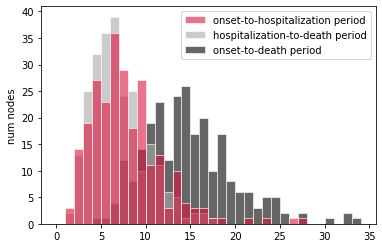

Individual R0:  mean = 1.01, std = 0.20, 95% CI = (0.66, 1.43)



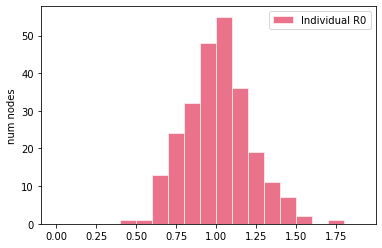

[INTERVENTIONS @ t = 0.03 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.09 (25 (10.00%) infected)]
	2	tested due to symptoms  [+ 1 positive (50.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	2	tested TOTAL            [+ 1 positive (50.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[NEW

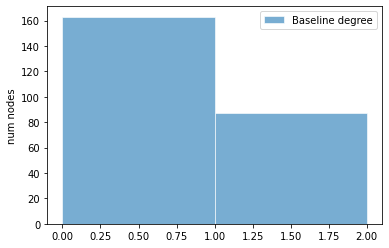

latent period:  mean = 3.46, std = 2.11, 95% CI = (0.72, 8.20)

pre-symptomatic period:  mean = 2.44, std = 1.34, 95% CI = (0.40, 5.38)

total incubation period:  mean = 5.90, std = 2.54, 95% CI = (2.30, 11.59)



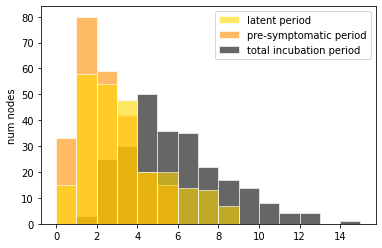

pre-symptomatic period:  mean = 3.46, std = 2.11, 95% CI = (0.72, 8.20)

(a)symptomatic period:  mean = 6.67, std = 2.48, 95% CI = (2.74, 13.04)

total infectious period:  mean = 10.13, std = 3.18, 95% CI = (4.92, 16.67)



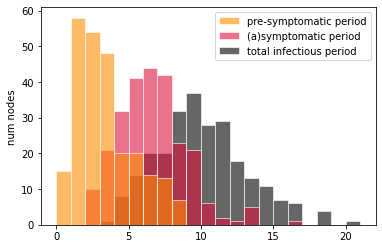

onset-to-hospitalization period:  mean = 7.94, std = 3.75, 95% CI = (2.26, 17.26)

hospitalization-to-discharge period:  mean = 13.62, std = 6.08, 95% CI = (4.78, 26.25)

onset-to-discharge period:  mean = 21.56, std = 7.16, 95% CI = (10.69, 37.38)



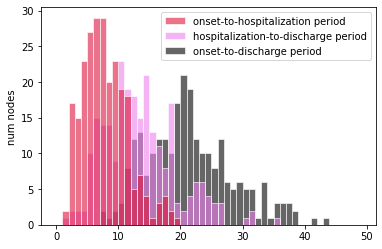

onset-to-hospitalization period:  mean = 7.94, std = 3.75, 95% CI = (2.26, 17.26)

hospitalization-to-death period:  mean = 7.27, std = 3.27, 95% CI = (2.00, 14.90)

onset-to-death period:  mean = 15.21, std = 4.94, 95% CI = (6.71, 26.20)



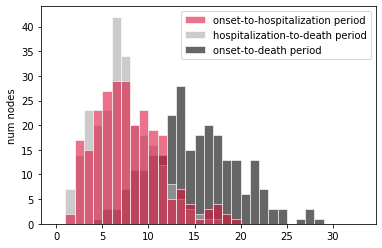

Individual R0:  mean = 0.99, std = 0.20, 95% CI = (0.64, 1.43)



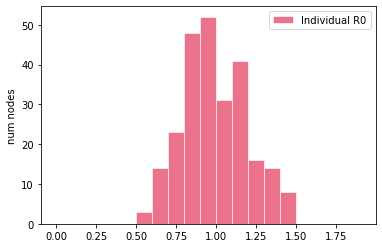

[NEW EXPOSURE @ t = 0.02 (1 exposed)]
[INTERVENTIONS @ t = 0.02 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.01 (26 (10.40%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates o

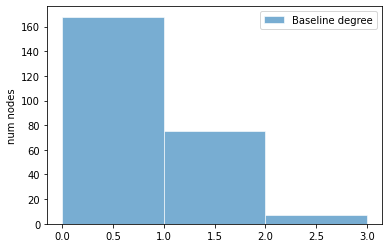

latent period:  mean = 3.41, std = 1.86, 95% CI = (0.77, 7.45)

pre-symptomatic period:  mean = 2.39, std = 1.43, 95% CI = (0.41, 5.71)

total incubation period:  mean = 5.80, std = 2.43, 95% CI = (1.90, 11.03)



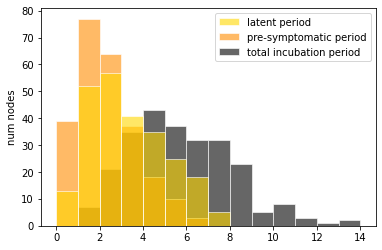

pre-symptomatic period:  mean = 3.41, std = 1.86, 95% CI = (0.77, 7.45)

(a)symptomatic period:  mean = 6.56, std = 2.46, 95% CI = (2.53, 12.24)

total infectious period:  mean = 9.97, std = 3.08, 95% CI = (4.73, 16.63)



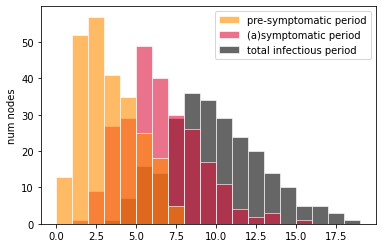

onset-to-hospitalization period:  mean = 7.94, std = 3.42, 95% CI = (3.06, 16.82)

hospitalization-to-discharge period:  mean = 14.19, std = 6.40, 95% CI = (4.58, 28.55)

onset-to-discharge period:  mean = 22.14, std = 7.20, 95% CI = (8.98, 37.97)



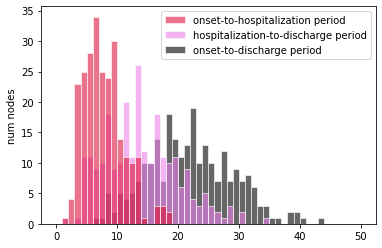

onset-to-hospitalization period:  mean = 7.94, std = 3.42, 95% CI = (3.06, 16.82)

hospitalization-to-death period:  mean = 7.02, std = 3.02, 95% CI = (2.49, 13.25)

onset-to-death period:  mean = 14.97, std = 4.68, 95% CI = (7.51, 25.53)



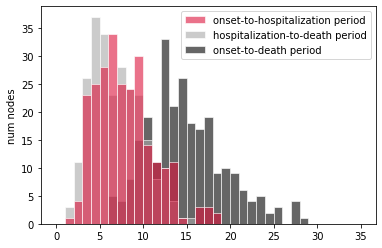

Individual R0:  mean = 1.00, std = 0.21, 95% CI = (0.66, 1.45)



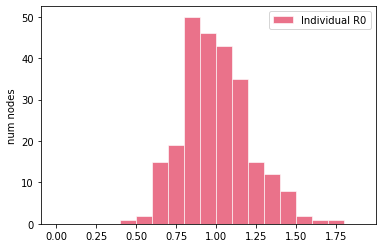

[INTERVENTIONS @ t = 0.16 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.02 (30 (12.00%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 1 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[N

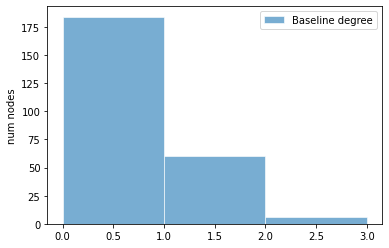

latent period:  mean = 3.42, std = 1.95, 95% CI = (0.77, 7.61)

pre-symptomatic period:  mean = 2.58, std = 1.60, 95% CI = (0.42, 6.30)

total incubation period:  mean = 6.01, std = 2.52, 95% CI = (2.26, 11.68)



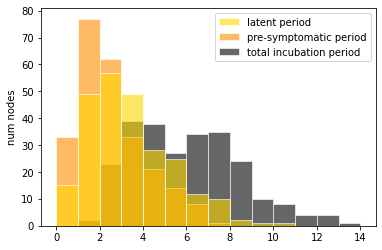

pre-symptomatic period:  mean = 3.42, std = 1.95, 95% CI = (0.77, 7.61)

(a)symptomatic period:  mean = 6.34, std = 2.36, 95% CI = (2.70, 11.77)

total infectious period:  mean = 9.77, std = 3.13, 95% CI = (4.96, 17.14)



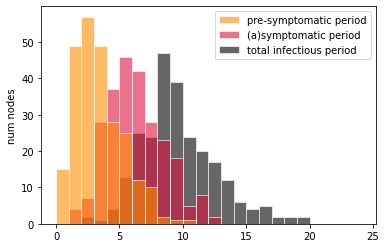

onset-to-hospitalization period:  mean = 8.23, std = 3.65, 95% CI = (2.64, 16.41)

hospitalization-to-discharge period:  mean = 13.76, std = 5.61, 95% CI = (4.95, 26.24)

onset-to-discharge period:  mean = 21.99, std = 6.97, 95% CI = (10.95, 37.44)



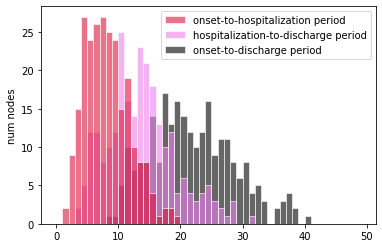

onset-to-hospitalization period:  mean = 8.23, std = 3.65, 95% CI = (2.64, 16.41)

hospitalization-to-death period:  mean = 7.26, std = 3.12, 95% CI = (2.46, 14.18)

onset-to-death period:  mean = 15.49, std = 4.97, 95% CI = (7.43, 25.70)



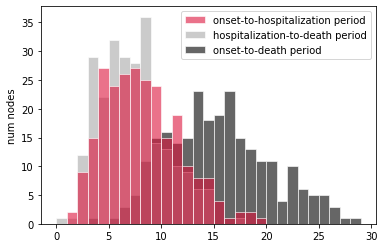

Individual R0:  mean = 1.01, std = 0.21, 95% CI = (0.64, 1.42)



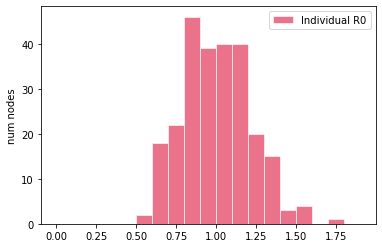

[INTERVENTIONS @ t = 0.01 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 0 positive (0.00 %) +]
	250	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.02 (25 (10.00%) infected)]
	2	tested due to symptoms  [+ 2 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	2	tested TOTAL            [+ 2 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	2 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[I

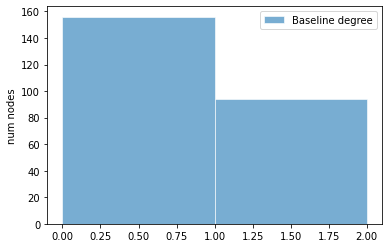

latent period:  mean = 3.40, std = 2.02, 95% CI = (0.72, 8.04)

pre-symptomatic period:  mean = 2.53, std = 1.55, 95% CI = (0.45, 6.54)

total incubation period:  mean = 5.94, std = 2.64, 95% CI = (2.14, 11.67)



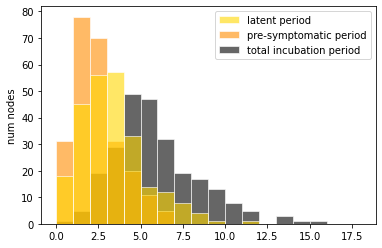

pre-symptomatic period:  mean = 3.40, std = 2.02, 95% CI = (0.72, 8.04)

(a)symptomatic period:  mean = 6.54, std = 2.56, 95% CI = (2.23, 12.52)

total infectious period:  mean = 9.94, std = 3.27, 95% CI = (4.05, 17.25)



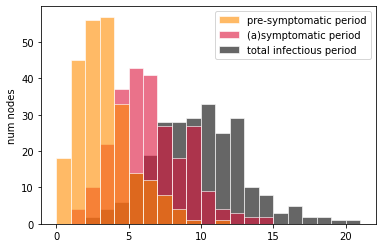

onset-to-hospitalization period:  mean = 7.99, std = 3.88, 95% CI = (2.58, 15.94)

hospitalization-to-discharge period:  mean = 14.01, std = 6.43, 95% CI = (4.01, 28.13)

onset-to-discharge period:  mean = 22.01, std = 7.38, 95% CI = (10.63, 38.28)



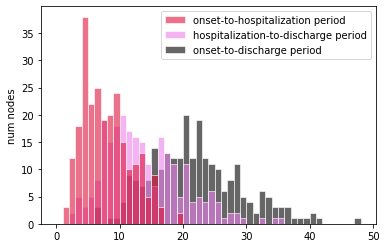

onset-to-hospitalization period:  mean = 7.99, std = 3.88, 95% CI = (2.58, 15.94)

hospitalization-to-death period:  mean = 7.13, std = 3.20, 95% CI = (2.06, 13.69)

onset-to-death period:  mean = 15.12, std = 5.19, 95% CI = (6.53, 27.65)



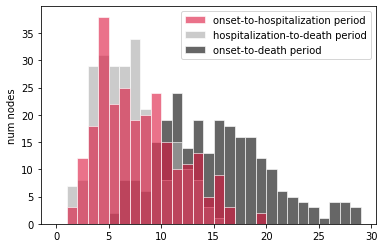

Individual R0:  mean = 1.01, std = 0.20, 95% CI = (0.66, 1.47)



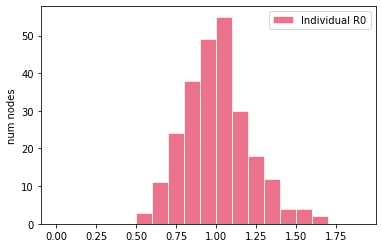

[INTERVENTIONS @ t = 0.04 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.00 (23 (9.20%) infected)]
	2	tested due to symptoms  [+ 2 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	2	tested TOTAL            [+ 2 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	2 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[IN

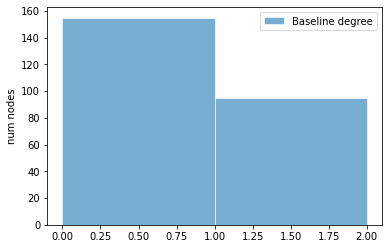

latent period:  mean = 3.61, std = 2.18, 95% CI = (0.71, 8.85)

pre-symptomatic period:  mean = 2.41, std = 1.52, 95% CI = (0.49, 6.11)

total incubation period:  mean = 6.02, std = 2.74, 95% CI = (1.95, 12.26)



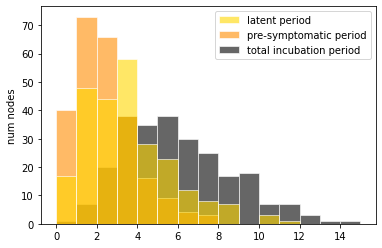

pre-symptomatic period:  mean = 3.61, std = 2.18, 95% CI = (0.71, 8.85)

(a)symptomatic period:  mean = 6.62, std = 2.78, 95% CI = (2.45, 12.36)

total infectious period:  mean = 10.23, std = 3.45, 95% CI = (4.83, 18.74)



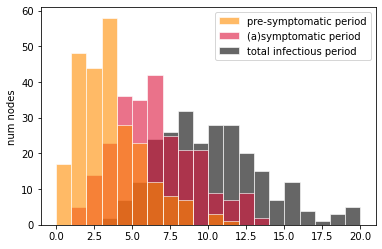

onset-to-hospitalization period:  mean = 8.16, std = 3.57, 95% CI = (2.64, 16.56)

hospitalization-to-discharge period:  mean = 13.56, std = 5.60, 95% CI = (5.31, 26.40)

onset-to-discharge period:  mean = 21.72, std = 6.64, 95% CI = (11.46, 35.45)



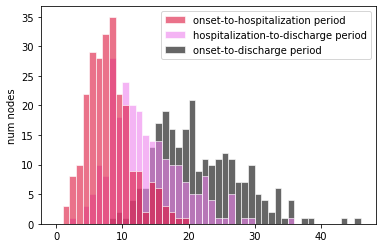

onset-to-hospitalization period:  mean = 8.16, std = 3.57, 95% CI = (2.64, 16.56)

hospitalization-to-death period:  mean = 6.94, std = 3.28, 95% CI = (2.43, 15.09)

onset-to-death period:  mean = 15.10, std = 4.86, 95% CI = (7.06, 26.43)



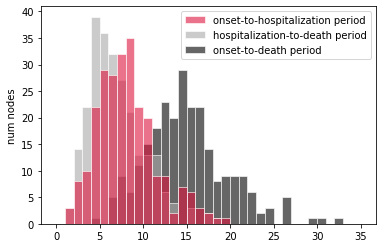

Individual R0:  mean = 1.01, std = 0.20, 95% CI = (0.67, 1.41)



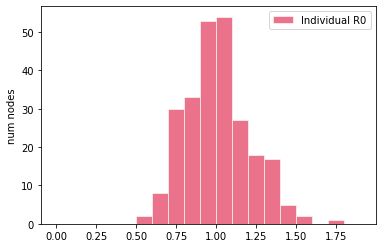

[NEW EXPOSURE @ t = 0.04 (1 exposed)]
[INTERVENTIONS @ t = 0.04 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 0 positive (0.00 %) +]
	250	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.02 (26 (10.40%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates o

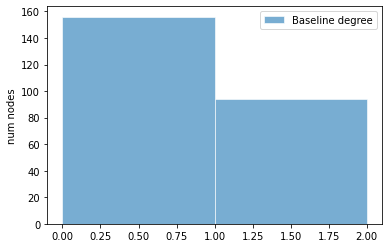

latent period:  mean = 3.52, std = 2.20, 95% CI = (0.63, 9.00)

pre-symptomatic period:  mean = 2.47, std = 1.51, 95% CI = (0.36, 5.97)

total incubation period:  mean = 5.99, std = 2.64, 95% CI = (2.12, 11.91)



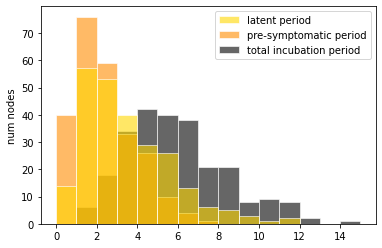

pre-symptomatic period:  mean = 3.52, std = 2.20, 95% CI = (0.63, 9.00)

(a)symptomatic period:  mean = 6.55, std = 2.55, 95% CI = (2.58, 12.81)

total infectious period:  mean = 10.07, std = 3.43, 95% CI = (4.78, 18.23)



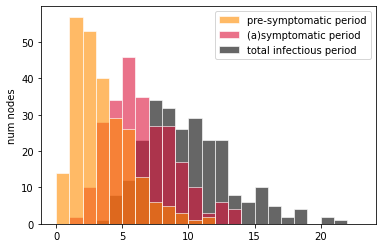

onset-to-hospitalization period:  mean = 8.09, std = 3.66, 95% CI = (2.36, 16.44)

hospitalization-to-discharge period:  mean = 14.00, std = 6.31, 95% CI = (4.87, 27.71)

onset-to-discharge period:  mean = 22.09, std = 7.59, 95% CI = (10.96, 40.35)



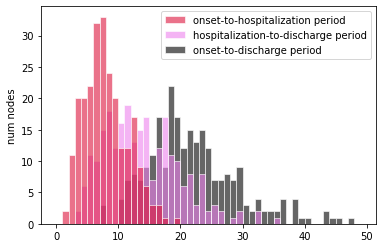

onset-to-hospitalization period:  mean = 8.09, std = 3.66, 95% CI = (2.36, 16.44)

hospitalization-to-death period:  mean = 7.08, std = 3.13, 95% CI = (2.32, 14.51)

onset-to-death period:  mean = 15.17, std = 4.92, 95% CI = (7.94, 26.07)



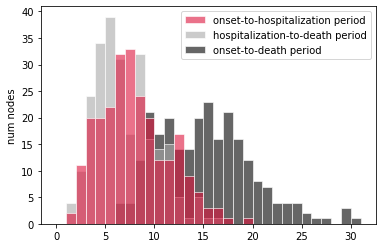

Individual R0:  mean = 1.02, std = 0.22, 95% CI = (0.63, 1.49)



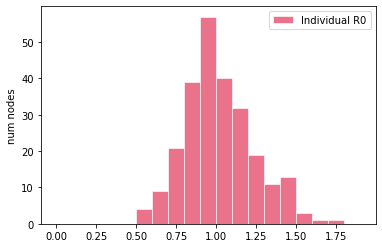

[INTERVENTIONS @ t = 0.02 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.01 (26 (10.40%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 1 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[I

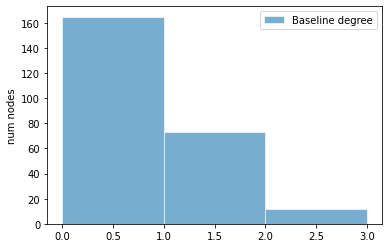

latent period:  mean = 3.41, std = 2.11, 95% CI = (0.69, 9.01)

pre-symptomatic period:  mean = 2.49, std = 1.53, 95% CI = (0.51, 6.50)

total incubation period:  mean = 5.89, std = 2.66, 95% CI = (2.24, 12.05)



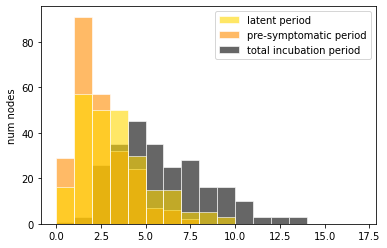

pre-symptomatic period:  mean = 3.41, std = 2.11, 95% CI = (0.69, 9.01)

(a)symptomatic period:  mean = 6.31, std = 2.43, 95% CI = (2.35, 12.33)

total infectious period:  mean = 9.72, std = 3.27, 95% CI = (4.28, 17.00)



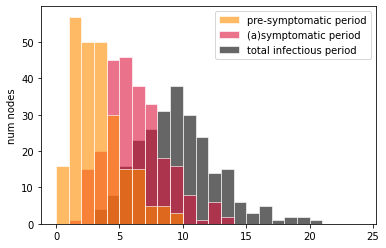

onset-to-hospitalization period:  mean = 7.82, std = 3.67, 95% CI = (2.57, 16.49)

hospitalization-to-discharge period:  mean = 14.15, std = 6.09, 95% CI = (5.24, 28.32)

onset-to-discharge period:  mean = 21.98, std = 6.86, 95% CI = (10.42, 36.81)



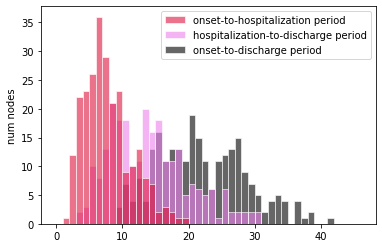

onset-to-hospitalization period:  mean = 7.82, std = 3.67, 95% CI = (2.57, 16.49)

hospitalization-to-death period:  mean = 6.75, std = 2.93, 95% CI = (2.30, 13.01)

onset-to-death period:  mean = 14.58, std = 4.76, 95% CI = (7.11, 25.24)



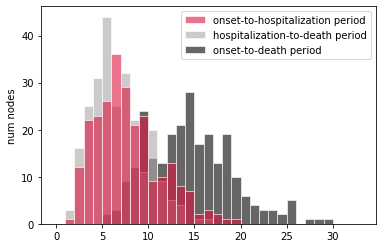

Individual R0:  mean = 1.00, std = 0.21, 95% CI = (0.64, 1.42)



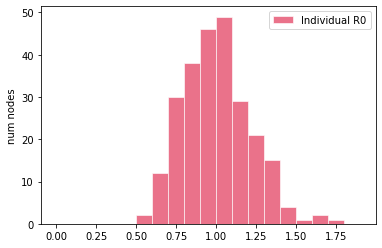

[INTERVENTIONS @ t = 0.01 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 0 positive (0.00 %) +]
	250	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.01 (25 (10.00%) infected)]
	2	tested due to symptoms  [+ 2 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	2	tested TOTAL            [+ 2 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	2 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[I

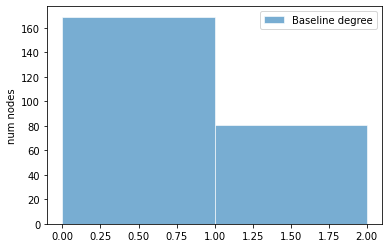

latent period:  mean = 3.29, std = 1.92, 95% CI = (0.57, 7.62)

pre-symptomatic period:  mean = 2.54, std = 1.47, 95% CI = (0.43, 6.05)

total incubation period:  mean = 5.84, std = 2.31, 95% CI = (2.25, 10.72)



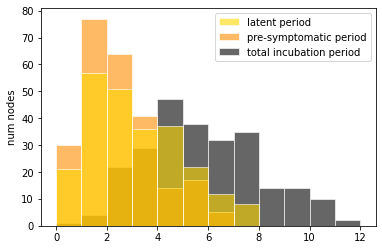

pre-symptomatic period:  mean = 3.29, std = 1.92, 95% CI = (0.57, 7.62)

(a)symptomatic period:  mean = 6.58, std = 2.79, 95% CI = (2.20, 12.72)

total infectious period:  mean = 9.87, std = 3.29, 95% CI = (4.62, 17.16)



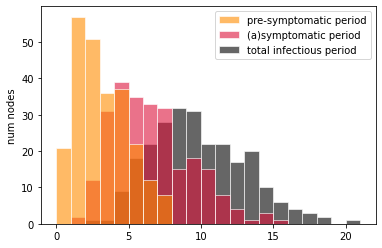

onset-to-hospitalization period:  mean = 7.94, std = 3.96, 95% CI = (2.46, 16.02)

hospitalization-to-discharge period:  mean = 13.79, std = 6.08, 95% CI = (3.91, 26.43)

onset-to-discharge period:  mean = 21.73, std = 7.19, 95% CI = (10.35, 36.86)



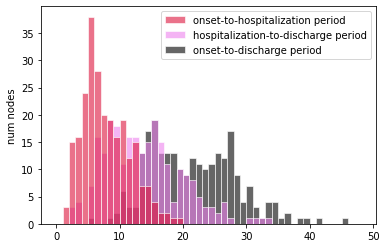

onset-to-hospitalization period:  mean = 7.94, std = 3.96, 95% CI = (2.46, 16.02)

hospitalization-to-death period:  mean = 7.11, std = 3.11, 95% CI = (1.97, 14.57)

onset-to-death period:  mean = 15.05, std = 4.94, 95% CI = (6.56, 24.97)



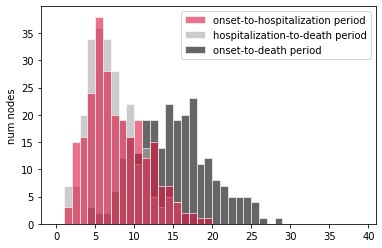

Individual R0:  mean = 1.01, std = 0.19, 95% CI = (0.68, 1.42)



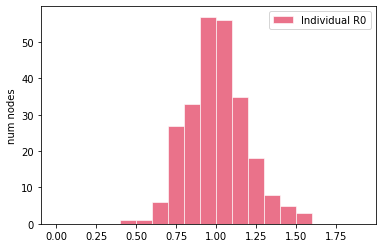

[NEW EXPOSURE @ t = 0.03 (1 exposed)]
[INTERVENTIONS @ t = 0.03 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.00 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates o

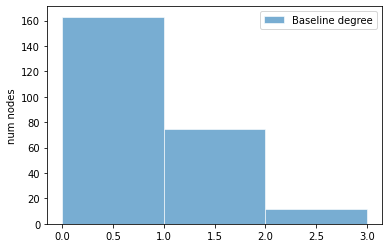

latent period:  mean = 3.52, std = 2.06, 95% CI = (0.85, 8.43)

pre-symptomatic period:  mean = 2.80, std = 1.65, 95% CI = (0.61, 7.12)

total incubation period:  mean = 6.32, std = 2.75, 95% CI = (2.12, 12.69)



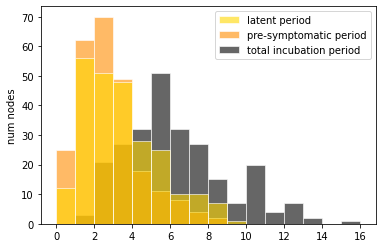

pre-symptomatic period:  mean = 3.52, std = 2.06, 95% CI = (0.85, 8.43)

(a)symptomatic period:  mean = 6.57, std = 2.58, 95% CI = (2.21, 11.88)

total infectious period:  mean = 10.09, std = 3.55, 95% CI = (4.13, 17.41)



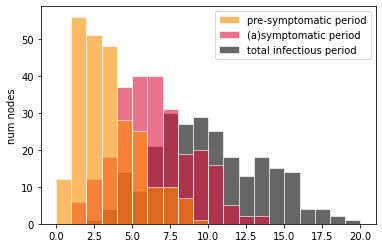

onset-to-hospitalization period:  mean = 7.90, std = 3.54, 95% CI = (2.43, 16.70)

hospitalization-to-discharge period:  mean = 13.82, std = 6.72, 95% CI = (4.25, 31.44)

onset-to-discharge period:  mean = 21.71, std = 7.56, 95% CI = (10.28, 40.71)



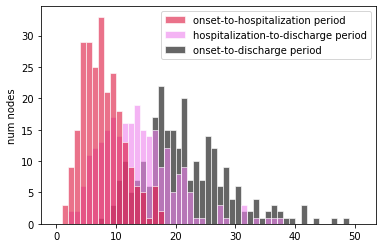

onset-to-hospitalization period:  mean = 7.90, std = 3.54, 95% CI = (2.43, 16.70)

hospitalization-to-death period:  mean = 6.96, std = 3.19, 95% CI = (2.47, 14.16)

onset-to-death period:  mean = 14.86, std = 4.85, 95% CI = (6.97, 25.83)



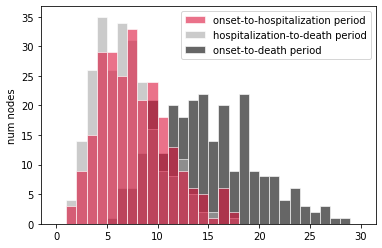

Individual R0:  mean = 1.01, std = 0.20, 95% CI = (0.66, 1.45)



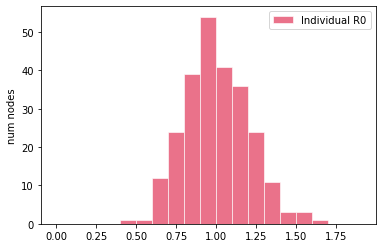

[INTERVENTIONS @ t = 0.11 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[NEW EXPOSURE @ t = 1.13 (1 exposed)]
[INTERVENTIONS @ t = 1.13 (26 (10.40%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates o

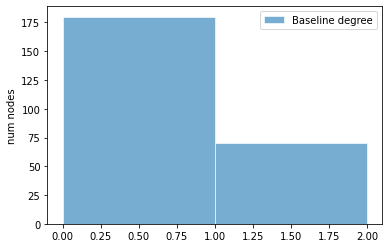

latent period:  mean = 3.66, std = 1.95, 95% CI = (0.90, 8.02)

pre-symptomatic period:  mean = 2.48, std = 1.45, 95% CI = (0.42, 5.91)

total incubation period:  mean = 6.14, std = 2.39, 95% CI = (2.40, 11.75)



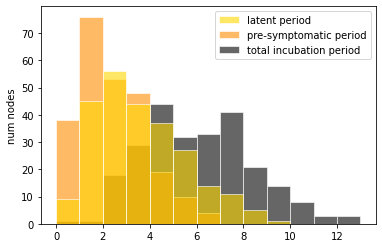

pre-symptomatic period:  mean = 3.66, std = 1.95, 95% CI = (0.90, 8.02)

(a)symptomatic period:  mean = 6.49, std = 2.47, 95% CI = (2.32, 12.04)

total infectious period:  mean = 10.14, std = 3.06, 95% CI = (4.83, 16.57)



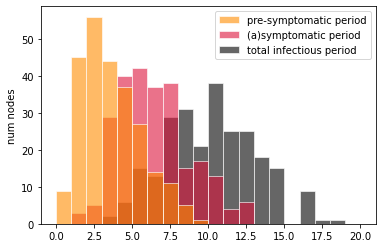

onset-to-hospitalization period:  mean = 8.18, std = 3.67, 95% CI = (2.63, 16.06)

hospitalization-to-discharge period:  mean = 14.11, std = 6.41, 95% CI = (4.71, 31.46)

onset-to-discharge period:  mean = 22.29, std = 7.09, 95% CI = (11.47, 38.57)



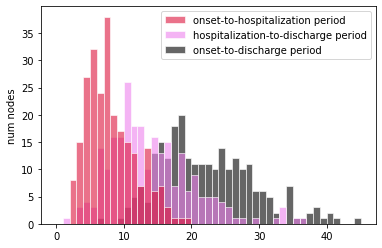

onset-to-hospitalization period:  mean = 8.18, std = 3.67, 95% CI = (2.63, 16.06)

hospitalization-to-death period:  mean = 7.07, std = 3.38, 95% CI = (2.44, 14.70)

onset-to-death period:  mean = 15.26, std = 5.06, 95% CI = (7.09, 26.51)



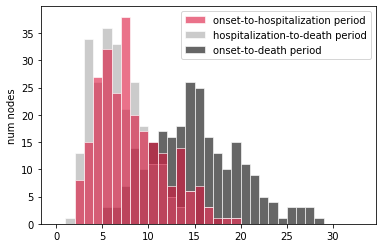

Individual R0:  mean = 1.02, std = 0.20, 95% CI = (0.68, 1.44)



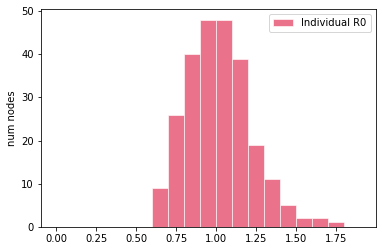

[INTERVENTIONS @ t = 0.02 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.03 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTER

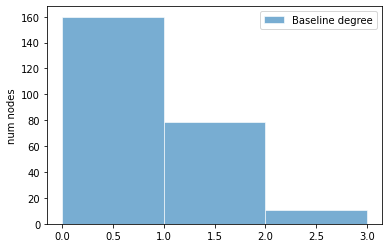

latent period:  mean = 3.48, std = 2.01, 95% CI = (0.69, 8.38)

pre-symptomatic period:  mean = 2.39, std = 1.40, 95% CI = (0.46, 5.97)

total incubation period:  mean = 5.87, std = 2.32, 95% CI = (1.96, 11.61)



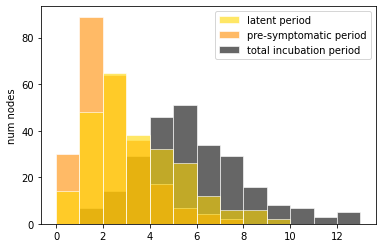

pre-symptomatic period:  mean = 3.48, std = 2.01, 95% CI = (0.69, 8.38)

(a)symptomatic period:  mean = 6.53, std = 2.65, 95% CI = (2.39, 12.79)

total infectious period:  mean = 10.01, std = 3.35, 95% CI = (4.42, 17.36)



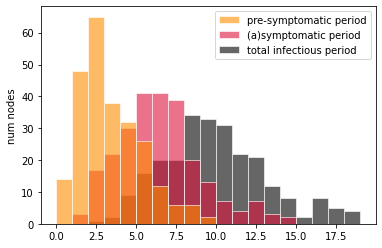

onset-to-hospitalization period:  mean = 8.26, std = 3.68, 95% CI = (2.37, 15.83)

hospitalization-to-discharge period:  mean = 14.51, std = 6.14, 95% CI = (5.05, 28.37)

onset-to-discharge period:  mean = 22.78, std = 7.31, 95% CI = (11.36, 39.07)



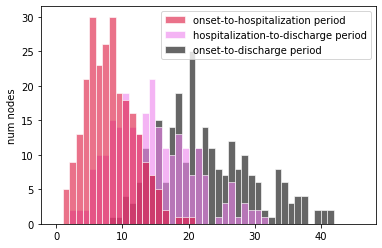

onset-to-hospitalization period:  mean = 8.26, std = 3.68, 95% CI = (2.37, 15.83)

hospitalization-to-death period:  mean = 6.71, std = 2.89, 95% CI = (2.34, 13.52)

onset-to-death period:  mean = 14.97, std = 4.60, 95% CI = (7.08, 24.87)



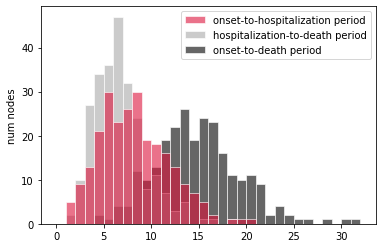

Individual R0:  mean = 0.97, std = 0.19, 95% CI = (0.65, 1.40)



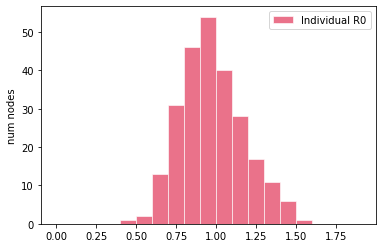

[INTERVENTIONS @ t = 0.08 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.01 (25 (10.00%) infected)]
	1	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTER

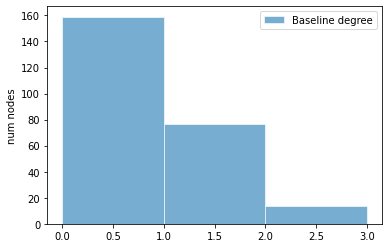

latent period:  mean = 3.37, std = 1.98, 95% CI = (0.67, 8.28)

pre-symptomatic period:  mean = 2.47, std = 1.41, 95% CI = (0.52, 6.13)

total incubation period:  mean = 5.84, std = 2.39, 95% CI = (2.19, 11.34)



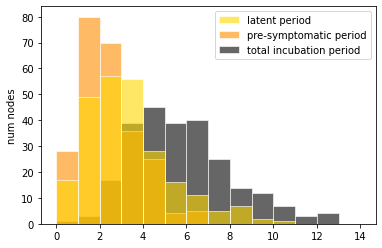

pre-symptomatic period:  mean = 3.37, std = 1.98, 95% CI = (0.67, 8.28)

(a)symptomatic period:  mean = 6.43, std = 2.67, 95% CI = (2.17, 12.60)

total infectious period:  mean = 9.80, std = 3.43, 95% CI = (3.97, 17.40)



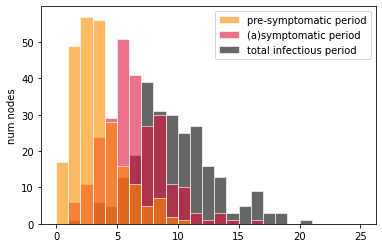

onset-to-hospitalization period:  mean = 8.25, std = 3.76, 95% CI = (2.81, 16.31)

hospitalization-to-discharge period:  mean = 13.96, std = 7.08, 95% CI = (3.66, 29.98)

onset-to-discharge period:  mean = 22.21, std = 8.13, 95% CI = (8.75, 40.27)



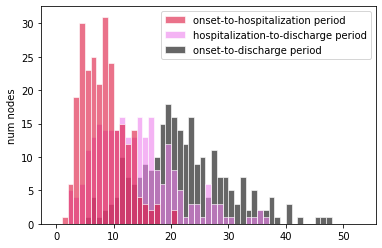

onset-to-hospitalization period:  mean = 8.25, std = 3.76, 95% CI = (2.81, 16.31)

hospitalization-to-death period:  mean = 6.82, std = 2.97, 95% CI = (2.49, 13.85)

onset-to-death period:  mean = 15.07, std = 4.63, 95% CI = (7.26, 24.26)



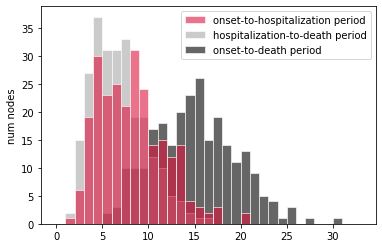

Individual R0:  mean = 0.98, std = 0.20, 95% CI = (0.67, 1.38)



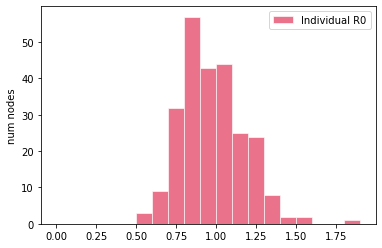

[INTERVENTIONS @ t = 0.01 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 0 positive (0.00 %) +]
	250	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.23 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTER

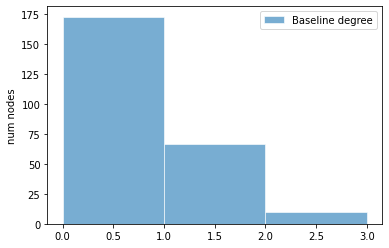

latent period:  mean = 3.39, std = 1.93, 95% CI = (0.78, 8.23)

pre-symptomatic period:  mean = 2.65, std = 1.57, 95% CI = (0.63, 6.36)

total incubation period:  mean = 6.04, std = 2.42, 95% CI = (2.61, 11.65)



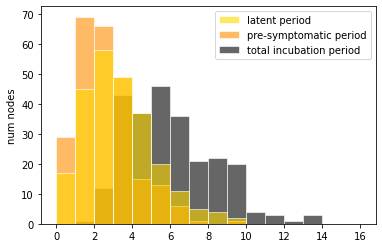

pre-symptomatic period:  mean = 3.39, std = 1.93, 95% CI = (0.78, 8.23)

(a)symptomatic period:  mean = 6.24, std = 2.43, 95% CI = (2.65, 11.94)

total infectious period:  mean = 9.63, std = 3.10, 95% CI = (4.79, 15.95)



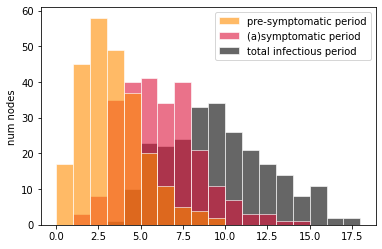

onset-to-hospitalization period:  mean = 7.92, std = 3.63, 95% CI = (2.85, 16.76)

hospitalization-to-discharge period:  mean = 13.67, std = 6.68, 95% CI = (4.34, 28.35)

onset-to-discharge period:  mean = 21.59, std = 7.42, 95% CI = (10.69, 38.82)



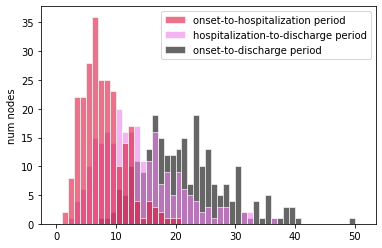

onset-to-hospitalization period:  mean = 7.92, std = 3.63, 95% CI = (2.85, 16.76)

hospitalization-to-death period:  mean = 7.25, std = 3.37, 95% CI = (2.43, 16.00)

onset-to-death period:  mean = 15.17, std = 5.22, 95% CI = (7.06, 27.05)



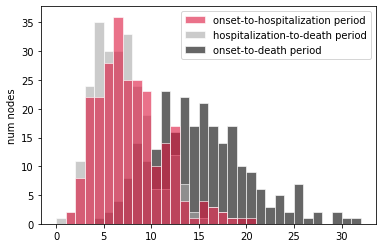

Individual R0:  mean = 0.99, std = 0.20, 95% CI = (0.60, 1.39)



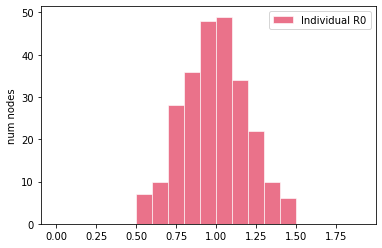

[INTERVENTIONS @ t = 0.00 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 0 positive (0.00 %) +]
	250	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.03 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[NEW E

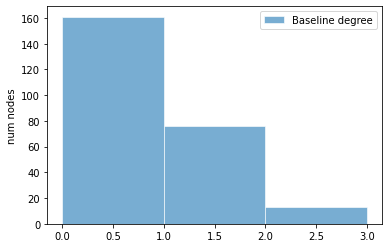

latent period:  mean = 3.77, std = 2.17, 95% CI = (0.86, 8.80)

pre-symptomatic period:  mean = 2.56, std = 1.54, 95% CI = (0.53, 6.35)

total incubation period:  mean = 6.33, std = 2.57, 95% CI = (2.66, 12.19)



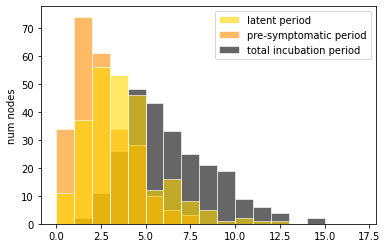

pre-symptomatic period:  mean = 3.77, std = 2.17, 95% CI = (0.86, 8.80)

(a)symptomatic period:  mean = 6.61, std = 2.51, 95% CI = (2.66, 12.19)

total infectious period:  mean = 10.39, std = 3.32, 95% CI = (5.13, 17.34)



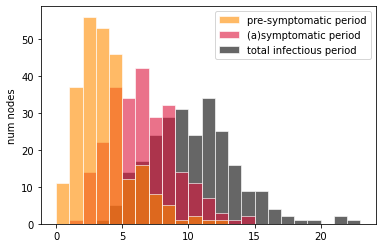

onset-to-hospitalization period:  mean = 7.86, std = 3.33, 95% CI = (2.67, 15.13)

hospitalization-to-discharge period:  mean = 14.62, std = 6.85, 95% CI = (4.39, 29.27)

onset-to-discharge period:  mean = 22.48, std = 7.59, 95% CI = (9.86, 36.93)



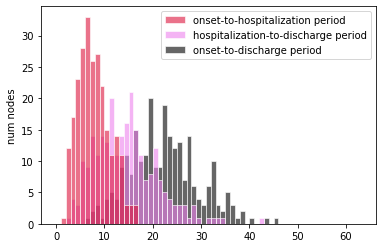

onset-to-hospitalization period:  mean = 7.86, std = 3.33, 95% CI = (2.67, 15.13)

hospitalization-to-death period:  mean = 6.35, std = 2.89, 95% CI = (1.86, 13.30)

onset-to-death period:  mean = 14.21, std = 4.19, 95% CI = (6.78, 23.63)



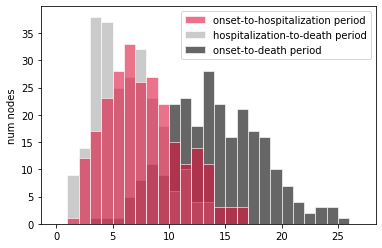

Individual R0:  mean = 0.98, std = 0.21, 95% CI = (0.68, 1.47)



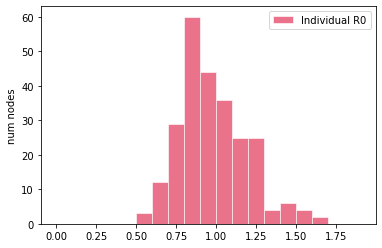

[INTERVENTIONS @ t = 0.02 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.08 (25 (10.00%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 1 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[N

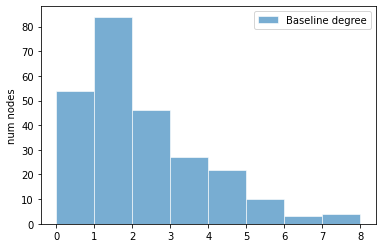

latent period:  mean = 3.29, std = 1.93, 95% CI = (0.64, 8.42)

pre-symptomatic period:  mean = 2.51, std = 1.59, 95% CI = (0.50, 6.89)

total incubation period:  mean = 5.80, std = 2.48, 95% CI = (1.61, 11.74)



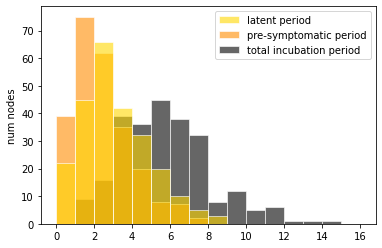

pre-symptomatic period:  mean = 3.29, std = 1.93, 95% CI = (0.64, 8.42)

(a)symptomatic period:  mean = 6.75, std = 2.75, 95% CI = (2.63, 13.16)

total infectious period:  mean = 10.04, std = 3.33, 95% CI = (4.77, 17.14)



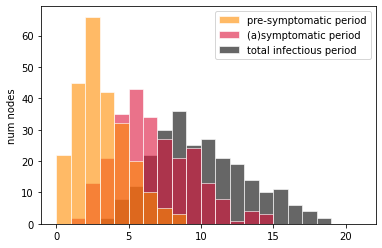

onset-to-hospitalization period:  mean = 8.15, std = 3.86, 95% CI = (2.71, 17.71)

hospitalization-to-discharge period:  mean = 14.94, std = 6.33, 95% CI = (4.51, 29.54)

onset-to-discharge period:  mean = 23.09, std = 7.23, 95% CI = (11.34, 39.21)



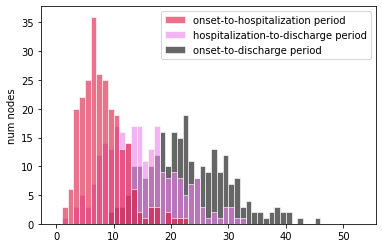

onset-to-hospitalization period:  mean = 8.15, std = 3.86, 95% CI = (2.71, 17.71)

hospitalization-to-death period:  mean = 6.96, std = 3.18, 95% CI = (2.16, 14.22)

onset-to-death period:  mean = 15.11, std = 4.92, 95% CI = (8.05, 26.51)



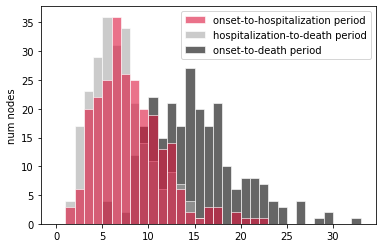

Individual R0:  mean = 0.99, std = 0.22, 95% CI = (0.65, 1.42)



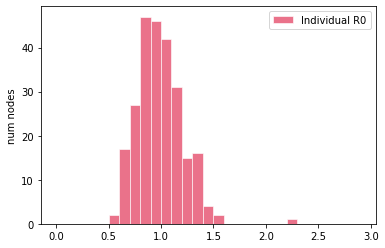

[INTERVENTIONS @ t = 0.01 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.03 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 5 positive (2.01 %) +]
	249	tested TOTAL            [+ 5 positive (2.01 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	5 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[I

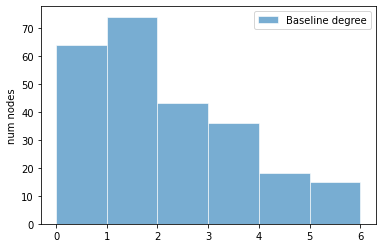

latent period:  mean = 3.75, std = 2.26, 95% CI = (0.66, 9.37)

pre-symptomatic period:  mean = 2.36, std = 1.47, 95% CI = (0.46, 6.08)

total incubation period:  mean = 6.11, std = 2.76, 95% CI = (2.10, 12.62)



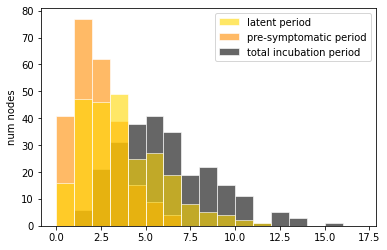

pre-symptomatic period:  mean = 3.75, std = 2.26, 95% CI = (0.66, 9.37)

(a)symptomatic period:  mean = 6.61, std = 2.68, 95% CI = (2.82, 12.71)

total infectious period:  mean = 10.36, std = 3.28, 95% CI = (4.83, 16.74)



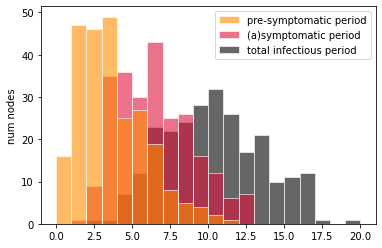

onset-to-hospitalization period:  mean = 7.96, std = 3.75, 95% CI = (2.84, 17.51)

hospitalization-to-discharge period:  mean = 14.39, std = 6.77, 95% CI = (5.03, 30.61)

onset-to-discharge period:  mean = 22.35, std = 7.36, 95% CI = (10.06, 39.16)



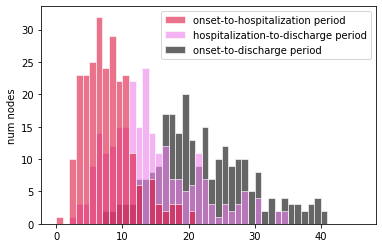

onset-to-hospitalization period:  mean = 7.96, std = 3.75, 95% CI = (2.84, 17.51)

hospitalization-to-death period:  mean = 6.95, std = 3.06, 95% CI = (2.59, 13.50)

onset-to-death period:  mean = 14.92, std = 4.92, 95% CI = (6.93, 25.27)



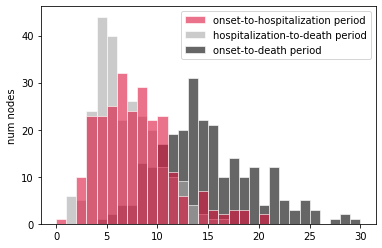

Individual R0:  mean = 1.01, std = 0.21, 95% CI = (0.65, 1.45)



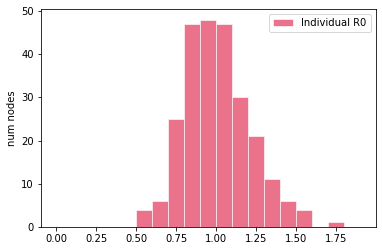

[INTERVENTIONS @ t = 0.10 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.17 (25 (10.00%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 6 positive (2.41 %) +]
	250	tested TOTAL            [+ 7 positive (2.80 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	7 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation


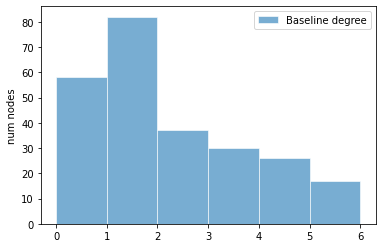

latent period:  mean = 3.39, std = 2.26, 95% CI = (0.67, 8.76)

pre-symptomatic period:  mean = 2.45, std = 1.49, 95% CI = (0.47, 6.33)

total incubation period:  mean = 5.84, std = 2.73, 95% CI = (2.16, 11.78)



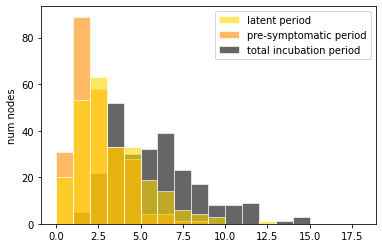

pre-symptomatic period:  mean = 3.39, std = 2.26, 95% CI = (0.67, 8.76)

(a)symptomatic period:  mean = 6.30, std = 2.47, 95% CI = (2.23, 11.65)

total infectious period:  mean = 9.69, std = 3.28, 95% CI = (4.49, 16.45)



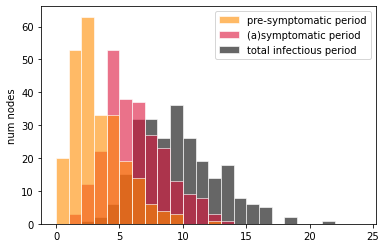

onset-to-hospitalization period:  mean = 8.05, std = 3.82, 95% CI = (2.75, 17.66)

hospitalization-to-discharge period:  mean = 14.82, std = 7.18, 95% CI = (4.78, 29.92)

onset-to-discharge period:  mean = 22.87, std = 8.05, 95% CI = (10.97, 41.34)



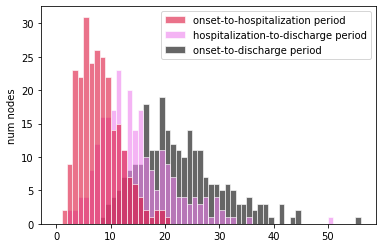

onset-to-hospitalization period:  mean = 8.05, std = 3.82, 95% CI = (2.75, 17.66)

hospitalization-to-death period:  mean = 6.78, std = 2.97, 95% CI = (2.02, 13.69)

onset-to-death period:  mean = 14.83, std = 4.76, 95% CI = (7.62, 26.73)



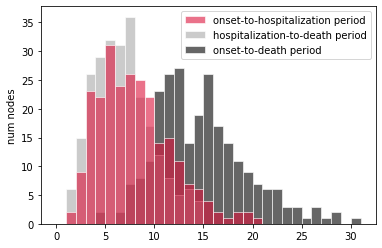

Individual R0:  mean = 0.99, std = 0.20, 95% CI = (0.60, 1.40)



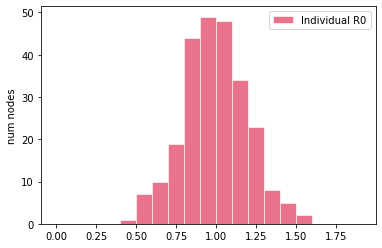

[INTERVENTIONS @ t = 0.09 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.13 (26 (10.40%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 9 positive (3.61 %) +]
	250	tested TOTAL            [+ 10 positive (4.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	10 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolatio

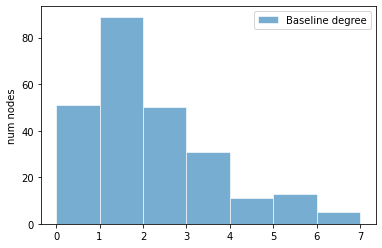

latent period:  mean = 3.63, std = 2.11, 95% CI = (0.73, 8.40)

pre-symptomatic period:  mean = 2.39, std = 1.45, 95% CI = (0.46, 6.02)

total incubation period:  mean = 6.02, std = 2.56, 95% CI = (2.24, 11.92)



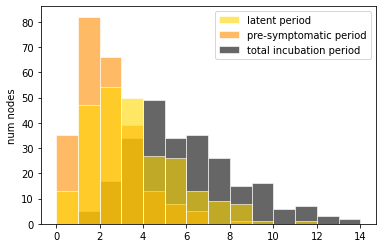

pre-symptomatic period:  mean = 3.63, std = 2.11, 95% CI = (0.73, 8.40)

(a)symptomatic period:  mean = 6.67, std = 2.79, 95% CI = (2.45, 12.74)

total infectious period:  mean = 10.30, std = 3.62, 95% CI = (4.78, 17.99)



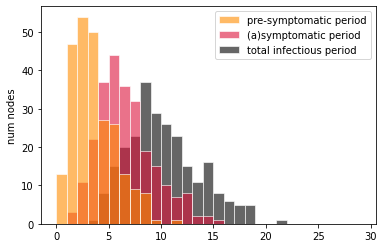

onset-to-hospitalization period:  mean = 7.86, std = 3.57, 95% CI = (2.45, 17.22)

hospitalization-to-discharge period:  mean = 13.91, std = 6.76, 95% CI = (4.13, 30.11)

onset-to-discharge period:  mean = 21.77, std = 7.71, 95% CI = (9.71, 37.69)



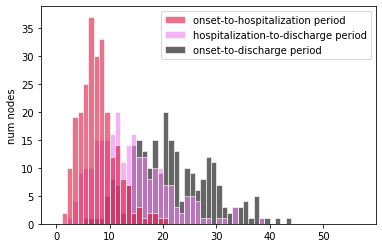

onset-to-hospitalization period:  mean = 7.86, std = 3.57, 95% CI = (2.45, 17.22)

hospitalization-to-death period:  mean = 6.83, std = 3.34, 95% CI = (2.39, 14.32)

onset-to-death period:  mean = 14.68, std = 4.96, 95% CI = (6.98, 26.67)



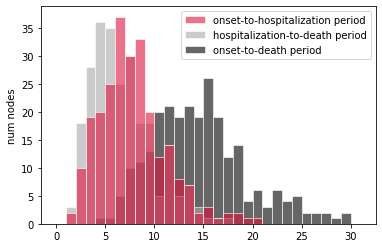

Individual R0:  mean = 1.00, std = 0.22, 95% CI = (0.66, 1.46)



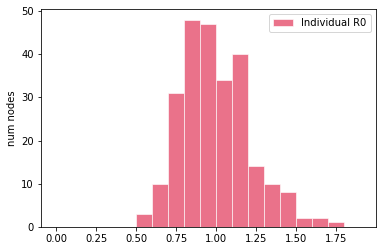

[INTERVENTIONS @ t = 0.00 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 0 positive (0.00 %) +]
	250	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.06 (26 (10.40%) infected)]
	2	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	248	tested randomly         [+ 15 positive (6.05 %) +]
	250	tested TOTAL            [+ 15 positive (6.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	15 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation

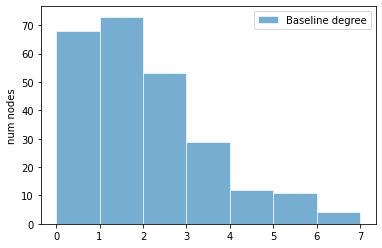

latent period:  mean = 3.58, std = 2.21, 95% CI = (0.80, 8.69)

pre-symptomatic period:  mean = 2.56, std = 1.47, 95% CI = (0.60, 6.17)

total incubation period:  mean = 6.14, std = 2.64, 95% CI = (2.19, 12.30)



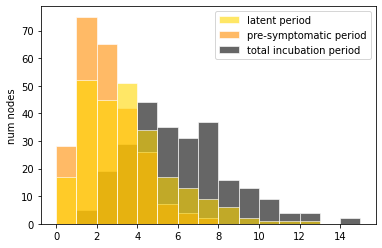

pre-symptomatic period:  mean = 3.58, std = 2.21, 95% CI = (0.80, 8.69)

(a)symptomatic period:  mean = 6.40, std = 2.35, 95% CI = (2.67, 11.65)

total infectious period:  mean = 9.97, std = 3.22, 95% CI = (4.71, 17.21)



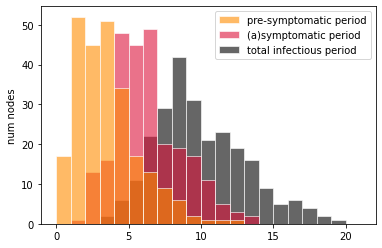

onset-to-hospitalization period:  mean = 7.94, std = 3.70, 95% CI = (2.73, 16.21)

hospitalization-to-discharge period:  mean = 13.88, std = 6.00, 95% CI = (4.52, 27.08)

onset-to-discharge period:  mean = 21.82, std = 7.05, 95% CI = (10.36, 35.84)



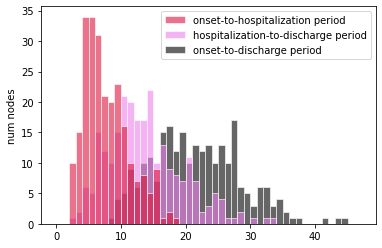

onset-to-hospitalization period:  mean = 7.94, std = 3.70, 95% CI = (2.73, 16.21)

hospitalization-to-death period:  mean = 7.10, std = 3.13, 95% CI = (2.61, 14.46)

onset-to-death period:  mean = 15.03, std = 4.76, 95% CI = (6.84, 24.83)



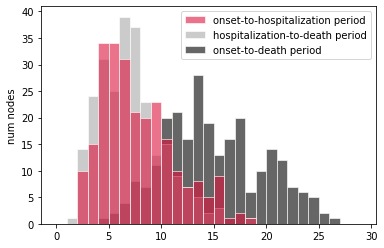

Individual R0:  mean = 1.00, std = 0.20, 95% CI = (0.64, 1.41)



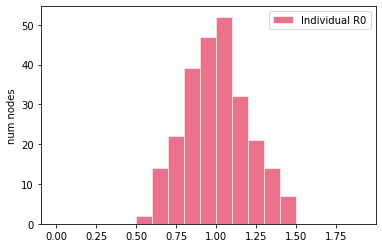

[INTERVENTIONS @ t = 0.11 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.11 (25 (10.00%) infected)]
	1	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 10 positive (4.02 %) +]
	250	tested TOTAL            [+ 10 positive (4.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	10 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation

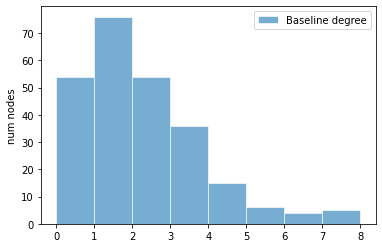

latent period:  mean = 3.64, std = 2.07, 95% CI = (0.83, 9.10)

pre-symptomatic period:  mean = 2.45, std = 1.43, 95% CI = (0.51, 6.20)

total incubation period:  mean = 6.10, std = 2.60, 95% CI = (2.05, 11.90)



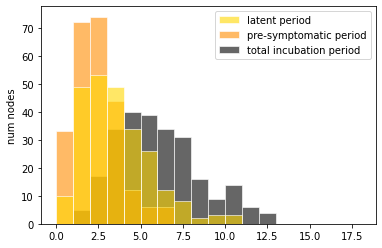

pre-symptomatic period:  mean = 3.64, std = 2.07, 95% CI = (0.83, 9.10)

(a)symptomatic period:  mean = 6.63, std = 2.61, 95% CI = (2.94, 12.63)

total infectious period:  mean = 10.28, std = 3.44, 95% CI = (5.10, 17.94)



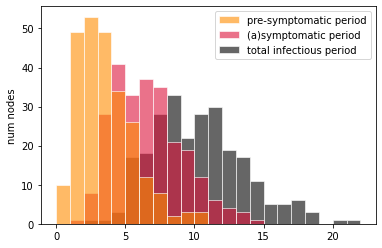

onset-to-hospitalization period:  mean = 8.36, std = 3.83, 95% CI = (2.70, 18.35)

hospitalization-to-discharge period:  mean = 13.48, std = 5.66, 95% CI = (4.33, 24.92)

onset-to-discharge period:  mean = 21.84, std = 6.95, 95% CI = (10.64, 35.34)



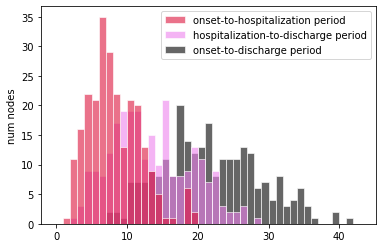

onset-to-hospitalization period:  mean = 8.36, std = 3.83, 95% CI = (2.70, 18.35)

hospitalization-to-death period:  mean = 7.41, std = 3.09, 95% CI = (2.71, 13.99)

onset-to-death period:  mean = 15.77, std = 5.01, 95% CI = (7.30, 27.08)



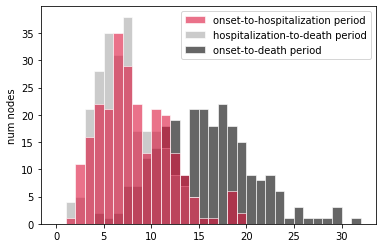

Individual R0:  mean = 1.01, std = 0.18, 95% CI = (0.70, 1.39)



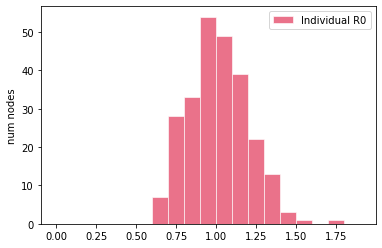

[INTERVENTIONS @ t = 0.06 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.06 (25 (10.00%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 4 positive (1.61 %) +]
	250	tested TOTAL            [+ 5 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	5 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation


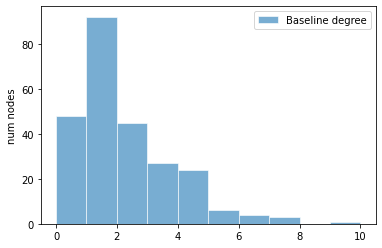

latent period:  mean = 3.39, std = 2.00, 95% CI = (0.65, 7.89)

pre-symptomatic period:  mean = 2.57, std = 1.63, 95% CI = (0.61, 6.53)

total incubation period:  mean = 5.96, std = 2.52, 95% CI = (2.28, 11.40)



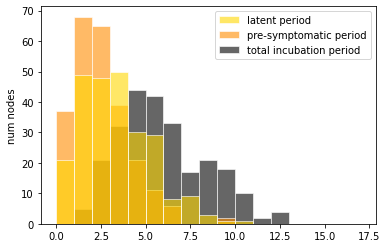

pre-symptomatic period:  mean = 3.39, std = 2.00, 95% CI = (0.65, 7.89)

(a)symptomatic period:  mean = 6.51, std = 2.57, 95% CI = (2.68, 13.35)

total infectious period:  mean = 9.90, std = 3.41, 95% CI = (4.69, 18.47)



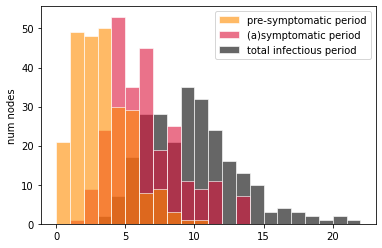

onset-to-hospitalization period:  mean = 8.35, std = 3.76, 95% CI = (2.82, 17.71)

hospitalization-to-discharge period:  mean = 14.42, std = 6.57, 95% CI = (4.44, 33.17)

onset-to-discharge period:  mean = 22.77, std = 7.06, 95% CI = (12.51, 41.82)



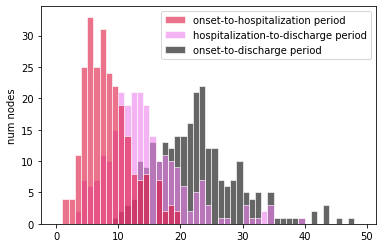

onset-to-hospitalization period:  mean = 8.35, std = 3.76, 95% CI = (2.82, 17.71)

hospitalization-to-death period:  mean = 7.09, std = 2.96, 95% CI = (2.42, 13.41)

onset-to-death period:  mean = 15.45, std = 4.85, 95% CI = (7.76, 27.18)



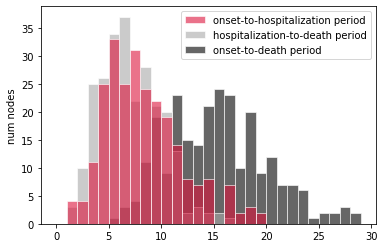

Individual R0:  mean = 1.00, std = 0.19, 95% CI = (0.68, 1.38)



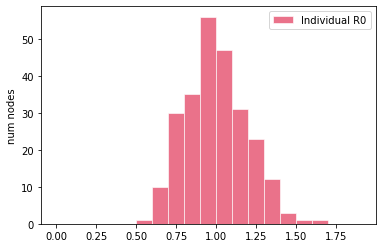

[NEW EXPOSURE @ t = 0.01 (1 exposed)]
[INTERVENTIONS @ t = 0.01 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.15 (27 (10.80%) infected)]
	2	tested due to symptoms  [+ 2 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	248	tested randomly         [+ 9 positive (3.63 %) +]
	250	tested TOTAL            [+ 11 positive (4.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	11 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as grou

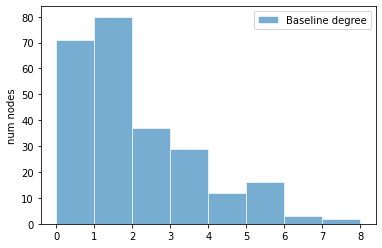

latent period:  mean = 3.63, std = 2.10, 95% CI = (0.95, 9.08)

pre-symptomatic period:  mean = 2.63, std = 1.56, 95% CI = (0.61, 6.20)

total incubation period:  mean = 6.26, std = 2.60, 95% CI = (2.24, 11.71)



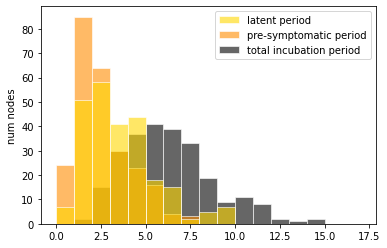

pre-symptomatic period:  mean = 3.63, std = 2.10, 95% CI = (0.95, 9.08)

(a)symptomatic period:  mean = 6.41, std = 2.60, 95% CI = (2.55, 12.41)

total infectious period:  mean = 10.04, std = 3.23, 95% CI = (4.89, 17.76)



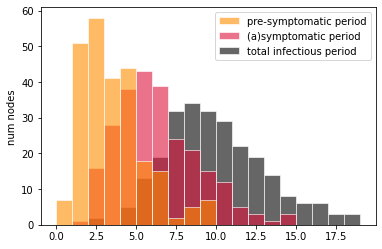

onset-to-hospitalization period:  mean = 7.96, std = 3.55, 95% CI = (2.60, 16.48)

hospitalization-to-discharge period:  mean = 15.00, std = 6.57, 95% CI = (5.01, 28.26)

onset-to-discharge period:  mean = 22.97, std = 7.34, 95% CI = (11.48, 39.93)



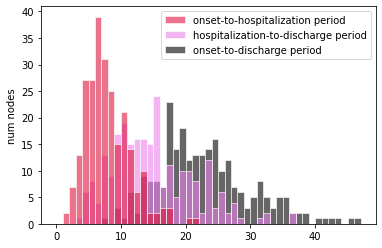

onset-to-hospitalization period:  mean = 7.96, std = 3.55, 95% CI = (2.60, 16.48)

hospitalization-to-death period:  mean = 7.46, std = 3.34, 95% CI = (2.70, 14.40)

onset-to-death period:  mean = 15.42, std = 4.97, 95% CI = (7.94, 28.03)



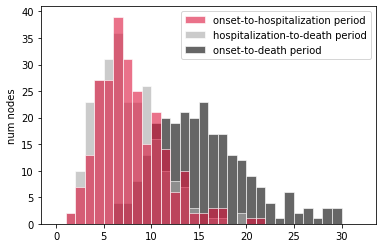

Individual R0:  mean = 1.01, std = 0.20, 95% CI = (0.64, 1.39)



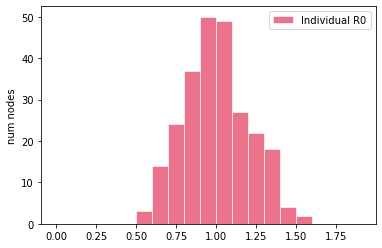

[INTERVENTIONS @ t = 0.09 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 0 positive (0.00 %) +]
	250	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.01 (25 (10.00%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 8 positive (3.21 %) +]
	250	tested TOTAL            [+ 9 positive (3.60 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	9 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation


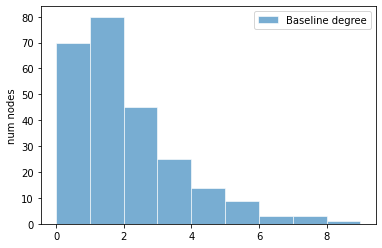

latent period:  mean = 3.58, std = 2.03, 95% CI = (0.82, 8.28)

pre-symptomatic period:  mean = 2.52, std = 1.59, 95% CI = (0.34, 6.22)

total incubation period:  mean = 6.10, std = 2.57, 95% CI = (1.89, 11.49)



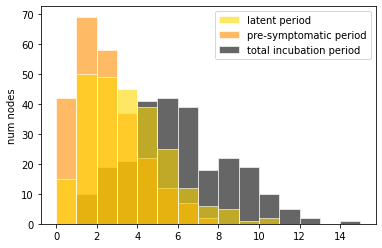

pre-symptomatic period:  mean = 3.58, std = 2.03, 95% CI = (0.82, 8.28)

(a)symptomatic period:  mean = 6.34, std = 2.28, 95% CI = (2.86, 11.42)

total infectious period:  mean = 9.92, std = 3.22, 95% CI = (4.70, 16.13)



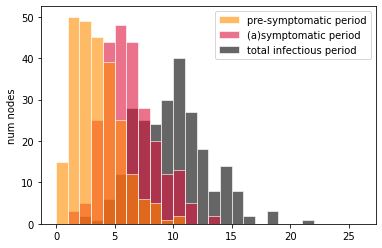

onset-to-hospitalization period:  mean = 8.06, std = 3.58, 95% CI = (3.05, 16.30)

hospitalization-to-discharge period:  mean = 14.55, std = 6.77, 95% CI = (4.87, 31.00)

onset-to-discharge period:  mean = 22.61, std = 7.66, 95% CI = (10.17, 40.79)



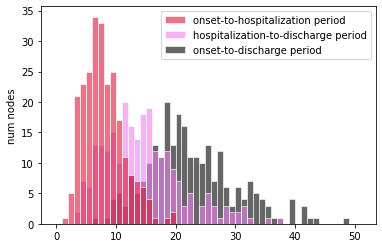

onset-to-hospitalization period:  mean = 8.06, std = 3.58, 95% CI = (3.05, 16.30)

hospitalization-to-death period:  mean = 7.09, std = 3.09, 95% CI = (2.35, 14.93)

onset-to-death period:  mean = 15.15, std = 4.67, 95% CI = (7.58, 24.78)



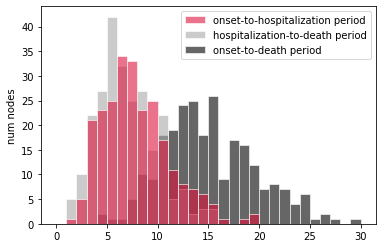

Individual R0:  mean = 1.02, std = 0.20, 95% CI = (0.67, 1.46)



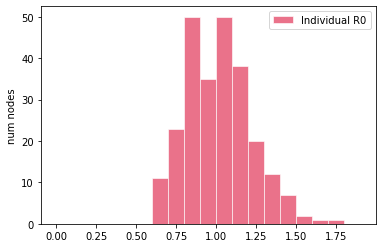

[INTERVENTIONS @ t = 0.04 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.01 (25 (10.00%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 6 positive (2.41 %) +]
	250	tested TOTAL            [+ 7 positive (2.80 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	7 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation


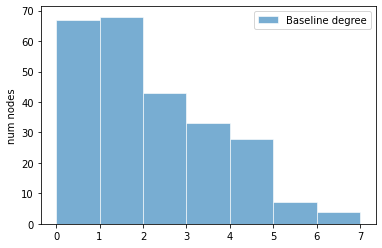

latent period:  mean = 3.66, std = 2.04, 95% CI = (0.81, 8.26)

pre-symptomatic period:  mean = 2.36, std = 1.43, 95% CI = (0.48, 5.69)

total incubation period:  mean = 6.03, std = 2.46, 95% CI = (2.00, 11.57)



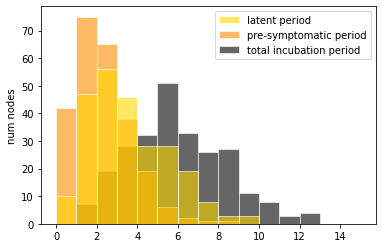

pre-symptomatic period:  mean = 3.66, std = 2.04, 95% CI = (0.81, 8.26)

(a)symptomatic period:  mean = 6.46, std = 2.48, 95% CI = (2.59, 11.57)

total infectious period:  mean = 10.12, std = 3.14, 95% CI = (4.46, 16.80)



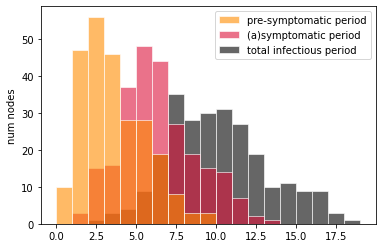

onset-to-hospitalization period:  mean = 7.68, std = 3.58, 95% CI = (2.45, 15.91)

hospitalization-to-discharge period:  mean = 13.91, std = 5.51, 95% CI = (4.44, 26.16)

onset-to-discharge period:  mean = 21.59, std = 6.99, 95% CI = (10.41, 38.16)



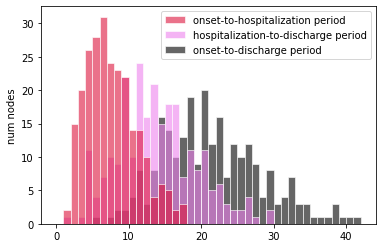

onset-to-hospitalization period:  mean = 7.68, std = 3.58, 95% CI = (2.45, 15.91)

hospitalization-to-death period:  mean = 6.91, std = 2.83, 95% CI = (2.22, 13.16)

onset-to-death period:  mean = 14.60, std = 4.43, 95% CI = (7.16, 23.41)



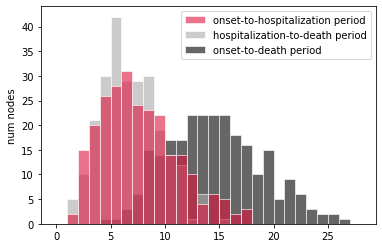

Individual R0:  mean = 1.00, std = 0.19, 95% CI = (0.69, 1.36)



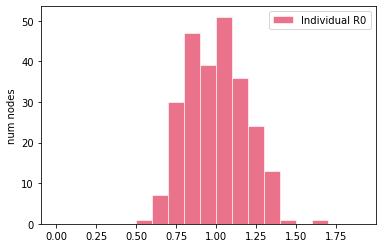

[INTERVENTIONS @ t = 0.07 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.22 (26 (10.40%) infected)]
	1	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 7 positive (2.81 %) +]
	250	tested TOTAL            [+ 7 positive (2.80 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	7 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[I

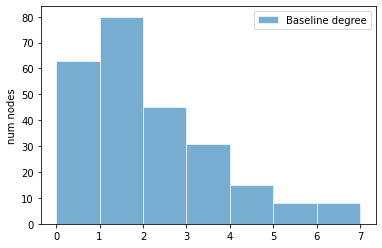

latent period:  mean = 3.41, std = 2.05, 95% CI = (0.73, 8.87)

pre-symptomatic period:  mean = 2.42, std = 1.46, 95% CI = (0.48, 5.84)

total incubation period:  mean = 5.83, std = 2.55, 95% CI = (2.13, 12.55)



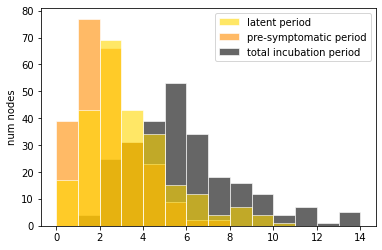

pre-symptomatic period:  mean = 3.41, std = 2.05, 95% CI = (0.73, 8.87)

(a)symptomatic period:  mean = 6.43, std = 2.46, 95% CI = (2.29, 11.73)

total infectious period:  mean = 9.84, std = 3.13, 95% CI = (4.71, 16.67)



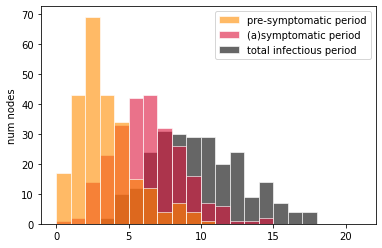

onset-to-hospitalization period:  mean = 8.28, std = 3.97, 95% CI = (2.49, 18.47)

hospitalization-to-discharge period:  mean = 14.64, std = 6.65, 95% CI = (4.69, 30.04)

onset-to-discharge period:  mean = 22.92, std = 7.33, 95% CI = (11.38, 40.31)



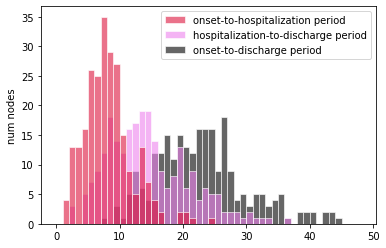

onset-to-hospitalization period:  mean = 8.28, std = 3.97, 95% CI = (2.49, 18.47)

hospitalization-to-death period:  mean = 7.06, std = 2.91, 95% CI = (2.68, 12.96)

onset-to-death period:  mean = 15.34, std = 4.94, 95% CI = (7.72, 26.76)



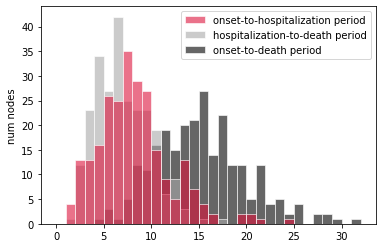

Individual R0:  mean = 1.00, std = 0.19, 95% CI = (0.65, 1.36)



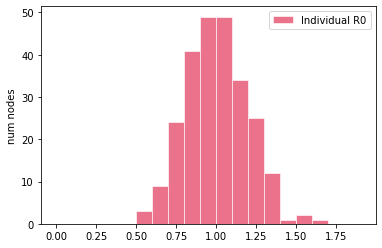

[INTERVENTIONS @ t = 0.04 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.01 (27 (10.80%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 8 positive (3.21 %) +]
	249	tested TOTAL            [+ 8 positive (3.21 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	8 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[I

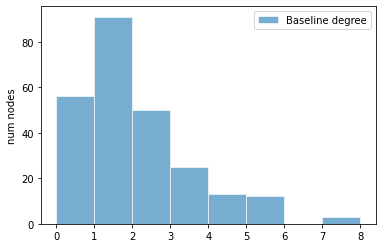

latent period:  mean = 3.48, std = 2.05, 95% CI = (0.87, 8.61)

pre-symptomatic period:  mean = 2.54, std = 1.52, 95% CI = (0.52, 6.72)

total incubation period:  mean = 6.02, std = 2.64, 95% CI = (2.19, 12.72)



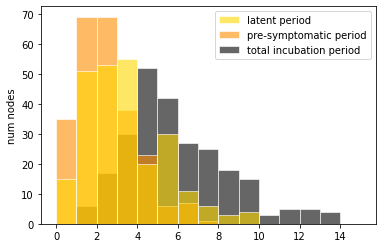

pre-symptomatic period:  mean = 3.48, std = 2.05, 95% CI = (0.87, 8.61)

(a)symptomatic period:  mean = 6.31, std = 2.43, 95% CI = (2.26, 12.24)

total infectious period:  mean = 9.79, std = 3.24, 95% CI = (3.82, 16.98)



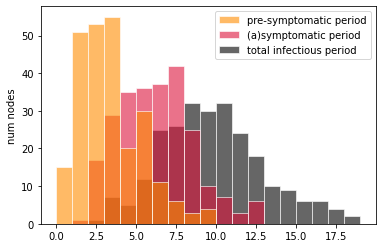

onset-to-hospitalization period:  mean = 8.04, std = 3.46, 95% CI = (2.93, 16.08)

hospitalization-to-discharge period:  mean = 14.33, std = 6.79, 95% CI = (4.97, 31.42)

onset-to-discharge period:  mean = 22.36, std = 7.47, 95% CI = (10.46, 38.30)



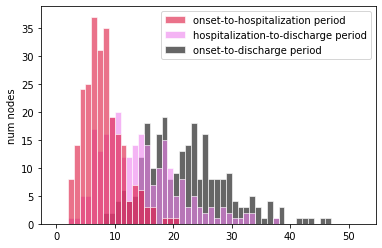

onset-to-hospitalization period:  mean = 8.04, std = 3.46, 95% CI = (2.93, 16.08)

hospitalization-to-death period:  mean = 7.12, std = 3.41, 95% CI = (2.44, 14.75)

onset-to-death period:  mean = 15.15, std = 4.89, 95% CI = (6.99, 25.69)



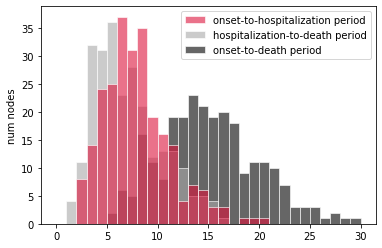

Individual R0:  mean = 0.98, std = 0.19, 95% CI = (0.62, 1.32)



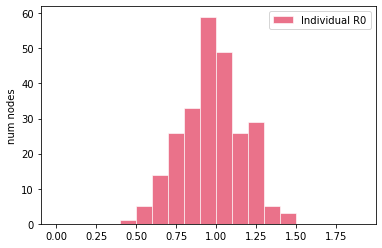

[INTERVENTIONS @ t = 0.09 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[NEW EXPOSURE @ t = 1.10 (1 exposed)]
[INTERVENTIONS @ t = 1.10 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 3 positive (1.20 %) +]
	249	tested TOTAL            [+ 3 positive (1.20 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	3 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmat

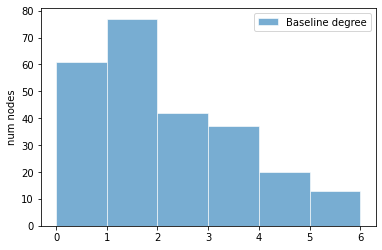

latent period:  mean = 3.71, std = 2.28, 95% CI = (0.75, 9.42)

pre-symptomatic period:  mean = 2.40, std = 1.34, 95% CI = (0.53, 5.63)

total incubation period:  mean = 6.11, std = 2.49, 95% CI = (2.43, 11.07)



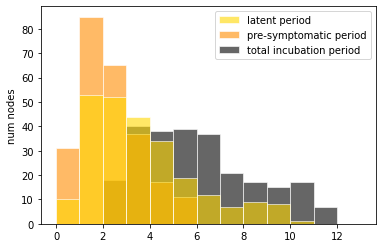

pre-symptomatic period:  mean = 3.71, std = 2.28, 95% CI = (0.75, 9.42)

(a)symptomatic period:  mean = 6.61, std = 2.87, 95% CI = (2.49, 13.56)

total infectious period:  mean = 10.32, std = 3.58, 95% CI = (4.76, 18.45)



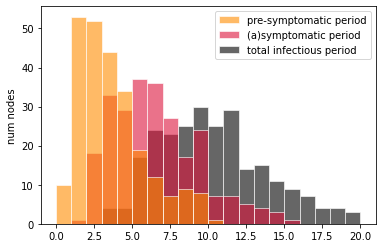

onset-to-hospitalization period:  mean = 8.42, std = 3.84, 95% CI = (2.94, 17.25)

hospitalization-to-discharge period:  mean = 14.68, std = 6.46, 95% CI = (5.03, 29.61)

onset-to-discharge period:  mean = 23.10, std = 7.55, 95% CI = (11.40, 40.31)



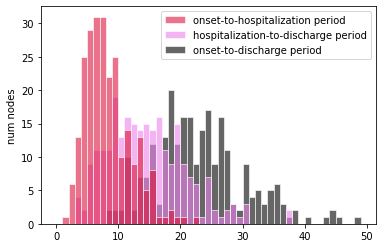

onset-to-hospitalization period:  mean = 8.42, std = 3.84, 95% CI = (2.94, 17.25)

hospitalization-to-death period:  mean = 6.87, std = 3.16, 95% CI = (2.06, 13.90)

onset-to-death period:  mean = 15.28, std = 4.99, 95% CI = (7.24, 26.83)



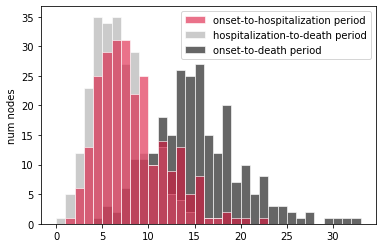

Individual R0:  mean = 1.01, std = 0.19, 95% CI = (0.63, 1.39)



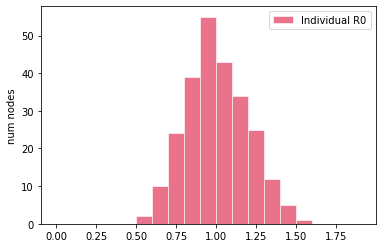

[INTERVENTIONS @ t = 0.04 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.00 (26 (10.40%) infected)]
	2	tested due to symptoms  [+ 2 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	248	tested randomly         [+ 9 positive (3.63 %) +]
	250	tested TOTAL            [+ 11 positive (4.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	11 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolatio

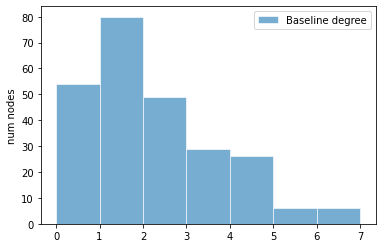

latent period:  mean = 3.62, std = 1.96, 95% CI = (1.03, 8.39)

pre-symptomatic period:  mean = 2.53, std = 1.65, 95% CI = (0.61, 6.18)

total incubation period:  mean = 6.15, std = 2.43, 95% CI = (2.43, 12.14)



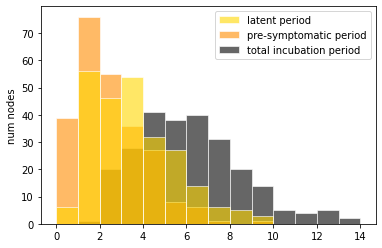

pre-symptomatic period:  mean = 3.62, std = 1.96, 95% CI = (1.03, 8.39)

(a)symptomatic period:  mean = 6.43, std = 2.69, 95% CI = (2.17, 12.11)

total infectious period:  mean = 10.05, std = 3.36, 95% CI = (4.60, 17.26)



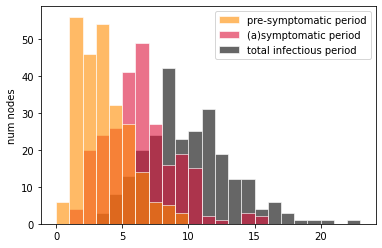

onset-to-hospitalization period:  mean = 7.91, std = 3.55, 95% CI = (2.97, 16.95)

hospitalization-to-discharge period:  mean = 13.41, std = 6.61, 95% CI = (4.04, 29.98)

onset-to-discharge period:  mean = 21.31, std = 7.85, 95% CI = (10.48, 38.63)



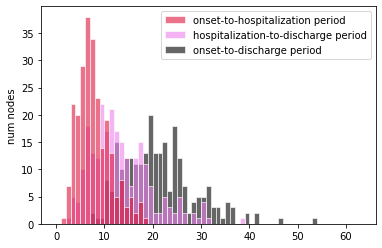

onset-to-hospitalization period:  mean = 7.91, std = 3.55, 95% CI = (2.97, 16.95)

hospitalization-to-death period:  mean = 6.93, std = 3.13, 95% CI = (2.58, 13.94)

onset-to-death period:  mean = 14.84, std = 4.79, 95% CI = (6.67, 24.68)



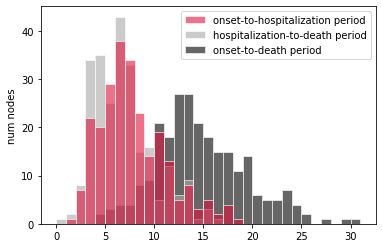

Individual R0:  mean = 1.01, std = 0.19, 95% CI = (0.64, 1.37)



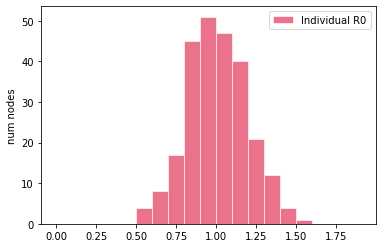

[INTERVENTIONS @ t = 0.01 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 0 positive (0.00 %) +]
	250	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.01 (26 (10.40%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 9 positive (3.61 %) +]
	250	tested TOTAL            [+ 10 positive (4.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	10 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolatio

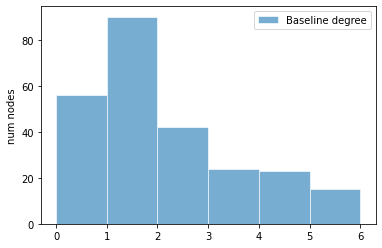

latent period:  mean = 3.04, std = 1.62, 95% CI = (0.74, 6.56)

pre-symptomatic period:  mean = 2.58, std = 1.49, 95% CI = (0.50, 6.04)

total incubation period:  mean = 5.62, std = 2.15, 95% CI = (2.03, 10.39)



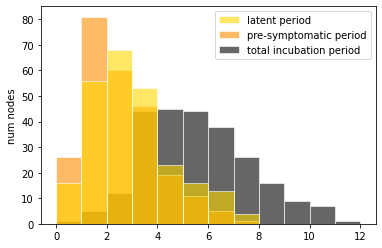

pre-symptomatic period:  mean = 3.04, std = 1.62, 95% CI = (0.74, 6.56)

(a)symptomatic period:  mean = 6.31, std = 2.58, 95% CI = (2.00, 12.31)

total infectious period:  mean = 9.35, std = 3.36, 95% CI = (4.28, 16.39)



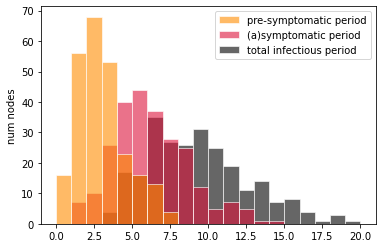

onset-to-hospitalization period:  mean = 7.94, std = 3.64, 95% CI = (2.50, 16.29)

hospitalization-to-discharge period:  mean = 14.11, std = 6.82, 95% CI = (5.03, 29.44)

onset-to-discharge period:  mean = 22.05, std = 7.92, 95% CI = (10.91, 40.24)



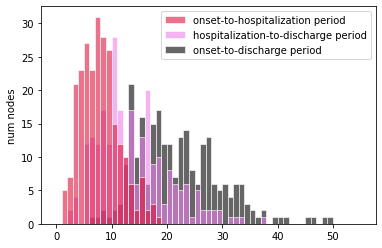

onset-to-hospitalization period:  mean = 7.94, std = 3.64, 95% CI = (2.50, 16.29)

hospitalization-to-death period:  mean = 7.09, std = 3.26, 95% CI = (2.32, 14.74)

onset-to-death period:  mean = 15.03, std = 4.93, 95% CI = (6.98, 25.13)



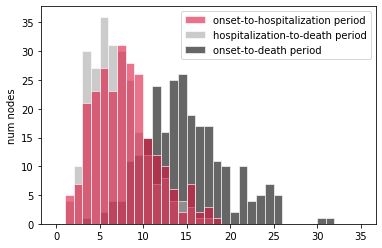

Individual R0:  mean = 1.03, std = 0.20, 95% CI = (0.66, 1.44)



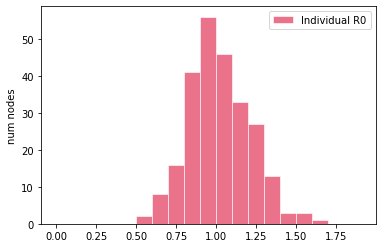

[INTERVENTIONS @ t = 0.18 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.02 (25 (10.00%) infected)]
	2	tested due to symptoms  [+ 2 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	248	tested randomly         [+ 8 positive (3.23 %) +]
	250	tested TOTAL            [+ 10 positive (4.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	10 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolatio

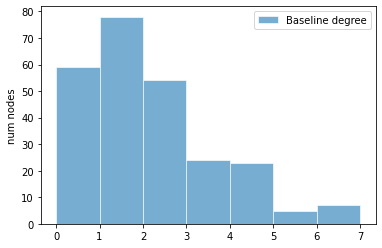

latent period:  mean = 3.58, std = 2.26, 95% CI = (0.65, 9.17)

pre-symptomatic period:  mean = 2.62, std = 1.53, 95% CI = (0.47, 6.78)

total incubation period:  mean = 6.20, std = 2.83, 95% CI = (2.30, 13.09)



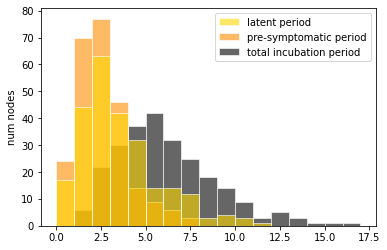

pre-symptomatic period:  mean = 3.58, std = 2.26, 95% CI = (0.65, 9.17)

(a)symptomatic period:  mean = 6.24, std = 2.31, 95% CI = (2.64, 11.23)

total infectious period:  mean = 9.82, std = 3.28, 95% CI = (4.63, 17.61)



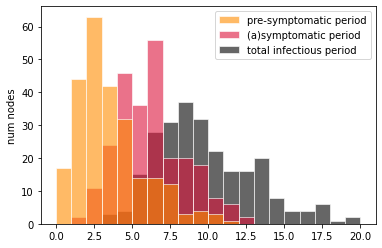

onset-to-hospitalization period:  mean = 8.17, std = 3.66, 95% CI = (2.90, 17.18)

hospitalization-to-discharge period:  mean = 13.67, std = 5.93, 95% CI = (4.38, 26.20)

onset-to-discharge period:  mean = 21.84, std = 6.82, 95% CI = (11.45, 34.86)



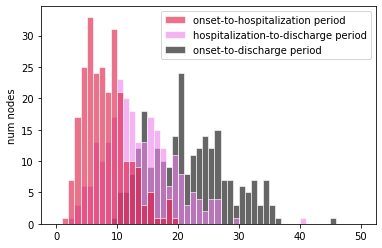

onset-to-hospitalization period:  mean = 8.17, std = 3.66, 95% CI = (2.90, 17.18)

hospitalization-to-death period:  mean = 7.05, std = 3.04, 95% CI = (2.29, 14.77)

onset-to-death period:  mean = 15.22, std = 4.56, 95% CI = (7.64, 24.52)



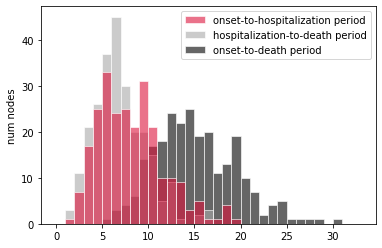

Individual R0:  mean = 1.00, std = 0.20, 95% CI = (0.64, 1.36)



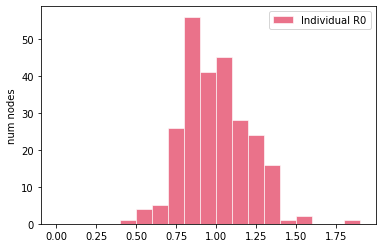

[INTERVENTIONS @ t = 0.04 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.17 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTER

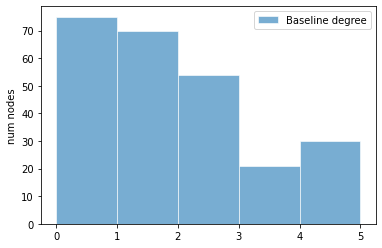

latent period:  mean = 3.50, std = 2.06, 95% CI = (0.68, 9.31)

pre-symptomatic period:  mean = 2.55, std = 1.63, 95% CI = (0.42, 6.62)

total incubation period:  mean = 6.05, std = 2.52, 95% CI = (2.22, 11.38)



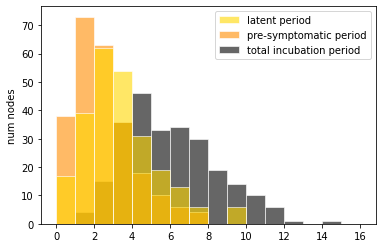

pre-symptomatic period:  mean = 3.50, std = 2.06, 95% CI = (0.68, 9.31)

(a)symptomatic period:  mean = 6.46, std = 2.56, 95% CI = (2.37, 12.09)

total infectious period:  mean = 9.95, std = 3.48, 95% CI = (4.43, 17.64)



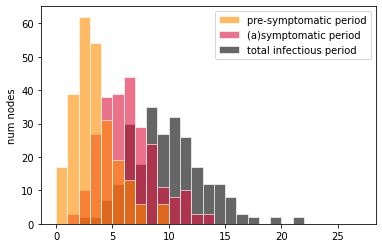

onset-to-hospitalization period:  mean = 7.82, std = 3.45, 95% CI = (2.68, 15.87)

hospitalization-to-discharge period:  mean = 13.97, std = 6.36, 95% CI = (4.21, 27.87)

onset-to-discharge period:  mean = 21.79, std = 7.64, 95% CI = (10.21, 40.53)



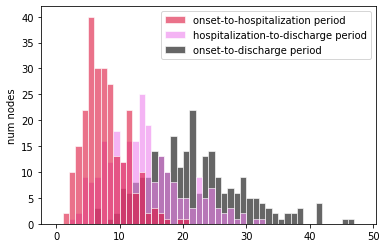

onset-to-hospitalization period:  mean = 7.82, std = 3.45, 95% CI = (2.68, 15.87)

hospitalization-to-death period:  mean = 6.86, std = 3.38, 95% CI = (2.03, 15.78)

onset-to-death period:  mean = 14.68, std = 4.72, 95% CI = (7.00, 25.59)



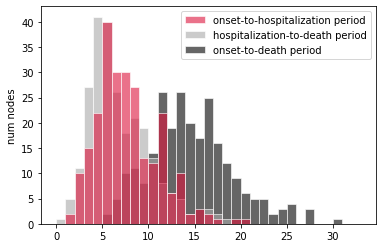

Individual R0:  mean = 1.02, std = 0.19, 95% CI = (0.71, 1.39)



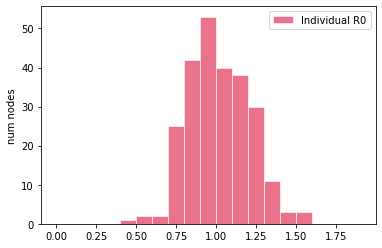

[INTERVENTIONS @ t = 0.02 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.02 (25 (10.00%) infected)]
	2	tested due to symptoms  [+ 1 positive (50.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	2	tested TOTAL            [+ 1 positive (50.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INT

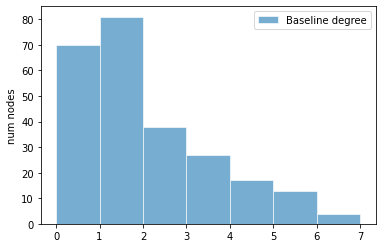

latent period:  mean = 3.53, std = 2.06, 95% CI = (0.51, 8.57)

pre-symptomatic period:  mean = 2.53, std = 1.56, 95% CI = (0.60, 6.54)

total incubation period:  mean = 6.06, std = 2.69, 95% CI = (2.09, 11.89)



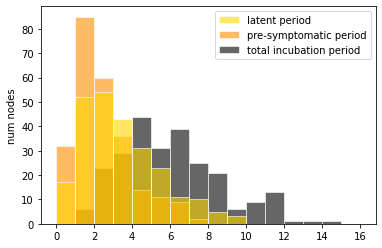

pre-symptomatic period:  mean = 3.53, std = 2.06, 95% CI = (0.51, 8.57)

(a)symptomatic period:  mean = 6.23, std = 2.66, 95% CI = (2.59, 12.59)

total infectious period:  mean = 9.76, std = 3.39, 95% CI = (4.06, 16.33)



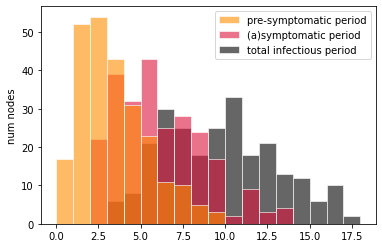

onset-to-hospitalization period:  mean = 7.70, std = 3.30, 95% CI = (2.58, 15.65)

hospitalization-to-discharge period:  mean = 14.46, std = 6.99, 95% CI = (4.87, 31.15)

onset-to-discharge period:  mean = 22.16, std = 7.86, 95% CI = (9.51, 38.64)



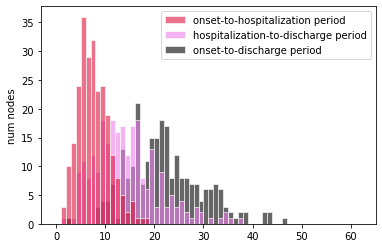

onset-to-hospitalization period:  mean = 7.70, std = 3.30, 95% CI = (2.58, 15.65)

hospitalization-to-death period:  mean = 6.94, std = 3.06, 95% CI = (2.94, 15.36)

onset-to-death period:  mean = 14.64, std = 4.60, 95% CI = (7.89, 24.67)



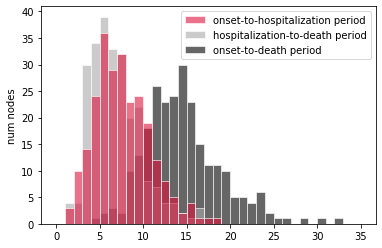

Individual R0:  mean = 1.00, std = 0.20, 95% CI = (0.67, 1.41)



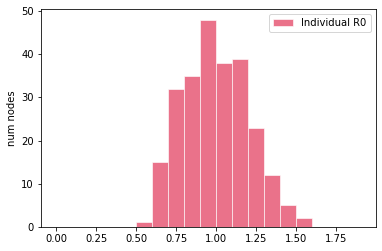

[INTERVENTIONS @ t = 0.05 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.11 (24 (9.60%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERV

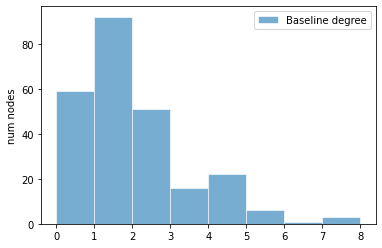

latent period:  mean = 3.46, std = 2.11, 95% CI = (0.60, 8.58)

pre-symptomatic period:  mean = 2.46, std = 1.46, 95% CI = (0.52, 6.07)

total incubation period:  mean = 5.92, std = 2.56, 95% CI = (1.98, 11.19)



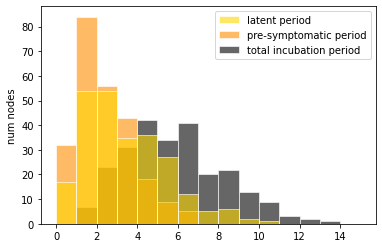

pre-symptomatic period:  mean = 3.46, std = 2.11, 95% CI = (0.60, 8.58)

(a)symptomatic period:  mean = 6.55, std = 2.54, 95% CI = (3.00, 12.43)

total infectious period:  mean = 10.00, std = 3.41, 95% CI = (4.73, 17.39)



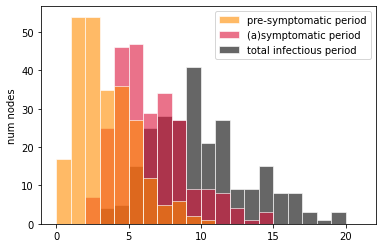

onset-to-hospitalization period:  mean = 8.20, std = 3.72, 95% CI = (2.79, 17.19)

hospitalization-to-discharge period:  mean = 14.02, std = 6.61, 95% CI = (4.61, 30.77)

onset-to-discharge period:  mean = 22.22, std = 7.74, 95% CI = (9.72, 40.41)



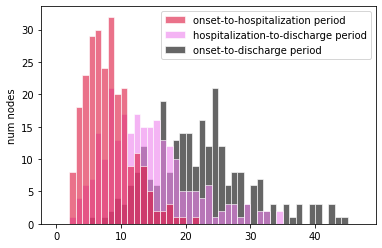

onset-to-hospitalization period:  mean = 8.20, std = 3.72, 95% CI = (2.79, 17.19)

hospitalization-to-death period:  mean = 7.15, std = 3.23, 95% CI = (2.28, 14.54)

onset-to-death period:  mean = 15.35, std = 5.02, 95% CI = (7.08, 26.30)



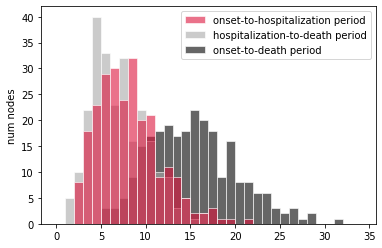

Individual R0:  mean = 1.00, std = 0.20, 95% CI = (0.61, 1.36)



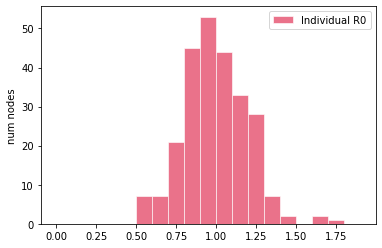

[INTERVENTIONS @ t = 0.00 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.14 (25 (10.00%) infected)]
	2	tested due to symptoms  [+ 2 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	2	tested TOTAL            [+ 2 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	2 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[N

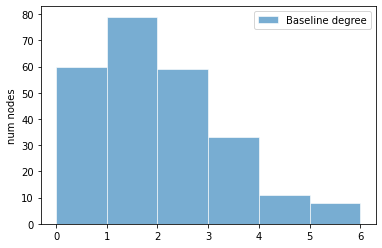

latent period:  mean = 3.43, std = 1.91, 95% CI = (0.79, 7.77)

pre-symptomatic period:  mean = 2.45, std = 1.36, 95% CI = (0.53, 5.99)

total incubation period:  mean = 5.88, std = 2.24, 95% CI = (2.24, 10.55)



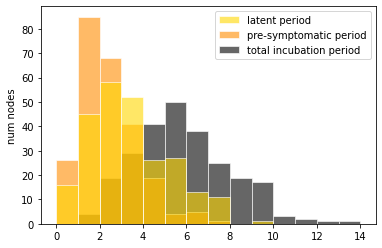

pre-symptomatic period:  mean = 3.43, std = 1.91, 95% CI = (0.79, 7.77)

(a)symptomatic period:  mean = 6.72, std = 2.65, 95% CI = (2.38, 12.89)

total infectious period:  mean = 10.15, std = 3.04, 95% CI = (4.33, 16.64)



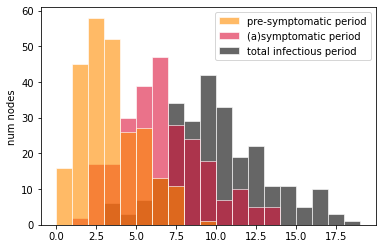

onset-to-hospitalization period:  mean = 7.54, std = 3.55, 95% CI = (2.79, 16.78)

hospitalization-to-discharge period:  mean = 14.09, std = 5.79, 95% CI = (4.13, 26.53)

onset-to-discharge period:  mean = 21.63, std = 6.71, 95% CI = (10.87, 35.62)



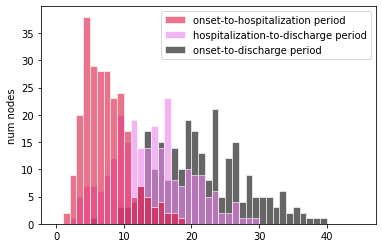

onset-to-hospitalization period:  mean = 7.54, std = 3.55, 95% CI = (2.79, 16.78)

hospitalization-to-death period:  mean = 7.17, std = 3.32, 95% CI = (2.21, 14.99)

onset-to-death period:  mean = 14.71, std = 4.86, 95% CI = (7.46, 25.58)



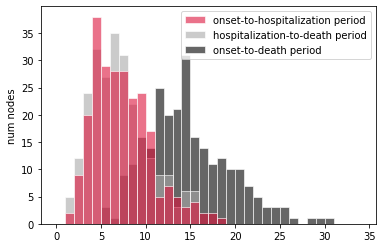

Individual R0:  mean = 0.98, std = 0.19, 95% CI = (0.66, 1.40)



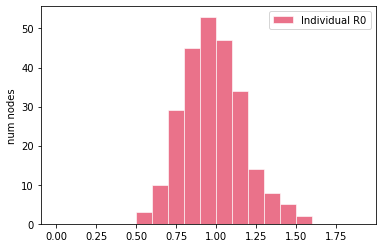

[INTERVENTIONS @ t = 0.02 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[NEW EXPOSURE @ t = 1.05 (1 exposed)]
[INTERVENTIONS @ t = 1.05 (25 (10.00%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 1 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmat

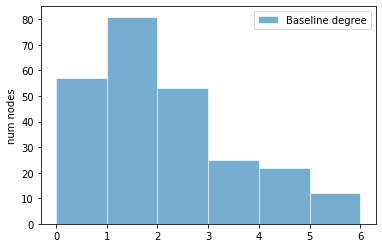

latent period:  mean = 3.58, std = 2.03, 95% CI = (0.70, 8.60)

pre-symptomatic period:  mean = 2.55, std = 1.46, 95% CI = (0.47, 6.15)

total incubation period:  mean = 6.13, std = 2.55, 95% CI = (2.35, 12.12)



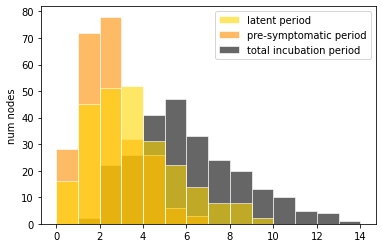

pre-symptomatic period:  mean = 3.58, std = 2.03, 95% CI = (0.70, 8.60)

(a)symptomatic period:  mean = 6.79, std = 2.51, 95% CI = (2.81, 12.33)

total infectious period:  mean = 10.37, std = 3.25, 95% CI = (4.95, 17.67)



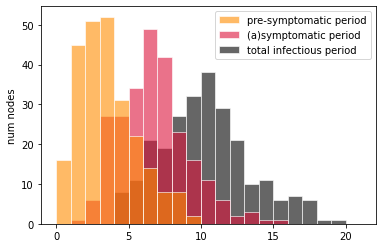

onset-to-hospitalization period:  mean = 7.94, std = 3.60, 95% CI = (2.62, 16.15)

hospitalization-to-discharge period:  mean = 14.10, std = 6.44, 95% CI = (4.22, 27.24)

onset-to-discharge period:  mean = 22.04, std = 7.28, 95% CI = (10.23, 37.33)



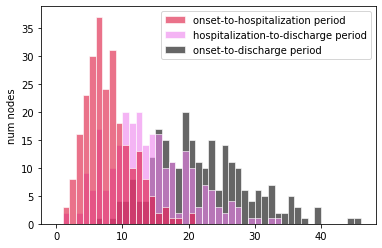

onset-to-hospitalization period:  mean = 7.94, std = 3.60, 95% CI = (2.62, 16.15)

hospitalization-to-death period:  mean = 6.87, std = 3.00, 95% CI = (2.27, 13.04)

onset-to-death period:  mean = 14.81, std = 4.74, 95% CI = (6.85, 24.35)



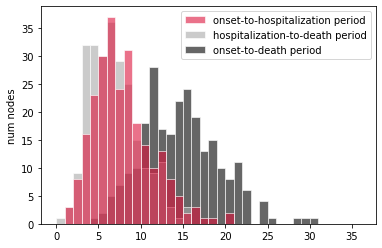

Individual R0:  mean = 1.00, std = 0.20, 95% CI = (0.62, 1.40)



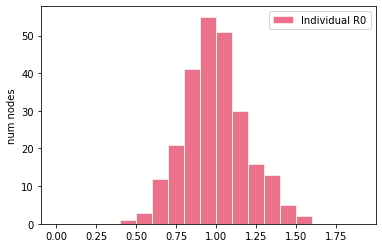

[INTERVENTIONS @ t = 0.13 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.26 (27 (10.80%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 1 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[I

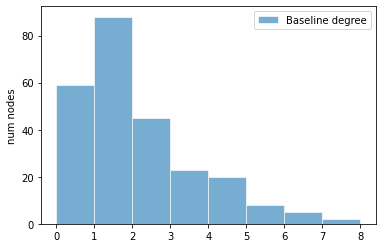

latent period:  mean = 3.45, std = 2.20, 95% CI = (0.72, 9.39)

pre-symptomatic period:  mean = 2.50, std = 1.68, 95% CI = (0.45, 6.41)

total incubation period:  mean = 5.94, std = 2.88, 95% CI = (1.87, 12.92)



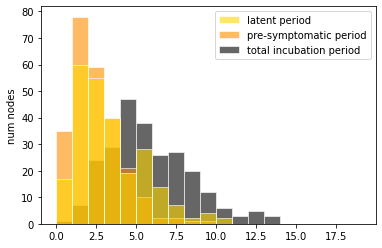

pre-symptomatic period:  mean = 3.45, std = 2.20, 95% CI = (0.72, 9.39)

(a)symptomatic period:  mean = 6.44, std = 2.50, 95% CI = (2.67, 11.50)

total infectious period:  mean = 9.89, std = 3.28, 95% CI = (4.80, 17.04)



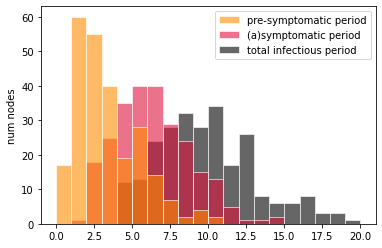

onset-to-hospitalization period:  mean = 7.57, std = 3.42, 95% CI = (2.14, 15.00)

hospitalization-to-discharge period:  mean = 13.88, std = 6.09, 95% CI = (4.57, 27.30)

onset-to-discharge period:  mean = 21.45, std = 6.87, 95% CI = (9.86, 35.83)



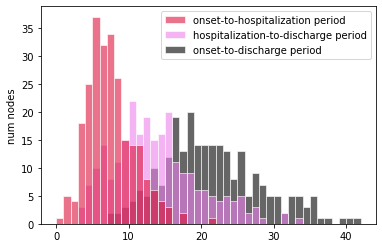

onset-to-hospitalization period:  mean = 7.57, std = 3.42, 95% CI = (2.14, 15.00)

hospitalization-to-death period:  mean = 6.79, std = 3.16, 95% CI = (2.37, 14.02)

onset-to-death period:  mean = 14.37, std = 4.47, 95% CI = (7.33, 25.11)



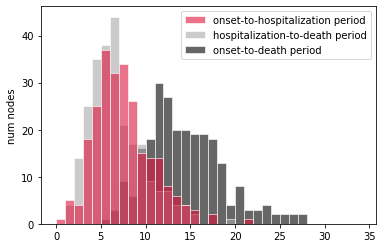

Individual R0:  mean = 1.00, std = 0.20, 95% CI = (0.67, 1.42)



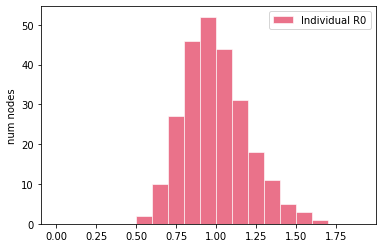

[INTERVENTIONS @ t = 0.18 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 0 positive (0.00 %) +]
	250	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[NEW EXPOSURE @ t = 1.14 (1 exposed)]
[INTERVENTIONS @ t = 1.14 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates o

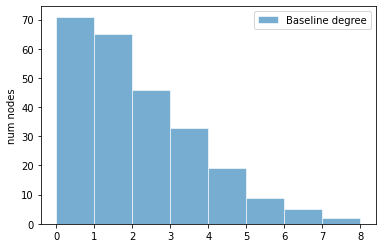

latent period:  mean = 3.46, std = 2.16, 95% CI = (0.49, 8.81)

pre-symptomatic period:  mean = 2.61, std = 1.62, 95% CI = (0.52, 6.08)

total incubation period:  mean = 6.07, std = 2.75, 95% CI = (1.87, 12.24)



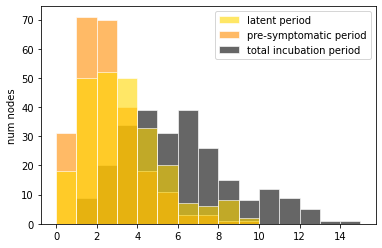

pre-symptomatic period:  mean = 3.46, std = 2.16, 95% CI = (0.49, 8.81)

(a)symptomatic period:  mean = 6.34, std = 2.53, 95% CI = (2.47, 12.39)

total infectious period:  mean = 9.81, std = 3.18, 95% CI = (5.03, 16.81)



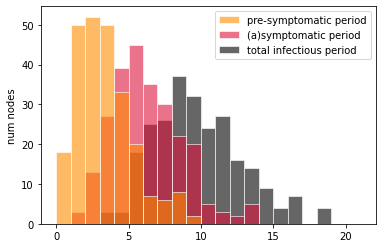

onset-to-hospitalization period:  mean = 8.46, std = 3.79, 95% CI = (3.09, 16.05)

hospitalization-to-discharge period:  mean = 13.63, std = 6.60, 95% CI = (4.08, 30.28)

onset-to-discharge period:  mean = 22.09, std = 7.59, 95% CI = (10.56, 39.18)



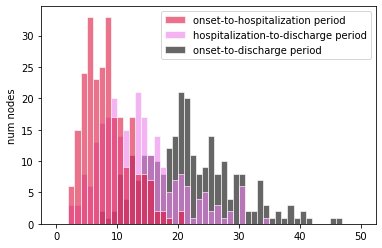

onset-to-hospitalization period:  mean = 8.46, std = 3.79, 95% CI = (3.09, 16.05)

hospitalization-to-death period:  mean = 7.04, std = 2.90, 95% CI = (2.42, 12.70)

onset-to-death period:  mean = 15.50, std = 4.62, 95% CI = (8.03, 24.94)



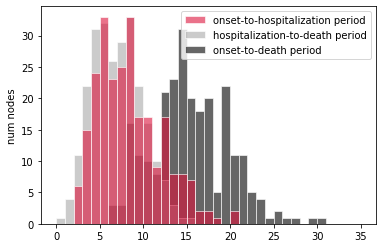

Individual R0:  mean = 0.99, std = 0.21, 95% CI = (0.62, 1.47)



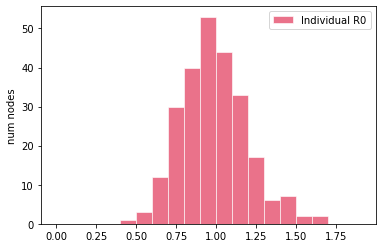

[INTERVENTIONS @ t = 0.00 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.39 (24 (9.60%) infected)]
	1	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[NEW EX

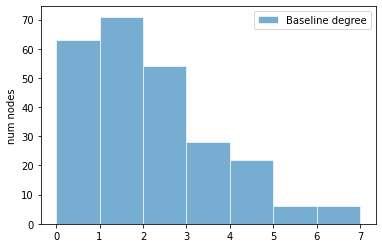

latent period:  mean = 3.48, std = 2.15, 95% CI = (0.58, 8.90)

pre-symptomatic period:  mean = 2.39, std = 1.41, 95% CI = (0.33, 5.79)

total incubation period:  mean = 5.86, std = 2.56, 95% CI = (2.13, 12.27)



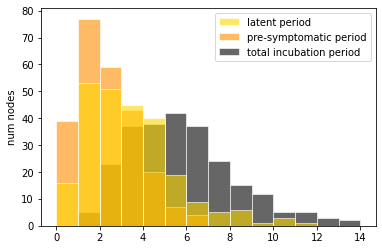

pre-symptomatic period:  mean = 3.48, std = 2.15, 95% CI = (0.58, 8.90)

(a)symptomatic period:  mean = 6.56, std = 2.63, 95% CI = (2.90, 13.00)

total infectious period:  mean = 10.04, std = 3.46, 95% CI = (4.46, 17.85)



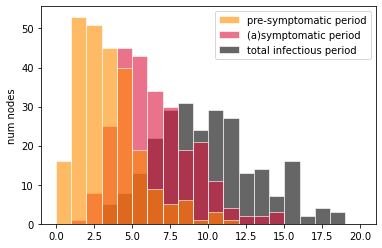

onset-to-hospitalization period:  mean = 8.26, std = 3.81, 95% CI = (2.71, 16.93)

hospitalization-to-discharge period:  mean = 13.94, std = 6.25, 95% CI = (4.76, 29.80)

onset-to-discharge period:  mean = 22.21, std = 7.22, 95% CI = (9.90, 38.56)



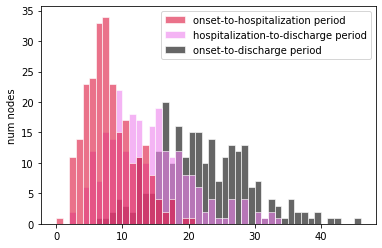

onset-to-hospitalization period:  mean = 8.26, std = 3.81, 95% CI = (2.71, 16.93)

hospitalization-to-death period:  mean = 6.88, std = 3.12, 95% CI = (2.46, 13.42)

onset-to-death period:  mean = 15.14, std = 5.05, 95% CI = (6.96, 25.90)



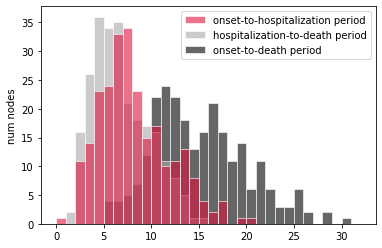

Individual R0:  mean = 1.01, std = 0.19, 95% CI = (0.64, 1.43)



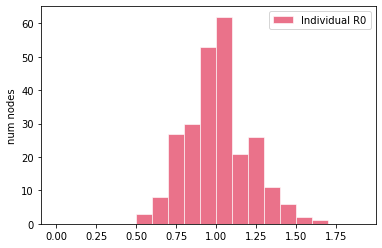

[INTERVENTIONS @ t = 0.01 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.02 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTER

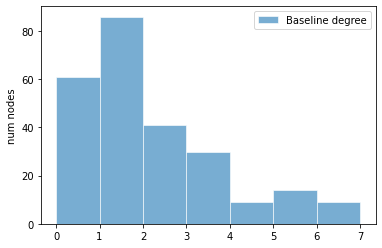

latent period:  mean = 3.50, std = 1.94, 95% CI = (0.68, 8.01)

pre-symptomatic period:  mean = 2.66, std = 1.77, 95% CI = (0.56, 7.56)

total incubation period:  mean = 6.16, std = 2.40, 95% CI = (2.19, 11.62)



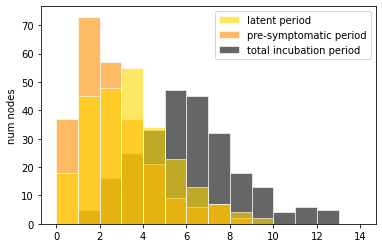

pre-symptomatic period:  mean = 3.50, std = 1.94, 95% CI = (0.68, 8.01)

(a)symptomatic period:  mean = 6.68, std = 2.58, 95% CI = (2.68, 12.79)

total infectious period:  mean = 10.18, std = 3.36, 95% CI = (4.71, 17.45)



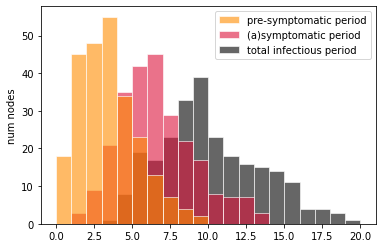

onset-to-hospitalization period:  mean = 7.97, std = 3.57, 95% CI = (2.57, 17.63)

hospitalization-to-discharge period:  mean = 13.34, std = 6.19, 95% CI = (4.49, 28.70)

onset-to-discharge period:  mean = 21.32, std = 7.41, 95% CI = (10.12, 38.82)



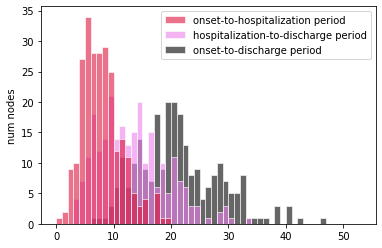

onset-to-hospitalization period:  mean = 7.97, std = 3.57, 95% CI = (2.57, 17.63)

hospitalization-to-death period:  mean = 6.82, std = 2.97, 95% CI = (2.61, 15.15)

onset-to-death period:  mean = 14.80, std = 4.68, 95% CI = (7.06, 26.23)



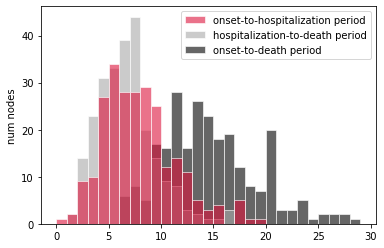

Individual R0:  mean = 1.00, std = 0.20, 95% CI = (0.65, 1.46)



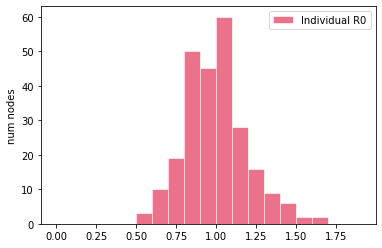

[INTERVENTIONS @ t = 0.02 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.09 (25 (10.00%) infected)]
	3	tested due to symptoms  [+ 3 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	3	tested TOTAL            [+ 3 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	3 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[I

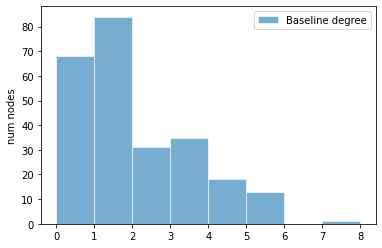

latent period:  mean = 3.49, std = 2.17, 95% CI = (0.75, 8.72)

pre-symptomatic period:  mean = 2.56, std = 1.64, 95% CI = (0.50, 6.72)

total incubation period:  mean = 6.05, std = 2.85, 95% CI = (2.30, 12.50)



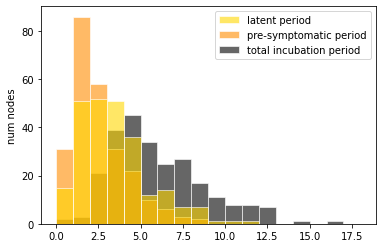

pre-symptomatic period:  mean = 3.49, std = 2.17, 95% CI = (0.75, 8.72)

(a)symptomatic period:  mean = 6.31, std = 2.40, 95% CI = (2.52, 11.89)

total infectious period:  mean = 9.80, std = 3.10, 95% CI = (4.78, 16.94)



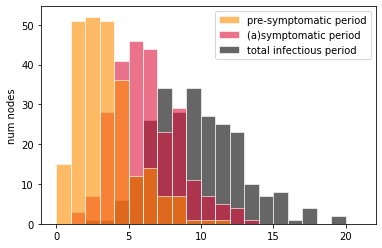

onset-to-hospitalization period:  mean = 7.43, std = 3.55, 95% CI = (2.19, 15.35)

hospitalization-to-discharge period:  mean = 13.69, std = 6.58, 95% CI = (4.67, 28.01)

onset-to-discharge period:  mean = 21.12, std = 7.31, 95% CI = (11.00, 36.41)



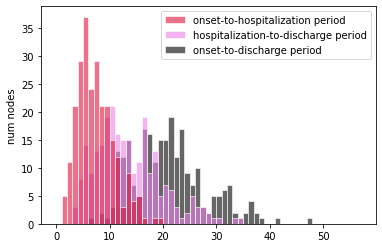

onset-to-hospitalization period:  mean = 7.43, std = 3.55, 95% CI = (2.19, 15.35)

hospitalization-to-death period:  mean = 6.63, std = 2.73, 95% CI = (2.09, 12.73)

onset-to-death period:  mean = 14.06, std = 4.35, 95% CI = (6.73, 23.55)



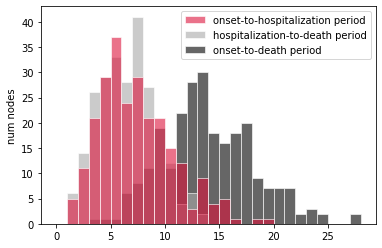

Individual R0:  mean = 0.99, std = 0.20, 95% CI = (0.64, 1.43)



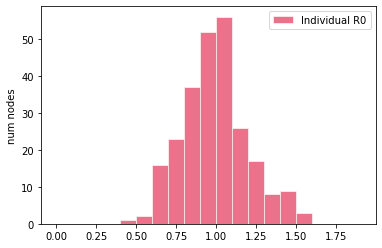

[NEW EXPOSURE @ t = 0.01 (1 exposed)]
[INTERVENTIONS @ t = 0.01 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.08 (26 (10.40%) infected)]
	3	tested due to symptoms  [+ 1 positive (33.33 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	3	tested TOTAL            [+ 1 positive (33.33 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates

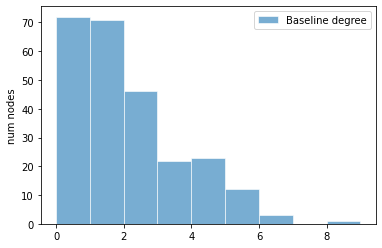

latent period:  mean = 3.54, std = 2.15, 95% CI = (0.55, 8.32)

pre-symptomatic period:  mean = 2.66, std = 1.55, 95% CI = (0.52, 6.29)

total incubation period:  mean = 6.19, std = 2.52, 95% CI = (2.33, 11.41)



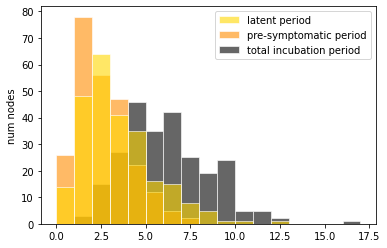

pre-symptomatic period:  mean = 3.54, std = 2.15, 95% CI = (0.55, 8.32)

(a)symptomatic period:  mean = 6.75, std = 2.63, 95% CI = (2.70, 12.66)

total infectious period:  mean = 10.28, std = 3.16, 95% CI = (4.67, 16.90)



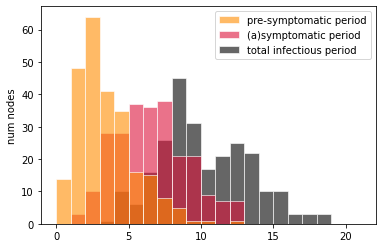

onset-to-hospitalization period:  mean = 7.84, std = 3.67, 95% CI = (2.67, 16.81)

hospitalization-to-discharge period:  mean = 14.27, std = 6.06, 95% CI = (5.01, 27.82)

onset-to-discharge period:  mean = 22.11, std = 6.98, 95% CI = (9.87, 37.55)



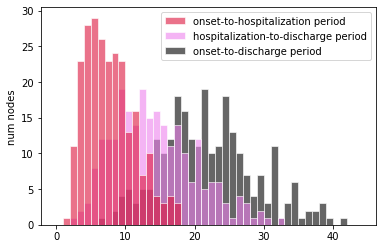

onset-to-hospitalization period:  mean = 7.84, std = 3.67, 95% CI = (2.67, 16.81)

hospitalization-to-death period:  mean = 6.81, std = 3.18, 95% CI = (2.18, 14.06)

onset-to-death period:  mean = 14.65, std = 4.70, 95% CI = (7.24, 24.81)



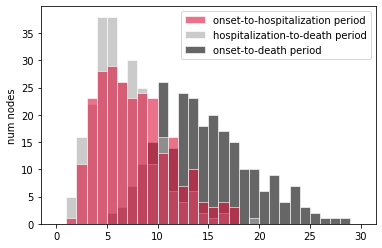

Individual R0:  mean = 1.00, std = 0.20, 95% CI = (0.66, 1.41)



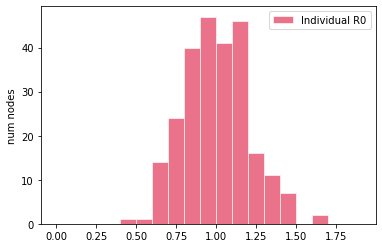

[INTERVENTIONS @ t = 0.08 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[NEW EXPOSURE @ t = 1.04 (1 exposed)]
[INTERVENTIONS @ t = 1.04 (24 (9.60%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of

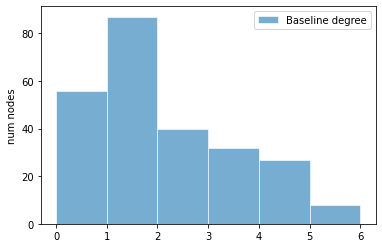

latent period:  mean = 3.27, std = 1.91, 95% CI = (0.58, 8.10)

pre-symptomatic period:  mean = 2.43, std = 1.47, 95% CI = (0.46, 5.93)

total incubation period:  mean = 5.70, std = 2.50, 95% CI = (2.08, 10.84)



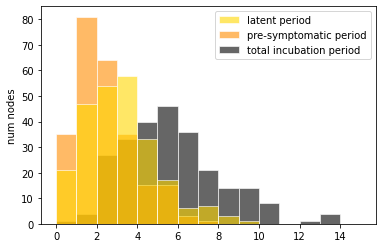

pre-symptomatic period:  mean = 3.27, std = 1.91, 95% CI = (0.58, 8.10)

(a)symptomatic period:  mean = 6.25, std = 2.46, 95% CI = (2.66, 11.39)

total infectious period:  mean = 9.52, std = 3.10, 95% CI = (4.39, 15.81)



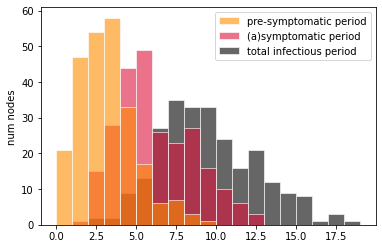

onset-to-hospitalization period:  mean = 7.64, std = 3.38, 95% CI = (1.96, 15.00)

hospitalization-to-discharge period:  mean = 14.43, std = 6.36, 95% CI = (5.58, 28.04)

onset-to-discharge period:  mean = 22.07, std = 7.02, 95% CI = (10.31, 37.84)



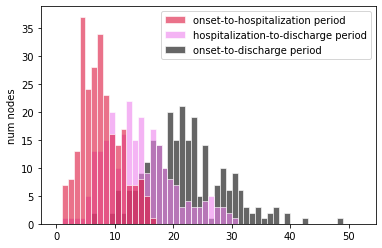

onset-to-hospitalization period:  mean = 7.64, std = 3.38, 95% CI = (1.96, 15.00)

hospitalization-to-death period:  mean = 7.03, std = 3.23, 95% CI = (2.05, 14.76)

onset-to-death period:  mean = 14.67, std = 4.67, 95% CI = (6.83, 24.55)



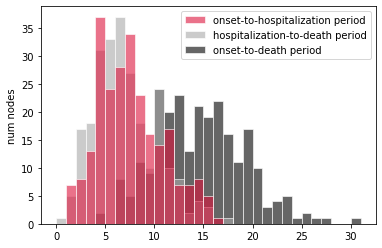

Individual R0:  mean = 1.00, std = 0.19, 95% CI = (0.67, 1.40)



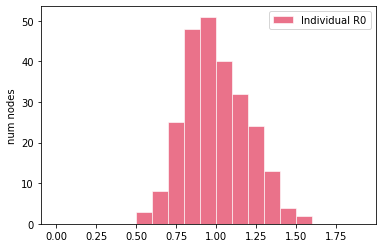

[INTERVENTIONS @ t = 0.12 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.03 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTER

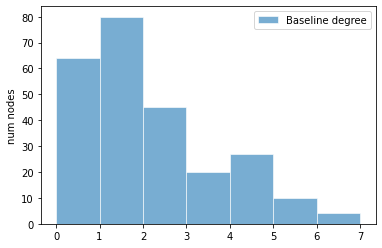

latent period:  mean = 3.60, std = 2.28, 95% CI = (0.69, 9.46)

pre-symptomatic period:  mean = 2.48, std = 1.47, 95% CI = (0.57, 6.47)

total incubation period:  mean = 6.08, std = 2.80, 95% CI = (2.50, 12.45)



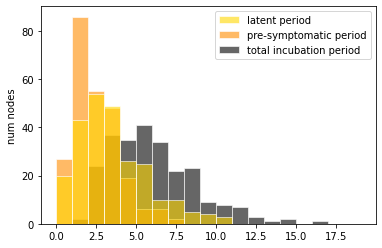

pre-symptomatic period:  mean = 3.60, std = 2.28, 95% CI = (0.69, 9.46)

(a)symptomatic period:  mean = 6.34, std = 2.74, 95% CI = (2.12, 12.40)

total infectious period:  mean = 9.94, std = 3.57, 95% CI = (4.31, 17.32)



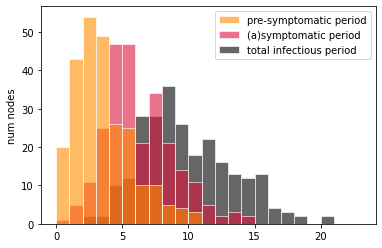

onset-to-hospitalization period:  mean = 8.16, std = 3.77, 95% CI = (2.77, 16.44)

hospitalization-to-discharge period:  mean = 14.63, std = 7.13, 95% CI = (5.21, 30.34)

onset-to-discharge period:  mean = 22.78, std = 7.82, 95% CI = (10.48, 41.30)



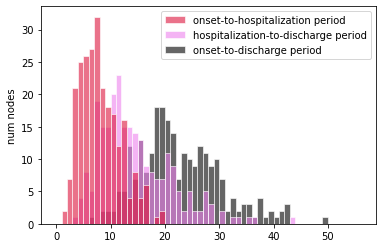

onset-to-hospitalization period:  mean = 8.16, std = 3.77, 95% CI = (2.77, 16.44)

hospitalization-to-death period:  mean = 7.17, std = 3.14, 95% CI = (2.95, 14.86)

onset-to-death period:  mean = 15.33, std = 4.90, 95% CI = (6.89, 25.32)



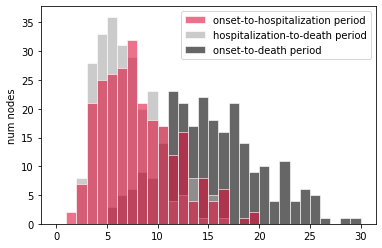

Individual R0:  mean = 0.99, std = 0.20, 95% CI = (0.66, 1.40)



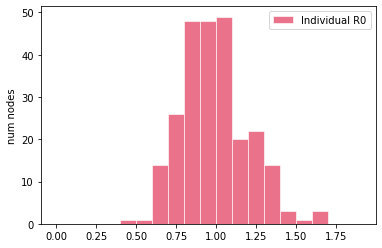

[INTERVENTIONS @ t = 0.01 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 0 positive (0.00 %) +]
	250	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.05 (25 (10.00%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 1 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[I

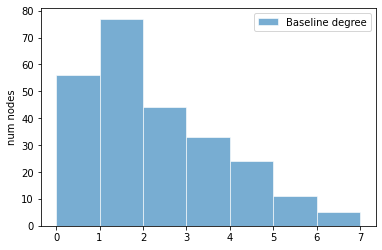

latent period:  mean = 3.67, std = 2.13, 95% CI = (0.68, 8.86)

pre-symptomatic period:  mean = 2.55, std = 1.54, 95% CI = (0.48, 5.80)

total incubation period:  mean = 6.21, std = 2.67, 95% CI = (2.12, 12.38)



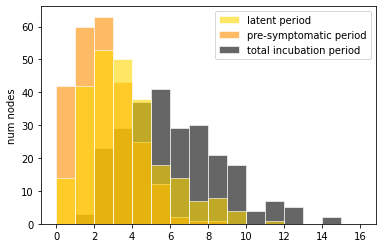

pre-symptomatic period:  mean = 3.67, std = 2.13, 95% CI = (0.68, 8.86)

(a)symptomatic period:  mean = 6.56, std = 2.86, 95% CI = (2.37, 13.11)

total infectious period:  mean = 10.22, std = 3.57, 95% CI = (4.72, 19.14)



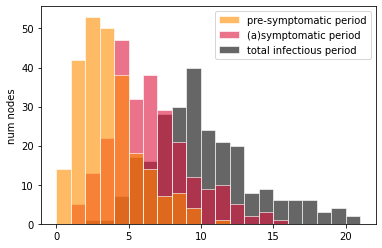

onset-to-hospitalization period:  mean = 8.06, std = 3.42, 95% CI = (2.66, 16.07)

hospitalization-to-discharge period:  mean = 13.50, std = 5.82, 95% CI = (3.72, 25.94)

onset-to-discharge period:  mean = 21.56, std = 6.60, 95% CI = (9.88, 34.25)



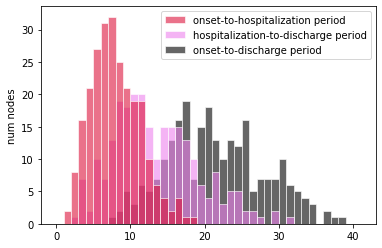

onset-to-hospitalization period:  mean = 8.06, std = 3.42, 95% CI = (2.66, 16.07)

hospitalization-to-death period:  mean = 7.11, std = 3.17, 95% CI = (2.35, 14.09)

onset-to-death period:  mean = 15.17, std = 4.72, 95% CI = (7.43, 25.00)



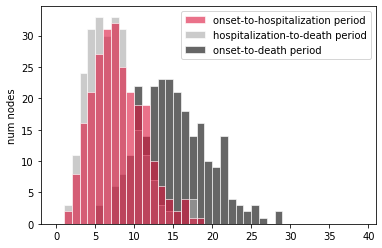

Individual R0:  mean = 0.99, std = 0.21, 95% CI = (0.65, 1.46)



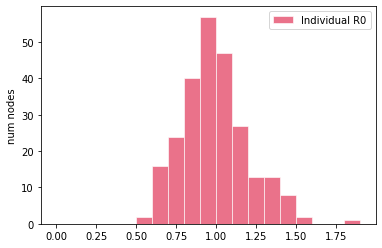

[INTERVENTIONS @ t = 0.14 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.05 (25 (10.00%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 1 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[I

In [9]:
# Final parameters for the conditions in thesis
#Network_size = [20, 50, 100, 250, 500, 1000]
#Bubble_size = [5, 10, 25, 50]
#PCR_Frequency = ['none', 'workday', 'weekly', 'monthly']
#Other options are: everyday, semiweekly & biweekly
#R = [1, 1.5, 2, 2.5, 3]

# Test parameters for faster testing
Network_size = [20, 50, 250]
Bubble_size = [5, 25]
PCR_Frequency = ['workday', 'weekly']
          
# Loop to itterate over every possible combination of parameters
for i in range(len(Network_size)):
    for j in range(len(Bubble_size)):
        if (Network_size[i] % Bubble_size[j]) != 0:
            continue 
        if Network_size[i] == Bubble_size[j]:
            continue
        for k in range(len(PCR_Frequency)):
            #for l in range(len(R)):
            simulation_covid(Network_size[i], Bubble_size[j], PCR_Frequency[k], 1, 15)


Network size = 20
Bubble size = 20
PCR_frequency = workday
R = 1
Baseline:
Degree: mean = 1.80, std = 1.40, 95% CI = (0.00, 4.52)
        coeff var = 0.78
Assortativity:    -0.38
Clustering coeff: 0.23



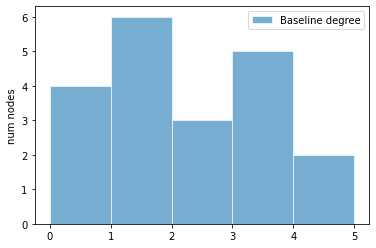

latent period:  mean = 3.28, std = 2.47, 95% CI = (0.55, 8.68)

pre-symptomatic period:  mean = 2.39, std = 1.08, 95% CI = (0.86, 4.83)

total incubation period:  mean = 5.67, std = 2.95, 95% CI = (2.54, 13.09)



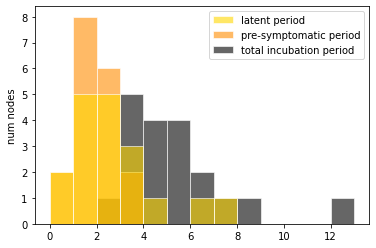

pre-symptomatic period:  mean = 3.28, std = 2.47, 95% CI = (0.55, 8.68)

(a)symptomatic period:  mean = 7.38, std = 2.70, 95% CI = (2.97, 12.73)

total infectious period:  mean = 10.66, std = 3.14, 95% CI = (5.64, 15.21)



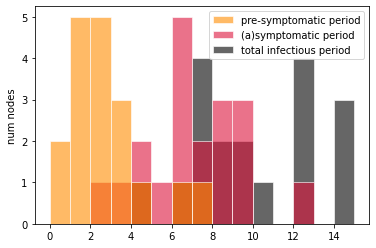

onset-to-hospitalization period:  mean = 7.02, std = 2.95, 95% CI = (3.45, 12.28)

hospitalization-to-discharge period:  mean = 13.33, std = 6.95, 95% CI = (4.97, 27.47)

onset-to-discharge period:  mean = 20.35, std = 7.85, 95% CI = (12.20, 37.35)



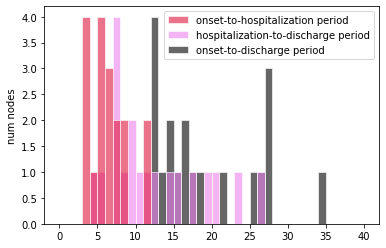

onset-to-hospitalization period:  mean = 7.02, std = 2.95, 95% CI = (3.45, 12.28)

hospitalization-to-death period:  mean = 6.94, std = 2.78, 95% CI = (2.88, 12.45)

onset-to-death period:  mean = 13.96, std = 2.93, 95% CI = (8.27, 19.51)



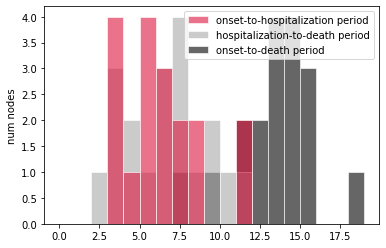

Individual R0:  mean = 0.96, std = 0.18, 95% CI = (0.64, 1.28)



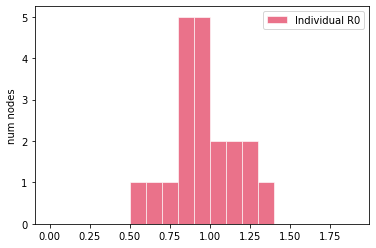

[INTERVENTIONS @ t = 0.40 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 0 positive (0.00 %) +]
	20	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.92 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 2 positive (10.00 %) +]
	20	tested TOTAL            [+ 2 positive (10.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	2 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTER

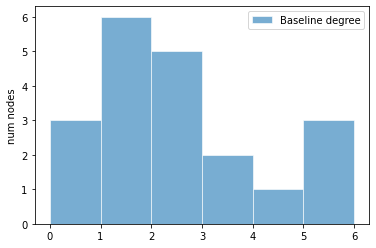

latent period:  mean = 4.20, std = 2.38, 95% CI = (0.78, 8.93)

pre-symptomatic period:  mean = 2.04, std = 1.31, 95% CI = (0.44, 4.80)

total incubation period:  mean = 6.24, std = 2.66, 95% CI = (1.75, 10.49)



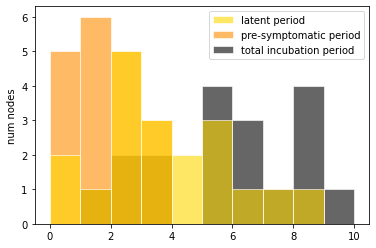

pre-symptomatic period:  mean = 4.20, std = 2.38, 95% CI = (0.78, 8.93)

(a)symptomatic period:  mean = 5.29, std = 2.10, 95% CI = (2.80, 9.72)

total infectious period:  mean = 9.49, std = 3.20, 95% CI = (4.84, 16.64)



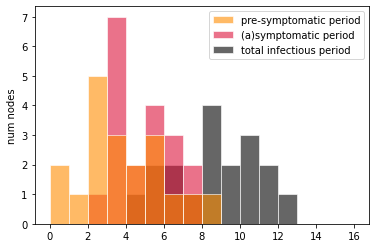

onset-to-hospitalization period:  mean = 8.00, std = 2.77, 95% CI = (3.51, 12.90)

hospitalization-to-discharge period:  mean = 14.61, std = 6.81, 95% CI = (4.92, 29.09)

onset-to-discharge period:  mean = 22.62, std = 7.13, 95% CI = (10.67, 35.42)



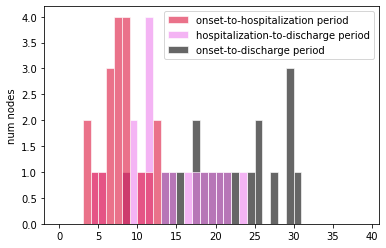

onset-to-hospitalization period:  mean = 8.00, std = 2.77, 95% CI = (3.51, 12.90)

hospitalization-to-death period:  mean = 7.55, std = 3.29, 95% CI = (3.77, 15.03)

onset-to-death period:  mean = 15.55, std = 3.00, 95% CI = (10.74, 19.84)



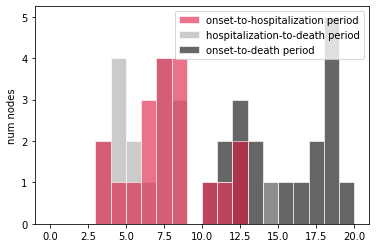

Individual R0:  mean = 1.04, std = 0.24, 95% CI = (0.69, 1.51)



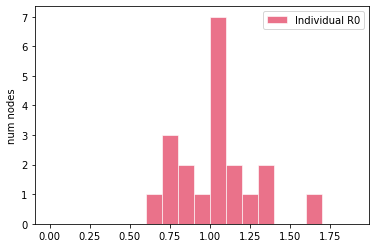

[INTERVENTIONS @ t = 0.20 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.32 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	19	tested randomly         [+ 0 positive (0.00 %) +]
	19	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

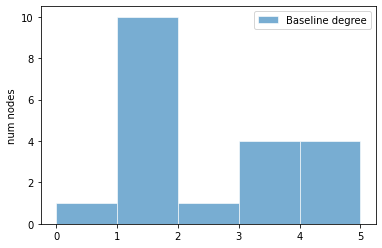

latent period:  mean = 3.48, std = 1.60, 95% CI = (0.59, 6.15)

pre-symptomatic period:  mean = 2.26, std = 1.32, 95% CI = (0.53, 5.06)

total incubation period:  mean = 5.74, std = 2.24, 95% CI = (1.53, 9.31)



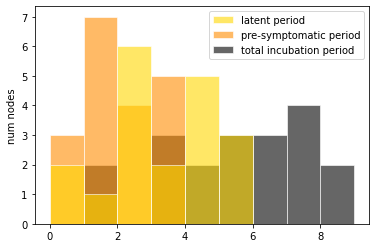

pre-symptomatic period:  mean = 3.48, std = 1.60, 95% CI = (0.59, 6.15)

(a)symptomatic period:  mean = 6.39, std = 3.01, 95% CI = (2.34, 11.64)

total infectious period:  mean = 9.86, std = 2.65, 95% CI = (5.54, 15.25)



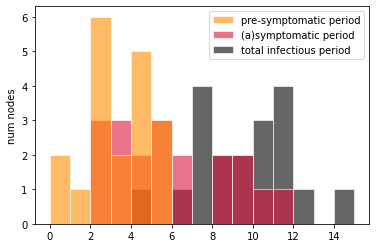

onset-to-hospitalization period:  mean = 7.85, std = 3.13, 95% CI = (3.68, 14.49)

hospitalization-to-discharge period:  mean = 13.72, std = 4.95, 95% CI = (5.81, 23.89)

onset-to-discharge period:  mean = 21.57, std = 5.43, 95% CI = (11.60, 31.39)



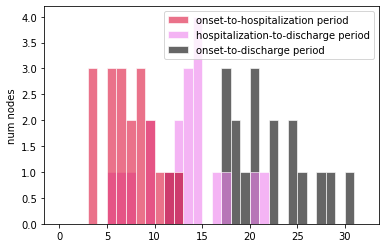

onset-to-hospitalization period:  mean = 7.85, std = 3.13, 95% CI = (3.68, 14.49)

hospitalization-to-death period:  mean = 6.52, std = 3.42, 95% CI = (2.43, 14.75)

onset-to-death period:  mean = 14.37, std = 5.73, 95% CI = (7.01, 29.03)



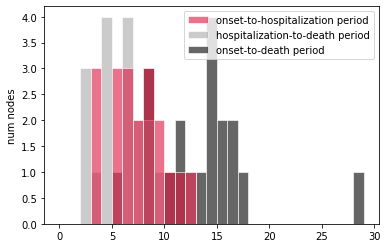

Individual R0:  mean = 0.97, std = 0.19, 95% CI = (0.75, 1.44)



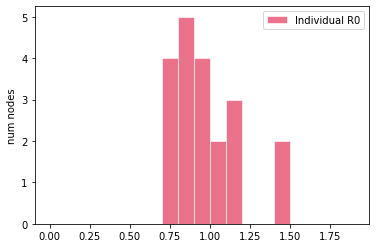

[INTERVENTIONS @ t = 1.75 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 0 positive (0.00 %) +]
	20	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.91 (2 (10.00%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	19	tested randomly         [+ 1 positive (5.26 %) +]
	20	tested TOTAL            [+ 2 positive (10.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	2 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTE

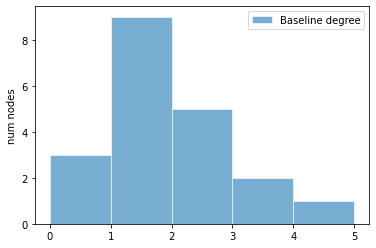

latent period:  mean = 4.27, std = 2.73, 95% CI = (0.72, 10.40)

pre-symptomatic period:  mean = 2.81, std = 1.61, 95% CI = (0.69, 5.91)

total incubation period:  mean = 7.08, std = 2.87, 95% CI = (3.22, 13.35)



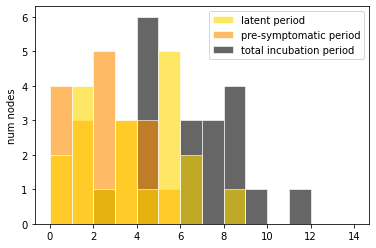

pre-symptomatic period:  mean = 4.27, std = 2.73, 95% CI = (0.72, 10.40)

(a)symptomatic period:  mean = 6.34, std = 2.55, 95% CI = (3.02, 11.43)

total infectious period:  mean = 10.61, std = 4.12, 95% CI = (4.66, 19.21)



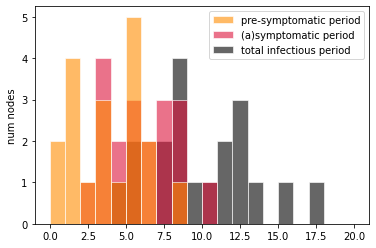

onset-to-hospitalization period:  mean = 7.67, std = 2.71, 95% CI = (4.04, 12.76)

hospitalization-to-discharge period:  mean = 14.79, std = 8.58, 95% CI = (3.10, 33.73)

onset-to-discharge period:  mean = 22.45, std = 8.56, 95% CI = (10.42, 41.98)



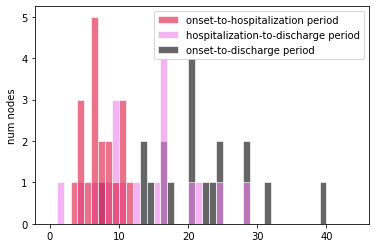

onset-to-hospitalization period:  mean = 7.67, std = 2.71, 95% CI = (4.04, 12.76)

hospitalization-to-death period:  mean = 6.74, std = 3.88, 95% CI = (1.75, 15.55)

onset-to-death period:  mean = 14.40, std = 4.66, 95% CI = (6.87, 23.44)



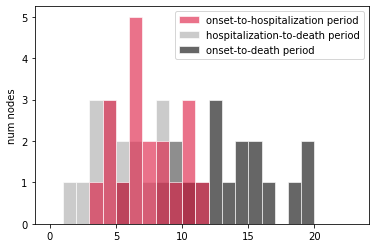

Individual R0:  mean = 0.95, std = 0.16, 95% CI = (0.75, 1.25)



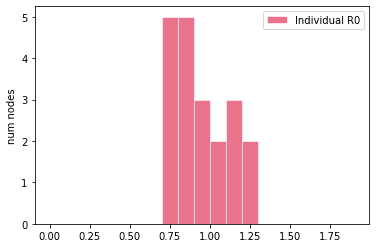

[INTERVENTIONS @ t = 1.08 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.74 (3 (15.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	19	tested randomly         [+ 1 positive (5.26 %) +]
	19	tested TOTAL            [+ 1 positive (5.26 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

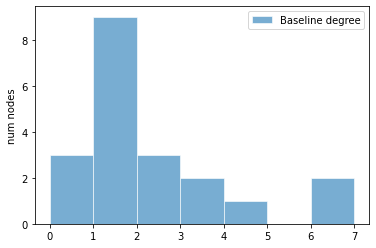

latent period:  mean = 3.42, std = 2.30, 95% CI = (0.93, 8.90)

pre-symptomatic period:  mean = 3.04, std = 1.52, 95% CI = (1.01, 6.63)

total incubation period:  mean = 6.47, std = 3.34, 95% CI = (2.64, 14.91)



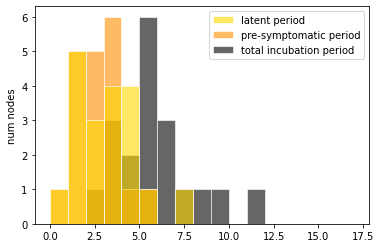

pre-symptomatic period:  mean = 3.42, std = 2.30, 95% CI = (0.93, 8.90)

(a)symptomatic period:  mean = 5.85, std = 2.11, 95% CI = (2.41, 9.56)

total infectious period:  mean = 9.27, std = 2.85, 95% CI = (4.50, 13.94)



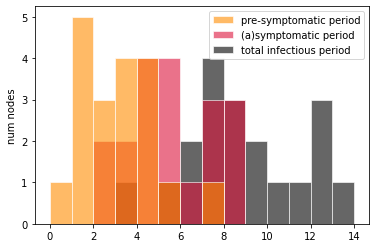

onset-to-hospitalization period:  mean = 7.73, std = 3.35, 95% CI = (2.81, 14.36)

hospitalization-to-discharge period:  mean = 15.10, std = 6.31, 95% CI = (7.41, 26.75)

onset-to-discharge period:  mean = 22.83, std = 8.24, 95% CI = (11.12, 38.88)



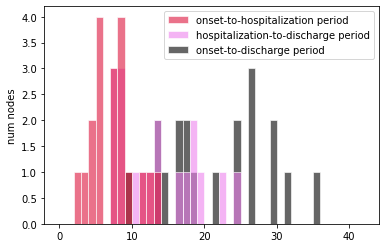

onset-to-hospitalization period:  mean = 7.73, std = 3.35, 95% CI = (2.81, 14.36)

hospitalization-to-death period:  mean = 7.85, std = 4.44, 95% CI = (2.06, 15.23)

onset-to-death period:  mean = 15.58, std = 6.00, 95% CI = (7.29, 25.87)



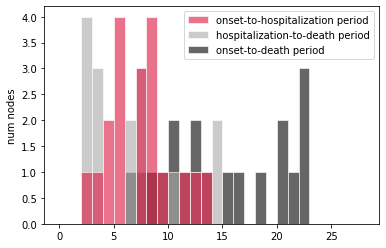

Individual R0:  mean = 1.04, std = 0.21, 95% CI = (0.70, 1.40)



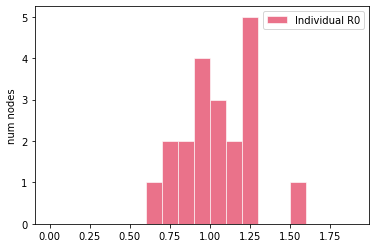

[INTERVENTIONS @ t = 0.03 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 0 positive (0.00 %) +]
	20	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 4.59 (2 (10.00%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	19	tested randomly         [+ 2 positive (10.53 %) +]
	20	tested TOTAL            [+ 3 positive (15.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	3 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INT

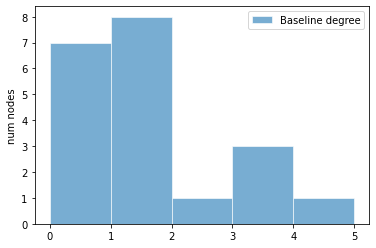

latent period:  mean = 3.34, std = 1.72, 95% CI = (1.05, 6.53)

pre-symptomatic period:  mean = 2.68, std = 2.32, 95% CI = (0.22, 8.09)

total incubation period:  mean = 6.03, std = 2.89, 95% CI = (2.76, 11.91)



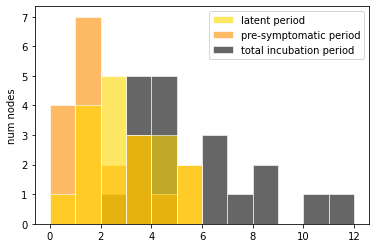

pre-symptomatic period:  mean = 3.34, std = 1.72, 95% CI = (1.05, 6.53)

(a)symptomatic period:  mean = 6.04, std = 2.57, 95% CI = (2.56, 11.33)

total infectious period:  mean = 9.38, std = 3.25, 95% CI = (4.28, 15.18)



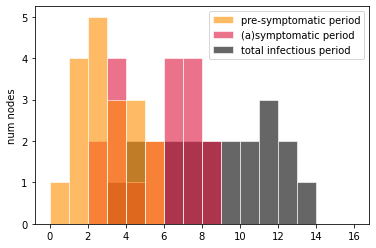

onset-to-hospitalization period:  mean = 7.13, std = 3.22, 95% CI = (3.54, 14.32)

hospitalization-to-discharge period:  mean = 13.24, std = 4.84, 95% CI = (6.56, 22.51)

onset-to-discharge period:  mean = 20.37, std = 6.07, 95% CI = (11.38, 30.45)



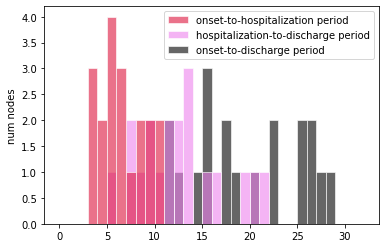

onset-to-hospitalization period:  mean = 7.13, std = 3.22, 95% CI = (3.54, 14.32)

hospitalization-to-death period:  mean = 6.48, std = 3.33, 95% CI = (1.70, 11.85)

onset-to-death period:  mean = 13.61, std = 5.42, 95% CI = (7.20, 25.52)



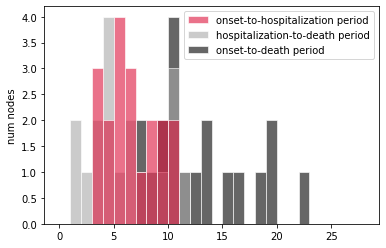

Individual R0:  mean = 1.01, std = 0.20, 95% CI = (0.75, 1.40)



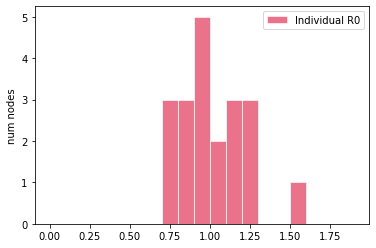

[INTERVENTIONS @ t = 0.02 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.49 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	19	tested randomly         [+ 1 positive (5.26 %) +]
	19	tested TOTAL            [+ 1 positive (5.26 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

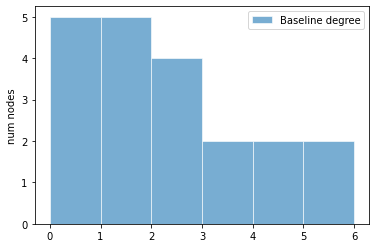

latent period:  mean = 3.58, std = 1.91, 95% CI = (0.46, 6.96)

pre-symptomatic period:  mean = 2.95, std = 1.51, 95% CI = (1.20, 5.65)

total incubation period:  mean = 6.52, std = 2.48, 95% CI = (2.32, 10.67)



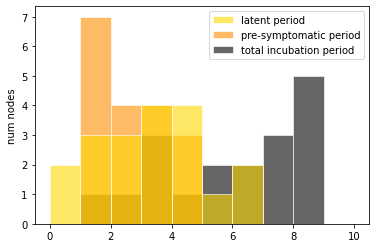

pre-symptomatic period:  mean = 3.58, std = 1.91, 95% CI = (0.46, 6.96)

(a)symptomatic period:  mean = 6.69, std = 2.32, 95% CI = (2.80, 10.44)

total infectious period:  mean = 10.26, std = 2.42, 95% CI = (5.52, 14.19)



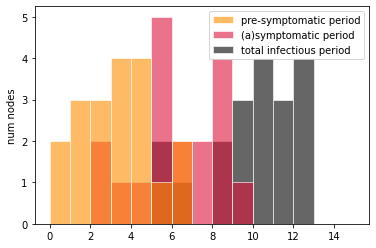

onset-to-hospitalization period:  mean = 9.64, std = 3.93, 95% CI = (4.23, 18.31)

hospitalization-to-discharge period:  mean = 12.66, std = 4.63, 95% CI = (7.35, 23.25)

onset-to-discharge period:  mean = 22.31, std = 5.81, 95% CI = (13.86, 32.75)



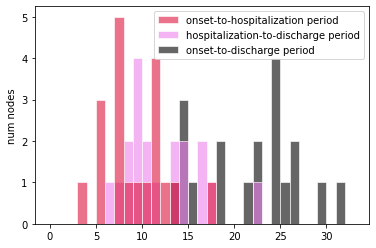

onset-to-hospitalization period:  mean = 9.64, std = 3.93, 95% CI = (4.23, 18.31)

hospitalization-to-death period:  mean = 6.77, std = 1.78, 95% CI = (3.76, 9.77)

onset-to-death period:  mean = 16.42, std = 3.91, 95% CI = (10.18, 24.60)



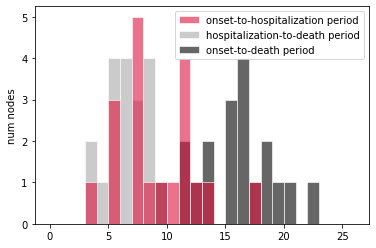

Individual R0:  mean = 1.01, std = 0.24, 95% CI = (0.66, 1.51)



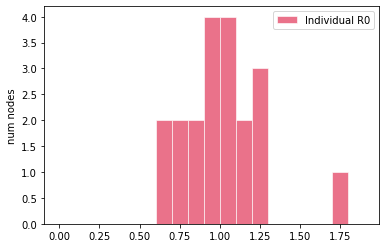

[INTERVENTIONS @ t = 3.81 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 5.51 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

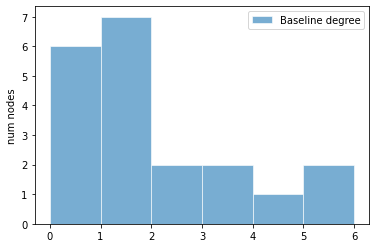

latent period:  mean = 4.31, std = 2.10, 95% CI = (1.08, 8.02)

pre-symptomatic period:  mean = 2.09, std = 1.25, 95% CI = (0.55, 4.87)

total incubation period:  mean = 6.40, std = 1.81, 95% CI = (3.47, 9.84)



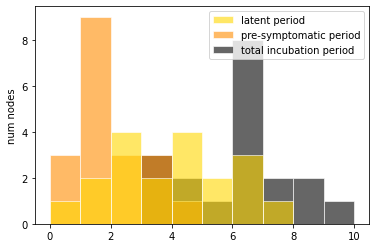

pre-symptomatic period:  mean = 4.31, std = 2.10, 95% CI = (1.08, 8.02)

(a)symptomatic period:  mean = 6.67, std = 3.12, 95% CI = (2.92, 14.17)

total infectious period:  mean = 10.99, std = 4.01, 95% CI = (6.09, 20.10)



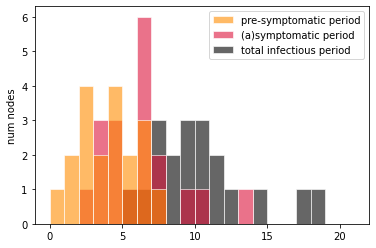

onset-to-hospitalization period:  mean = 8.60, std = 3.58, 95% CI = (2.19, 15.28)

hospitalization-to-discharge period:  mean = 14.83, std = 8.71, 95% CI = (3.72, 32.76)

onset-to-discharge period:  mean = 23.43, std = 9.99, 95% CI = (9.34, 43.83)



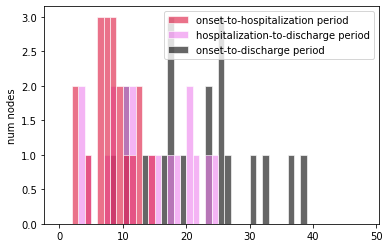

onset-to-hospitalization period:  mean = 8.60, std = 3.58, 95% CI = (2.19, 15.28)

hospitalization-to-death period:  mean = 8.07, std = 3.17, 95% CI = (3.46, 15.08)

onset-to-death period:  mean = 16.67, std = 4.21, 95% CI = (9.72, 25.44)



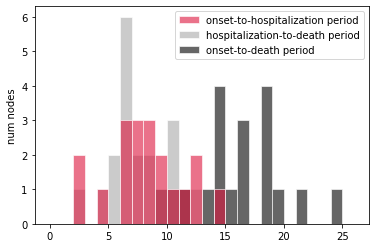

Individual R0:  mean = 0.99, std = 0.19, 95% CI = (0.69, 1.34)



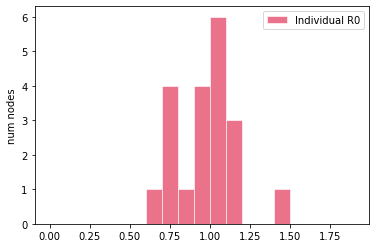

[INTERVENTIONS @ t = 0.52 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 0 positive (0.00 %) +]
	20	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.27 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 2 positive (10.00 %) +]
	20	tested TOTAL            [+ 2 positive (10.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	2 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTER

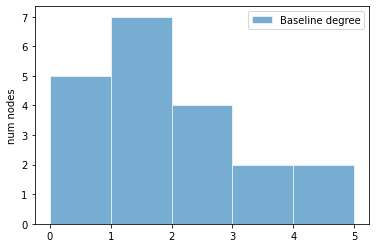

latent period:  mean = 3.72, std = 1.92, 95% CI = (1.36, 7.82)

pre-symptomatic period:  mean = 2.96, std = 2.11, 95% CI = (0.65, 6.99)

total incubation period:  mean = 6.68, std = 2.62, 95% CI = (3.30, 11.42)



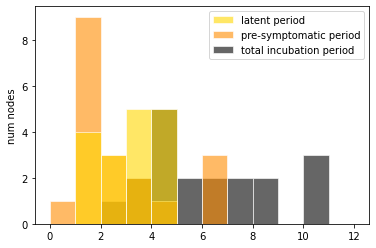

pre-symptomatic period:  mean = 3.72, std = 1.92, 95% CI = (1.36, 7.82)

(a)symptomatic period:  mean = 6.51, std = 2.13, 95% CI = (3.61, 10.51)

total infectious period:  mean = 10.23, std = 2.51, 95% CI = (6.33, 14.84)



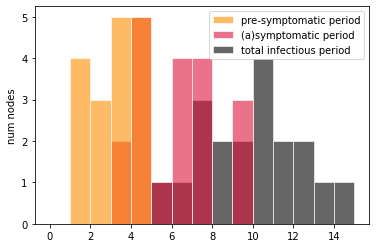

onset-to-hospitalization period:  mean = 7.14, std = 3.05, 95% CI = (3.35, 14.01)

hospitalization-to-discharge period:  mean = 15.00, std = 4.24, 95% CI = (7.45, 23.10)

onset-to-discharge period:  mean = 22.13, std = 4.89, 95% CI = (13.43, 31.20)



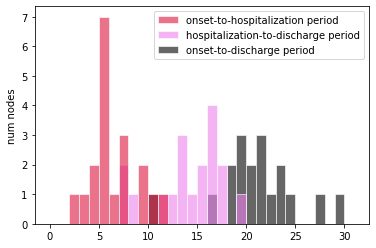

onset-to-hospitalization period:  mean = 7.14, std = 3.05, 95% CI = (3.35, 14.01)

hospitalization-to-death period:  mean = 6.98, std = 2.99, 95% CI = (3.12, 13.93)

onset-to-death period:  mean = 14.12, std = 3.61, 95% CI = (9.26, 21.31)



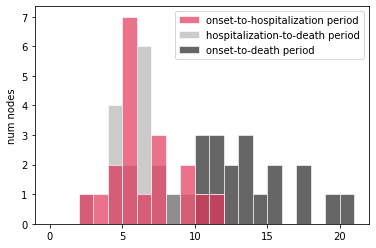

Individual R0:  mean = 1.06, std = 0.26, 95% CI = (0.66, 1.46)



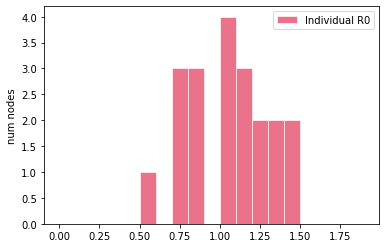

[INTERVENTIONS @ t = 0.33 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[NEW EXPOSURE @ t = 4.80 (1 exposed)]
[INTERVENTIONS @ t = 4.80 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	19	tested randomly         [+ 1 positive (5.26 %) +]
	19	tested TOTAL            [+ 1 positive (5.26 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of 

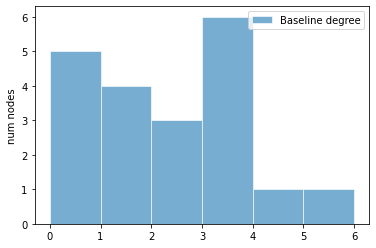

latent period:  mean = 4.24, std = 2.16, 95% CI = (1.12, 8.52)

pre-symptomatic period:  mean = 2.61, std = 1.09, 95% CI = (1.02, 4.50)

total incubation period:  mean = 6.85, std = 2.53, 95% CI = (2.71, 12.04)



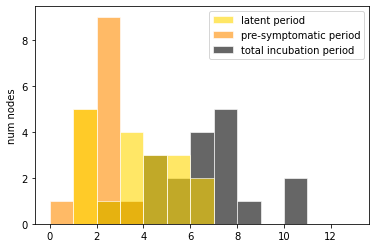

pre-symptomatic period:  mean = 4.24, std = 2.16, 95% CI = (1.12, 8.52)

(a)symptomatic period:  mean = 6.46, std = 2.93, 95% CI = (2.83, 10.73)

total infectious period:  mean = 10.69, std = 4.12, 95% CI = (4.97, 18.04)



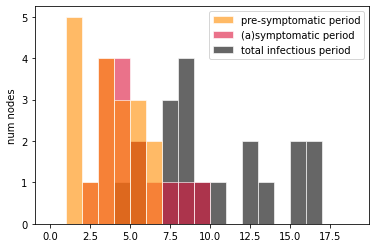

onset-to-hospitalization period:  mean = 7.75, std = 3.77, 95% CI = (2.33, 14.89)

hospitalization-to-discharge period:  mean = 12.86, std = 5.60, 95% CI = (5.65, 23.72)

onset-to-discharge period:  mean = 20.61, std = 7.44, 95% CI = (8.21, 34.96)



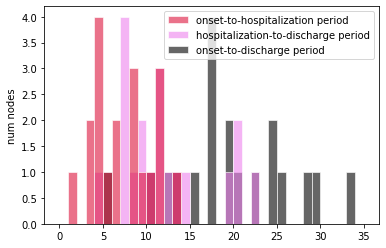

onset-to-hospitalization period:  mean = 7.75, std = 3.77, 95% CI = (2.33, 14.89)

hospitalization-to-death period:  mean = 6.08, std = 3.77, 95% CI = (1.96, 14.63)

onset-to-death period:  mean = 13.84, std = 5.94, 95% CI = (6.32, 27.14)



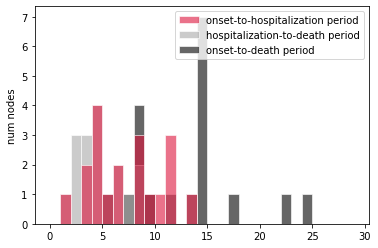

Individual R0:  mean = 0.98, std = 0.22, 95% CI = (0.70, 1.45)



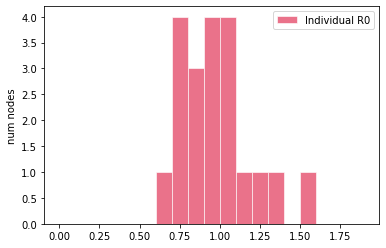

[INTERVENTIONS @ t = 0.28 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.43 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	19	tested randomly         [+ 0 positive (0.00 %) +]
	19	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

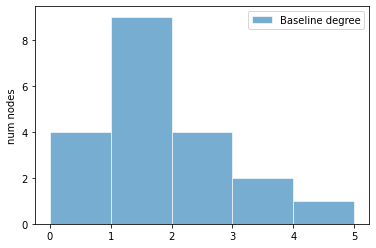

latent period:  mean = 3.42, std = 2.60, 95% CI = (0.66, 8.67)

pre-symptomatic period:  mean = 2.32, std = 1.00, 95% CI = (1.16, 4.31)

total incubation period:  mean = 5.73, std = 2.70, 95% CI = (2.36, 10.64)



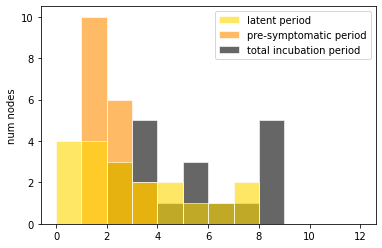

pre-symptomatic period:  mean = 3.42, std = 2.60, 95% CI = (0.66, 8.67)

(a)symptomatic period:  mean = 5.50, std = 2.14, 95% CI = (2.87, 9.29)

total infectious period:  mean = 8.91, std = 3.30, 95% CI = (4.67, 17.10)



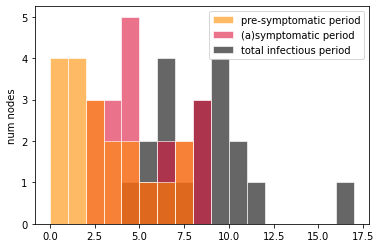

onset-to-hospitalization period:  mean = 7.72, std = 4.18, 95% CI = (1.92, 16.55)

hospitalization-to-discharge period:  mean = 16.39, std = 4.56, 95% CI = (9.06, 24.48)

onset-to-discharge period:  mean = 24.11, std = 6.74, 95% CI = (13.52, 33.92)



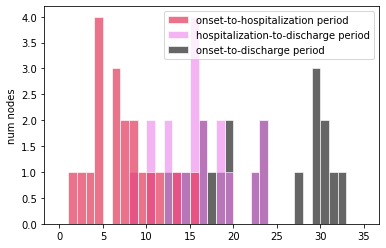

onset-to-hospitalization period:  mean = 7.72, std = 4.18, 95% CI = (1.92, 16.55)

hospitalization-to-death period:  mean = 7.03, std = 2.88, 95% CI = (2.88, 11.84)

onset-to-death period:  mean = 14.75, std = 5.51, 95% CI = (6.92, 24.27)



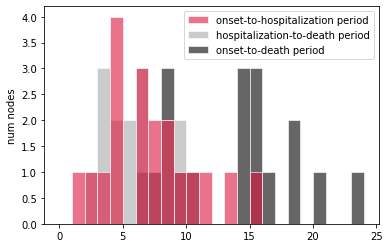

Individual R0:  mean = 1.02, std = 0.18, 95% CI = (0.75, 1.33)



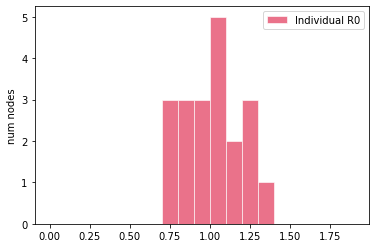

[INTERVENTIONS @ t = 0.12 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.28 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

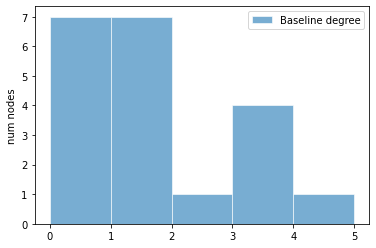

latent period:  mean = 2.95, std = 1.59, 95% CI = (0.52, 5.63)

pre-symptomatic period:  mean = 2.61, std = 1.57, 95% CI = (0.70, 5.65)

total incubation period:  mean = 5.56, std = 1.87, 95% CI = (2.52, 8.40)



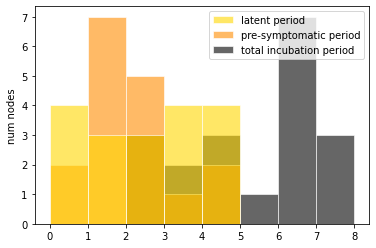

pre-symptomatic period:  mean = 2.95, std = 1.59, 95% CI = (0.52, 5.63)

(a)symptomatic period:  mean = 6.84, std = 2.64, 95% CI = (2.87, 11.73)

total infectious period:  mean = 9.79, std = 3.25, 95% CI = (5.16, 16.24)



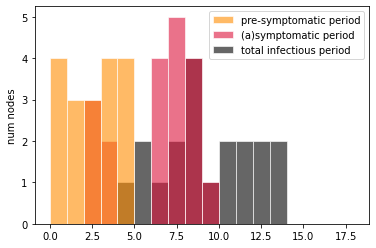

onset-to-hospitalization period:  mean = 7.73, std = 4.00, 95% CI = (2.96, 16.25)

hospitalization-to-discharge period:  mean = 14.13, std = 5.51, 95% CI = (5.85, 23.39)

onset-to-discharge period:  mean = 21.86, std = 4.66, 95% CI = (14.63, 29.22)



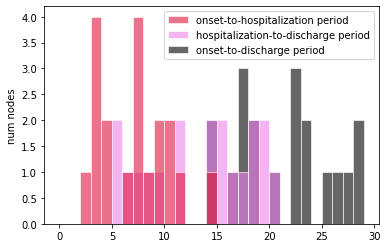

onset-to-hospitalization period:  mean = 7.73, std = 4.00, 95% CI = (2.96, 16.25)

hospitalization-to-death period:  mean = 6.96, std = 3.31, 95% CI = (2.52, 13.13)

onset-to-death period:  mean = 14.69, std = 4.57, 95% CI = (6.69, 22.35)



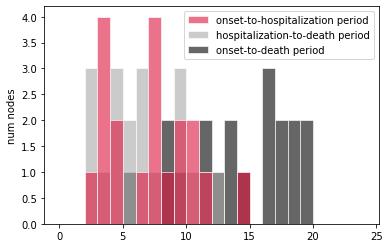

Individual R0:  mean = 0.98, std = 0.20, 95% CI = (0.71, 1.36)



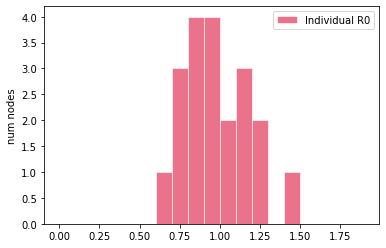

[INTERVENTIONS @ t = 0.40 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.26 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

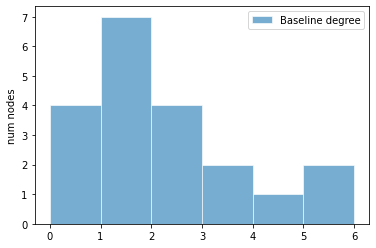

latent period:  mean = 4.10, std = 2.13, 95% CI = (0.92, 7.76)

pre-symptomatic period:  mean = 2.80, std = 1.40, 95% CI = (0.69, 5.56)

total incubation period:  mean = 6.90, std = 2.58, 95% CI = (2.84, 11.66)



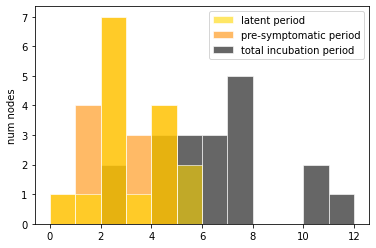

pre-symptomatic period:  mean = 4.10, std = 2.13, 95% CI = (0.92, 7.76)

(a)symptomatic period:  mean = 6.43, std = 2.41, 95% CI = (2.51, 11.31)

total infectious period:  mean = 10.53, std = 3.80, 95% CI = (3.42, 18.76)



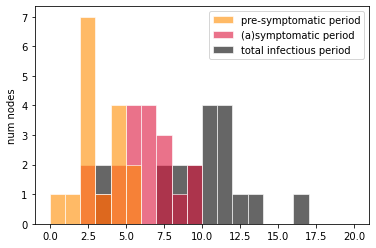

onset-to-hospitalization period:  mean = 8.23, std = 3.36, 95% CI = (3.03, 12.49)

hospitalization-to-discharge period:  mean = 15.36, std = 7.00, 95% CI = (5.22, 28.74)

onset-to-discharge period:  mean = 23.59, std = 8.47, 95% CI = (9.28, 38.83)



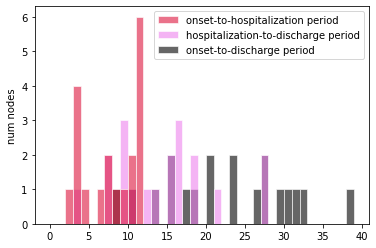

onset-to-hospitalization period:  mean = 8.23, std = 3.36, 95% CI = (3.03, 12.49)

hospitalization-to-death period:  mean = 7.08, std = 2.62, 95% CI = (2.53, 12.25)

onset-to-death period:  mean = 15.31, std = 4.68, 95% CI = (9.25, 23.00)



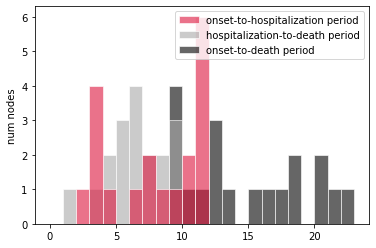

Individual R0:  mean = 1.07, std = 0.24, 95% CI = (0.73, 1.47)



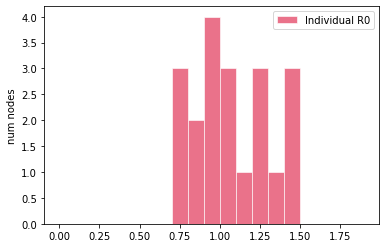

[INTERVENTIONS @ t = 0.00 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 0 positive (0.00 %) +]
	20	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.59 (2 (10.00%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 1 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTER

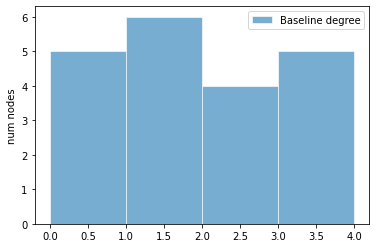

latent period:  mean = 3.47, std = 2.74, 95% CI = (0.48, 10.41)

pre-symptomatic period:  mean = 2.52, std = 1.60, 95% CI = (0.78, 6.47)

total incubation period:  mean = 5.99, std = 3.06, 95% CI = (2.23, 12.53)



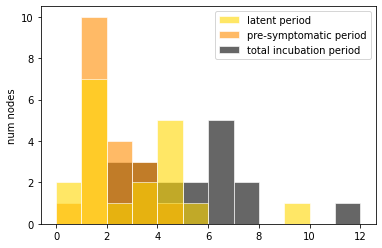

pre-symptomatic period:  mean = 3.47, std = 2.74, 95% CI = (0.48, 10.41)

(a)symptomatic period:  mean = 7.10, std = 2.36, 95% CI = (3.71, 10.72)

total infectious period:  mean = 10.56, std = 3.64, 95% CI = (5.93, 18.43)



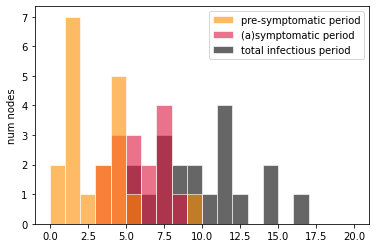

onset-to-hospitalization period:  mean = 7.73, std = 3.27, 95% CI = (2.05, 13.72)

hospitalization-to-discharge period:  mean = 14.59, std = 7.99, 95% CI = (5.80, 32.35)

onset-to-discharge period:  mean = 22.32, std = 8.76, 95% CI = (8.51, 41.01)



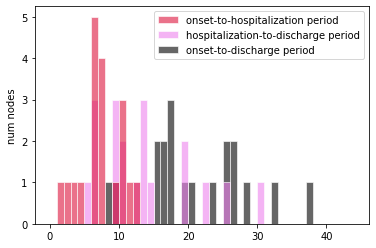

onset-to-hospitalization period:  mean = 7.73, std = 3.27, 95% CI = (2.05, 13.72)

hospitalization-to-death period:  mean = 8.66, std = 4.84, 95% CI = (1.80, 18.41)

onset-to-death period:  mean = 16.39, std = 5.68, 95% CI = (6.82, 27.81)



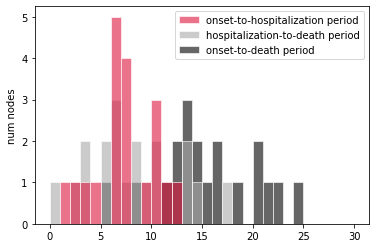

Individual R0:  mean = 1.01, std = 0.19, 95% CI = (0.69, 1.36)



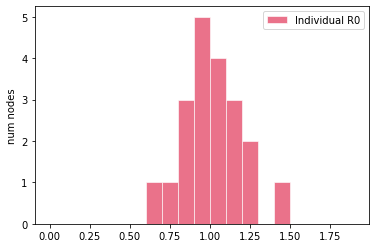

[INTERVENTIONS @ t = 0.31 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 0 positive (0.00 %) +]
	20	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.93 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENT

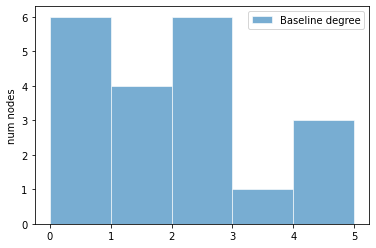

latent period:  mean = 2.90, std = 1.85, 95% CI = (0.60, 6.72)

pre-symptomatic period:  mean = 2.92, std = 1.31, 95% CI = (1.14, 5.22)

total incubation period:  mean = 5.83, std = 1.85, 95% CI = (3.12, 9.64)



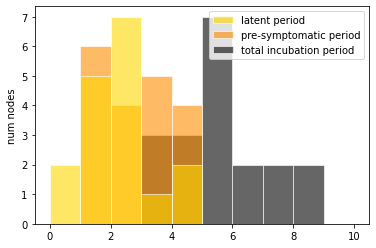

pre-symptomatic period:  mean = 2.90, std = 1.85, 95% CI = (0.60, 6.72)

(a)symptomatic period:  mean = 5.92, std = 2.49, 95% CI = (1.45, 10.34)

total infectious period:  mean = 8.83, std = 3.20, 95% CI = (3.36, 14.69)



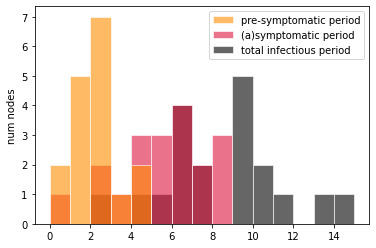

onset-to-hospitalization period:  mean = 7.05, std = 3.96, 95% CI = (2.18, 15.89)

hospitalization-to-discharge period:  mean = 16.14, std = 6.68, 95% CI = (5.79, 26.98)

onset-to-discharge period:  mean = 23.19, std = 8.69, 95% CI = (9.21, 39.26)



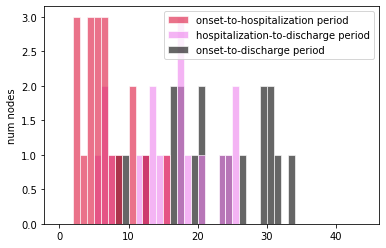

onset-to-hospitalization period:  mean = 7.05, std = 3.96, 95% CI = (2.18, 15.89)

hospitalization-to-death period:  mean = 6.63, std = 2.78, 95% CI = (3.37, 12.22)

onset-to-death period:  mean = 13.68, std = 5.29, 95% CI = (6.41, 23.63)



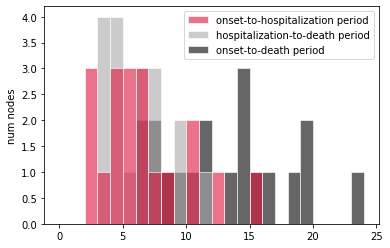

Individual R0:  mean = 0.96, std = 0.19, 95% CI = (0.67, 1.25)



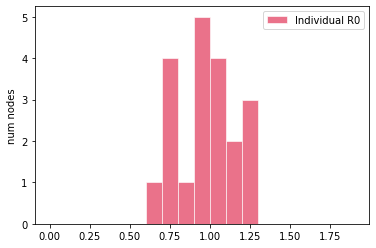

[INTERVENTIONS @ t = 0.11 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 0 positive (0.00 %) +]
	20	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.21 (3 (15.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENT

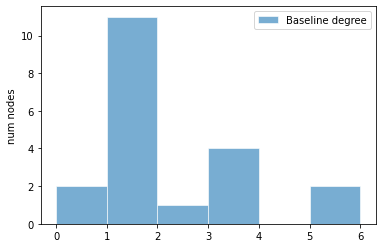

latent period:  mean = 3.29, std = 1.56, 95% CI = (0.75, 5.80)

pre-symptomatic period:  mean = 2.17, std = 1.06, 95% CI = (0.82, 4.62)

total incubation period:  mean = 5.47, std = 2.15, 95% CI = (2.25, 9.21)



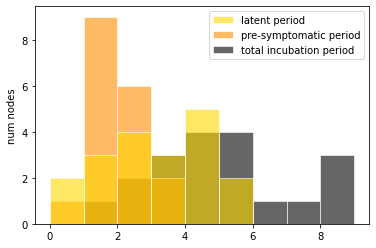

pre-symptomatic period:  mean = 3.29, std = 1.56, 95% CI = (0.75, 5.80)

(a)symptomatic period:  mean = 7.66, std = 2.33, 95% CI = (4.23, 11.43)

total infectious period:  mean = 10.96, std = 2.74, 95% CI = (5.66, 14.81)



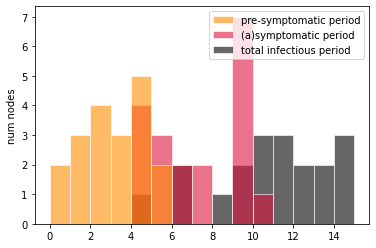

onset-to-hospitalization period:  mean = 9.94, std = 2.89, 95% CI = (5.30, 14.97)

hospitalization-to-discharge period:  mean = 15.80, std = 5.21, 95% CI = (5.93, 23.35)

onset-to-discharge period:  mean = 25.74, std = 5.61, 95% CI = (13.99, 33.44)



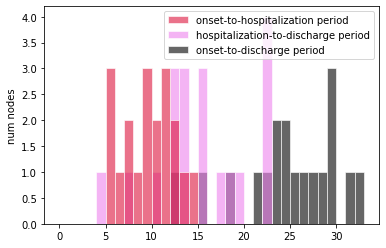

onset-to-hospitalization period:  mean = 9.94, std = 2.89, 95% CI = (5.30, 14.97)

hospitalization-to-death period:  mean = 7.61, std = 3.60, 95% CI = (3.01, 15.00)

onset-to-death period:  mean = 17.54, std = 4.60, 95% CI = (9.65, 26.40)



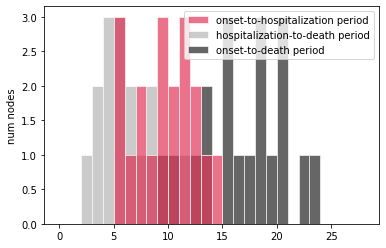

Individual R0:  mean = 1.03, std = 0.17, 95% CI = (0.75, 1.30)



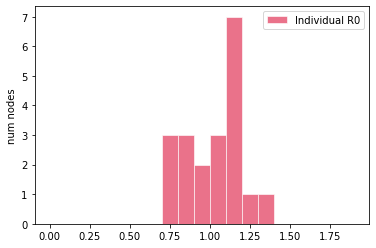

[INTERVENTIONS @ t = 0.43 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.43 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

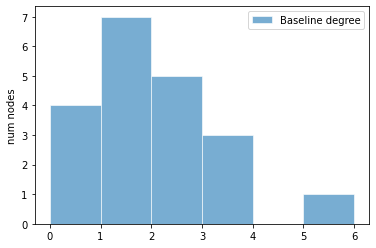

latent period:  mean = 3.81, std = 1.43, 95% CI = (1.11, 6.22)

pre-symptomatic period:  mean = 2.02, std = 1.17, 95% CI = (0.66, 4.25)

total incubation period:  mean = 5.83, std = 1.35, 95% CI = (3.53, 8.33)



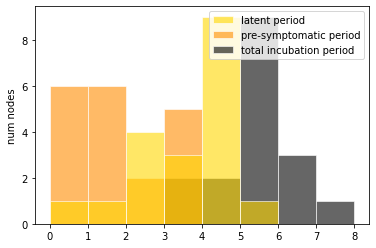

pre-symptomatic period:  mean = 3.81, std = 1.43, 95% CI = (1.11, 6.22)

(a)symptomatic period:  mean = 6.70, std = 2.69, 95% CI = (2.64, 11.74)

total infectious period:  mean = 10.51, std = 2.62, 95% CI = (6.60, 15.13)



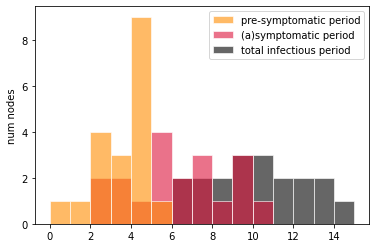

onset-to-hospitalization period:  mean = 8.71, std = 4.32, 95% CI = (3.65, 18.08)

hospitalization-to-discharge period:  mean = 12.26, std = 6.25, 95% CI = (4.46, 26.60)

onset-to-discharge period:  mean = 20.97, std = 6.94, 95% CI = (13.44, 34.89)



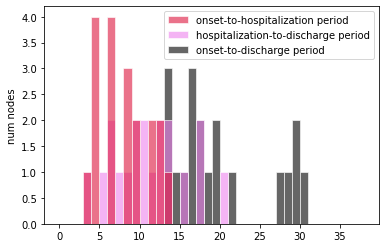

onset-to-hospitalization period:  mean = 8.71, std = 4.32, 95% CI = (3.65, 18.08)

hospitalization-to-death period:  mean = 6.33, std = 2.72, 95% CI = (3.00, 11.38)

onset-to-death period:  mean = 15.04, std = 5.34, 95% CI = (8.24, 26.75)



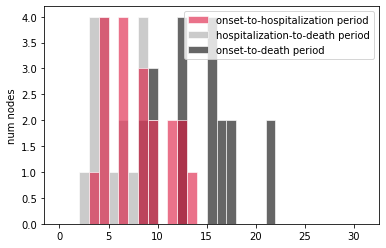

Individual R0:  mean = 1.08, std = 0.27, 95% CI = (0.57, 1.51)



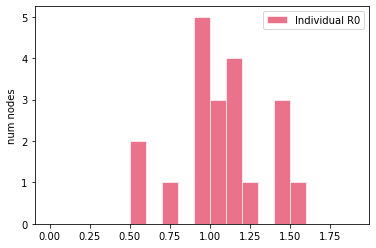

[INTERVENTIONS @ t = 0.07 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 1 positive (5.00 %) +]
	20	tested TOTAL            [+ 1 positive (5.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.15 (4 (20.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

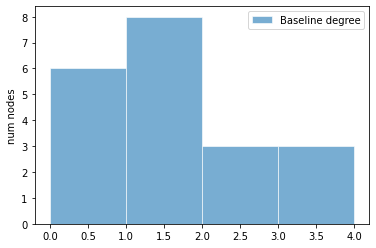

latent period:  mean = 3.68, std = 1.65, 95% CI = (1.05, 6.75)

pre-symptomatic period:  mean = 2.55, std = 0.98, 95% CI = (1.32, 4.87)

total incubation period:  mean = 6.23, std = 1.57, 95% CI = (3.53, 8.91)



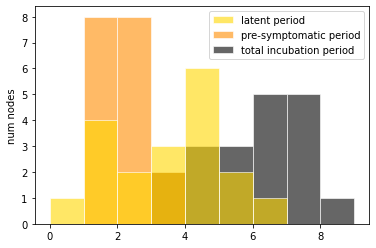

pre-symptomatic period:  mean = 3.68, std = 1.65, 95% CI = (1.05, 6.75)

(a)symptomatic period:  mean = 6.68, std = 2.42, 95% CI = (3.43, 11.83)

total infectious period:  mean = 10.36, std = 3.00, 95% CI = (6.44, 16.64)



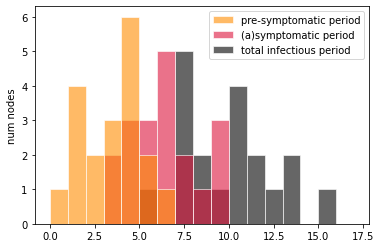

onset-to-hospitalization period:  mean = 7.72, std = 2.54, 95% CI = (4.09, 12.08)

hospitalization-to-discharge period:  mean = 11.57, std = 4.23, 95% CI = (5.26, 19.13)

onset-to-discharge period:  mean = 19.28, std = 4.38, 95% CI = (13.37, 26.56)



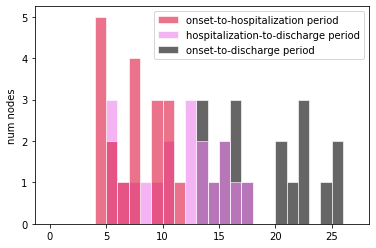

onset-to-hospitalization period:  mean = 7.72, std = 2.54, 95% CI = (4.09, 12.08)

hospitalization-to-death period:  mean = 7.02, std = 3.29, 95% CI = (2.53, 13.18)

onset-to-death period:  mean = 14.74, std = 4.21, 95% CI = (8.35, 24.39)



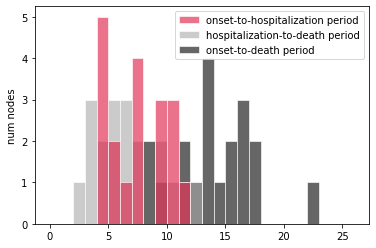

Individual R0:  mean = 1.02, std = 0.22, 95% CI = (0.72, 1.37)



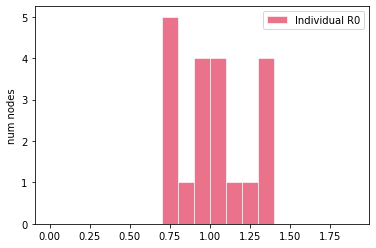

[INTERVENTIONS @ t = 1.07 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 3.41 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIO

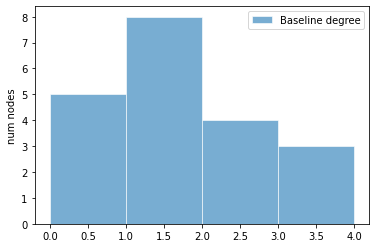

latent period:  mean = 3.79, std = 2.82, 95% CI = (1.12, 11.02)

pre-symptomatic period:  mean = 2.75, std = 1.95, 95% CI = (0.36, 6.59)

total incubation period:  mean = 6.54, std = 3.09, 95% CI = (3.61, 13.77)



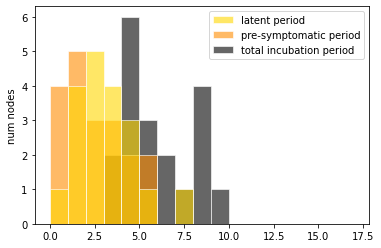

pre-symptomatic period:  mean = 3.79, std = 2.82, 95% CI = (1.12, 11.02)

(a)symptomatic period:  mean = 6.78, std = 2.39, 95% CI = (2.94, 11.80)

total infectious period:  mean = 10.57, std = 3.19, 95% CI = (6.14, 17.27)



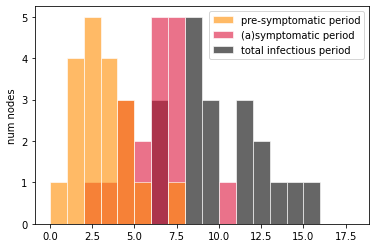

onset-to-hospitalization period:  mean = 7.28, std = 3.38, 95% CI = (2.81, 13.70)

hospitalization-to-discharge period:  mean = 15.75, std = 6.62, 95% CI = (5.19, 26.82)

onset-to-discharge period:  mean = 23.03, std = 6.02, 95% CI = (13.22, 33.18)



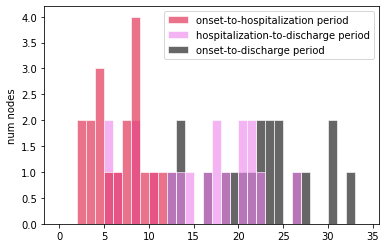

onset-to-hospitalization period:  mean = 7.28, std = 3.38, 95% CI = (2.81, 13.70)

hospitalization-to-death period:  mean = 6.58, std = 2.50, 95% CI = (3.64, 11.85)

onset-to-death period:  mean = 13.86, std = 4.04, 95% CI = (7.52, 20.44)



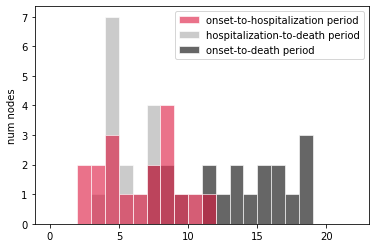

Individual R0:  mean = 0.97, std = 0.19, 95% CI = (0.72, 1.35)



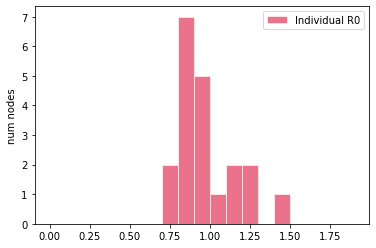

[INTERVENTIONS @ t = 0.95 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	20	tested randomly         [+ 0 positive (0.00 %) +]
	20	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.73 (3 (15.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENT

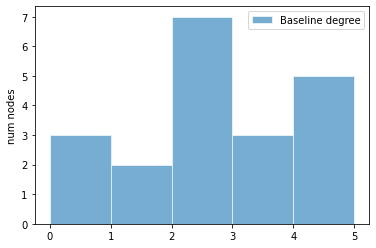

latent period:  mean = 3.35, std = 1.85, 95% CI = (1.31, 7.33)

pre-symptomatic period:  mean = 2.70, std = 1.63, 95% CI = (0.71, 6.06)

total incubation period:  mean = 6.05, std = 2.10, 95% CI = (2.25, 9.57)



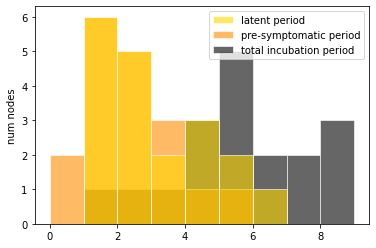

pre-symptomatic period:  mean = 3.35, std = 1.85, 95% CI = (1.31, 7.33)

(a)symptomatic period:  mean = 6.05, std = 2.18, 95% CI = (2.73, 9.80)

total infectious period:  mean = 9.40, std = 2.90, 95% CI = (5.00, 13.73)



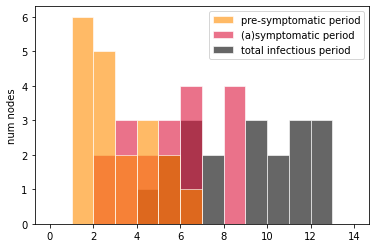

onset-to-hospitalization period:  mean = 8.70, std = 3.89, 95% CI = (4.24, 17.57)

hospitalization-to-discharge period:  mean = 11.85, std = 5.02, 95% CI = (5.89, 22.21)

onset-to-discharge period:  mean = 20.55, std = 5.84, 95% CI = (12.74, 32.39)



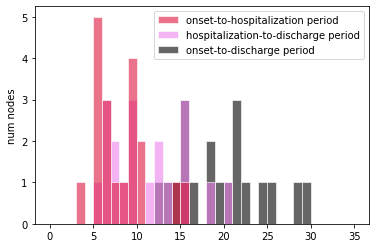

onset-to-hospitalization period:  mean = 8.70, std = 3.89, 95% CI = (4.24, 17.57)

hospitalization-to-death period:  mean = 7.48, std = 3.76, 95% CI = (2.81, 15.93)

onset-to-death period:  mean = 16.19, std = 5.33, 95% CI = (9.92, 26.84)



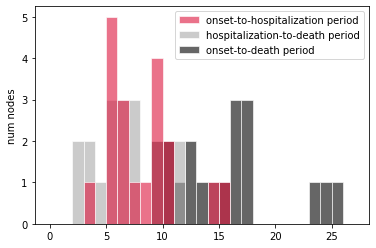

Individual R0:  mean = 0.96, std = 0.21, 95% CI = (0.65, 1.35)



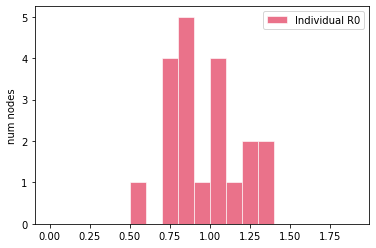

[INTERVENTIONS @ t = 1.85 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.18 (2 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIO

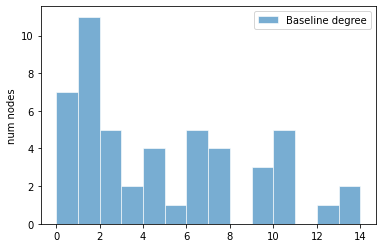

latent period:  mean = 3.37, std = 2.08, 95% CI = (0.65, 8.12)

pre-symptomatic period:  mean = 2.55, std = 1.73, 95% CI = (0.31, 6.12)

total incubation period:  mean = 5.92, std = 3.09, 95% CI = (1.49, 12.76)



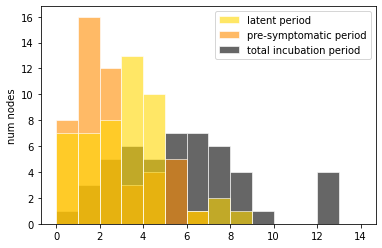

pre-symptomatic period:  mean = 3.37, std = 2.08, 95% CI = (0.65, 8.12)

(a)symptomatic period:  mean = 6.59, std = 2.64, 95% CI = (2.37, 11.99)

total infectious period:  mean = 9.96, std = 3.09, 95% CI = (5.45, 15.90)



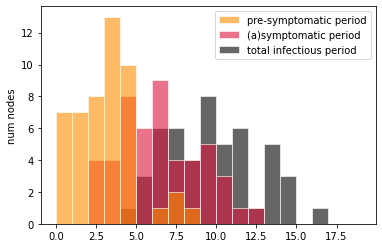

onset-to-hospitalization period:  mean = 7.19, std = 3.17, 95% CI = (2.48, 13.63)

hospitalization-to-discharge period:  mean = 13.64, std = 4.98, 95% CI = (6.77, 24.27)

onset-to-discharge period:  mean = 20.82, std = 6.32, 95% CI = (10.36, 34.87)



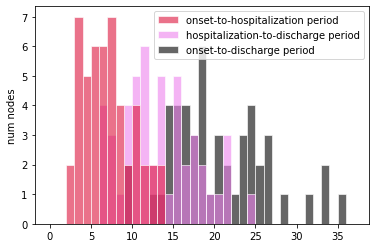

onset-to-hospitalization period:  mean = 7.19, std = 3.17, 95% CI = (2.48, 13.63)

hospitalization-to-death period:  mean = 7.19, std = 4.01, 95% CI = (2.97, 19.07)

onset-to-death period:  mean = 14.37, std = 5.08, 95% CI = (6.70, 23.97)



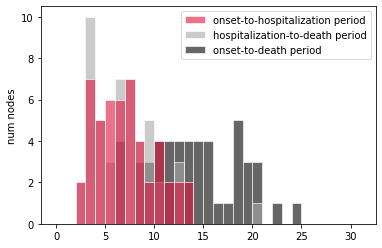

Individual R0:  mean = 1.01, std = 0.21, 95% CI = (0.65, 1.41)



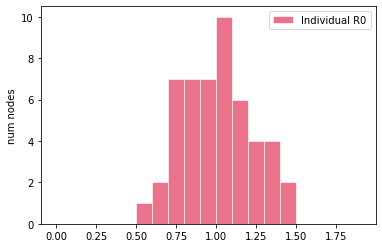

[INTERVENTIONS @ t = 0.02 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.23 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 1 positive (2.04 %) +]
	49	tested TOTAL            [+ 1 positive (2.04 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

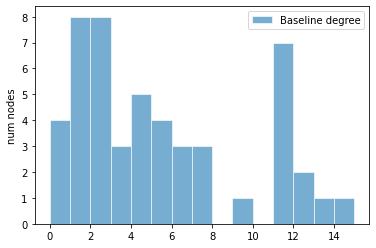

latent period:  mean = 3.17, std = 1.93, 95% CI = (0.82, 7.28)

pre-symptomatic period:  mean = 2.53, std = 1.38, 95% CI = (0.63, 5.59)

total incubation period:  mean = 5.71, std = 2.07, 95% CI = (2.04, 9.43)



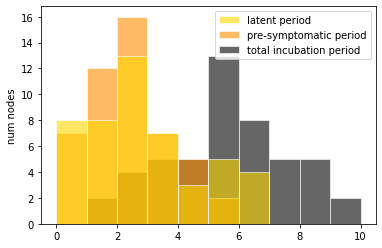

pre-symptomatic period:  mean = 3.17, std = 1.93, 95% CI = (0.82, 7.28)

(a)symptomatic period:  mean = 6.10, std = 2.44, 95% CI = (3.38, 13.16)

total infectious period:  mean = 9.27, std = 3.71, 95% CI = (5.14, 18.91)



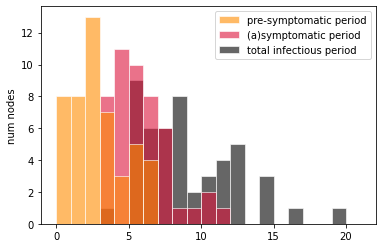

onset-to-hospitalization period:  mean = 8.93, std = 4.21, 95% CI = (2.89, 19.73)

hospitalization-to-discharge period:  mean = 14.16, std = 5.70, 95% CI = (5.08, 23.80)

onset-to-discharge period:  mean = 23.09, std = 7.13, 95% CI = (10.08, 33.11)



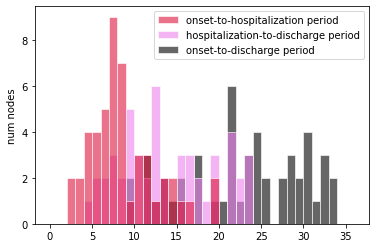

onset-to-hospitalization period:  mean = 8.93, std = 4.21, 95% CI = (2.89, 19.73)

hospitalization-to-death period:  mean = 6.85, std = 3.03, 95% CI = (2.75, 13.36)

onset-to-death period:  mean = 15.78, std = 5.08, 95% CI = (8.39, 25.75)



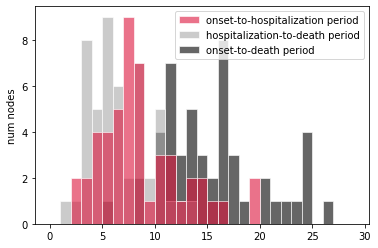

Individual R0:  mean = 1.03, std = 0.18, 95% CI = (0.73, 1.36)



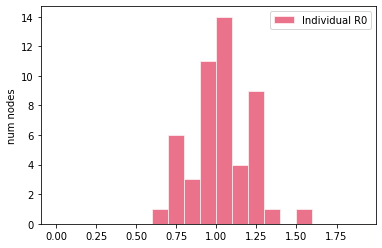

[INTERVENTIONS @ t = 0.37 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[NEW EXPOSURE @ t = 1.52 (1 exposed)]
[INTERVENTIONS @ t = 1.52 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 0 positive (0.00 %) +]
	49	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of 

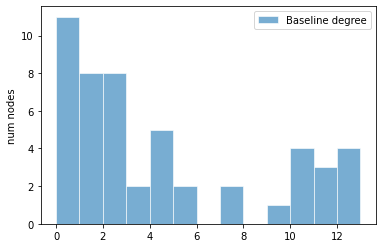

latent period:  mean = 3.99, std = 2.64, 95% CI = (0.97, 9.97)

pre-symptomatic period:  mean = 2.40, std = 1.57, 95% CI = (0.37, 6.32)

total incubation period:  mean = 6.40, std = 3.24, 95% CI = (1.69, 13.80)



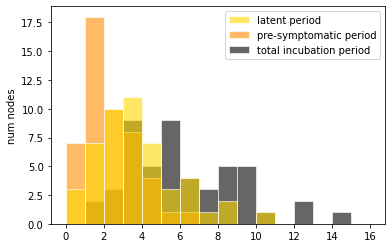

pre-symptomatic period:  mean = 3.99, std = 2.64, 95% CI = (0.97, 9.97)

(a)symptomatic period:  mean = 5.78, std = 2.59, 95% CI = (2.52, 12.20)

total infectious period:  mean = 9.77, std = 3.76, 95% CI = (3.84, 15.89)



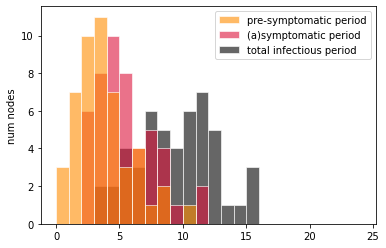

onset-to-hospitalization period:  mean = 6.72, std = 3.03, 95% CI = (2.78, 12.35)

hospitalization-to-discharge period:  mean = 15.44, std = 6.67, 95% CI = (3.97, 28.11)

onset-to-discharge period:  mean = 22.16, std = 6.67, 95% CI = (11.02, 35.12)



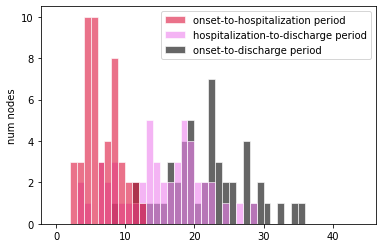

onset-to-hospitalization period:  mean = 6.72, std = 3.03, 95% CI = (2.78, 12.35)

hospitalization-to-death period:  mean = 7.94, std = 3.23, 95% CI = (2.64, 13.74)

onset-to-death period:  mean = 14.66, std = 4.94, 95% CI = (6.91, 23.24)



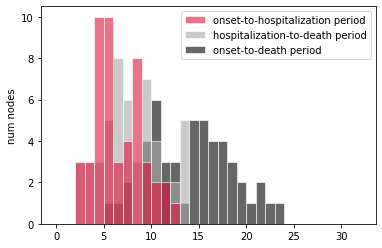

Individual R0:  mean = 1.06, std = 0.20, 95% CI = (0.70, 1.46)



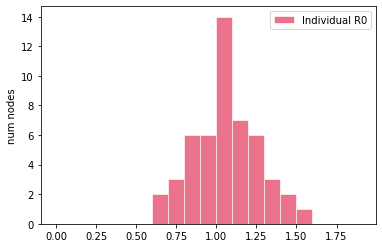

[INTERVENTIONS @ t = 0.21 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 0 positive (0.00 %) +]
	50	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.65 (6 (12.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 3 positive (6.00 %) +]
	50	tested TOTAL            [+ 3 positive (6.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	3 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVE

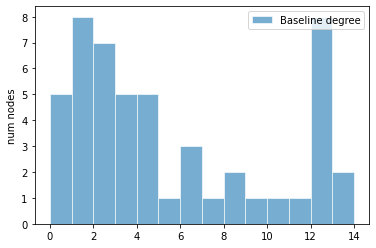

latent period:  mean = 3.27, std = 1.75, 95% CI = (0.63, 6.23)

pre-symptomatic period:  mean = 2.37, std = 1.62, 95% CI = (0.33, 5.29)

total incubation period:  mean = 5.65, std = 2.08, 95% CI = (2.03, 10.01)



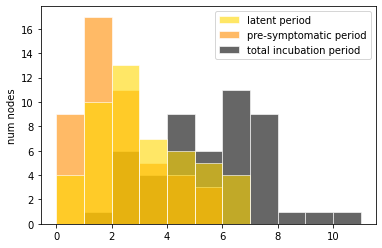

pre-symptomatic period:  mean = 3.27, std = 1.75, 95% CI = (0.63, 6.23)

(a)symptomatic period:  mean = 6.22, std = 2.82, 95% CI = (1.86, 12.54)

total infectious period:  mean = 9.49, std = 3.19, 95% CI = (4.97, 15.69)



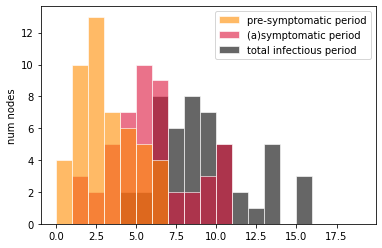

onset-to-hospitalization period:  mean = 7.11, std = 3.69, 95% CI = (2.44, 17.40)

hospitalization-to-discharge period:  mean = 13.97, std = 6.96, 95% CI = (4.29, 30.83)

onset-to-discharge period:  mean = 21.09, std = 8.04, 95% CI = (9.30, 37.43)



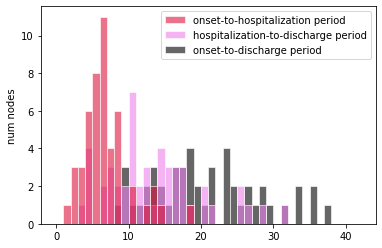

onset-to-hospitalization period:  mean = 7.11, std = 3.69, 95% CI = (2.44, 17.40)

hospitalization-to-death period:  mean = 7.28, std = 2.79, 95% CI = (3.36, 11.52)

onset-to-death period:  mean = 14.39, std = 3.98, 95% CI = (8.55, 21.11)



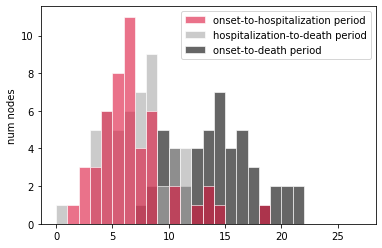

Individual R0:  mean = 1.00, std = 0.21, 95% CI = (0.71, 1.45)



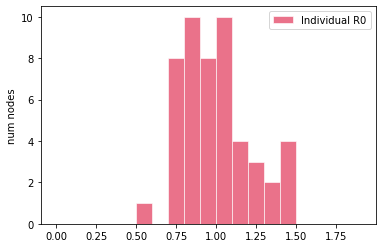

[INTERVENTIONS @ t = 0.32 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.84 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 0 positive (0.00 %) +]
	49	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

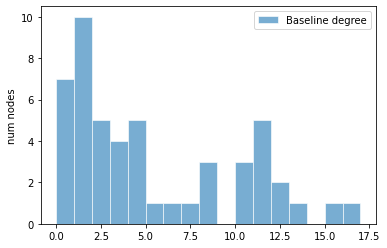

latent period:  mean = 3.22, std = 2.06, 95% CI = (0.57, 8.41)

pre-symptomatic period:  mean = 2.29, std = 1.42, 95% CI = (0.41, 5.70)

total incubation period:  mean = 5.51, std = 2.69, 95% CI = (1.84, 12.00)



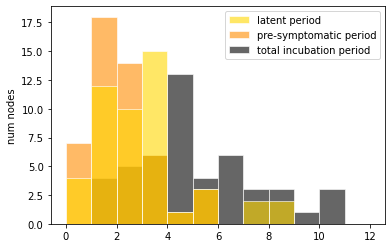

pre-symptomatic period:  mean = 3.22, std = 2.06, 95% CI = (0.57, 8.41)

(a)symptomatic period:  mean = 6.22, std = 1.99, 95% CI = (2.39, 9.18)

total infectious period:  mean = 9.44, std = 2.73, 95% CI = (4.98, 14.41)



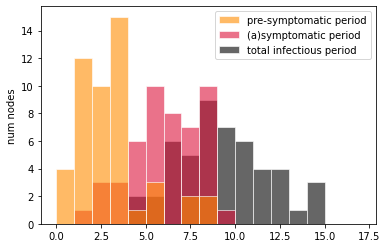

onset-to-hospitalization period:  mean = 7.84, std = 4.06, 95% CI = (2.49, 17.14)

hospitalization-to-discharge period:  mean = 14.76, std = 6.61, 95% CI = (4.83, 27.34)

onset-to-discharge period:  mean = 22.59, std = 7.51, 95% CI = (10.37, 36.93)



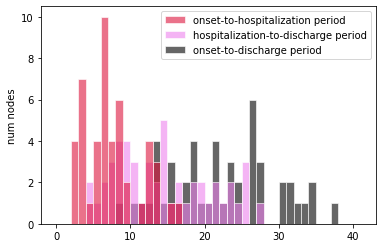

onset-to-hospitalization period:  mean = 7.84, std = 4.06, 95% CI = (2.49, 17.14)

hospitalization-to-death period:  mean = 6.86, std = 3.05, 95% CI = (1.99, 12.98)

onset-to-death period:  mean = 14.69, std = 4.69, 95% CI = (7.27, 24.43)



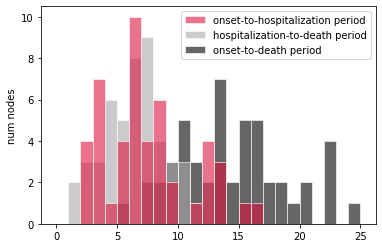

Individual R0:  mean = 1.01, std = 0.22, 95% CI = (0.63, 1.47)



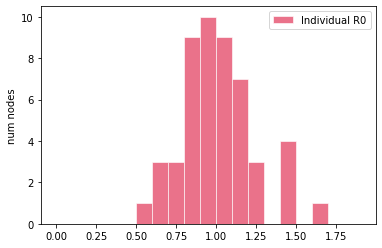

[INTERVENTIONS @ t = 0.09 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.21 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 1 positive (2.04 %) +]
	49	tested TOTAL            [+ 1 positive (2.04 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

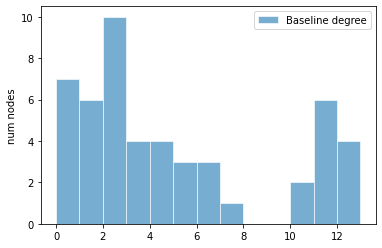

latent period:  mean = 3.70, std = 1.96, 95% CI = (0.85, 8.64)

pre-symptomatic period:  mean = 2.74, std = 1.45, 95% CI = (0.72, 6.19)

total incubation period:  mean = 6.44, std = 2.49, 95% CI = (2.94, 12.67)



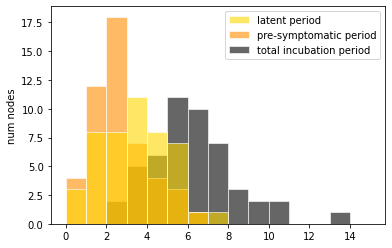

pre-symptomatic period:  mean = 3.70, std = 1.96, 95% CI = (0.85, 8.64)

(a)symptomatic period:  mean = 6.43, std = 2.98, 95% CI = (2.92, 12.27)

total infectious period:  mean = 10.13, std = 3.74, 95% CI = (4.21, 18.14)



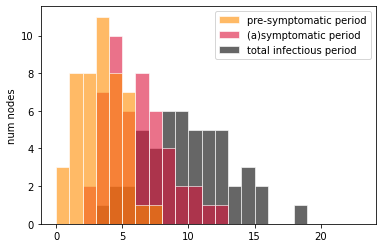

onset-to-hospitalization period:  mean = 8.30, std = 3.81, 95% CI = (2.57, 15.87)

hospitalization-to-discharge period:  mean = 13.80, std = 6.21, 95% CI = (4.47, 26.19)

onset-to-discharge period:  mean = 22.10, std = 6.69, 95% CI = (10.68, 32.77)



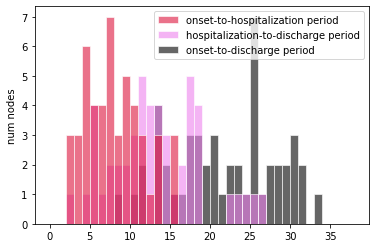

onset-to-hospitalization period:  mean = 8.30, std = 3.81, 95% CI = (2.57, 15.87)

hospitalization-to-death period:  mean = 7.53, std = 3.31, 95% CI = (3.28, 15.23)

onset-to-death period:  mean = 15.83, std = 5.26, 95% CI = (8.79, 27.08)



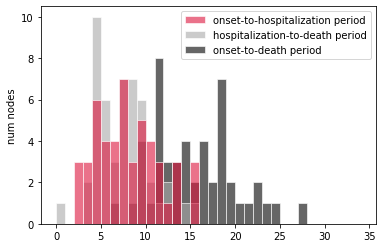

Individual R0:  mean = 0.97, std = 0.23, 95% CI = (0.58, 1.53)



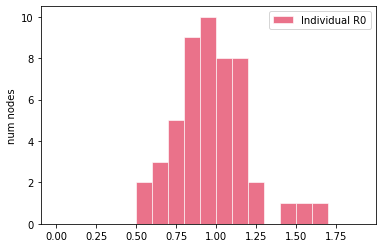

[INTERVENTIONS @ t = 0.36 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.50 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 1 positive (2.04 %) +]
	49	tested TOTAL            [+ 1 positive (2.04 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

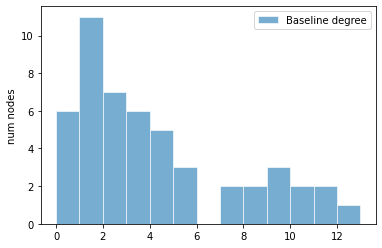

latent period:  mean = 3.52, std = 1.88, 95% CI = (0.70, 8.07)

pre-symptomatic period:  mean = 2.70, std = 1.66, 95% CI = (0.51, 6.52)

total incubation period:  mean = 6.22, std = 2.32, 95% CI = (2.14, 9.99)



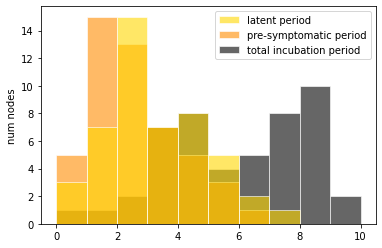

pre-symptomatic period:  mean = 3.52, std = 1.88, 95% CI = (0.70, 8.07)

(a)symptomatic period:  mean = 6.41, std = 2.93, 95% CI = (2.29, 11.92)

total infectious period:  mean = 9.92, std = 3.69, 95% CI = (4.06, 17.67)



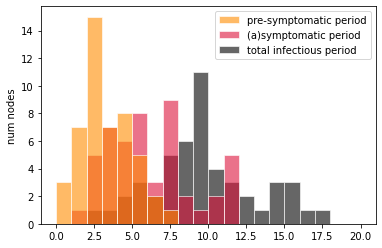

onset-to-hospitalization period:  mean = 7.66, std = 3.11, 95% CI = (2.20, 13.98)

hospitalization-to-discharge period:  mean = 14.03, std = 5.90, 95% CI = (5.02, 29.71)

onset-to-discharge period:  mean = 21.70, std = 6.95, 95% CI = (10.73, 38.79)



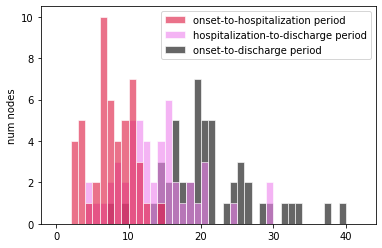

onset-to-hospitalization period:  mean = 7.66, std = 3.11, 95% CI = (2.20, 13.98)

hospitalization-to-death period:  mean = 6.48, std = 2.53, 95% CI = (3.13, 13.08)

onset-to-death period:  mean = 14.14, std = 3.96, 95% CI = (7.07, 20.81)



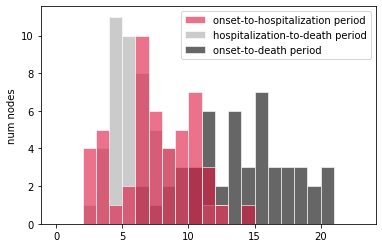

Individual R0:  mean = 1.00, std = 0.17, 95% CI = (0.70, 1.33)



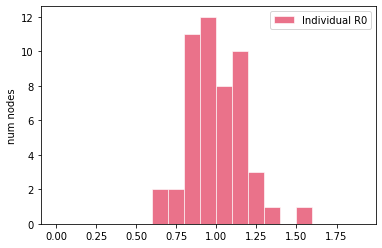

[INTERVENTIONS @ t = 0.41 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.31 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 0 positive (0.00 %) +]
	49	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

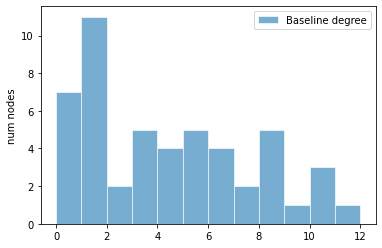

latent period:  mean = 3.43, std = 2.16, 95% CI = (0.92, 9.10)

pre-symptomatic period:  mean = 2.23, std = 1.37, 95% CI = (0.28, 4.92)

total incubation period:  mean = 5.66, std = 2.66, 95% CI = (2.23, 11.26)



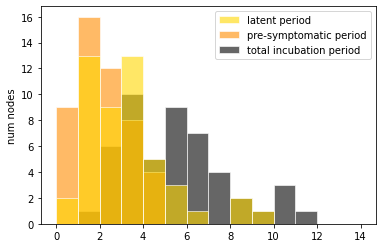

pre-symptomatic period:  mean = 3.43, std = 2.16, 95% CI = (0.92, 9.10)

(a)symptomatic period:  mean = 6.75, std = 3.11, 95% CI = (2.49, 13.95)

total infectious period:  mean = 10.18, std = 4.25, 95% CI = (5.76, 21.10)



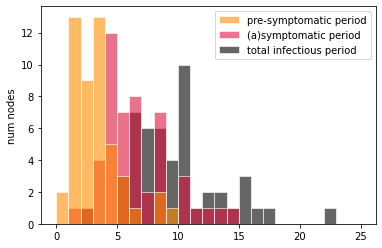

onset-to-hospitalization period:  mean = 8.18, std = 4.27, 95% CI = (1.90, 18.82)

hospitalization-to-discharge period:  mean = 13.58, std = 6.81, 95% CI = (5.35, 26.67)

onset-to-discharge period:  mean = 21.76, std = 8.46, 95% CI = (9.68, 42.06)



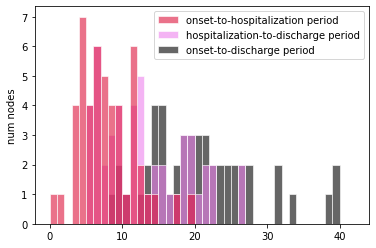

onset-to-hospitalization period:  mean = 8.18, std = 4.27, 95% CI = (1.90, 18.82)

hospitalization-to-death period:  mean = 6.68, std = 2.59, 95% CI = (2.93, 11.82)

onset-to-death period:  mean = 14.86, std = 4.58, 95% CI = (6.61, 24.91)



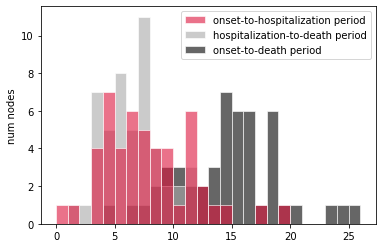

Individual R0:  mean = 1.02, std = 0.18, 95% CI = (0.68, 1.37)



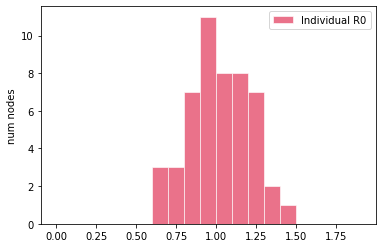

[INTERVENTIONS @ t = 0.12 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.08 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 2 positive (4.08 %) +]
	49	tested TOTAL            [+ 2 positive (4.08 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	2 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[NEW EXP

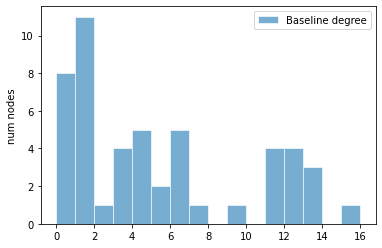

latent period:  mean = 3.21, std = 1.71, 95% CI = (0.79, 6.95)

pre-symptomatic period:  mean = 2.54, std = 1.72, 95% CI = (0.59, 7.26)

total incubation period:  mean = 5.75, std = 2.14, 95% CI = (1.79, 9.54)



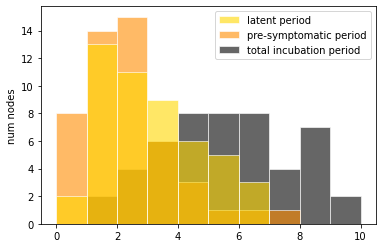

pre-symptomatic period:  mean = 3.21, std = 1.71, 95% CI = (0.79, 6.95)

(a)symptomatic period:  mean = 6.58, std = 2.37, 95% CI = (3.55, 12.30)

total infectious period:  mean = 9.78, std = 2.94, 95% CI = (4.97, 15.25)



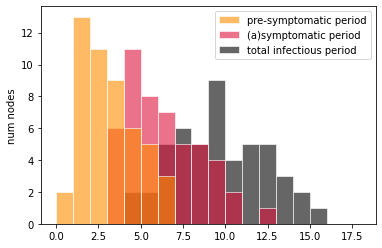

onset-to-hospitalization period:  mean = 7.81, std = 3.36, 95% CI = (2.42, 15.40)

hospitalization-to-discharge period:  mean = 14.46, std = 5.99, 95% CI = (5.08, 25.98)

onset-to-discharge period:  mean = 22.27, std = 6.77, 95% CI = (11.47, 34.20)



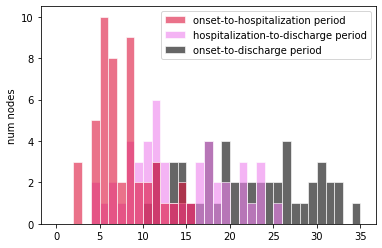

onset-to-hospitalization period:  mean = 7.81, std = 3.36, 95% CI = (2.42, 15.40)

hospitalization-to-death period:  mean = 6.94, std = 3.14, 95% CI = (2.47, 14.70)

onset-to-death period:  mean = 14.75, std = 4.92, 95% CI = (5.35, 25.30)



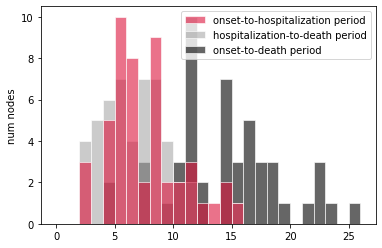

Individual R0:  mean = 0.97, std = 0.21, 95% CI = (0.67, 1.48)



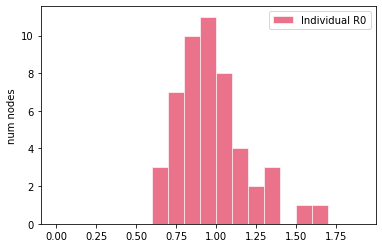

[INTERVENTIONS @ t = 0.00 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.27 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 2 positive (4.08 %) +]
	49	tested TOTAL            [+ 2 positive (4.08 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	2 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

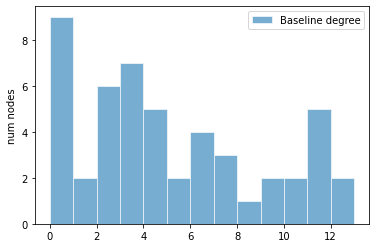

latent period:  mean = 3.44, std = 2.39, 95% CI = (0.57, 8.90)

pre-symptomatic period:  mean = 2.75, std = 1.98, 95% CI = (0.29, 6.93)

total incubation period:  mean = 6.19, std = 3.31, 95% CI = (1.85, 15.13)



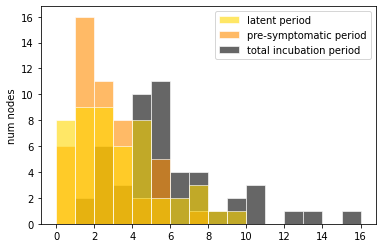

pre-symptomatic period:  mean = 3.44, std = 2.39, 95% CI = (0.57, 8.90)

(a)symptomatic period:  mean = 6.71, std = 2.72, 95% CI = (2.41, 13.80)

total infectious period:  mean = 10.16, std = 3.86, 95% CI = (4.63, 18.90)



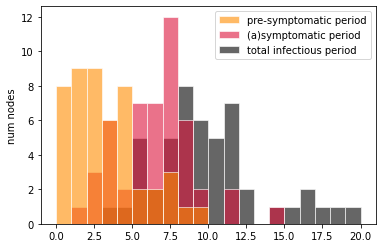

onset-to-hospitalization period:  mean = 7.86, std = 3.56, 95% CI = (2.26, 15.86)

hospitalization-to-discharge period:  mean = 12.87, std = 5.86, 95% CI = (4.40, 23.36)

onset-to-discharge period:  mean = 20.73, std = 7.01, 95% CI = (9.70, 35.59)



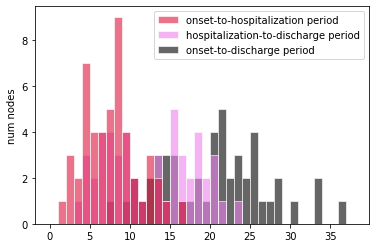

onset-to-hospitalization period:  mean = 7.86, std = 3.56, 95% CI = (2.26, 15.86)

hospitalization-to-death period:  mean = 6.61, std = 3.29, 95% CI = (2.47, 14.16)

onset-to-death period:  mean = 14.47, std = 4.89, 95% CI = (6.92, 24.83)



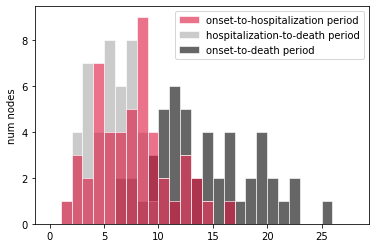

Individual R0:  mean = 1.02, std = 0.22, 95% CI = (0.63, 1.43)



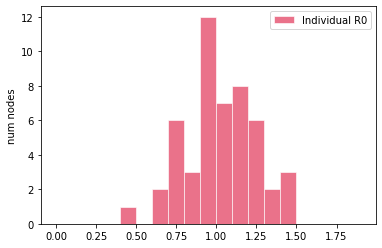

[INTERVENTIONS @ t = 0.71 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.56 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	49	tested randomly         [+ 1 positive (2.04 %) +]
	49	tested TOTAL            [+ 1 positive (2.04 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVE

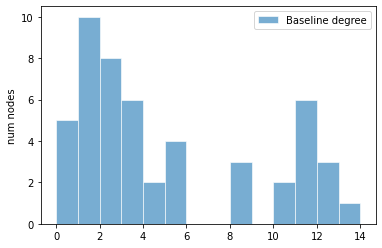

latent period:  mean = 3.78, std = 2.51, 95% CI = (1.15, 11.45)

pre-symptomatic period:  mean = 2.37, std = 1.45, 95% CI = (0.42, 5.35)

total incubation period:  mean = 6.15, std = 2.75, 95% CI = (2.58, 12.96)



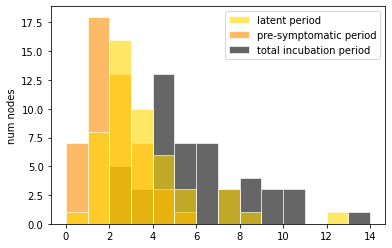

pre-symptomatic period:  mean = 3.78, std = 2.51, 95% CI = (1.15, 11.45)

(a)symptomatic period:  mean = 6.68, std = 2.79, 95% CI = (2.69, 11.96)

total infectious period:  mean = 10.46, std = 3.92, 95% CI = (4.86, 17.06)



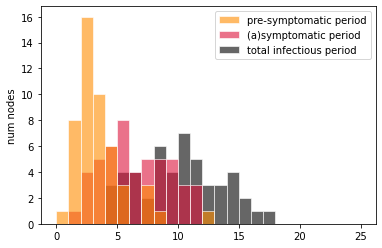

onset-to-hospitalization period:  mean = 8.54, std = 4.19, 95% CI = (2.62, 18.04)

hospitalization-to-discharge period:  mean = 13.62, std = 7.21, 95% CI = (5.51, 30.91)

onset-to-discharge period:  mean = 22.17, std = 8.34, 95% CI = (11.82, 41.13)



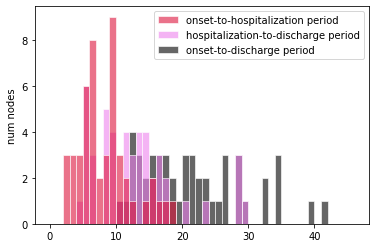

onset-to-hospitalization period:  mean = 8.54, std = 4.19, 95% CI = (2.62, 18.04)

hospitalization-to-death period:  mean = 6.84, std = 3.54, 95% CI = (2.15, 14.74)

onset-to-death period:  mean = 15.39, std = 5.56, 95% CI = (5.75, 27.69)



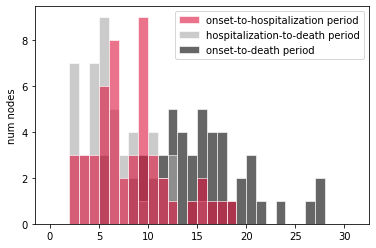

Individual R0:  mean = 1.02, std = 0.16, 95% CI = (0.76, 1.35)



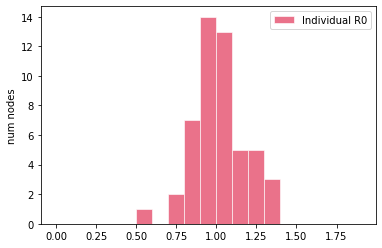

[INTERVENTIONS @ t = 0.35 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 0 positive (0.00 %) +]
	50	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.10 (7 (14.00%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 1 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTER

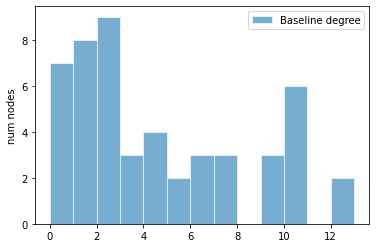

latent period:  mean = 3.20, std = 1.92, 95% CI = (0.63, 6.72)

pre-symptomatic period:  mean = 2.48, std = 1.61, 95% CI = (0.82, 6.37)

total incubation period:  mean = 5.68, std = 2.58, 95% CI = (2.11, 11.24)



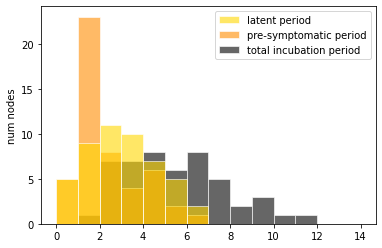

pre-symptomatic period:  mean = 3.20, std = 1.92, 95% CI = (0.63, 6.72)

(a)symptomatic period:  mean = 5.84, std = 2.18, 95% CI = (2.44, 10.78)

total infectious period:  mean = 9.04, std = 3.27, 95% CI = (4.20, 16.41)



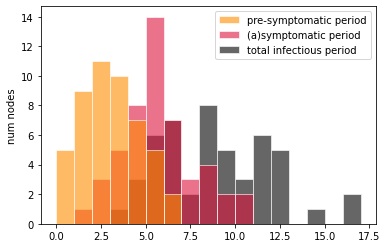

onset-to-hospitalization period:  mean = 8.58, std = 4.80, 95% CI = (2.30, 20.64)

hospitalization-to-discharge period:  mean = 14.04, std = 6.07, 95% CI = (5.46, 27.03)

onset-to-discharge period:  mean = 22.63, std = 8.42, 95% CI = (9.88, 41.34)



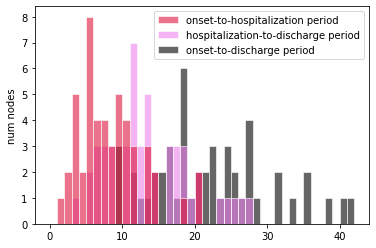

onset-to-hospitalization period:  mean = 8.58, std = 4.80, 95% CI = (2.30, 20.64)

hospitalization-to-death period:  mean = 7.58, std = 3.27, 95% CI = (2.75, 14.06)

onset-to-death period:  mean = 16.17, std = 5.74, 95% CI = (8.56, 30.69)



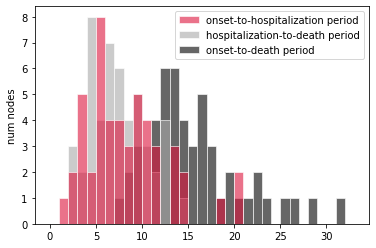

Individual R0:  mean = 0.98, std = 0.16, 95% CI = (0.73, 1.25)



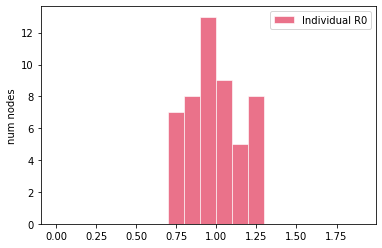

[INTERVENTIONS @ t = 0.06 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 0 positive (0.00 %) +]
	50	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 3.95 (4 (8.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTI

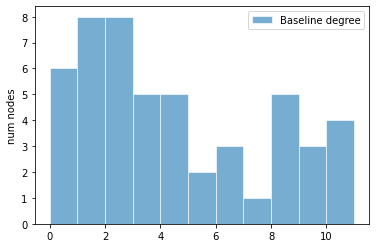

latent period:  mean = 3.30, std = 3.10, 95% CI = (0.64, 9.19)

pre-symptomatic period:  mean = 2.30, std = 1.14, 95% CI = (0.65, 5.05)

total incubation period:  mean = 5.60, std = 3.08, 95% CI = (2.07, 12.18)



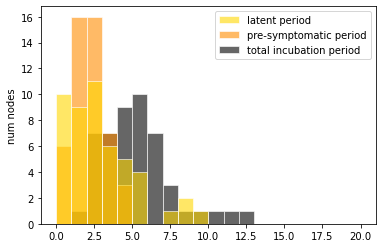

pre-symptomatic period:  mean = 3.30, std = 3.10, 95% CI = (0.64, 9.19)

(a)symptomatic period:  mean = 6.09, std = 2.31, 95% CI = (2.78, 11.84)

total infectious period:  mean = 9.39, std = 3.59, 95% CI = (4.74, 15.34)



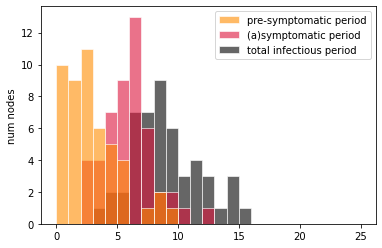

onset-to-hospitalization period:  mean = 8.31, std = 3.54, 95% CI = (2.98, 16.38)

hospitalization-to-discharge period:  mean = 13.06, std = 5.56, 95% CI = (5.34, 23.64)

onset-to-discharge period:  mean = 21.37, std = 6.43, 95% CI = (12.05, 35.24)



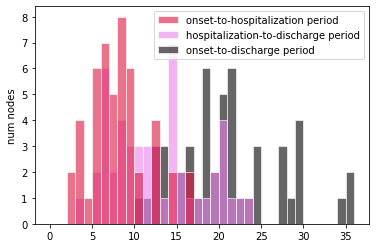

onset-to-hospitalization period:  mean = 8.31, std = 3.54, 95% CI = (2.98, 16.38)

hospitalization-to-death period:  mean = 7.17, std = 4.26, 95% CI = (2.21, 19.59)

onset-to-death period:  mean = 15.48, std = 5.78, 95% CI = (7.65, 29.32)



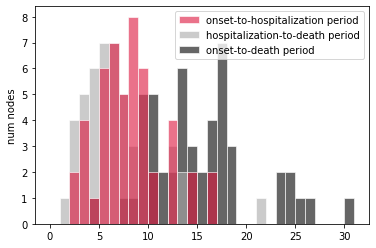

Individual R0:  mean = 1.00, std = 0.15, 95% CI = (0.70, 1.31)



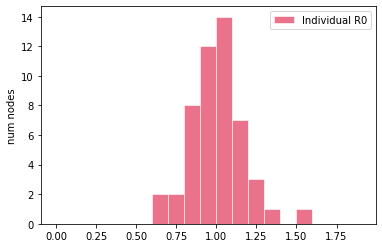

[INTERVENTIONS @ t = 0.54 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 0 positive (0.00 %) +]
	50	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.38 (5 (10.00%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 1 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTER

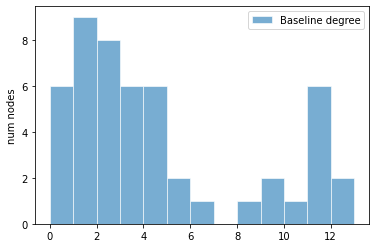

latent period:  mean = 3.54, std = 2.31, 95% CI = (1.05, 8.13)

pre-symptomatic period:  mean = 2.66, std = 1.50, 95% CI = (0.59, 6.08)

total incubation period:  mean = 6.20, std = 2.75, 95% CI = (2.80, 12.16)



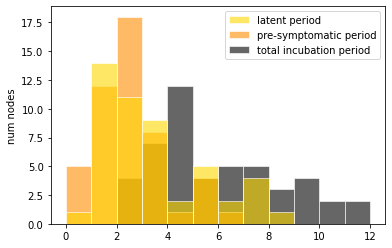

pre-symptomatic period:  mean = 3.54, std = 2.31, 95% CI = (1.05, 8.13)

(a)symptomatic period:  mean = 7.00, std = 2.77, 95% CI = (1.95, 11.88)

total infectious period:  mean = 10.54, std = 3.35, 95% CI = (4.58, 16.29)



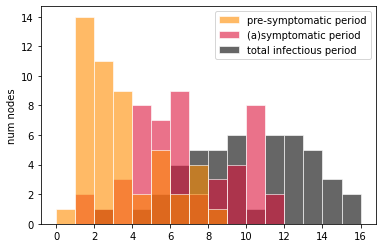

onset-to-hospitalization period:  mean = 7.41, std = 3.13, 95% CI = (3.16, 14.48)

hospitalization-to-discharge period:  mean = 13.51, std = 5.61, 95% CI = (6.97, 26.68)

onset-to-discharge period:  mean = 20.92, std = 5.64, 95% CI = (11.87, 32.49)



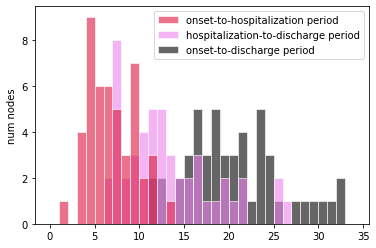

onset-to-hospitalization period:  mean = 7.41, std = 3.13, 95% CI = (3.16, 14.48)

hospitalization-to-death period:  mean = 6.92, std = 3.34, 95% CI = (1.81, 14.46)

onset-to-death period:  mean = 14.33, std = 4.26, 95% CI = (6.31, 23.26)



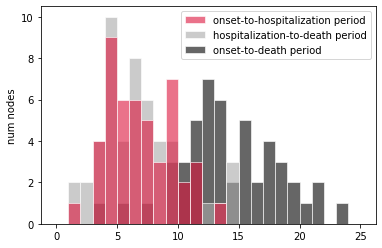

Individual R0:  mean = 1.01, std = 0.18, 95% CI = (0.62, 1.31)



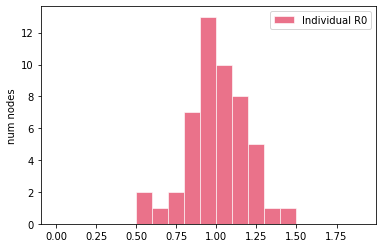

[INTERVENTIONS @ t = 0.75 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.18 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

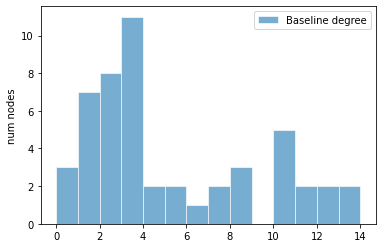

latent period:  mean = 3.27, std = 2.04, 95% CI = (0.74, 7.68)

pre-symptomatic period:  mean = 2.70, std = 1.46, 95% CI = (0.69, 5.69)

total incubation period:  mean = 5.98, std = 2.61, 95% CI = (1.99, 10.57)



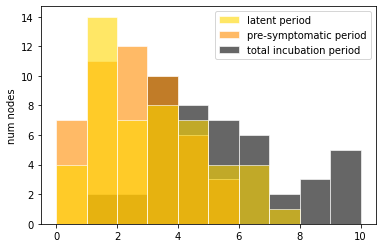

pre-symptomatic period:  mean = 3.27, std = 2.04, 95% CI = (0.74, 7.68)

(a)symptomatic period:  mean = 6.63, std = 2.76, 95% CI = (2.58, 13.58)

total infectious period:  mean = 9.90, std = 3.65, 95% CI = (4.30, 17.81)



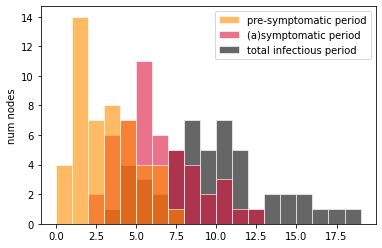

onset-to-hospitalization period:  mean = 7.21, std = 4.31, 95% CI = (2.42, 18.25)

hospitalization-to-discharge period:  mean = 13.34, std = 4.84, 95% CI = (6.46, 23.56)

onset-to-discharge period:  mean = 20.54, std = 5.64, 95% CI = (11.44, 32.39)



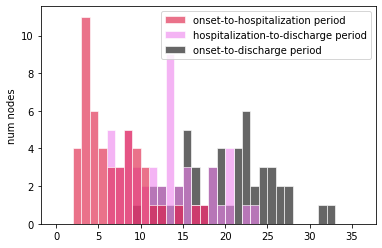

onset-to-hospitalization period:  mean = 7.21, std = 4.31, 95% CI = (2.42, 18.25)

hospitalization-to-death period:  mean = 7.06, std = 2.67, 95% CI = (2.72, 13.01)

onset-to-death period:  mean = 14.26, std = 4.76, 95% CI = (7.67, 23.72)



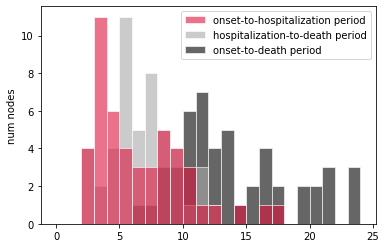

Individual R0:  mean = 0.96, std = 0.22, 95% CI = (0.60, 1.37)



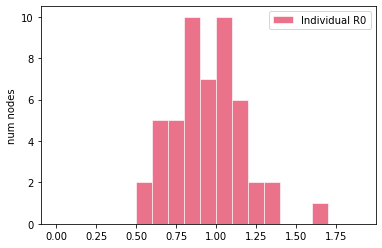

[INTERVENTIONS @ t = 0.18 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.03 (4 (8.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENTI

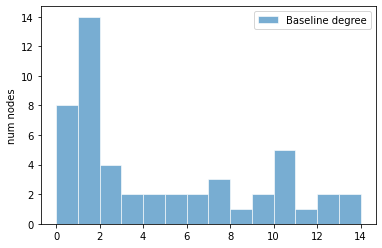

latent period:  mean = 3.16, std = 1.87, 95% CI = (0.60, 7.83)

pre-symptomatic period:  mean = 2.67, std = 1.31, 95% CI = (0.90, 5.95)

total incubation period:  mean = 5.83, std = 2.28, 95% CI = (2.68, 10.54)



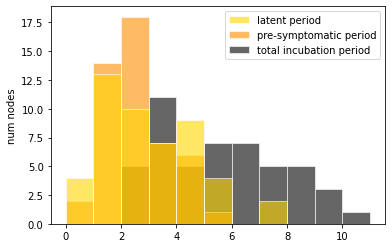

pre-symptomatic period:  mean = 3.16, std = 1.87, 95% CI = (0.60, 7.83)

(a)symptomatic period:  mean = 7.00, std = 2.72, 95% CI = (3.79, 12.89)

total infectious period:  mean = 10.15, std = 3.33, 95% CI = (5.24, 19.80)



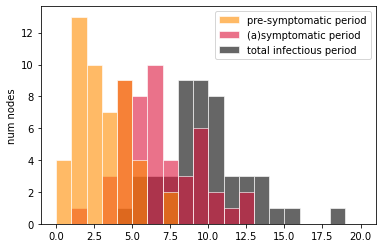

onset-to-hospitalization period:  mean = 8.13, std = 3.15, 95% CI = (3.52, 13.83)

hospitalization-to-discharge period:  mean = 14.49, std = 7.19, 95% CI = (5.34, 33.56)

onset-to-discharge period:  mean = 22.63, std = 7.58, 95% CI = (13.42, 42.13)



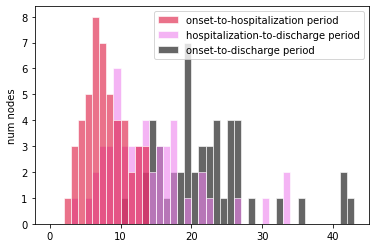

onset-to-hospitalization period:  mean = 8.13, std = 3.15, 95% CI = (3.52, 13.83)

hospitalization-to-death period:  mean = 6.01, std = 2.83, 95% CI = (2.30, 11.14)

onset-to-death period:  mean = 14.14, std = 4.59, 95% CI = (7.53, 24.28)



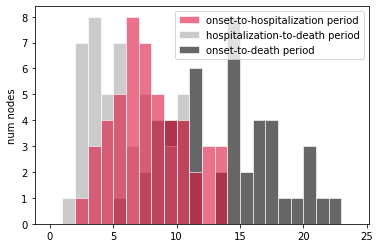

Individual R0:  mean = 1.00, std = 0.20, 95% CI = (0.70, 1.36)



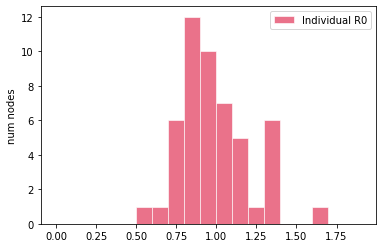

[INTERVENTIONS @ t = 0.45 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.06 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

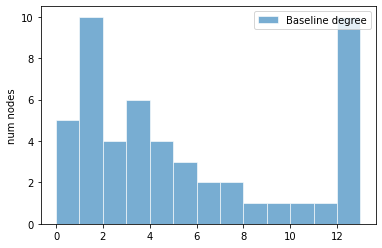

latent period:  mean = 4.13, std = 2.56, 95% CI = (0.72, 9.30)

pre-symptomatic period:  mean = 2.45, std = 1.23, 95% CI = (0.64, 4.96)

total incubation period:  mean = 6.58, std = 3.16, 95% CI = (2.43, 13.48)



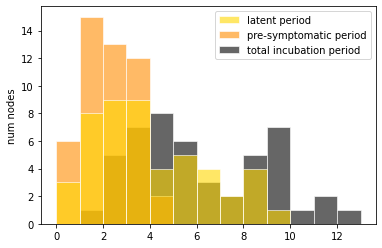

pre-symptomatic period:  mean = 4.13, std = 2.56, 95% CI = (0.72, 9.30)

(a)symptomatic period:  mean = 6.66, std = 2.92, 95% CI = (2.42, 13.36)

total infectious period:  mean = 10.79, std = 4.20, 95% CI = (4.74, 18.77)



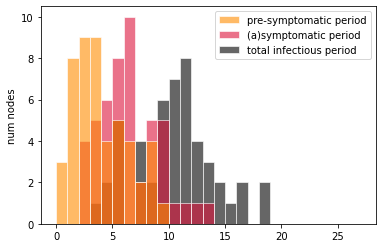

onset-to-hospitalization period:  mean = 8.59, std = 3.26, 95% CI = (3.36, 16.01)

hospitalization-to-discharge period:  mean = 12.92, std = 6.14, 95% CI = (4.06, 28.15)

onset-to-discharge period:  mean = 21.52, std = 7.71, 95% CI = (12.10, 39.10)



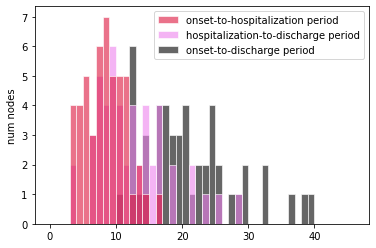

onset-to-hospitalization period:  mean = 8.59, std = 3.26, 95% CI = (3.36, 16.01)

hospitalization-to-death period:  mean = 7.38, std = 3.17, 95% CI = (2.03, 13.42)

onset-to-death period:  mean = 15.97, std = 4.74, 95% CI = (7.77, 24.54)



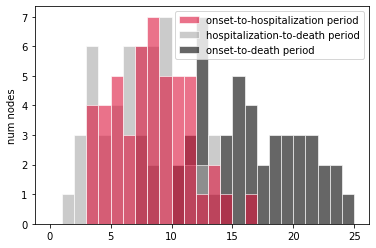

Individual R0:  mean = 0.99, std = 0.18, 95% CI = (0.69, 1.32)



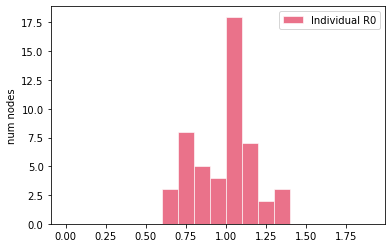

[INTERVENTIONS @ t = 1.21 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 2.04 (6 (12.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIO

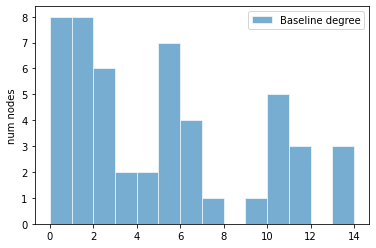

latent period:  mean = 3.22, std = 1.84, 95% CI = (0.72, 6.46)

pre-symptomatic period:  mean = 2.67, std = 2.38, 95% CI = (0.44, 9.64)

total incubation period:  mean = 5.90, std = 2.96, 95% CI = (2.12, 12.89)



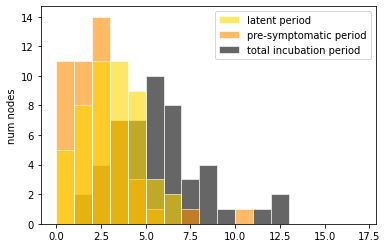

pre-symptomatic period:  mean = 3.22, std = 1.84, 95% CI = (0.72, 6.46)

(a)symptomatic period:  mean = 6.69, std = 2.59, 95% CI = (2.62, 12.21)

total infectious period:  mean = 9.91, std = 2.94, 95% CI = (4.10, 16.01)



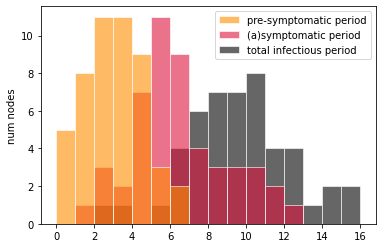

onset-to-hospitalization period:  mean = 7.44, std = 3.13, 95% CI = (3.01, 15.40)

hospitalization-to-discharge period:  mean = 12.92, std = 4.66, 95% CI = (5.63, 23.97)

onset-to-discharge period:  mean = 20.36, std = 4.95, 95% CI = (12.07, 29.40)



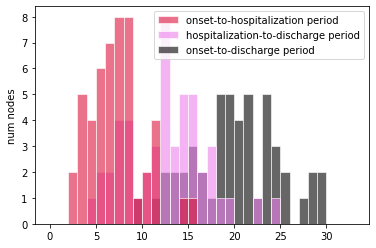

onset-to-hospitalization period:  mean = 7.44, std = 3.13, 95% CI = (3.01, 15.40)

hospitalization-to-death period:  mean = 7.21, std = 3.44, 95% CI = (1.99, 12.89)

onset-to-death period:  mean = 14.65, std = 4.28, 95% CI = (8.30, 21.71)



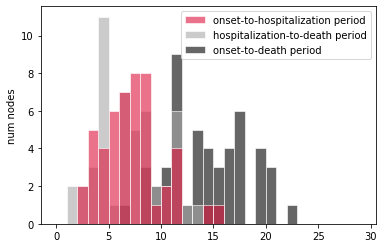

Individual R0:  mean = 1.01, std = 0.21, 95% CI = (0.69, 1.52)



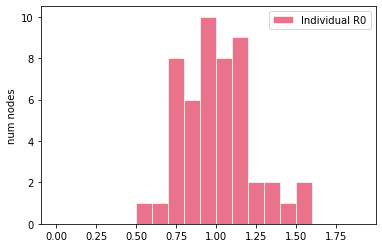

[INTERVENTIONS @ t = 0.07 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.96 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

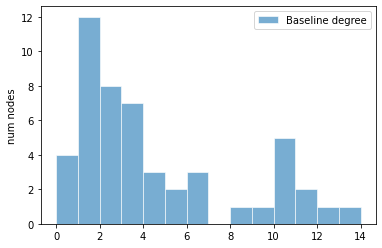

latent period:  mean = 4.15, std = 2.28, 95% CI = (0.99, 9.28)

pre-symptomatic period:  mean = 2.53, std = 1.54, 95% CI = (0.54, 5.93)

total incubation period:  mean = 6.68, std = 2.91, 95% CI = (1.97, 13.16)



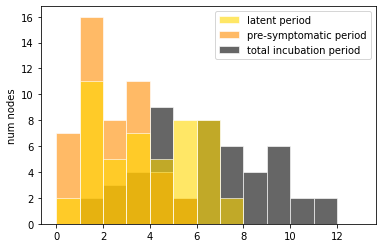

pre-symptomatic period:  mean = 4.15, std = 2.28, 95% CI = (0.99, 9.28)

(a)symptomatic period:  mean = 6.98, std = 2.81, 95% CI = (3.06, 12.89)

total infectious period:  mean = 11.13, std = 3.90, 95% CI = (4.98, 19.24)



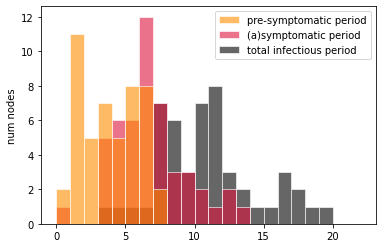

onset-to-hospitalization period:  mean = 8.51, std = 3.76, 95% CI = (3.84, 16.45)

hospitalization-to-discharge period:  mean = 12.64, std = 5.74, 95% CI = (3.68, 24.56)

onset-to-discharge period:  mean = 21.15, std = 6.69, 95% CI = (9.07, 32.33)



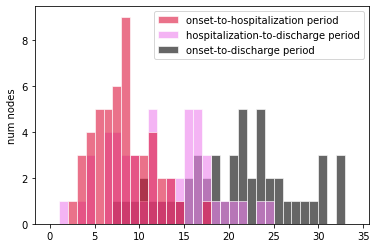

onset-to-hospitalization period:  mean = 8.51, std = 3.76, 95% CI = (3.84, 16.45)

hospitalization-to-death period:  mean = 7.11, std = 3.33, 95% CI = (2.85, 13.92)

onset-to-death period:  mean = 15.62, std = 4.97, 95% CI = (8.03, 25.17)



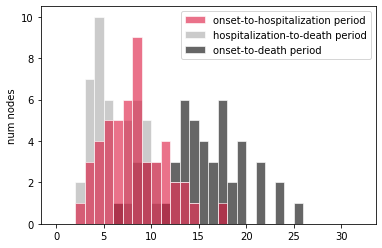

Individual R0:  mean = 0.98, std = 0.18, 95% CI = (0.70, 1.39)



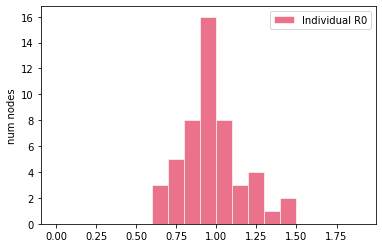

[INTERVENTIONS @ t = 0.21 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.23 (5 (10.00%) infected)]
	1	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

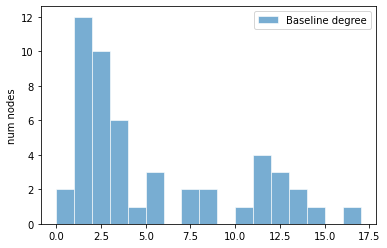

latent period:  mean = 3.44, std = 2.12, 95% CI = (1.02, 8.48)

pre-symptomatic period:  mean = 2.40, std = 1.47, 95% CI = (0.40, 5.92)

total incubation period:  mean = 5.84, std = 2.39, 95% CI = (2.14, 10.38)



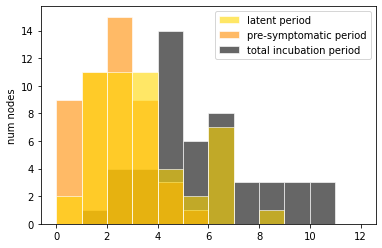

pre-symptomatic period:  mean = 3.44, std = 2.12, 95% CI = (1.02, 8.48)

(a)symptomatic period:  mean = 6.75, std = 2.91, 95% CI = (2.65, 12.50)

total infectious period:  mean = 10.19, std = 3.63, 95% CI = (4.38, 17.98)



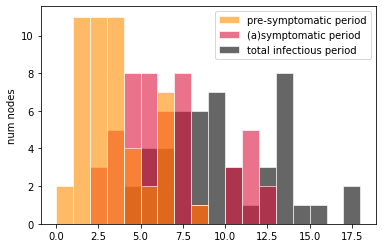

onset-to-hospitalization period:  mean = 8.67, std = 3.81, 95% CI = (3.24, 16.75)

hospitalization-to-discharge period:  mean = 13.25, std = 5.60, 95% CI = (6.07, 25.50)

onset-to-discharge period:  mean = 21.92, std = 7.56, 95% CI = (10.17, 39.40)



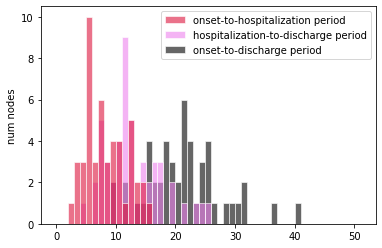

onset-to-hospitalization period:  mean = 8.67, std = 3.81, 95% CI = (3.24, 16.75)

hospitalization-to-death period:  mean = 6.87, std = 3.41, 95% CI = (1.70, 14.08)

onset-to-death period:  mean = 15.53, std = 5.13, 95% CI = (8.34, 25.65)



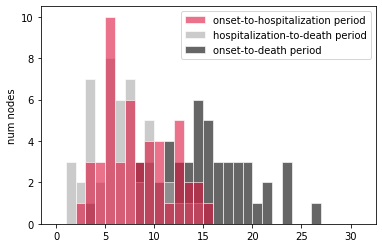

Individual R0:  mean = 0.99, std = 0.17, 95% CI = (0.66, 1.34)



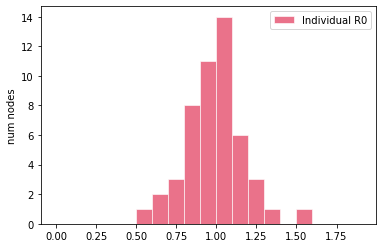

[INTERVENTIONS @ t = 0.28 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	50	tested randomly         [+ 1 positive (2.00 %) +]
	50	tested TOTAL            [+ 1 positive (2.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.02 (5 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTERVENT

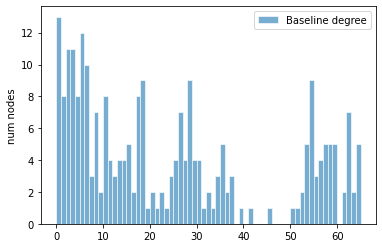

latent period:  mean = 3.46, std = 2.02, 95% CI = (0.73, 8.43)

pre-symptomatic period:  mean = 2.64, std = 1.74, 95% CI = (0.64, 6.64)

total incubation period:  mean = 6.11, std = 2.62, 95% CI = (2.37, 11.92)



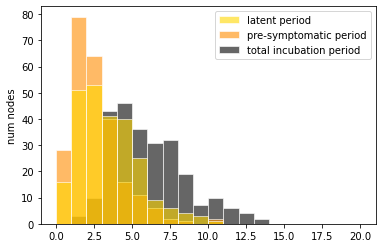

pre-symptomatic period:  mean = 3.46, std = 2.02, 95% CI = (0.73, 8.43)

(a)symptomatic period:  mean = 6.55, std = 2.52, 95% CI = (2.41, 12.26)

total infectious period:  mean = 10.02, std = 3.16, 95% CI = (4.82, 16.99)



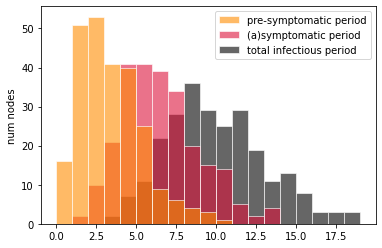

onset-to-hospitalization period:  mean = 7.76, std = 3.43, 95% CI = (2.04, 15.80)

hospitalization-to-discharge period:  mean = 14.28, std = 6.24, 95% CI = (5.68, 29.32)

onset-to-discharge period:  mean = 22.04, std = 6.91, 95% CI = (11.31, 37.30)



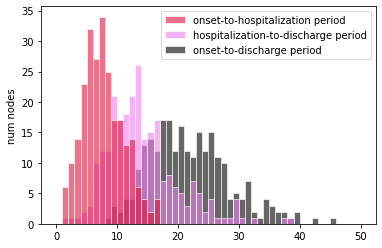

onset-to-hospitalization period:  mean = 7.76, std = 3.43, 95% CI = (2.04, 15.80)

hospitalization-to-death period:  mean = 6.82, std = 3.00, 95% CI = (2.45, 14.74)

onset-to-death period:  mean = 14.58, std = 4.59, 95% CI = (6.89, 24.64)



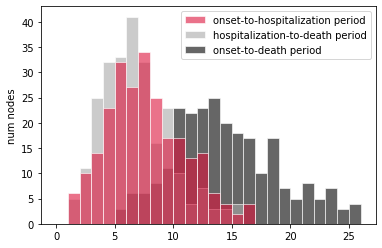

Individual R0:  mean = 1.00, std = 0.19, 95% CI = (0.66, 1.41)



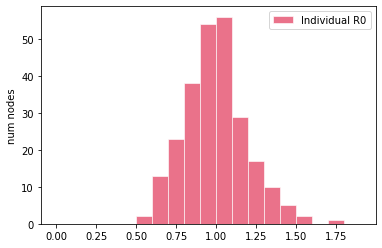

[INTERVENTIONS @ t = 0.01 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.01 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 6 positive (2.41 %) +]
	249	tested TOTAL            [+ 6 positive (2.41 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	6 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[N

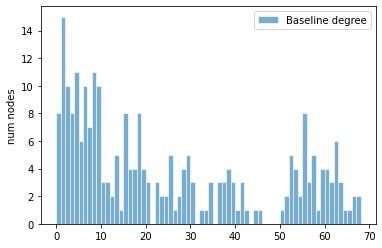

latent period:  mean = 3.65, std = 2.29, 95% CI = (0.78, 9.40)

pre-symptomatic period:  mean = 2.69, std = 1.64, 95% CI = (0.48, 6.90)

total incubation period:  mean = 6.35, std = 2.72, 95% CI = (2.36, 12.36)



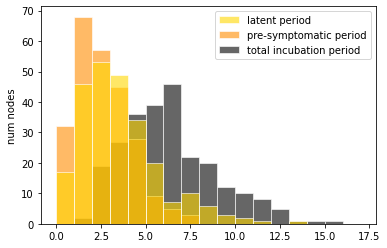

pre-symptomatic period:  mean = 3.65, std = 2.29, 95% CI = (0.78, 9.40)

(a)symptomatic period:  mean = 6.58, std = 2.41, 95% CI = (2.91, 11.89)

total infectious period:  mean = 10.24, std = 3.41, 95% CI = (4.43, 17.27)



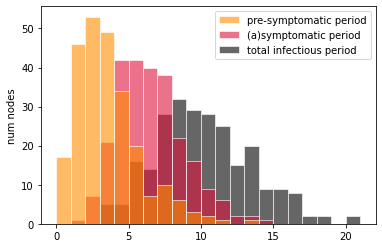

onset-to-hospitalization period:  mean = 8.09, std = 3.76, 95% CI = (2.64, 16.79)

hospitalization-to-discharge period:  mean = 14.20, std = 6.44, 95% CI = (4.10, 29.52)

onset-to-discharge period:  mean = 22.29, std = 7.40, 95% CI = (10.32, 38.13)



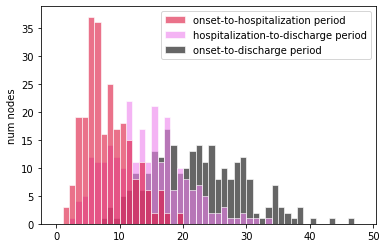

onset-to-hospitalization period:  mean = 8.09, std = 3.76, 95% CI = (2.64, 16.79)

hospitalization-to-death period:  mean = 7.15, std = 3.28, 95% CI = (2.18, 14.27)

onset-to-death period:  mean = 15.24, std = 4.92, 95% CI = (7.77, 26.11)



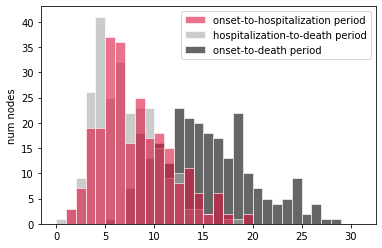

Individual R0:  mean = 1.00, std = 0.19, 95% CI = (0.68, 1.41)



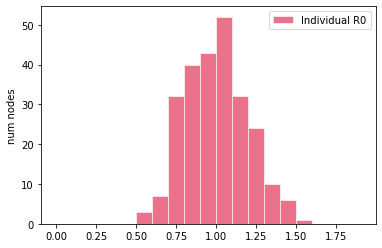

[INTERVENTIONS @ t = 0.01 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[NEW EXPOSURE @ t = 1.30 (1 exposed)]
[INTERVENTIONS @ t = 1.30 (26 (10.40%) infected)]
	3	tested due to symptoms  [+ 3 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	247	tested randomly         [+ 9 positive (3.64 %) +]
	250	tested TOTAL            [+ 12 positive (4.80 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	12 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as grou

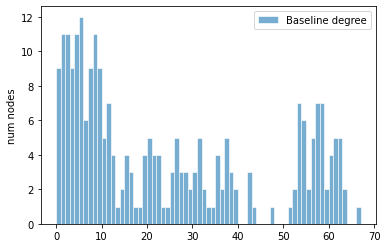

latent period:  mean = 3.52, std = 2.15, 95% CI = (0.63, 9.07)

pre-symptomatic period:  mean = 2.59, std = 1.51, 95% CI = (0.50, 6.27)

total incubation period:  mean = 6.11, std = 2.70, 95% CI = (2.40, 13.16)



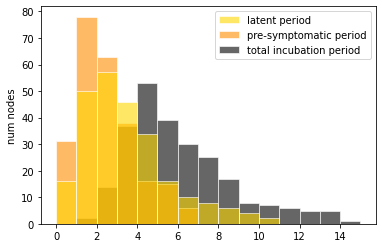

pre-symptomatic period:  mean = 3.52, std = 2.15, 95% CI = (0.63, 9.07)

(a)symptomatic period:  mean = 6.57, std = 2.73, 95% CI = (2.39, 12.76)

total infectious period:  mean = 10.09, std = 3.47, 95% CI = (4.08, 17.36)



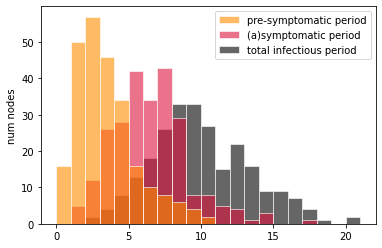

onset-to-hospitalization period:  mean = 8.04, std = 3.65, 95% CI = (3.19, 16.83)

hospitalization-to-discharge period:  mean = 13.74, std = 6.31, 95% CI = (4.51, 27.70)

onset-to-discharge period:  mean = 21.77, std = 7.49, 95% CI = (9.90, 37.89)



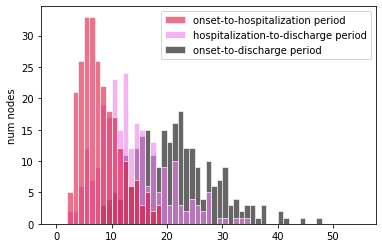

onset-to-hospitalization period:  mean = 8.04, std = 3.65, 95% CI = (3.19, 16.83)

hospitalization-to-death period:  mean = 6.69, std = 2.81, 95% CI = (2.15, 12.52)

onset-to-death period:  mean = 14.72, std = 4.69, 95% CI = (6.93, 24.97)



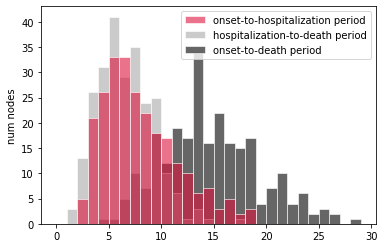

Individual R0:  mean = 1.02, std = 0.21, 95% CI = (0.70, 1.52)



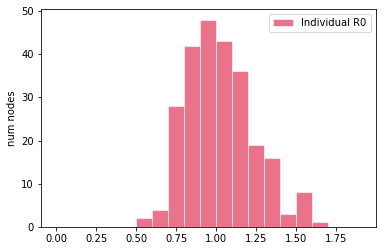

[INTERVENTIONS @ t = 0.00 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.07 (26 (10.40%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 8 positive (3.21 %) +]
	250	tested TOTAL            [+ 9 positive (3.60 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	9 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation


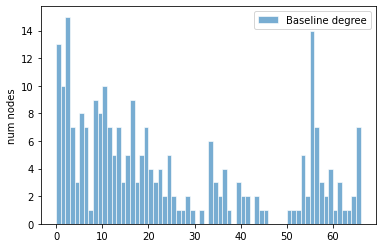

latent period:  mean = 3.53, std = 2.13, 95% CI = (0.65, 8.71)

pre-symptomatic period:  mean = 2.47, std = 1.45, 95% CI = (0.49, 5.92)

total incubation period:  mean = 6.00, std = 2.53, 95% CI = (1.90, 11.67)



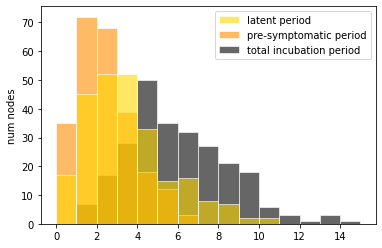

pre-symptomatic period:  mean = 3.53, std = 2.13, 95% CI = (0.65, 8.71)

(a)symptomatic period:  mean = 6.49, std = 2.59, 95% CI = (2.57, 12.72)

total infectious period:  mean = 10.02, std = 3.22, 95% CI = (4.45, 17.61)



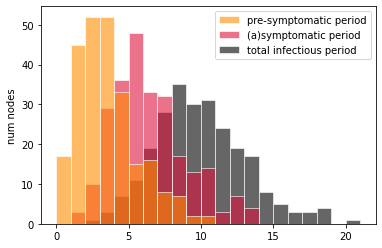

onset-to-hospitalization period:  mean = 8.01, std = 3.22, 95% CI = (3.35, 15.77)

hospitalization-to-discharge period:  mean = 13.77, std = 6.66, 95% CI = (4.35, 29.47)

onset-to-discharge period:  mean = 21.78, std = 7.51, 95% CI = (10.14, 38.52)



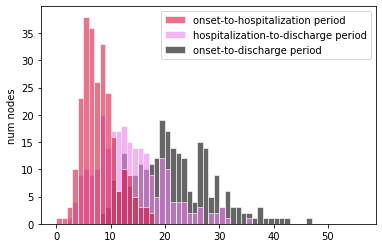

onset-to-hospitalization period:  mean = 8.01, std = 3.22, 95% CI = (3.35, 15.77)

hospitalization-to-death period:  mean = 6.91, std = 3.00, 95% CI = (2.18, 13.38)

onset-to-death period:  mean = 14.93, std = 4.15, 95% CI = (7.92, 24.80)



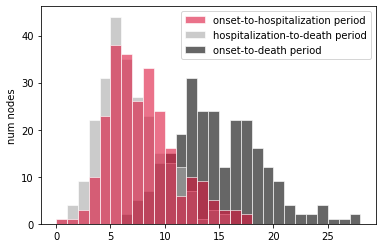

Individual R0:  mean = 1.01, std = 0.20, 95% CI = (0.66, 1.43)



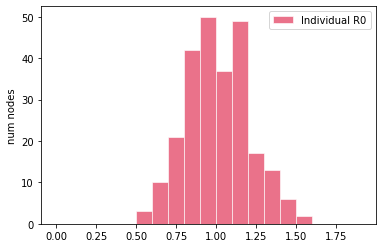

[INTERVENTIONS @ t = 0.03 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 0 positive (0.00 %) +]
	250	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.04 (25 (10.00%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 8 positive (3.21 %) +]
	250	tested TOTAL            [+ 9 positive (3.60 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	9 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation


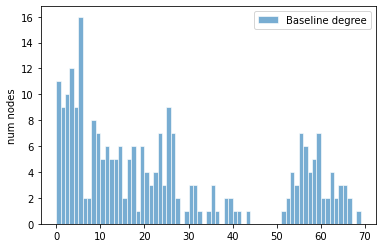

latent period:  mean = 3.44, std = 2.10, 95% CI = (0.71, 7.58)

pre-symptomatic period:  mean = 2.47, std = 1.55, 95% CI = (0.37, 6.53)

total incubation period:  mean = 5.92, std = 2.51, 95% CI = (2.03, 11.21)



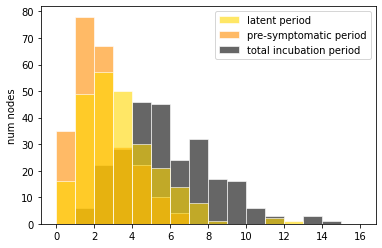

pre-symptomatic period:  mean = 3.44, std = 2.10, 95% CI = (0.71, 7.58)

(a)symptomatic period:  mean = 6.44, std = 2.61, 95% CI = (2.15, 12.38)

total infectious period:  mean = 9.88, std = 3.43, 95% CI = (4.39, 17.38)



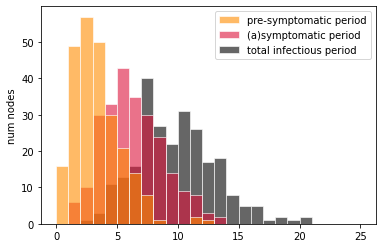

onset-to-hospitalization period:  mean = 8.05, std = 3.65, 95% CI = (2.86, 16.56)

hospitalization-to-discharge period:  mean = 14.46, std = 6.15, 95% CI = (4.88, 27.34)

onset-to-discharge period:  mean = 22.51, std = 7.30, 95% CI = (10.98, 37.71)



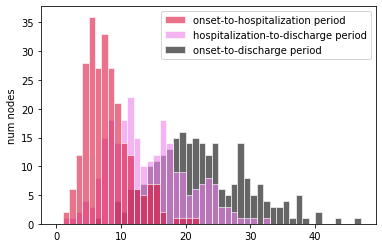

onset-to-hospitalization period:  mean = 8.05, std = 3.65, 95% CI = (2.86, 16.56)

hospitalization-to-death period:  mean = 6.98, std = 3.07, 95% CI = (2.36, 14.76)

onset-to-death period:  mean = 15.04, std = 4.90, 95% CI = (7.01, 24.92)



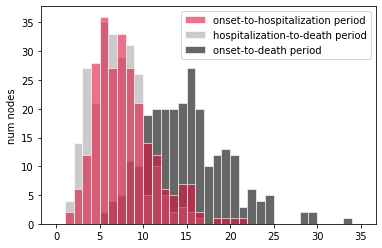

Individual R0:  mean = 0.99, std = 0.21, 95% CI = (0.62, 1.46)



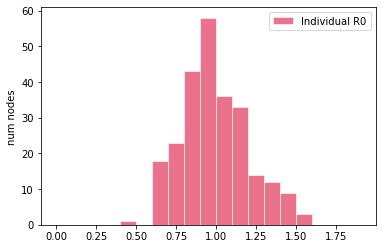

[INTERVENTIONS @ t = 0.01 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.02 (27 (10.80%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 6 positive (2.41 %) +]
	250	tested TOTAL            [+ 7 positive (2.80 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	7 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation


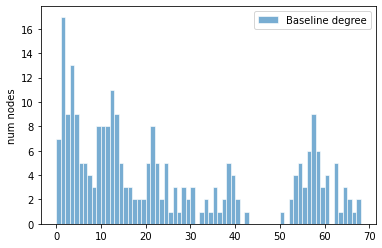

latent period:  mean = 3.41, std = 2.09, 95% CI = (0.66, 8.85)

pre-symptomatic period:  mean = 2.49, std = 1.45, 95% CI = (0.54, 5.78)

total incubation period:  mean = 5.90, std = 2.49, 95% CI = (2.20, 12.07)



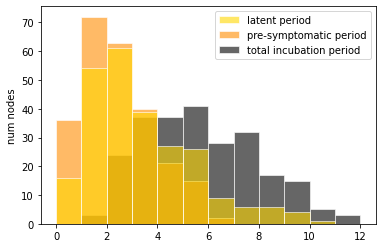

pre-symptomatic period:  mean = 3.41, std = 2.09, 95% CI = (0.66, 8.85)

(a)symptomatic period:  mean = 6.72, std = 2.76, 95% CI = (2.64, 13.75)

total infectious period:  mean = 10.13, std = 3.36, 95% CI = (5.12, 16.46)



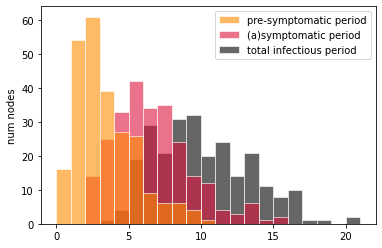

onset-to-hospitalization period:  mean = 7.84, std = 3.36, 95% CI = (2.58, 14.59)

hospitalization-to-discharge period:  mean = 13.86, std = 6.06, 95% CI = (4.69, 27.90)

onset-to-discharge period:  mean = 21.70, std = 6.88, 95% CI = (10.17, 37.61)



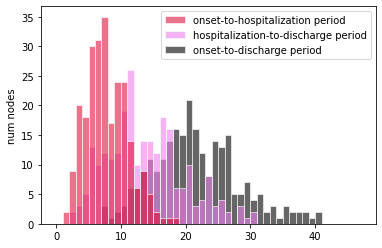

onset-to-hospitalization period:  mean = 7.84, std = 3.36, 95% CI = (2.58, 14.59)

hospitalization-to-death period:  mean = 6.78, std = 3.04, 95% CI = (1.91, 13.41)

onset-to-death period:  mean = 14.62, std = 4.72, 95% CI = (6.61, 24.62)



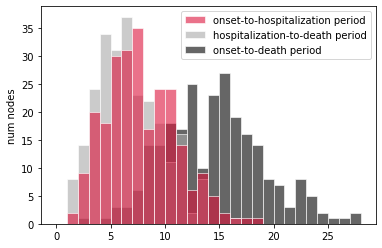

Individual R0:  mean = 1.01, std = 0.18, 95% CI = (0.69, 1.41)



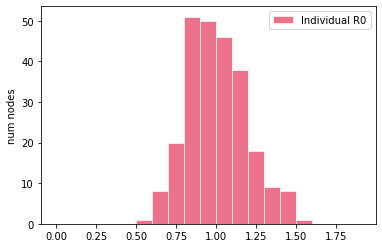

[INTERVENTIONS @ t = 0.00 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.01 (26 (10.40%) infected)]
	2	tested due to symptoms  [+ 2 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	248	tested randomly         [+ 6 positive (2.42 %) +]
	250	tested TOTAL            [+ 8 positive (3.20 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	8 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation


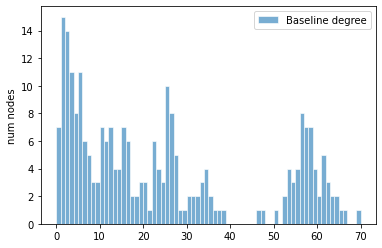

latent period:  mean = 3.33, std = 1.91, 95% CI = (0.57, 7.82)

pre-symptomatic period:  mean = 2.60, std = 1.60, 95% CI = (0.61, 6.42)

total incubation period:  mean = 5.93, std = 2.48, 95% CI = (1.93, 11.23)



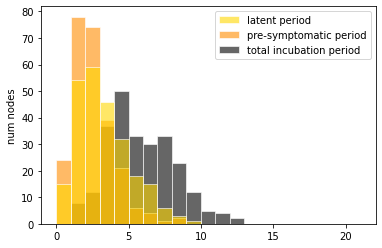

pre-symptomatic period:  mean = 3.33, std = 1.91, 95% CI = (0.57, 7.82)

(a)symptomatic period:  mean = 6.53, std = 2.82, 95% CI = (2.43, 13.63)

total infectious period:  mean = 9.86, std = 3.50, 95% CI = (3.83, 17.41)



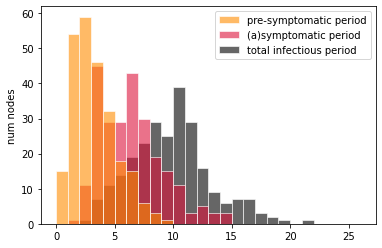

onset-to-hospitalization period:  mean = 7.96, std = 3.50, 95% CI = (3.08, 16.10)

hospitalization-to-discharge period:  mean = 14.33, std = 6.36, 95% CI = (3.99, 27.78)

onset-to-discharge period:  mean = 22.30, std = 7.16, 95% CI = (9.47, 37.73)



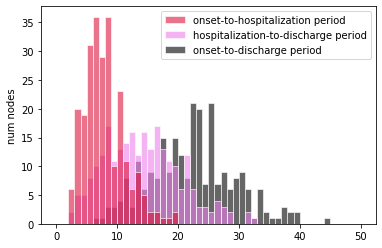

onset-to-hospitalization period:  mean = 7.96, std = 3.50, 95% CI = (3.08, 16.10)

hospitalization-to-death period:  mean = 7.19, std = 3.29, 95% CI = (2.17, 14.33)

onset-to-death period:  mean = 15.15, std = 4.71, 95% CI = (7.57, 24.26)



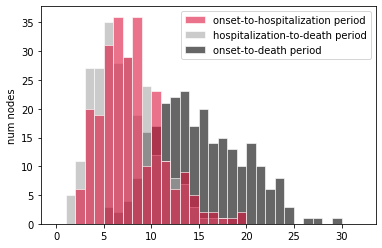

Individual R0:  mean = 0.99, std = 0.18, 95% CI = (0.68, 1.39)



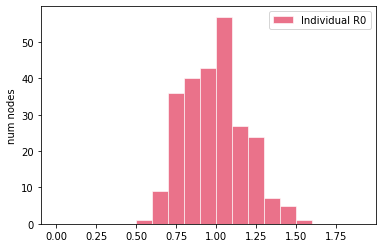

[INTERVENTIONS @ t = 0.01 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.22 (25 (10.00%) infected)]
	1	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 4 positive (1.61 %) +]
	250	tested TOTAL            [+ 4 positive (1.60 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	4 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[I

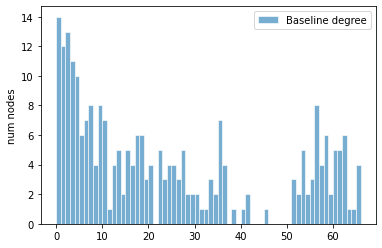

latent period:  mean = 3.64, std = 1.93, 95% CI = (0.77, 7.48)

pre-symptomatic period:  mean = 2.58, std = 1.42, 95% CI = (0.51, 5.87)

total incubation period:  mean = 6.21, std = 2.39, 95% CI = (2.35, 11.11)



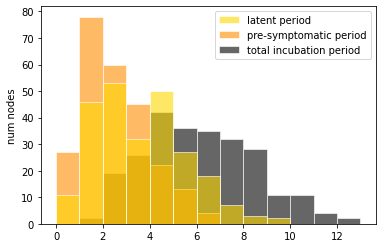

pre-symptomatic period:  mean = 3.64, std = 1.93, 95% CI = (0.77, 7.48)

(a)symptomatic period:  mean = 6.48, std = 2.60, 95% CI = (2.86, 13.31)

total infectious period:  mean = 10.12, std = 3.08, 95% CI = (5.33, 17.17)



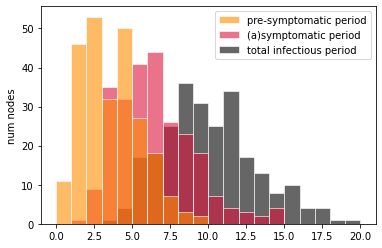

onset-to-hospitalization period:  mean = 7.88, std = 3.53, 95% CI = (2.54, 16.57)

hospitalization-to-discharge period:  mean = 13.20, std = 5.92, 95% CI = (5.01, 29.11)

onset-to-discharge period:  mean = 21.08, std = 7.04, 95% CI = (10.60, 36.97)



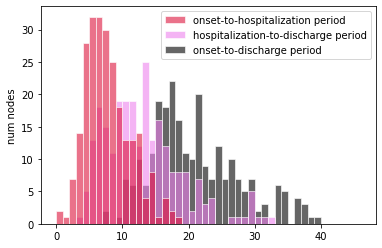

onset-to-hospitalization period:  mean = 7.88, std = 3.53, 95% CI = (2.54, 16.57)

hospitalization-to-death period:  mean = 7.25, std = 3.59, 95% CI = (2.34, 14.11)

onset-to-death period:  mean = 15.13, std = 4.81, 95% CI = (7.57, 24.52)



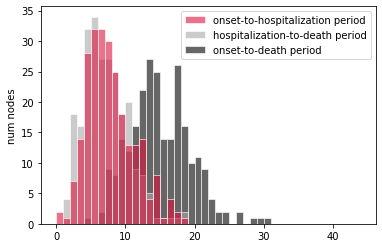

Individual R0:  mean = 1.02, std = 0.19, 95% CI = (0.69, 1.38)



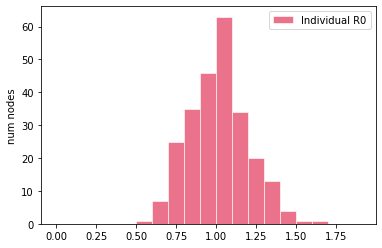

[INTERVENTIONS @ t = 0.08 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[NEW EXPOSURE @ t = 1.03 (1 exposed)]
[INTERVENTIONS @ t = 1.03 (26 (10.40%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 8 positive (3.21 %) +]
	250	tested TOTAL            [+ 9 positive (3.60 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	9 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupm

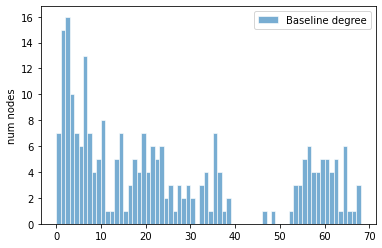

latent period:  mean = 3.37, std = 1.79, 95% CI = (0.62, 7.13)

pre-symptomatic period:  mean = 2.65, std = 1.49, 95% CI = (0.54, 6.11)

total incubation period:  mean = 6.01, std = 2.34, 95% CI = (1.90, 11.28)



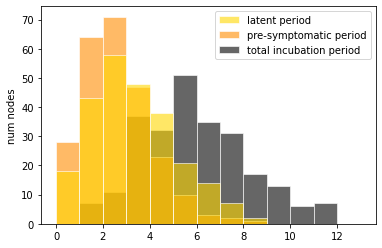

pre-symptomatic period:  mean = 3.37, std = 1.79, 95% CI = (0.62, 7.13)

(a)symptomatic period:  mean = 6.32, std = 2.73, 95% CI = (2.39, 12.64)

total infectious period:  mean = 9.68, std = 3.29, 95% CI = (4.60, 17.05)



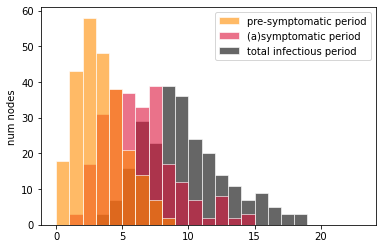

onset-to-hospitalization period:  mean = 7.86, std = 3.45, 95% CI = (2.86, 16.41)

hospitalization-to-discharge period:  mean = 14.29, std = 6.21, 95% CI = (4.83, 27.07)

onset-to-discharge period:  mean = 22.15, std = 7.06, 95% CI = (10.48, 35.72)



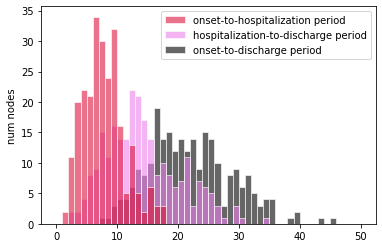

onset-to-hospitalization period:  mean = 7.86, std = 3.45, 95% CI = (2.86, 16.41)

hospitalization-to-death period:  mean = 6.83, std = 3.15, 95% CI = (2.19, 13.75)

onset-to-death period:  mean = 14.69, std = 4.70, 95% CI = (6.85, 25.14)



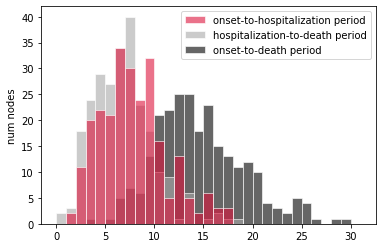

Individual R0:  mean = 1.00, std = 0.19, 95% CI = (0.66, 1.35)



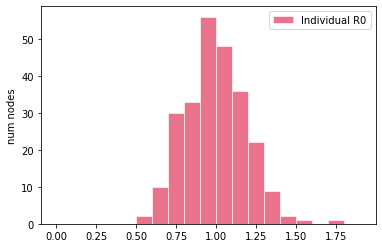

[INTERVENTIONS @ t = 0.01 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.09 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 5 positive (2.01 %) +]
	249	tested TOTAL            [+ 5 positive (2.01 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	5 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[I

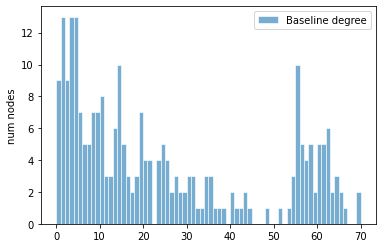

latent period:  mean = 3.33, std = 2.02, 95% CI = (0.75, 7.95)

pre-symptomatic period:  mean = 2.47, std = 1.40, 95% CI = (0.58, 5.58)

total incubation period:  mean = 5.80, std = 2.34, 95% CI = (2.41, 10.44)



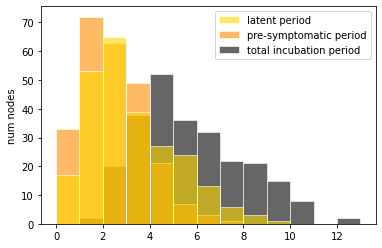

pre-symptomatic period:  mean = 3.33, std = 2.02, 95% CI = (0.75, 7.95)

(a)symptomatic period:  mean = 6.48, std = 2.66, 95% CI = (2.80, 12.97)

total infectious period:  mean = 9.81, std = 3.25, 95% CI = (4.68, 17.10)



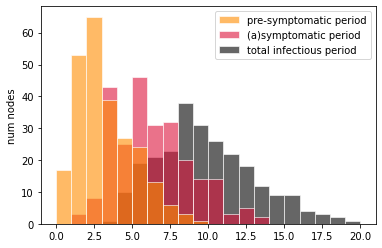

onset-to-hospitalization period:  mean = 7.75, std = 3.11, 95% CI = (3.04, 15.02)

hospitalization-to-discharge period:  mean = 14.16, std = 6.21, 95% CI = (4.28, 28.56)

onset-to-discharge period:  mean = 21.90, std = 6.92, 95% CI = (9.68, 37.20)



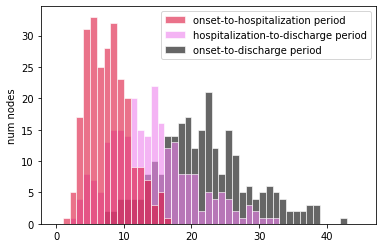

onset-to-hospitalization period:  mean = 7.75, std = 3.11, 95% CI = (3.04, 15.02)

hospitalization-to-death period:  mean = 7.35, std = 3.43, 95% CI = (2.20, 15.63)

onset-to-death period:  mean = 15.10, std = 4.65, 95% CI = (7.43, 26.99)



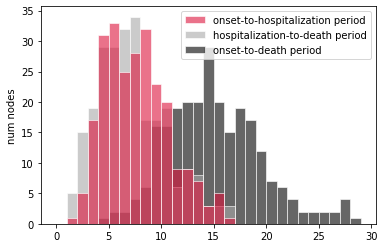

Individual R0:  mean = 0.99, std = 0.19, 95% CI = (0.65, 1.39)



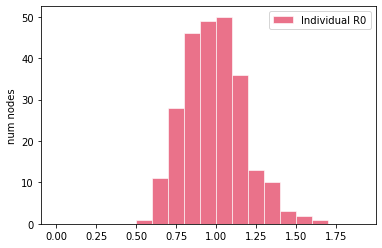

[NEW EXPOSURE @ t = 0.18 (1 exposed)]
[INTERVENTIONS @ t = 0.18 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.00 (26 (10.40%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	249	tested randomly         [+ 5 positive (2.01 %) +]
	249	tested TOTAL            [+ 5 positive (2.01 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	5 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmat

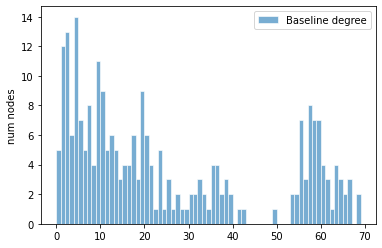

latent period:  mean = 3.82, std = 2.24, 95% CI = (0.64, 9.24)

pre-symptomatic period:  mean = 2.52, std = 1.50, 95% CI = (0.66, 6.32)

total incubation period:  mean = 6.33, std = 2.70, 95% CI = (2.22, 12.95)



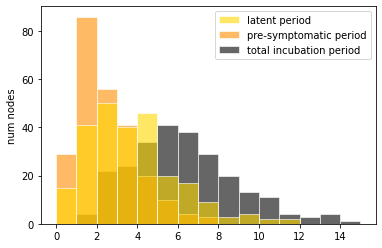

pre-symptomatic period:  mean = 3.82, std = 2.24, 95% CI = (0.64, 9.24)

(a)symptomatic period:  mean = 6.67, std = 2.62, 95% CI = (2.58, 12.33)

total infectious period:  mean = 10.49, std = 3.22, 95% CI = (4.68, 17.09)



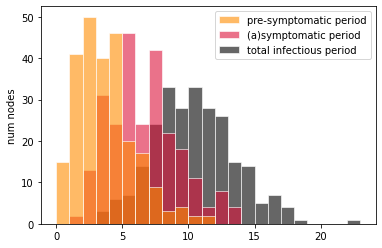

onset-to-hospitalization period:  mean = 7.88, std = 3.19, 95% CI = (2.73, 14.55)

hospitalization-to-discharge period:  mean = 13.67, std = 6.39, 95% CI = (3.75, 26.76)

onset-to-discharge period:  mean = 21.55, std = 6.88, 95% CI = (10.72, 35.62)



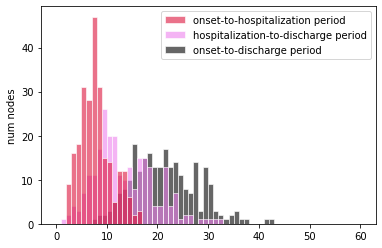

onset-to-hospitalization period:  mean = 7.88, std = 3.19, 95% CI = (2.73, 14.55)

hospitalization-to-death period:  mean = 6.93, std = 2.90, 95% CI = (2.74, 13.00)

onset-to-death period:  mean = 14.82, std = 4.30, 95% CI = (7.74, 23.89)



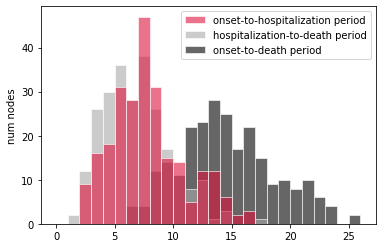

Individual R0:  mean = 1.00, std = 0.22, 95% CI = (0.63, 1.44)



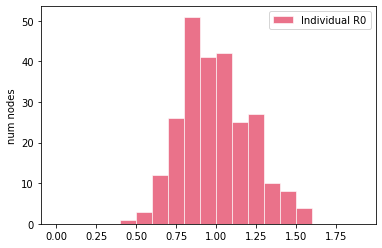

[NEW EXPOSURE @ t = 0.01 (1 exposed)]
[INTERVENTIONS @ t = 0.01 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.16 (26 (10.40%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 1 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmat

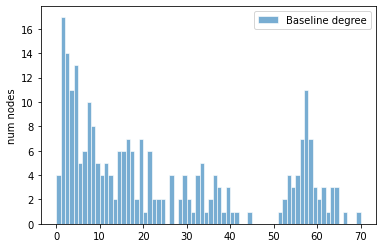

latent period:  mean = 3.29, std = 1.88, 95% CI = (0.70, 7.85)

pre-symptomatic period:  mean = 2.39, std = 1.54, 95% CI = (0.60, 7.24)

total incubation period:  mean = 5.68, std = 2.47, 95% CI = (2.07, 11.68)



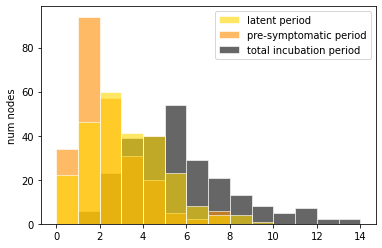

pre-symptomatic period:  mean = 3.29, std = 1.88, 95% CI = (0.70, 7.85)

(a)symptomatic period:  mean = 6.50, std = 2.73, 95% CI = (2.41, 12.81)

total infectious period:  mean = 9.78, std = 3.23, 95% CI = (4.37, 17.13)



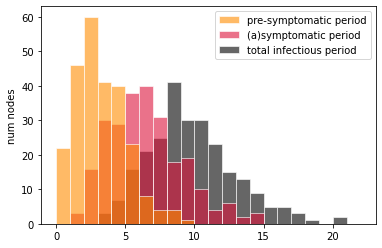

onset-to-hospitalization period:  mean = 7.91, std = 3.53, 95% CI = (2.83, 15.88)

hospitalization-to-discharge period:  mean = 13.84, std = 6.51, 95% CI = (4.96, 28.64)

onset-to-discharge period:  mean = 21.75, std = 7.38, 95% CI = (11.29, 40.63)



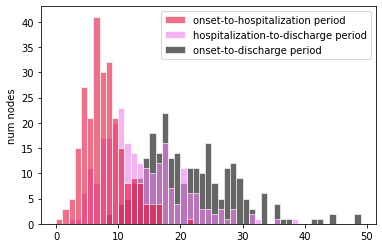

onset-to-hospitalization period:  mean = 7.91, std = 3.53, 95% CI = (2.83, 15.88)

hospitalization-to-death period:  mean = 7.10, std = 3.16, 95% CI = (2.33, 13.74)

onset-to-death period:  mean = 15.01, std = 5.03, 95% CI = (6.68, 25.23)



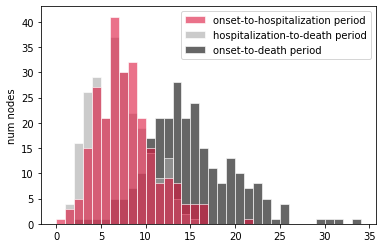

Individual R0:  mean = 1.01, std = 0.19, 95% CI = (0.63, 1.45)



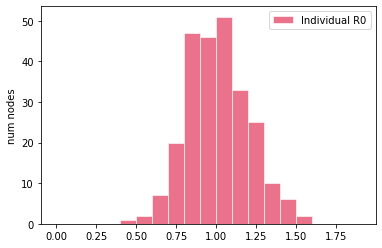

[NEW EXPOSURE @ t = 0.10 (1 exposed)]
[INTERVENTIONS @ t = 0.10 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[NEW EXPOSURE @ t = 1.15 (1 exposed)]
[INTERVENTIONS @ t = 1.15 (28 (11.20%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 1 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate 

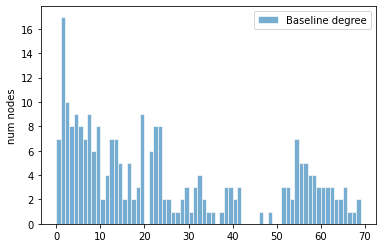

latent period:  mean = 3.47, std = 2.22, 95% CI = (0.66, 9.25)

pre-symptomatic period:  mean = 2.41, std = 1.37, 95% CI = (0.54, 5.56)

total incubation period:  mean = 5.88, std = 2.55, 95% CI = (2.39, 12.18)



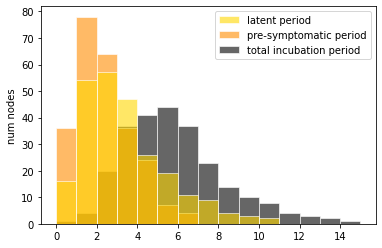

pre-symptomatic period:  mean = 3.47, std = 2.22, 95% CI = (0.66, 9.25)

(a)symptomatic period:  mean = 6.73, std = 2.74, 95% CI = (2.25, 12.42)

total infectious period:  mean = 10.20, std = 3.71, 95% CI = (4.40, 18.64)



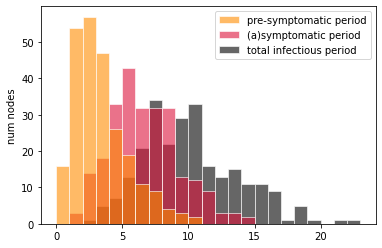

onset-to-hospitalization period:  mean = 7.95, std = 3.43, 95% CI = (2.78, 16.32)

hospitalization-to-discharge period:  mean = 13.23, std = 6.07, 95% CI = (4.51, 26.52)

onset-to-discharge period:  mean = 21.18, std = 6.93, 95% CI = (10.45, 35.10)



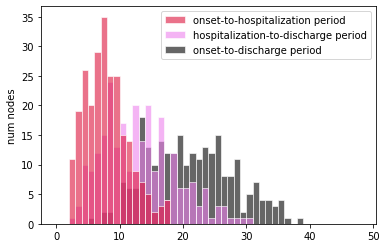

onset-to-hospitalization period:  mean = 7.95, std = 3.43, 95% CI = (2.78, 16.32)

hospitalization-to-death period:  mean = 6.56, std = 2.97, 95% CI = (2.23, 13.95)

onset-to-death period:  mean = 14.51, std = 4.67, 95% CI = (7.12, 25.35)



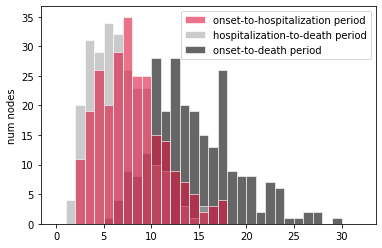

Individual R0:  mean = 0.99, std = 0.20, 95% CI = (0.66, 1.41)



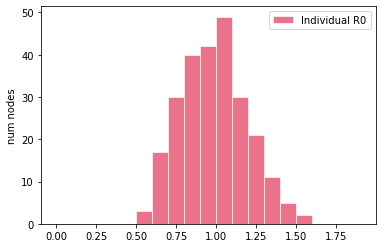

[NEW EXPOSURE @ t = 0.03 (1 exposed)]
[INTERVENTIONS @ t = 0.03 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.06 (28 (11.20%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 1 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmat

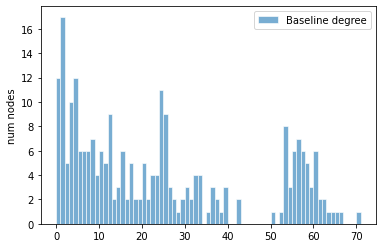

latent period:  mean = 3.47, std = 2.14, 95% CI = (0.60, 8.32)

pre-symptomatic period:  mean = 2.41, std = 1.34, 95% CI = (0.55, 5.59)

total incubation period:  mean = 5.88, std = 2.50, 95% CI = (2.17, 11.42)



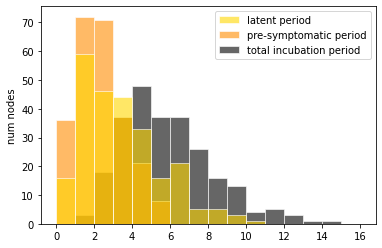

pre-symptomatic period:  mean = 3.47, std = 2.14, 95% CI = (0.60, 8.32)

(a)symptomatic period:  mean = 6.45, std = 2.61, 95% CI = (2.36, 12.19)

total infectious period:  mean = 9.92, std = 3.21, 95% CI = (4.84, 17.03)



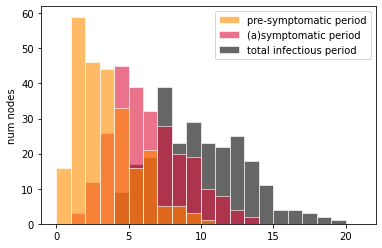

onset-to-hospitalization period:  mean = 7.80, std = 3.80, 95% CI = (2.37, 17.33)

hospitalization-to-discharge period:  mean = 13.66, std = 5.98, 95% CI = (4.70, 26.02)

onset-to-discharge period:  mean = 21.45, std = 7.10, 95% CI = (10.35, 37.98)



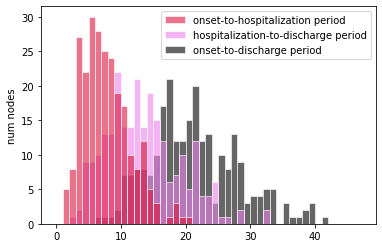

onset-to-hospitalization period:  mean = 7.80, std = 3.80, 95% CI = (2.37, 17.33)

hospitalization-to-death period:  mean = 6.75, std = 2.96, 95% CI = (2.16, 14.82)

onset-to-death period:  mean = 14.54, std = 4.92, 95% CI = (6.90, 25.16)



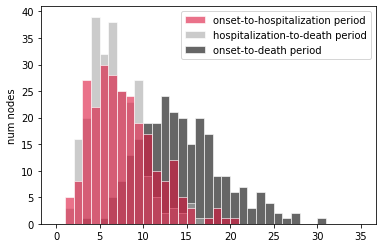

Individual R0:  mean = 1.02, std = 0.20, 95% CI = (0.66, 1.45)



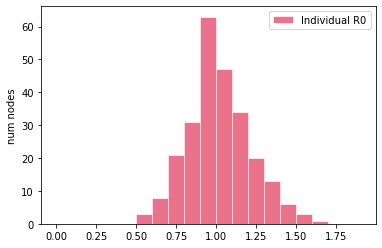

[INTERVENTIONS @ t = 0.03 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[NEW EXPOSURE @ t = 1.25 (2 exposed)]
[INTERVENTIONS @ t = 1.25 (26 (10.40%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates o

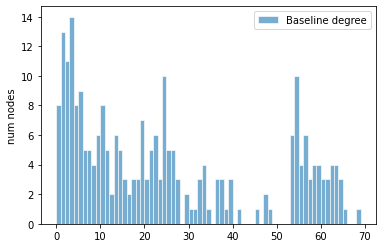

latent period:  mean = 3.51, std = 2.06, 95% CI = (0.74, 8.67)

pre-symptomatic period:  mean = 2.57, std = 1.58, 95% CI = (0.46, 6.60)

total incubation period:  mean = 6.08, std = 2.64, 95% CI = (2.09, 12.26)



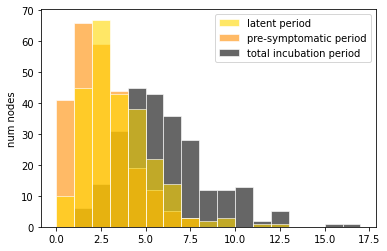

pre-symptomatic period:  mean = 3.51, std = 2.06, 95% CI = (0.74, 8.67)

(a)symptomatic period:  mean = 6.32, std = 2.52, 95% CI = (2.31, 11.81)

total infectious period:  mean = 9.83, std = 3.34, 95% CI = (4.58, 17.99)



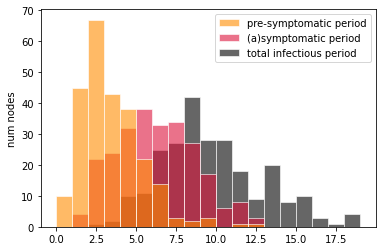

onset-to-hospitalization period:  mean = 8.11, std = 3.53, 95% CI = (2.89, 15.67)

hospitalization-to-discharge period:  mean = 13.73, std = 6.14, 95% CI = (5.13, 28.17)

onset-to-discharge period:  mean = 21.85, std = 6.78, 95% CI = (12.38, 37.70)



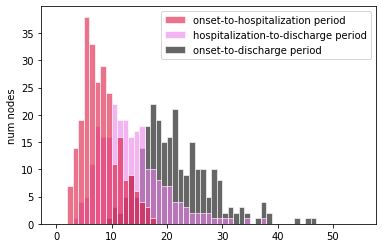

onset-to-hospitalization period:  mean = 8.11, std = 3.53, 95% CI = (2.89, 15.67)

hospitalization-to-death period:  mean = 7.10, std = 3.01, 95% CI = (2.42, 13.73)

onset-to-death period:  mean = 15.21, std = 4.54, 95% CI = (8.16, 24.99)



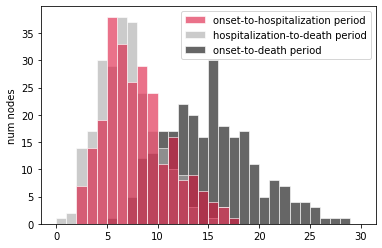

Individual R0:  mean = 1.00, std = 0.20, 95% CI = (0.62, 1.43)



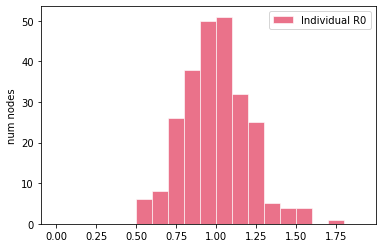

[INTERVENTIONS @ t = 0.14 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[NEW EXPOSURE @ t = 1.05 (1 exposed)]
[INTERVENTIONS @ t = 1.05 (26 (10.40%) infected)]
	3	tested due to symptoms  [+ 3 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	3	tested TOTAL            [+ 3 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	3 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmat

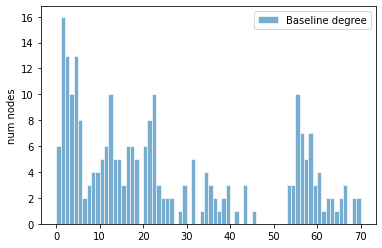

latent period:  mean = 3.47, std = 2.16, 95% CI = (0.65, 9.59)

pre-symptomatic period:  mean = 2.36, std = 1.32, 95% CI = (0.44, 5.28)

total incubation period:  mean = 5.83, std = 2.54, 95% CI = (2.06, 11.63)



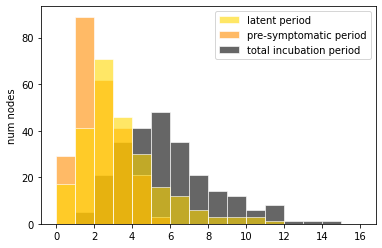

pre-symptomatic period:  mean = 3.47, std = 2.16, 95% CI = (0.65, 9.59)

(a)symptomatic period:  mean = 6.30, std = 2.50, 95% CI = (2.31, 11.91)

total infectious period:  mean = 9.76, std = 3.20, 95% CI = (4.51, 16.44)



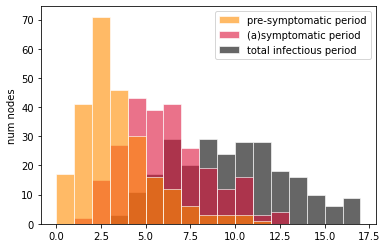

onset-to-hospitalization period:  mean = 7.88, std = 3.61, 95% CI = (2.39, 16.62)

hospitalization-to-discharge period:  mean = 13.87, std = 6.20, 95% CI = (3.72, 27.85)

onset-to-discharge period:  mean = 21.75, std = 7.09, 95% CI = (9.64, 36.84)



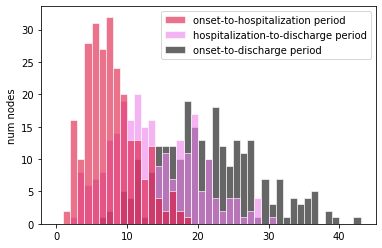

onset-to-hospitalization period:  mean = 7.88, std = 3.61, 95% CI = (2.39, 16.62)

hospitalization-to-death period:  mean = 6.72, std = 3.14, 95% CI = (2.13, 13.64)

onset-to-death period:  mean = 14.60, std = 4.77, 95% CI = (6.78, 25.33)



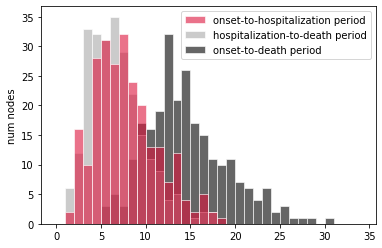

Individual R0:  mean = 1.00, std = 0.21, 95% CI = (0.63, 1.43)



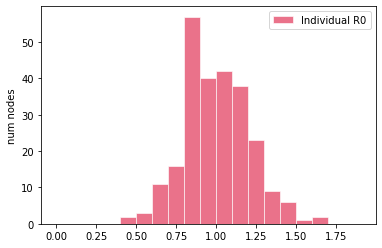

[INTERVENTIONS @ t = 0.15 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.04 (26 (10.40%) infected)]
	1	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[NEW E

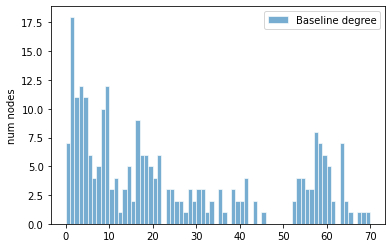

latent period:  mean = 3.45, std = 1.90, 95% CI = (0.69, 8.03)

pre-symptomatic period:  mean = 2.63, std = 1.60, 95% CI = (0.59, 6.77)

total incubation period:  mean = 6.08, std = 2.48, 95% CI = (2.20, 11.86)



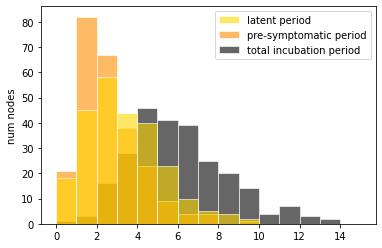

pre-symptomatic period:  mean = 3.45, std = 1.90, 95% CI = (0.69, 8.03)

(a)symptomatic period:  mean = 6.54, std = 2.66, 95% CI = (2.46, 12.71)

total infectious period:  mean = 9.99, std = 3.36, 95% CI = (4.53, 17.24)



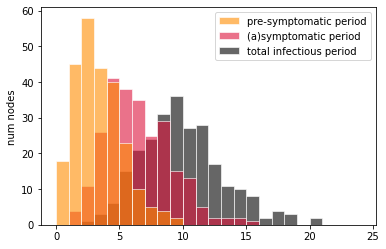

onset-to-hospitalization period:  mean = 8.10, std = 3.55, 95% CI = (2.26, 15.89)

hospitalization-to-discharge period:  mean = 14.40, std = 6.90, 95% CI = (4.70, 29.76)

onset-to-discharge period:  mean = 22.50, std = 7.81, 95% CI = (9.21, 40.34)



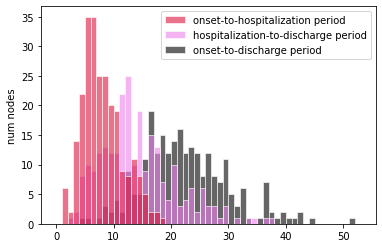

onset-to-hospitalization period:  mean = 8.10, std = 3.55, 95% CI = (2.26, 15.89)

hospitalization-to-death period:  mean = 6.94, std = 2.94, 95% CI = (2.62, 14.03)

onset-to-death period:  mean = 15.04, std = 4.59, 95% CI = (7.26, 25.23)



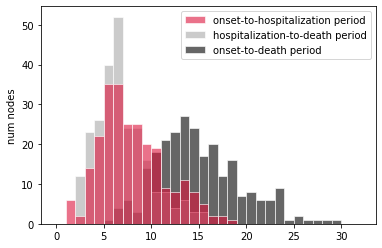

Individual R0:  mean = 0.98, std = 0.18, 95% CI = (0.69, 1.36)



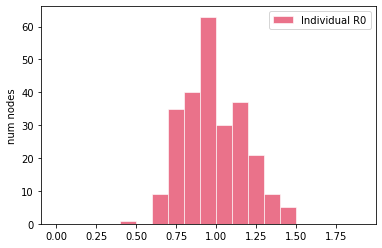

[INTERVENTIONS @ t = 0.08 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.01 (26 (10.40%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 1 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[I

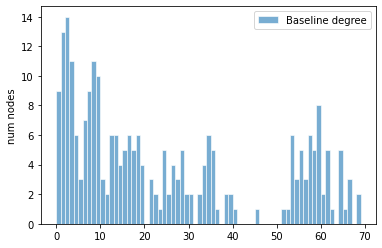

latent period:  mean = 3.52, std = 1.98, 95% CI = (0.77, 8.37)

pre-symptomatic period:  mean = 2.33, std = 1.28, 95% CI = (0.39, 5.17)

total incubation period:  mean = 5.84, std = 2.31, 95% CI = (1.94, 11.03)



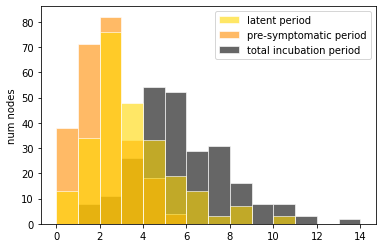

pre-symptomatic period:  mean = 3.52, std = 1.98, 95% CI = (0.77, 8.37)

(a)symptomatic period:  mean = 6.47, std = 2.52, 95% CI = (2.67, 12.18)

total infectious period:  mean = 9.99, std = 3.34, 95% CI = (4.74, 17.73)



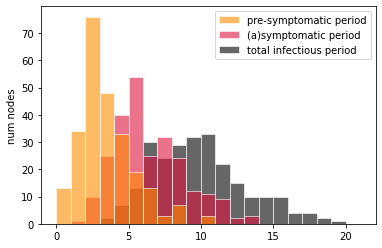

onset-to-hospitalization period:  mean = 7.72, std = 3.51, 95% CI = (2.75, 15.36)

hospitalization-to-discharge period:  mean = 14.02, std = 6.67, 95% CI = (4.79, 29.72)

onset-to-discharge period:  mean = 21.75, std = 7.36, 95% CI = (11.07, 37.01)



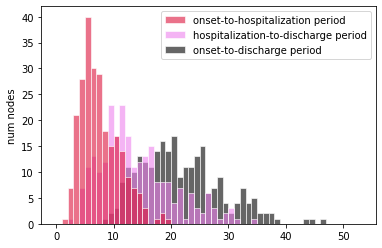

onset-to-hospitalization period:  mean = 7.72, std = 3.51, 95% CI = (2.75, 15.36)

hospitalization-to-death period:  mean = 7.02, std = 3.21, 95% CI = (2.23, 15.07)

onset-to-death period:  mean = 14.74, std = 4.60, 95% CI = (7.31, 24.32)



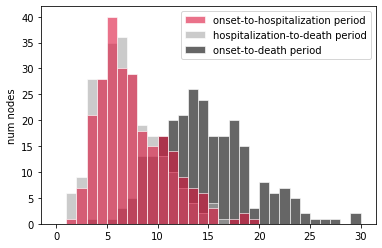

Individual R0:  mean = 1.01, std = 0.20, 95% CI = (0.65, 1.42)



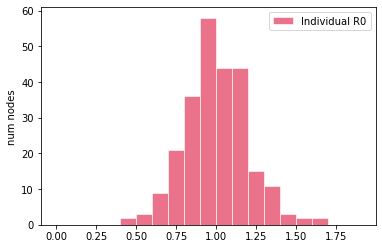

[INTERVENTIONS @ t = 0.07 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 0 positive (0.00 %) +]
	250	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.00 (26 (10.40%) infected)]
	2	tested due to symptoms  [+ 2 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	2	tested TOTAL            [+ 2 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	2 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[I

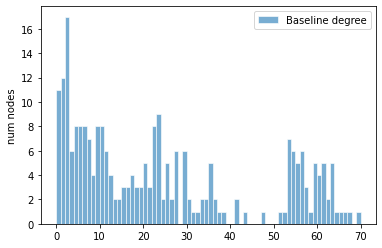

latent period:  mean = 3.37, std = 2.12, 95% CI = (0.58, 8.63)

pre-symptomatic period:  mean = 2.40, std = 1.48, 95% CI = (0.51, 6.24)

total incubation period:  mean = 5.76, std = 2.56, 95% CI = (2.05, 11.84)



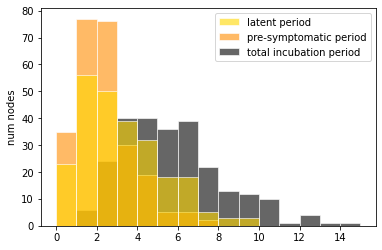

pre-symptomatic period:  mean = 3.37, std = 2.12, 95% CI = (0.58, 8.63)

(a)symptomatic period:  mean = 6.59, std = 2.45, 95% CI = (2.84, 11.82)

total infectious period:  mean = 9.96, std = 3.23, 95% CI = (4.72, 16.20)



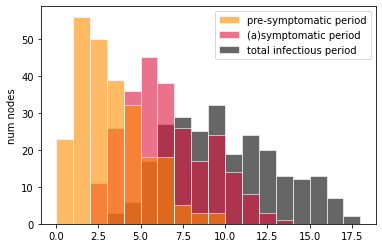

onset-to-hospitalization period:  mean = 7.99, std = 3.60, 95% CI = (2.83, 15.82)

hospitalization-to-discharge period:  mean = 13.40, std = 5.63, 95% CI = (4.64, 27.73)

onset-to-discharge period:  mean = 21.40, std = 6.62, 95% CI = (10.19, 36.18)



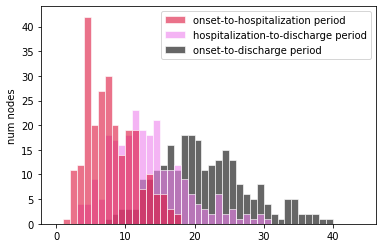

onset-to-hospitalization period:  mean = 7.99, std = 3.60, 95% CI = (2.83, 15.82)

hospitalization-to-death period:  mean = 6.85, std = 3.11, 95% CI = (2.14, 14.44)

onset-to-death period:  mean = 14.85, std = 4.57, 95% CI = (6.86, 23.87)



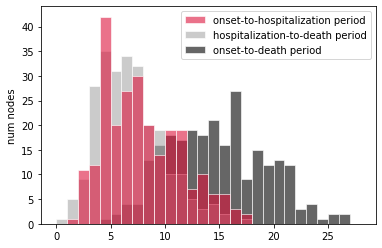

Individual R0:  mean = 1.02, std = 0.18, 95% CI = (0.71, 1.37)



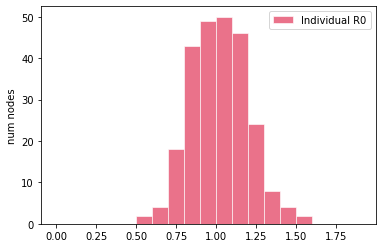

[NEW EXPOSURE @ t = 0.07 (1 exposed)]
[INTERVENTIONS @ t = 0.07 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[NEW EXPOSURE @ t = 1.13 (1 exposed)]
[INTERVENTIONS @ t = 1.13 (26 (10.40%) infected)]
	1	tested due to symptoms  [+ 1 positive (100.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	1	tested TOTAL            [+ 1 positive (100.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate 

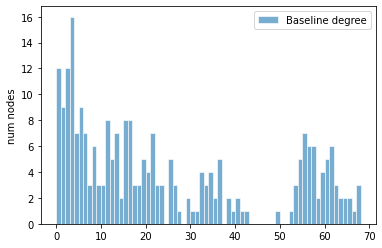

latent period:  mean = 3.59, std = 2.32, 95% CI = (0.69, 9.27)

pre-symptomatic period:  mean = 2.43, std = 1.31, 95% CI = (0.52, 5.72)

total incubation period:  mean = 6.02, std = 2.74, 95% CI = (1.95, 12.30)



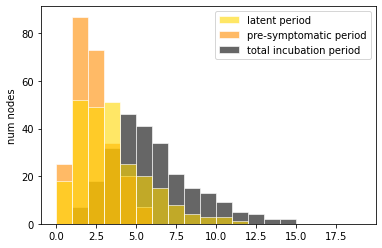

pre-symptomatic period:  mean = 3.59, std = 2.32, 95% CI = (0.69, 9.27)

(a)symptomatic period:  mean = 6.45, std = 2.60, 95% CI = (2.22, 12.30)

total infectious period:  mean = 10.04, std = 3.49, 95% CI = (4.30, 18.40)



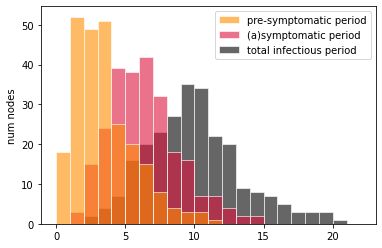

onset-to-hospitalization period:  mean = 8.12, std = 3.69, 95% CI = (1.95, 17.45)

hospitalization-to-discharge period:  mean = 13.95, std = 6.43, 95% CI = (4.83, 30.37)

onset-to-discharge period:  mean = 22.07, std = 7.38, 95% CI = (10.33, 39.44)



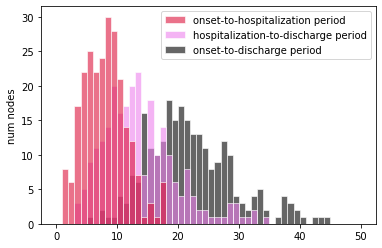

onset-to-hospitalization period:  mean = 8.12, std = 3.69, 95% CI = (1.95, 17.45)

hospitalization-to-death period:  mean = 7.07, std = 3.07, 95% CI = (2.58, 14.37)

onset-to-death period:  mean = 15.18, std = 4.63, 95% CI = (7.42, 25.90)



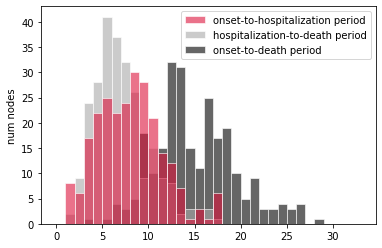

Individual R0:  mean = 0.99, std = 0.21, 95% CI = (0.58, 1.42)



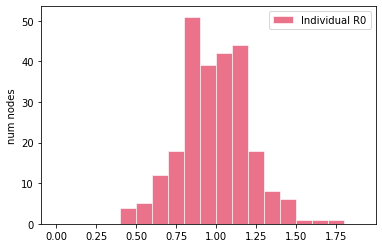

[INTERVENTIONS @ t = 0.00 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	250	tested randomly         [+ 1 positive (0.40 %) +]
	250	tested TOTAL            [+ 1 positive (0.40 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	1 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	0 entered isolation
[INTERVENTIONS @ t = 1.02 (25 (10.00%) infected)]
	0	tested due to symptoms  [+ 0 positive (0.00 %) +]
	0	tested as traces        [+ 0 positive (0.00 %) +]
	0	tested randomly         [+ 0 positive (0.00 %) +]
	0	tested TOTAL            [+ 0 positive (0.00 %) +]
	0 will isolate due to symptoms         (0 as groupmates of symptomatic)
	0 will isolate due to positive test    (0 as groupmates of positive)
	0 will isolate due to positive contact (0 as groupmates of contact)
	1 entered isolation
[INTER

In [11]:
# Loop to add the no bubble conditions

Network_size = [20, 50, 250]
PCR_Frequency = ['workday', 'weekly']
#R = [1, 1.5, 2, 2.5, 3]

for i in range(len(Network_size)):
    for k in range(len(PCR_Frequency)):
        #for l in range(len(R)):
            simulation_covid(Network_size[i], Network_size [i], PCR_Frequency[k], 1, 10)

In [12]:
# Add none for bubble size if bubble size = network size
combined_df.loc[(combined_df.Bubble_size == combined_df.Network_size),'Bubble_size'] = 'none'

In [13]:
# Check if loop succeeded
combined_df

,Network_size,Bubble_size,PCR_frequency,R,Percentage_infected,Peak_Percentage_Hospitalized,Percentage_Fatality
0,20,5,workday,1,10.0,0.0,0.0
1,20,5,workday,1,10.0,0.0,0.0
2,20,5,workday,1,10.0,5.0,0.0
3,20,5,workday,1,10.0,0.0,0.0
4,20,5,workday,1,10.0,5.0,0.0
...,...,...,...,...,...,...,...
4390,250,none,weekly,1,22.0,0.4,0.0
4391,250,none,weekly,1,26.8,1.2,0.0
4392,250,none,weekly,1,34.0,0.4,0.0
4393,250,none,weekly,1,26.8,0.8,0.0


In [14]:
# Change rest of the colnames for an ordered dataframe
combined_df = combined_df.rename(columns = {"Network_size":"Network size", "Bubble_size":"Bubble size",
                                           "PCR_frequency":"PCR frequency", "Percentage_infected":"Percentage infected",
                                            "Peak_Percentage_Hospitalized":"Peak percentage hospitalized",
                                            "Percentage_Fatality": "Percentage fatality"})


In [15]:
# Calculate the mean and SD per condition for percentage infected
combined_df['Percentage infected'] = combined_df['Percentage infected'].astype(np.int64)

# Create a new dataframe for the means and SD's
final_df = combined_df.groupby(['Network size', 'Bubble size', 'PCR frequency', 'R']).agg({'Percentage infected': 
                                                                                              ['mean', 'std']})

In [16]:
# Make final data frame
final_df.columns = ['mean', 'sd']
final_df = final_df.reset_index()
final_df

,Network size,Bubble size,PCR frequency,R,mean,sd
0,20,5,weekly,1,23.000000,11.250000
1,20,5,workday,1,12.666667,4.432026
2,20,none,weekly,1,15.461538,5.808351
3,20,none,workday,1,17.846154,10.828675
4,50,5,weekly,1,16.133333,3.545621
5,50,5,workday,1,13.466667,2.783882
6,50,25,weekly,1,18.800000,6.287743
7,50,25,workday,1,16.933333,6.899793
8,50,none,weekly,1,24.153846,10.606937
9,50,none,workday,1,14.246154,4.381607


In [17]:
# Save final data frame as Final data as excel
final_df.to_csv(r'C:\Users\Quint\Documents\Documents\Master Behavioral Data Science\MasterThese\Data\Full_Dataset_thesis_test.csv')

# Save as combined data as combined data as excel
combined_df.to_csv(r'C:\Users\Quint\Documents\Documents\Master Behavioral Data Science\MasterThese\Data\Combined_Dataset_thesis_test.csv')